# Predictive model for Airbnb pricings: 
### a project for Pathrise by Sam Bellenchia

#### `~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~`

# Initial Exploration and Visual Analysis ---------------

#### Much of my exploratory work is kept, but this notebook is also condensed and revised for your viewing pleasure. Sections of text are meant to describe my thought process as I delved into this dataset. 

In [530]:
import random as rd
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neighbors import NearestNeighbors
from sklearn.model_selection import train_test_split
from sklearn import preprocessing

### First order of business; load the data and poke through the columns. 

In [721]:
df = pd.read_csv('listings.csv', low_memory = False)
pd.options.display.max_columns = 106
pd.options.display.max_colwidth = 80

# The extra text makes it more readable in my experience,
# I decided to see how many unique entries there are in each column
# and how many entries are null

for col in df.columns:
    print("`````````````")
    print('.       ',str(col))
    print('# of null entries: ',df[col].isna().sum())
    print('# of unique values: ',df[col].nunique())
    print('entry in first row',df.loc[0][col])

`````````````
.        id
# of null entries:  0
# of unique values:  20677
entry in first row 2818
`````````````
.        listing_url
# of null entries:  0
# of unique values:  20677
entry in first row https://www.airbnb.com/rooms/2818
`````````````
.        scrape_id
# of null entries:  0
# of unique values:  1
entry in first row 20190808195507
`````````````
.        last_scraped
# of null entries:  0
# of unique values:  3
entry in first row 2019-08-09
`````````````
.        name
# of null entries:  35
# of unique values:  20167
entry in first row Quiet Garden View Room & Super Fast WiFi
`````````````
.        summary
# of null entries:  629
# of unique values:  19472
entry in first row Quiet Garden View Room & Super Fast WiFi
`````````````
.        space
# of null entries:  5422
# of unique values:  14843
entry in first row I'm renting a bedroom (room overlooking the garden) in my apartment in Amsterdam,  The room is located to the east of the city centre in a quiet, typical Amsterd

# of unique values:  6189
entry in first row 52.36575
`````````````
.        longitude
# of null entries:  0
# of unique values:  10075
entry in first row 4.94142
`````````````
.        is_location_exact
# of null entries:  0
# of unique values:  2
entry in first row f
`````````````
.        property_type
# of null entries:  0
# of unique values:  35
entry in first row Apartment
`````````````
.        room_type
# of null entries:  0
# of unique values:  3
entry in first row Private room
`````````````
.        accommodates
# of null entries:  0
# of unique values:  17
entry in first row 2
`````````````
.        bathrooms
# of null entries:  6
# of unique values:  14
entry in first row 1.5
`````````````
.        bedrooms
# of null entries:  8
# of unique values:  13
entry in first row 1.0
`````````````
.        beds
# of null entries:  8
# of unique values:  24
entry in first row 2.0
`````````````
.        bed_type
# of null entries:  0
# of unique values:  5
entry in first row Real Bed


In [719]:
df.property_type.unique()

array(['Apartment', 'Townhouse', 'Houseboat', 'Bed and breakfast',
       'Guest suite', 'Loft', 'Serviced apartment', 'Boutique hotel',
       'Guesthouse', 'Boat', 'Condominium', 'House', 'Villa', 'Camper/RV',
       'Other', 'Chalet', 'Nature lodge', 'Hut', 'Tiny house', 'Island',
       'Hotel', 'Cabin', 'Lighthouse', 'Barn', 'Bungalow', 'Hostel',
       'Cottage', 'Dome house', 'Earth house', 'Castle',
       'Casa particular (Cuba)', 'Aparthotel', 'Campsite', 'Tent', 'Yurt'],
      dtype=object)

In [730]:
df.amenities[0]

'{Internet,Wifi,"Paid parking off premises","Buzzer/wireless intercom",Heating,Washer,"Smoke detector","Carbon monoxide detector","First aid kit","Safety card","Fire extinguisher",Essentials,Shampoo,"Lock on bedroom door","24-hour check-in",Hangers,"Hair dryer",Iron,"Laptop friendly workspace","translation missing: en.hosting_amenity_49","translation missing: en.hosting_amenity_50","Private entrance","Hot water","Bed linens","Extra pillows and blankets","Single level home","Garden or backyard","No stairs or steps to enter","Flat path to guest entrance","Well-lit path to entrance","No stairs or steps to enter","Accessible-height bed","No stairs or steps to enter","Host greets you","Handheld shower head","Paid parking on premises"}'

##  I find some columns can be immediately ignored, while others might group together and something useful. There was obvious cleaning that could be done, all of which is consolidated here;

In [731]:
df = pd.read_csv('listings.csv', low_memory = False)
df = df.fillna(0.0)

# GROUP COLUMNS BY CLEANING METHOD NEEDED
money_cols = ['price','weekly_price','monthly_price','security_deposit','cleaning_fee']
review_cols = ['review_scores_rating','review_scores_accuracy','review_scores_cleanliness','review_scores_checkin','review_scores_communication','review_scores_location','review_scores_value']
bool_cols = ['instant_bookable','has_availability','requires_license','host_is_superhost','host_has_profile_pic','host_identity_verified','is_business_travel_ready','require_guest_profile_picture','require_guest_phone_verification']

# COVERT REVIEW COLUMNS TO FLOAT
for col in review_cols:
    df[col] = df[col].astype(float)

# MAKE PRICE COLUMNS FLOAT VALUES
for col in money_cols:
    df[col] = df[col].str.replace('$','')
    df[col] = df[col].str.replace(',','')
    df[col] = df[col].astype(float)

# CONVERT BOOLEAN 't'/'f' to 1/0
for col in bool_cols:
    df[col] = df[col].apply(lambda x: 1 if x=='t' else 0)
    df[col] = df[col].astype(int)

# MAKE LIST COLUMNS USABLE
df['amenities'] = df['amenities'].str.replace('{','')
df['amenities'] = df['amenities'].str.replace('}','')
df['amenities'] = df['amenities'].str.replace('"','')
df['amenities'] = df['amenities'].str.replace(' ','_')
df['amenities'] = df['amenities'].apply(lambda x: list(x.split(','))) # now is actually a list, not just long str

df['num_verifications']  = df['host_verifications'].apply(lambda x: x.count(',')+1)
df['num_verifications']  = df['num_verifications'].astype(int) # gives us the total number of verifications

####  I changed all columns with `'t'` / `'f'` to integers  `1` / `0`, 
#### converted the money columns to usable float values by removing text,
#### thinking that highly public hosts might be more likely to charge premiums; I converted the list of accound verifications to the number of entries (by counting `','`),
#### and turned the amenities column into a list of strings (listings with a large intersection of these lists should be priced similarly was my hunch);

In [ ]:
df = df[['id','latitude','longitude','reviews_per_month','beds','bedrooms','bathrooms','accommodates','amenities','requires_license','is_business_travel_ready','instant_bookable','has_availability','host_is_superhost','host_has_profile_pic','num_verifications','review_scores_rating','review_scores_accuracy','review_scores_checkin','review_scores_communication','review_scores_location','review_scores_value','require_guest_profile_picture','require_guest_phone_verification','calculated_host_listings_count','calculated_host_listings_count_entire_homes','calculated_host_listings_count_private_rooms','calculated_host_listings_count_shared_rooms','property_type','price','cleaning_fee']]
df = df.rename(columns={'id':'id',\
#                        FLOAT FEATURES
                        'latitude':'lat','longitude':'lon','reviews_per_month':'revs',\
#                        INT FEATURES
                        'beds':'beds',\
                        'bedrooms':'rooms',\
                        'bathrooms':'baths',\
                        'accommodates':'acc',\
                        'amenities':'amm',\
                        'num_verifications':'numver',\
                        'review_scores_rating':'rsr',\
                        'review_scores_accuracy':'rsa',\
                        'review_scores_checkin':'rsch',\
                        'review_scores_cleanliness':'rscl',\
                        'review_scores_communication':'rsco',\
                        'review_scores_location':'rsl',\
                        'review_scores_value':'rsv',\
                        'calculated_host_listings_count':'chlc',\
                        'calculated_host_listings_count_entire_homes':'chlceh',\
                        'calculated_host_listings_count_private_rooms':'chlcpr',\
                        'calculated_host_listings_count_shared_rooms':'chlcsr',\
#                        BOOL FEATURES                       
                        'require_guest_profile_picture':'guestpic',\
                        'require_guest_phone_verification':'guestphone',\
                        'instant_bookable':'instant',\
                        'has_availability':'avail',\
                        'host_is_superhost':'super',\
                        'host_has_profile_pic':'hostpic',\
                        'host_identifty_verified':'hostver',\
                        'requires_license':'lic',\
                        'is_business_travel_ready':'btr',\
#                        CATEGORY FEATURES ( plays an important role in later analysis )
                        'property_type':'type',\
#                        DEPENDANT VARIABLE(S)
                        'price':'price',\
                        'cleaning_fee':'fee'})
df = df.dropna()
# AGGREGATING OUR DATA WITH FANCY NEW COLUMNS
df['total'] = df.apply(lambda x: x.price+x.fee, axis=1)

## Importantly, I noticed;
### listings try to appear competitive by hiding their true cost in their cleaning fee (this is my real life experience and wanted to account for it)
#### I added the `price` and `cleaning_fee`  together to get a total price, and that is what I train my model to predict:

## Visual Analysis:
#### I first used a scatter plot to see the spacial distrobustion of listings, grouped by property type:

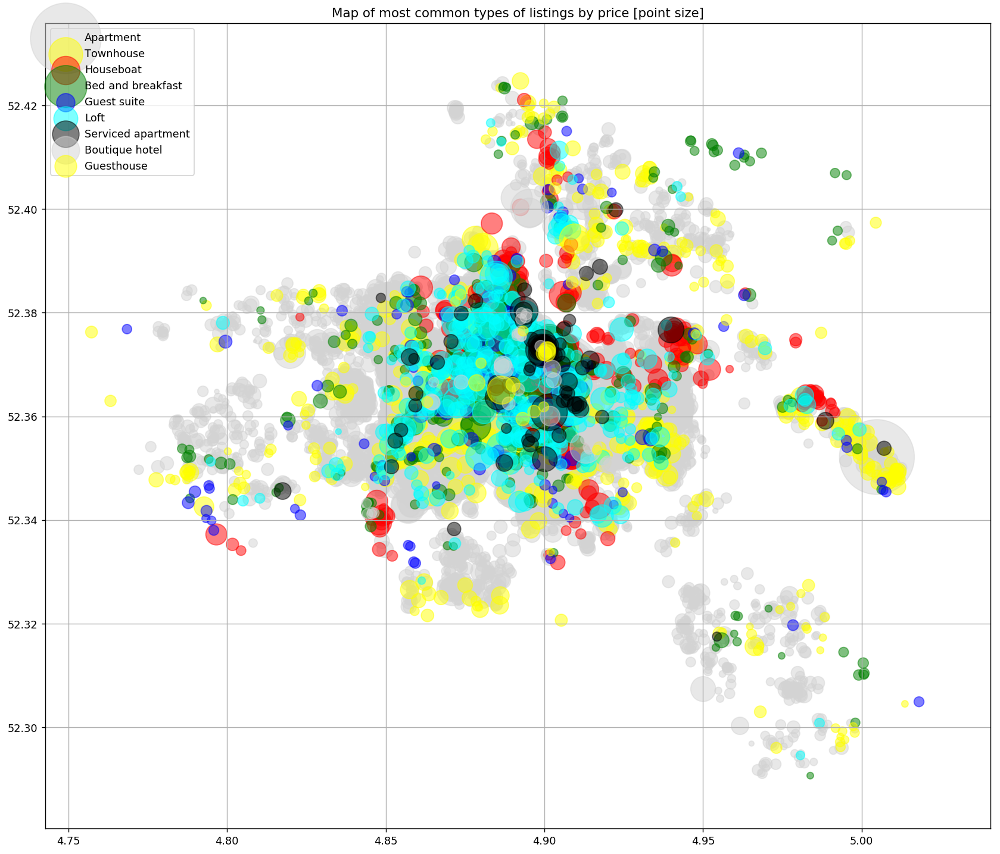

In [748]:
clist = ['cyan','blue','green','red','yellow','lightgray','black']
un = df.type.unique()

fig, ax = plt.subplots(figsize = (16,14), dpi = 128)

for i in range(9):
    typ = un[i]
    d1 = df[['type','lat','lon','price']]
    d1 = d1[d1['type']==typ]
    x=d1['lon']
    y=d1['lat']
    s = d1['price']
    ax.set_title('Map of most common types of listings by price [point size]')
    ax.scatter(x,y,s=s,color=clist[(5-i)],alpha=0.5,label=str(un[i]))#+str(df[df.type==un[i]].count())

plt.legend()
plt.grid(True)
plt.show()

# note that point size correlates to price, and the axes are latitude and longitude

#### Deciding that pointsize isn't the best indicator visually, I set a third axis equal to the price. 
#### I used Sklearn's `MinMaxScaler()` object to normalize the axes.
#### This truly emphasized the need to not overfit our data later on-- the outliers are pretty far removed from the other points;
#### (both the z-axis and point-size correlate to price)

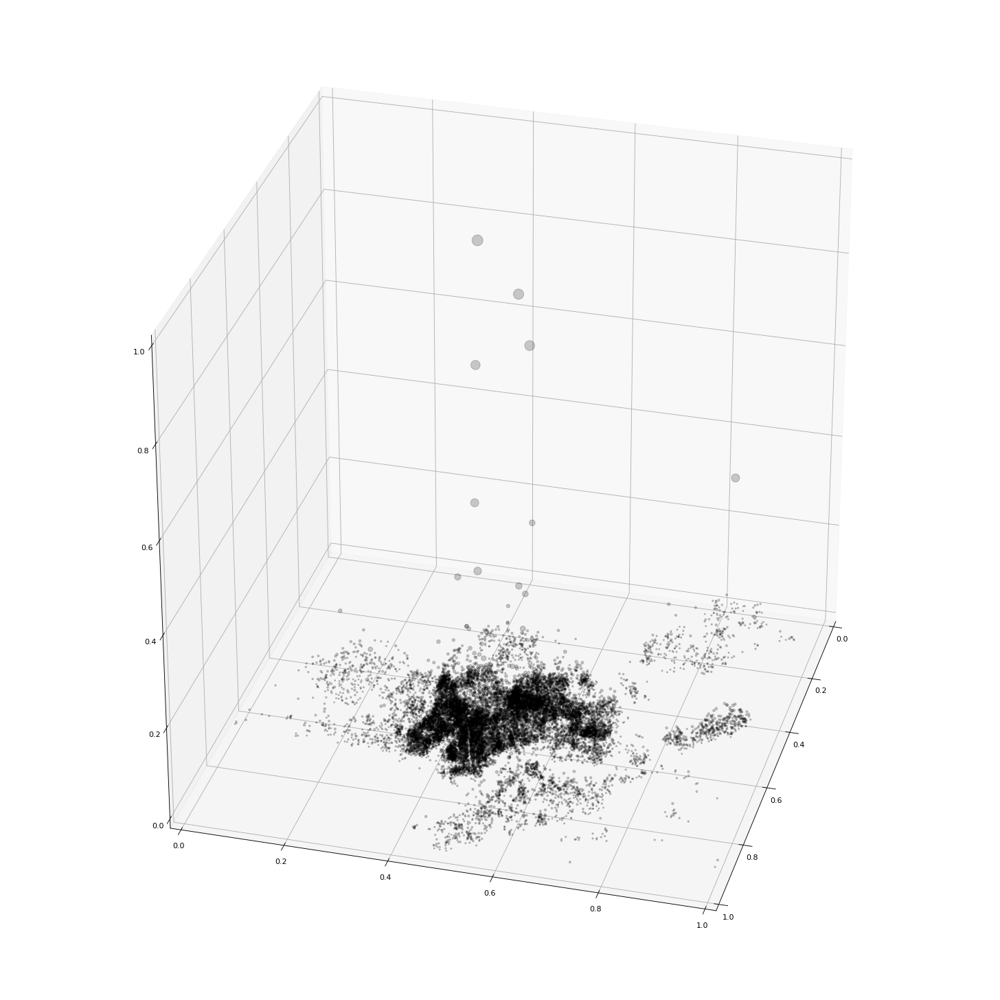

In [749]:
d1 = df[['price','lat','lon']]
d1 = d1.values

scaler = preprocessing.MinMaxScaler()
d1 = scaler.fit_transform(d1)
d1 = pd.DataFrame(d1)

fig = plt.figure(1,figsize = (18,18), dpi = 80)
ax = Axes3D(fig,elev=30,azim=15)#, azim=azim)#, elev=elev,azim=azim)
ax.set(xlim=(0.0,1.0),ylim=(0.0,1.0),zlim=(0.0,1.0))

x=d1[1]
y=d1[2]
z=d1[0]

ax.scatter(x,y,z,s=((z+0.01)*200),alpha=0.2,c='k')
plt.show()

#### That was pretty and all, but the real insights came from zooming in on the z axis (set to 0.05, the lowest 5 percent of the price range unsurprising holds most of the data) and seeing the cone shape that confirmed my suspicion; prices are generally higher in the heart of the city. It is also worth noting, this only shows the bottom 5% of listings by price.

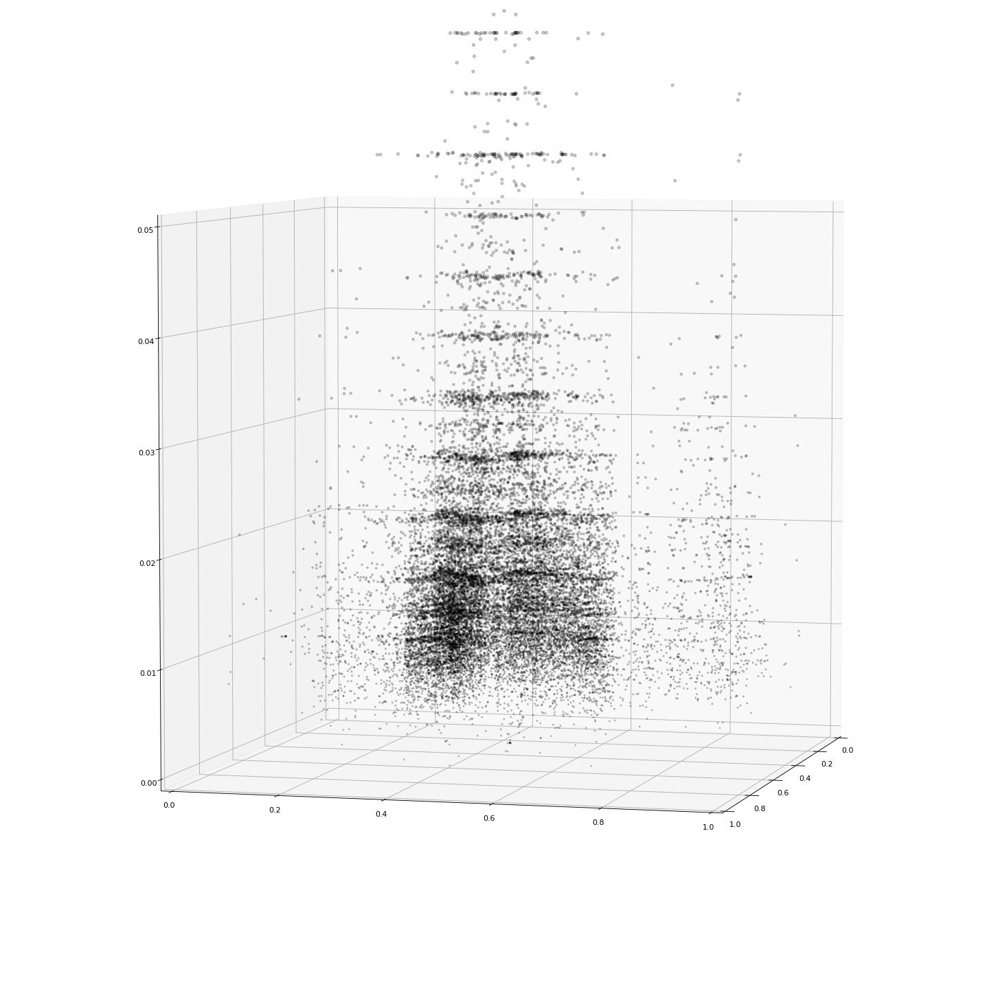

In [536]:
x=d1[1]
y=d1[2]
z=d1[0]

fig = plt.figure(1,figsize = (18,18), dpi = 80)
ax = Axes3D(fig,elev=5,azim=15)#, azim=azim)#, elev=elev,azim=azim)
ax.set(xlim=(0.0,1.0),ylim=(0.0,1.0),zlim=(0.0,0.05))

ax.scatter(x,y,z,s=((z+0.01)*200),alpha=0.2,c='k')
plt.show()

## Lastly, I wanted to try a few more maps to see if any more insights became visible. 
### The hexbin again confirmed there to be a high-price concentration in the center. To a point, increasing the gridsize showed other pockets of pricey listings around the outskirts, but past that point no new insights.

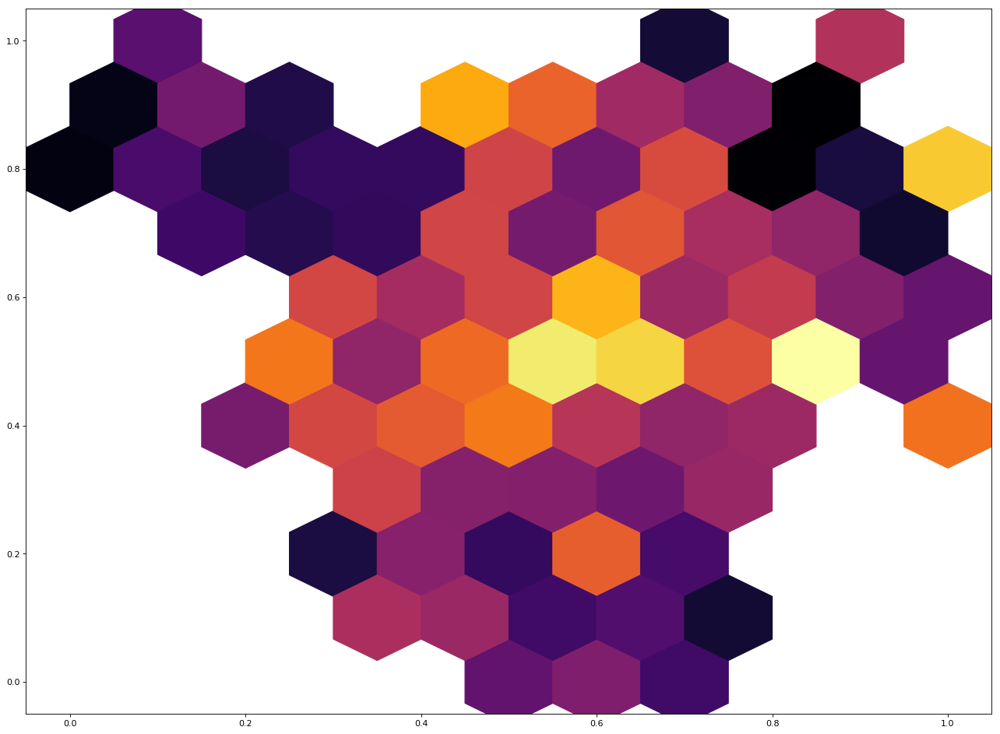

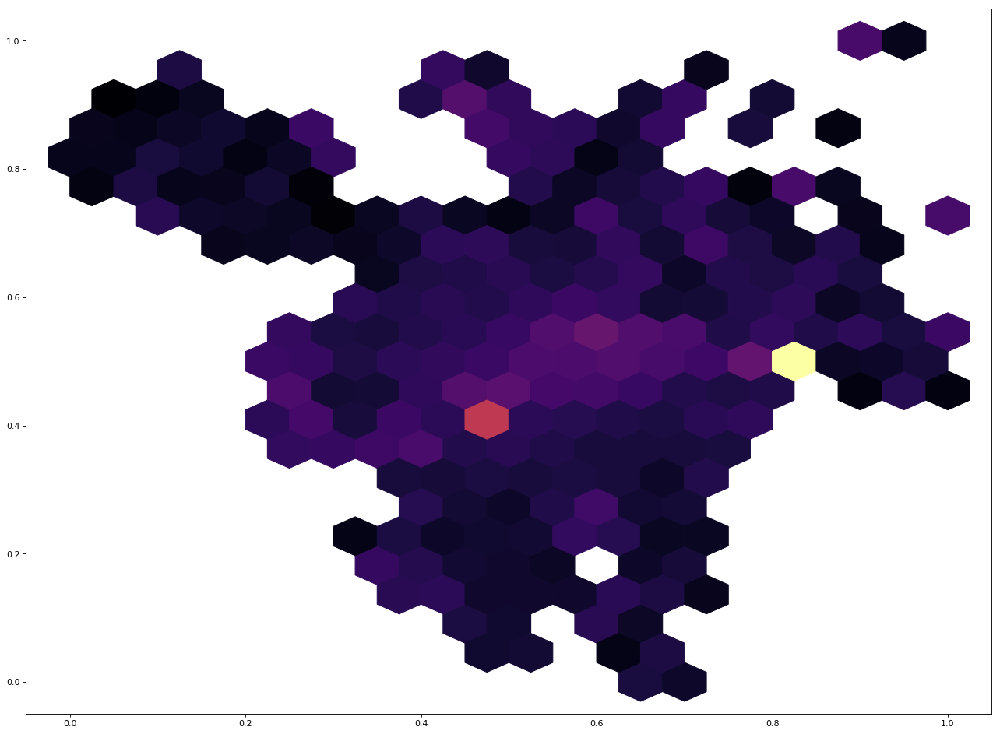

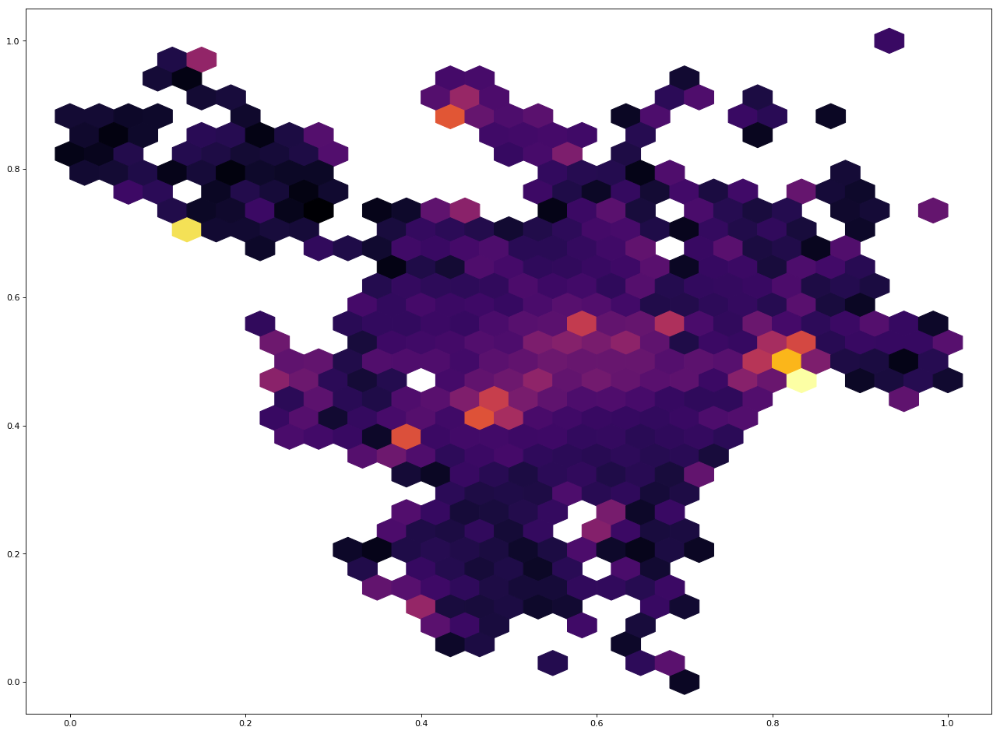

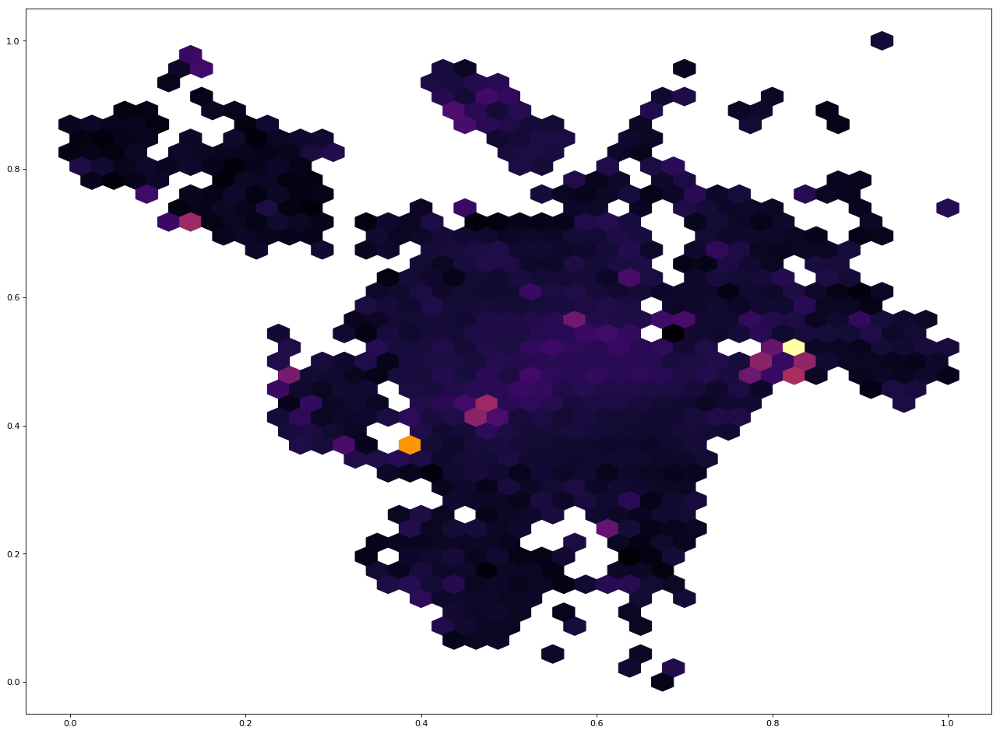

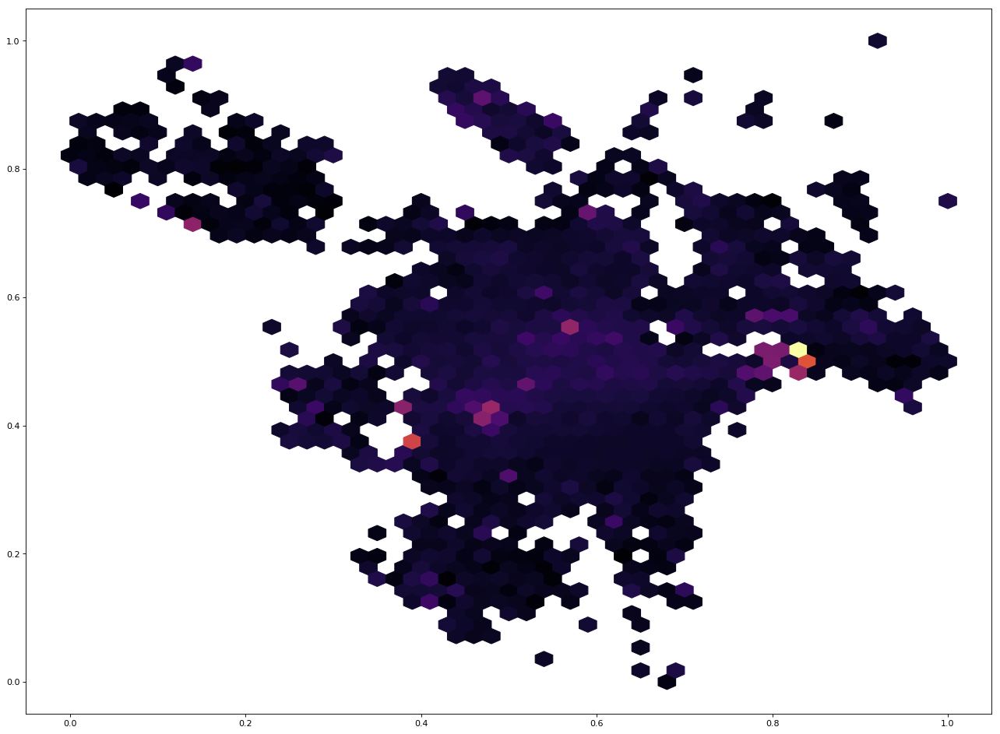

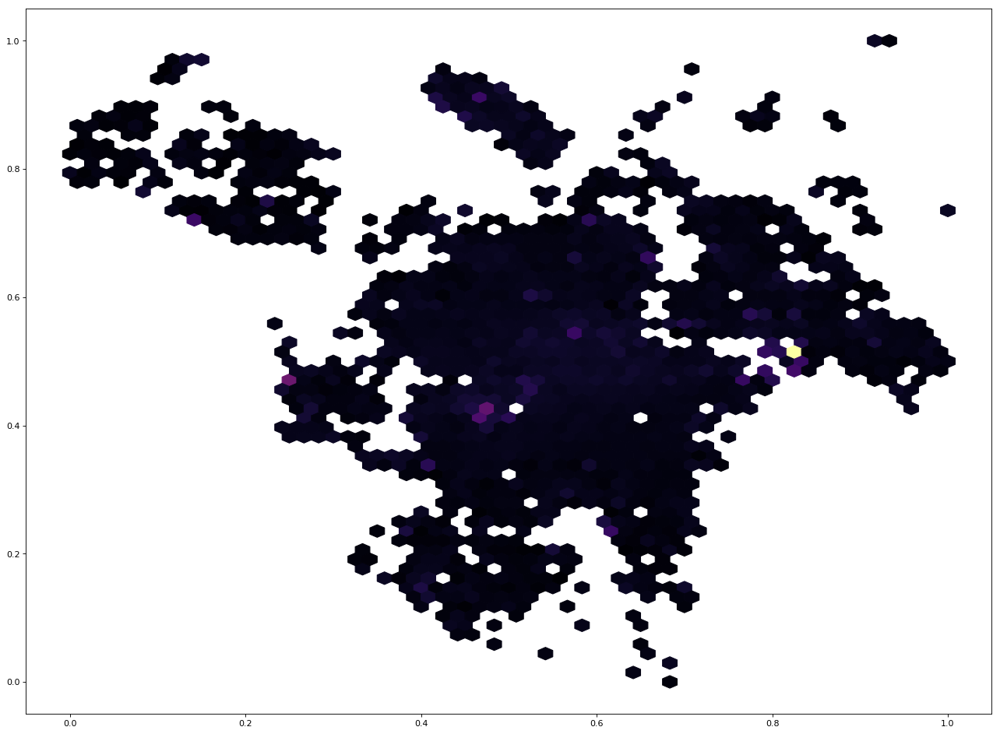

In [750]:
for i in range(1,7):
    fig = plt.figure(1,figsize = (20,15), dpi = 80)
    plt.hexbin(x, y, C=z, gridsize=10*i, cmap='inferno', bins=None)
    plt.show()


#### ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

#  Model Fitting  ------------------------------

### My idea: places with the same number of `beds`, `baths`, `rooms` and `acc`omodations should be correlated in some way, especially if they're in the same neighborhood ( their `lat`itude and `lon`gitude are similar ) or the same property `type` ( I noticed an `island` property type and made sure this was considered in the model )....

# First I tried a decision tree regressor, categorizing each listing based on the features chosen earlier.
## Inside my `tree_predict` function, I split the dataset into training and validation data, saved the results in a table comparing predicted versus actual price, added a percent error column and output the score along with it 

In [ ]:
def tree_predict(rand_state,depth):
    
    X = df[['id','beds','rooms','baths','lic','acc','guestpic','guestphone','instant','avail','super','hostpic','numver','rsr','rsa','rsch','rsco','rsl','rsv','chlc','chlceh','chlcpr','chlcsr','btr']] .astype(int)
    y = df[['id','price']].astype(int)  
    
    xtrain, xtest, ytrain, ytest = train_test_split(X,y, test_size=0.5, random_state=rand_state)
    regr2 = DecisionTreeRegressor(max_depth=depth)
    regr2.fit(xtrain[['beds','rooms','baths','lic','acc','guestpic','guestphone','instant','avail','super','hostpic','numver','rsr','rsa','rsch','rsco','rsl','rsv','chlc','chlceh','chlcpr','chlcsr','btr']],ytrain['price'])
    pred = regr2.predict(xtest[['beds','rooms','baths','lic','acc','guestpic','guestphone','instant','avail','super','hostpic','numver','rsr','rsa','rsch','rsco','rsl','rsv','chlc','chlceh','chlcpr','chlcsr','btr']])
    score = regr2.score(xtest[['beds','rooms','baths','lic','acc','guestpic','guestphone','instant','avail','super','hostpic','numver','rsr','rsa','rsch','rsco','rsl','rsv','chlc','chlceh','chlcpr','chlcsr','btr']], ytest['price'])
    table = pd.DataFrame(ytest,columns=['id','price'])
    table['guess'] = pd.Series(pred, index=ytest.index)
    table['%_err']=table.apply(lambda x: (100.0*abs(x['price']-x['guess'])/x['price']),axis=1)
    table = table.sort_values('%_err',ascending=False).reset_index()
    return table, score

#### Iterating through different values of  `max_depth` , I determined my most accurate tree was with  `max_depth=5`

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


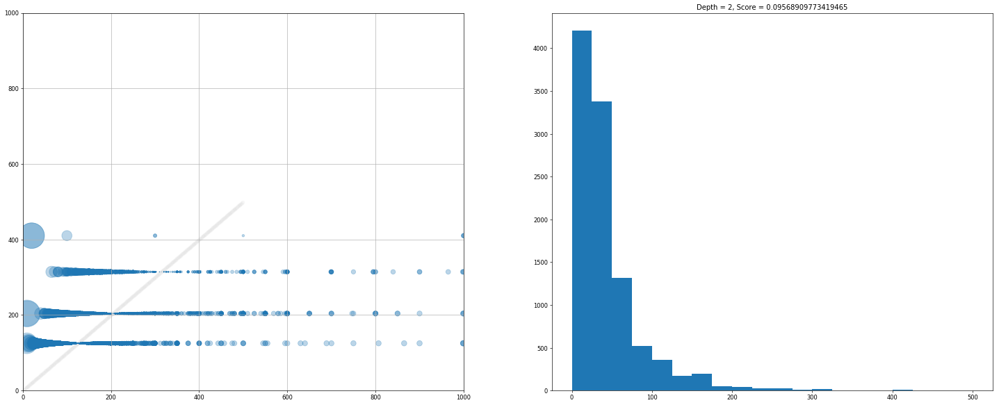

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


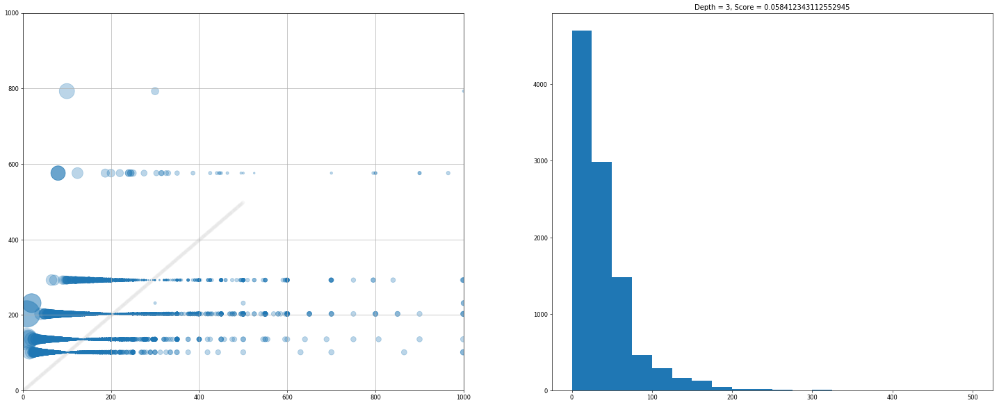

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


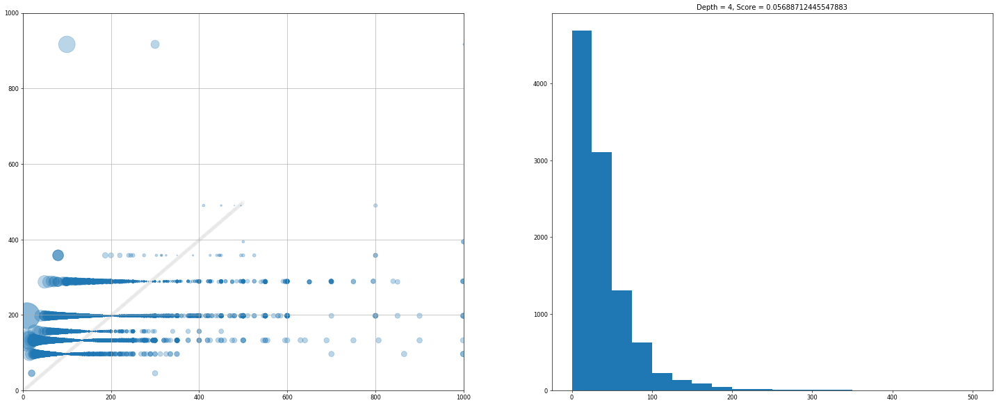

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


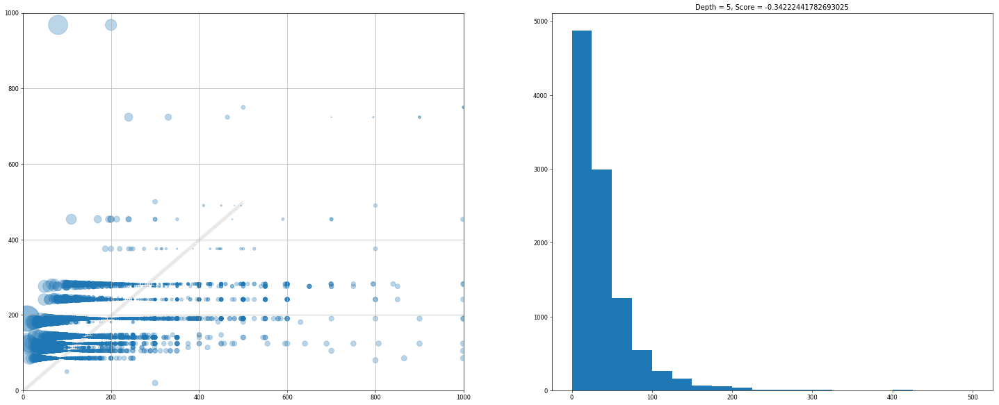

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


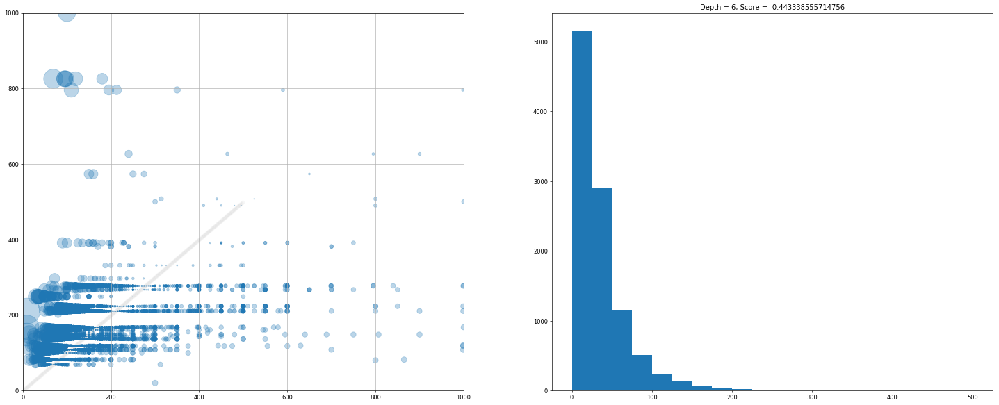

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


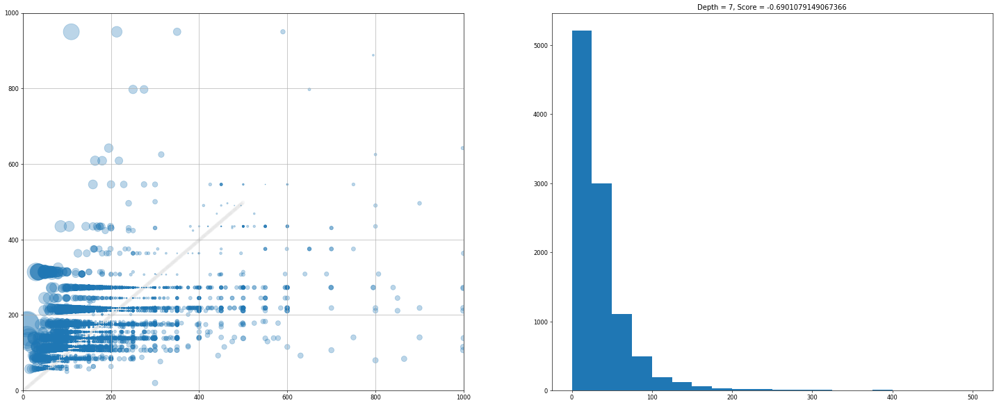

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


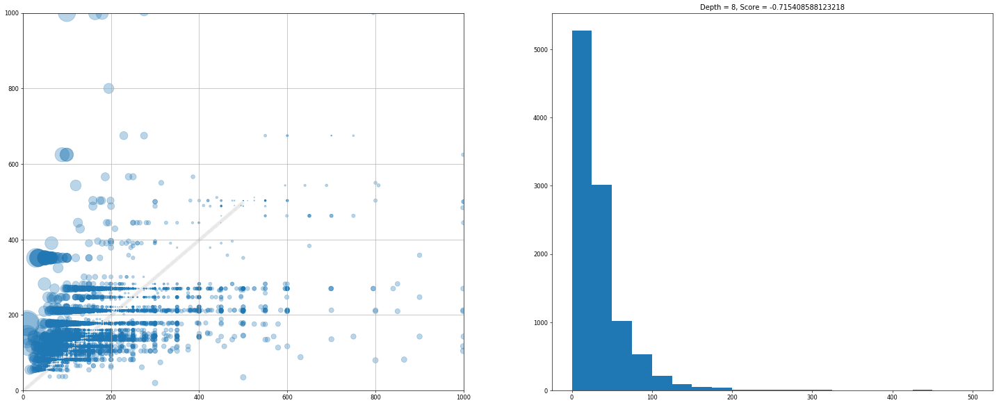

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


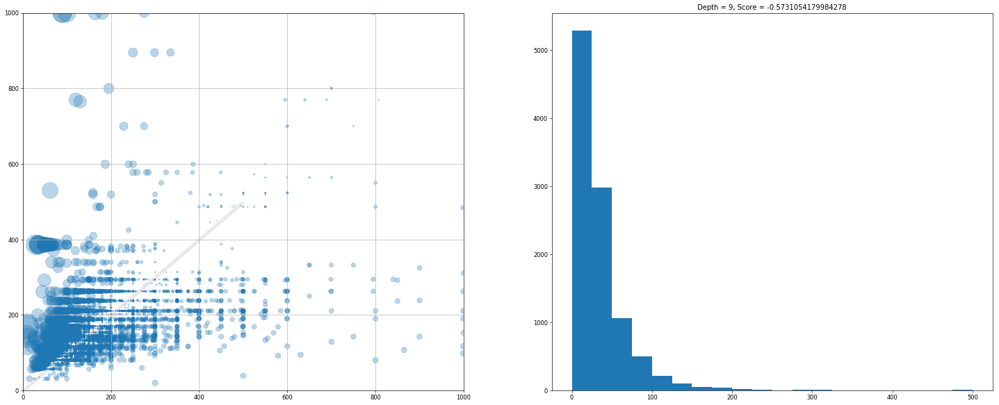

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


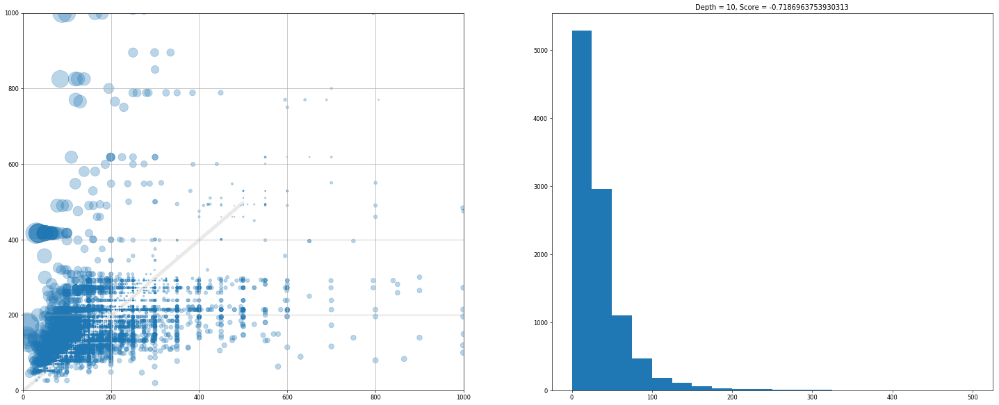

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


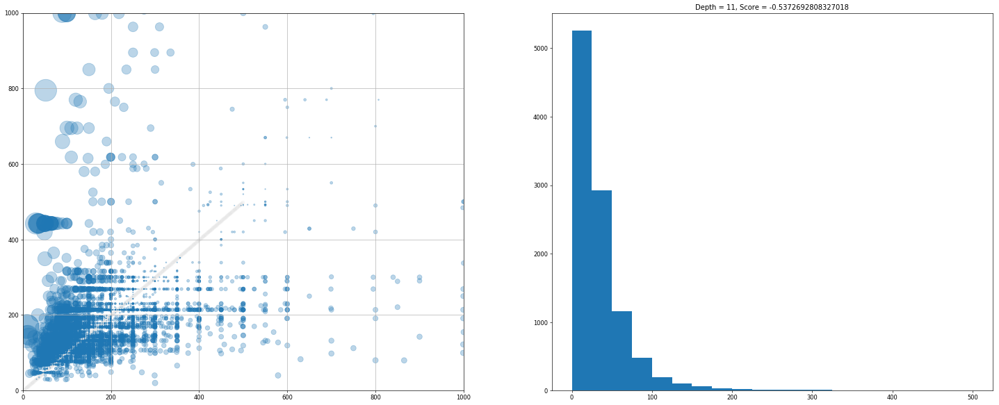

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


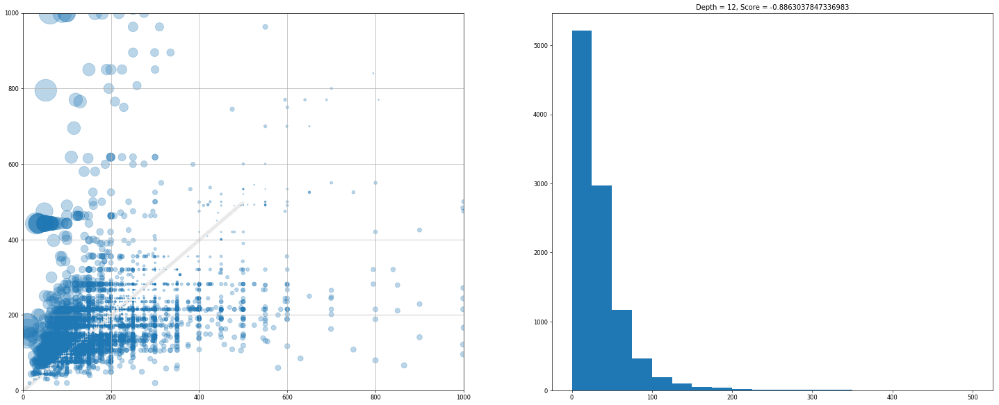

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


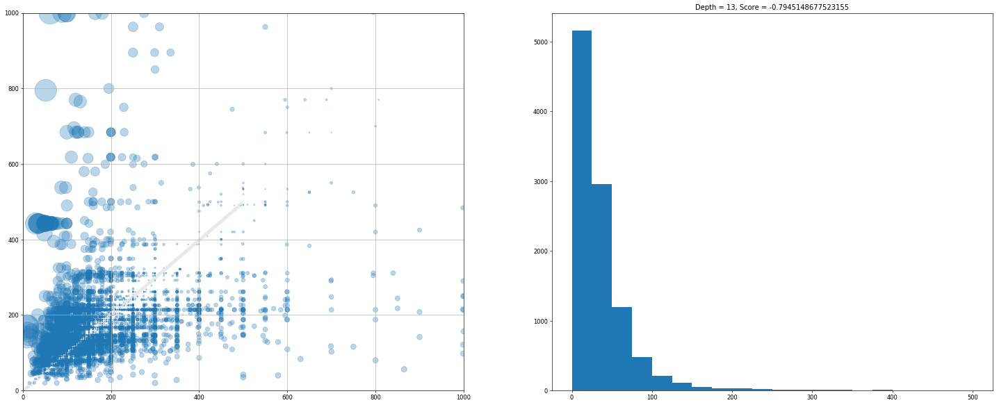

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


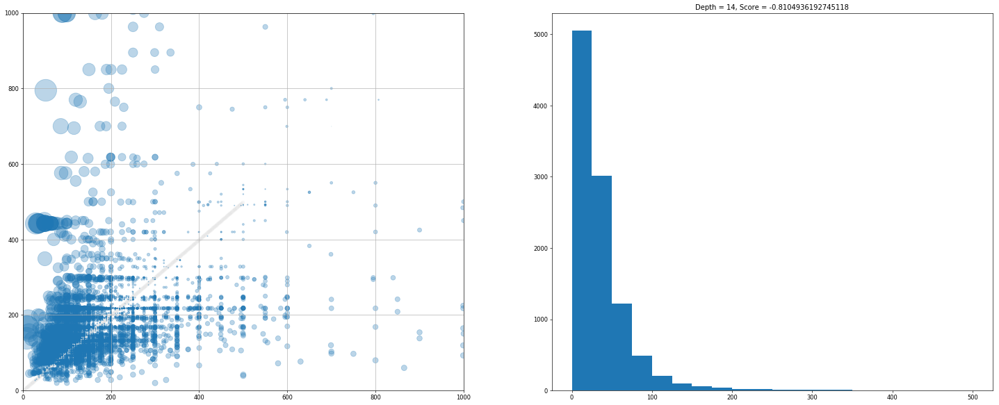

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


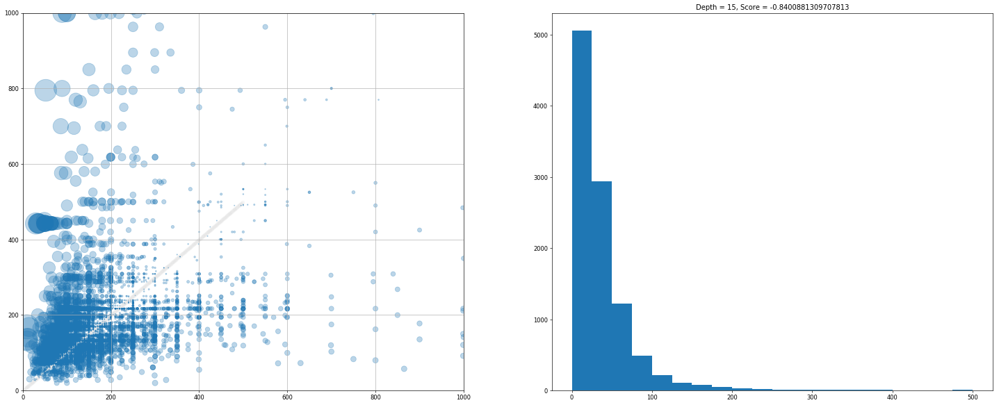

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


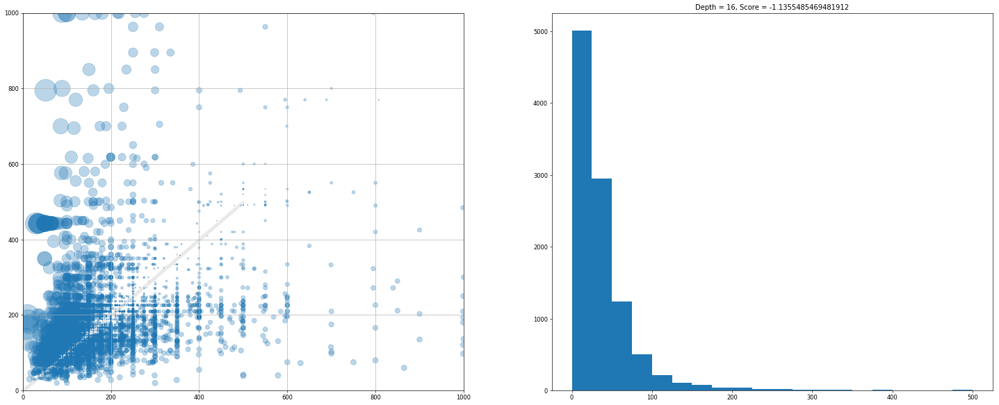

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


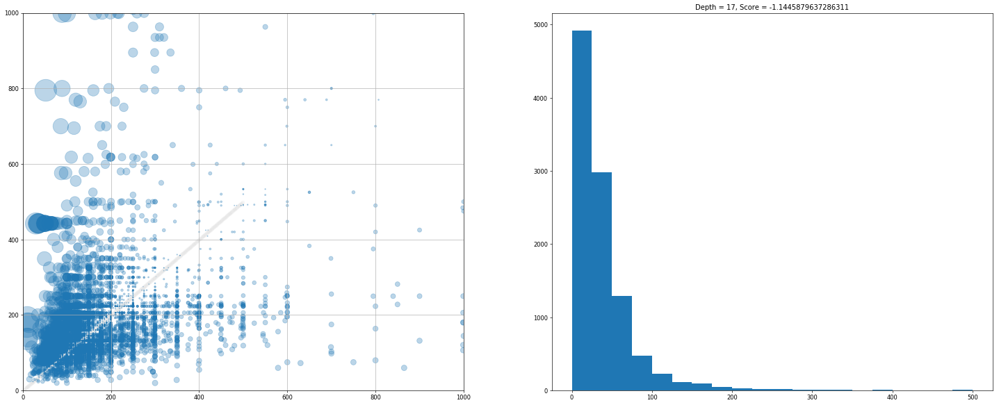

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


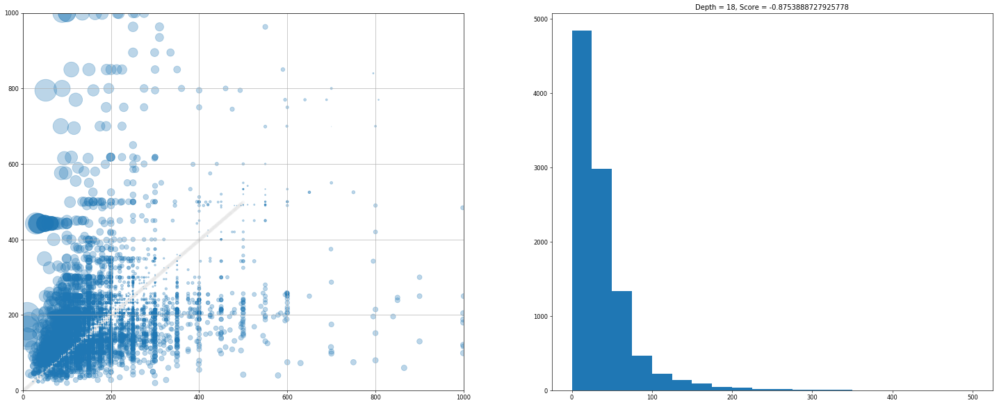

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


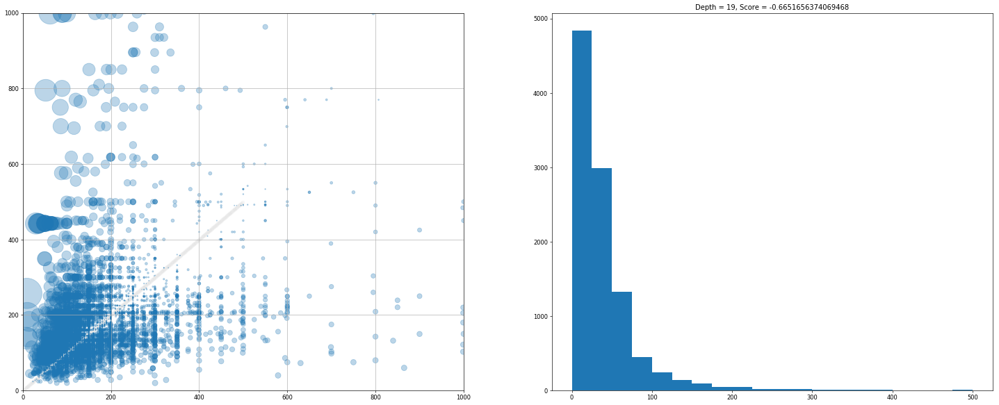

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


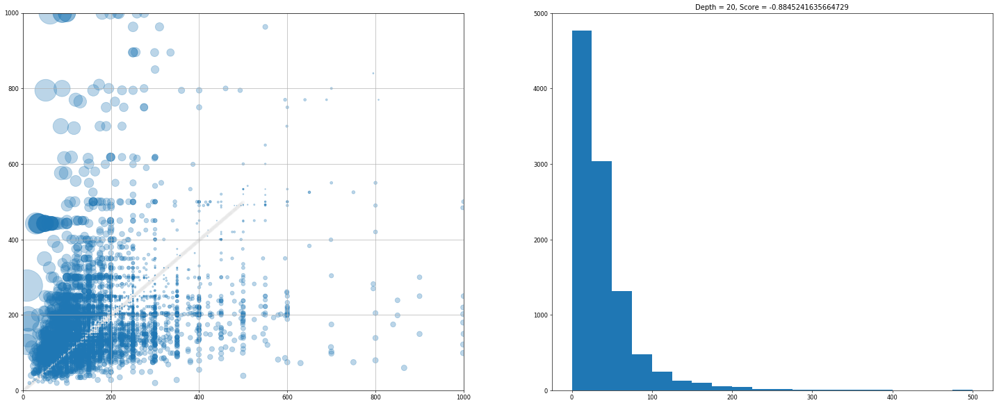

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


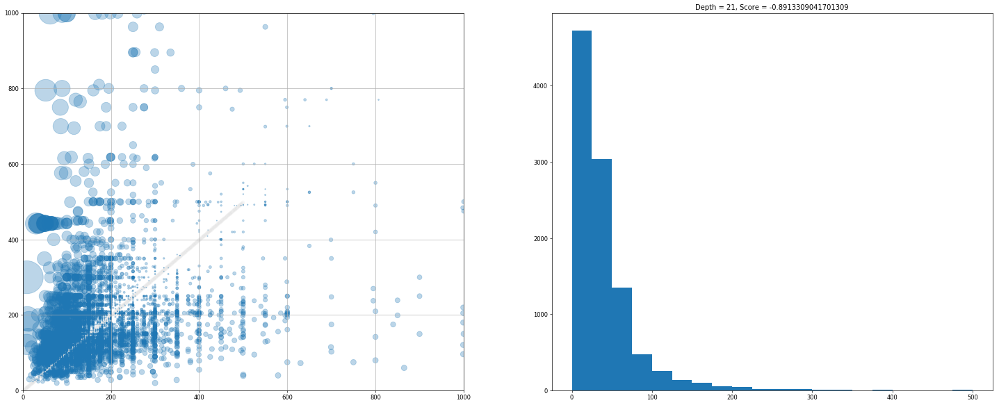

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


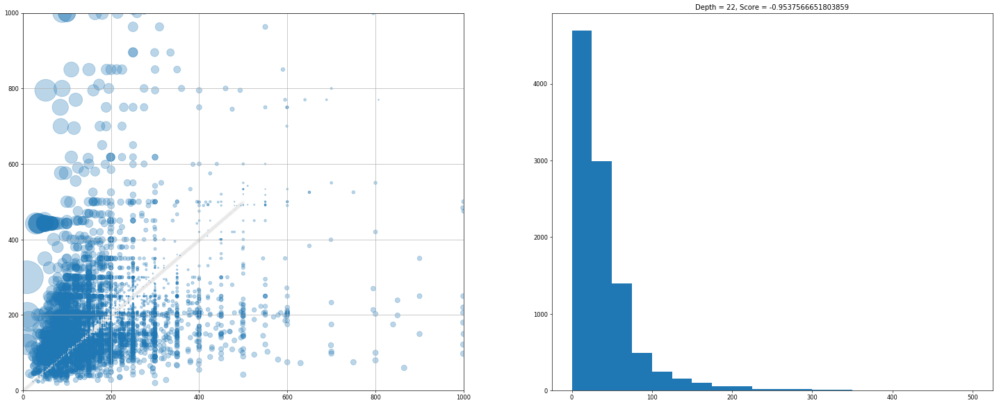

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


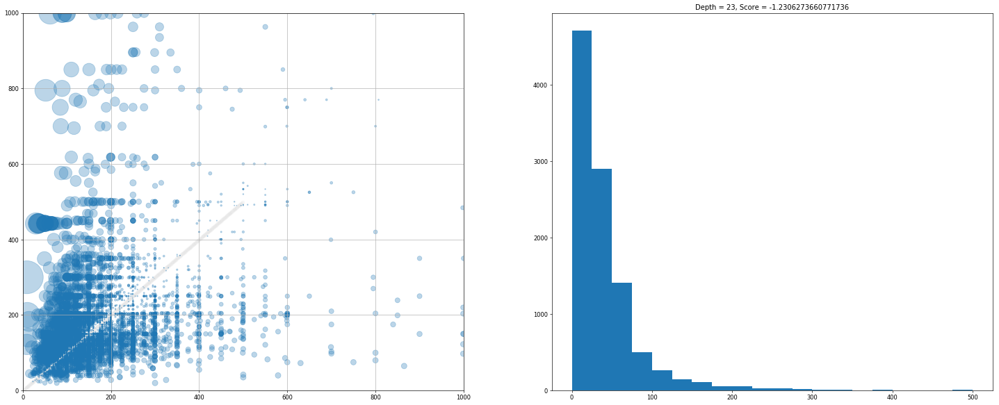

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


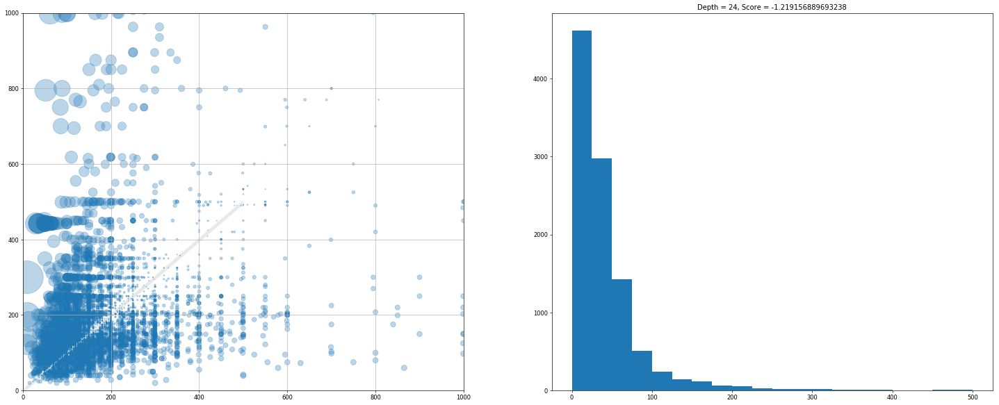

In [539]:
for i in range(2,25):
    tree_df, score = tree_predict(5,i)
    plt.figure(figsize=(30,12), dpi = 60)
    ax1 = plt.subplot(1,2,1)
    ax2 = plt.subplot(1,2,2)
    ax1.set_xlim(0,1000)
    ax1.set_ylim(0,1000)
    ax1.scatter(range(500),range(500),c='k',alpha=0.01)
    ax1.scatter(tree_df['price'],tree_df['guess'],s=tree_df['%_err'],alpha = 0.3)
    ax1.grid(True)
    ax2.hist(tree_df['%_err'], bins = 20, range=(0,500))
    plt.title("Depth = "+str(i)+", Score = "+str(score))
    plt.show()

# ~~~~~ Trying this same function with a KNeighbors regressor 
## This time iterating instead through the number of neighbors considered

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


     index_x        id  price-KNN  guess-KNN    %_err-KNN  index_y  \
0       6172  11404700        100     1704.0  1604.000000     6172   
1       6952  12879304        235      626.8   166.723404     6952   
2       6552  12143317        180      443.8   146.555556     6552   
3       6162  11384228         55      128.6   133.818182     6162   
4       5159   9323289         89      202.8   127.865169     5159   
5      20437  37179766        110      244.0   121.818182    20437   
6      17099  29537770         65      139.8   115.076923    17099   
7      13137  21498770         80      164.0   105.000000    13137   
8        849   1283694        100      193.0    93.000000      849   
9       1895   3346620         56       98.6    76.071429     1895   
10     18199  32371223         80      138.4    73.000000    18199   
11     16413  27850551        300       81.4    72.866667    16413   
12      6635  12284639         73      124.6    70.684932     6635   
13     13195  215710

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


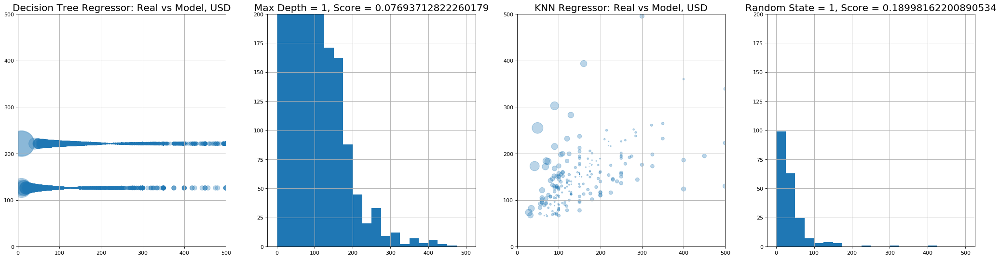

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


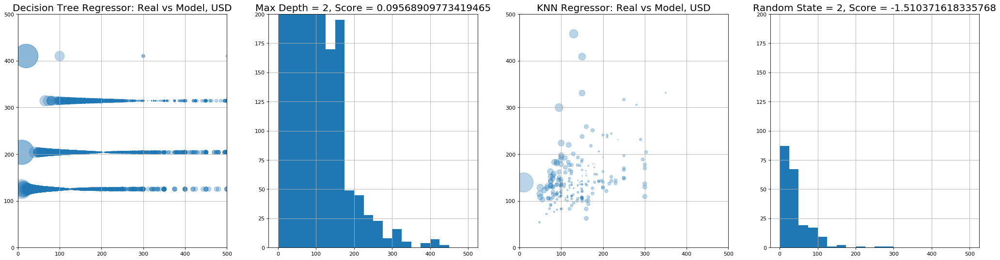

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


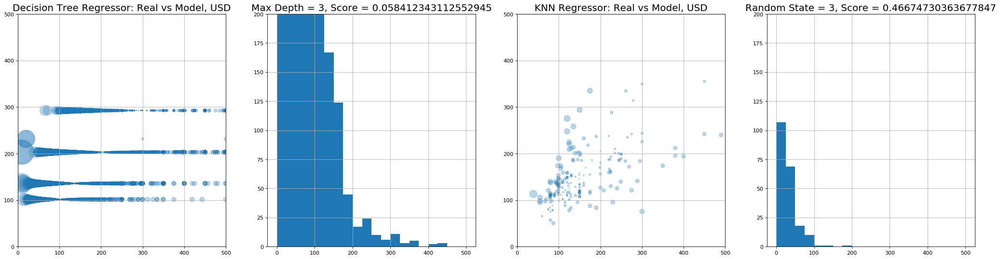

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


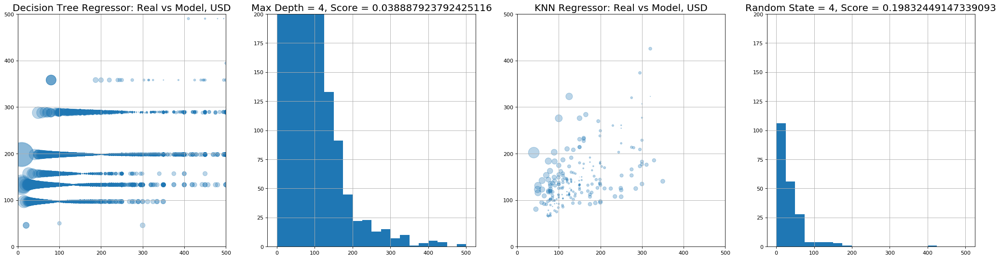

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


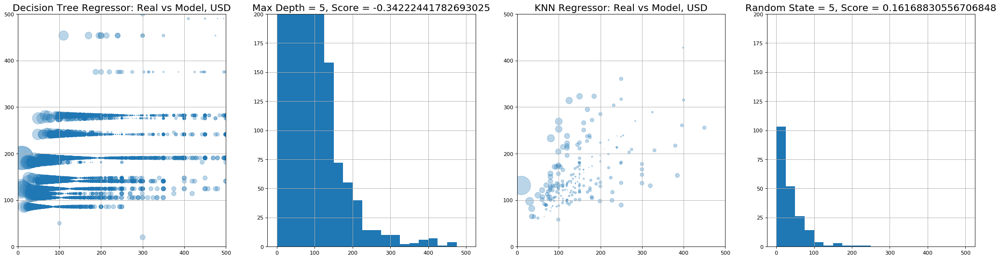

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


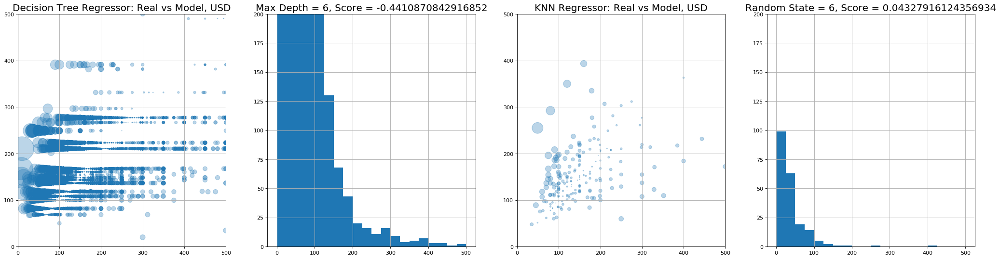

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()
/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


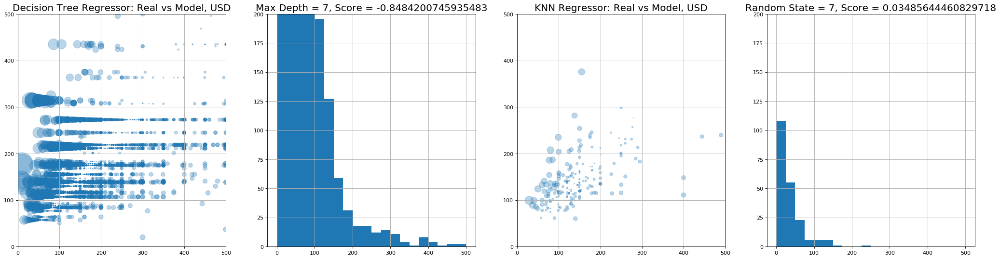

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


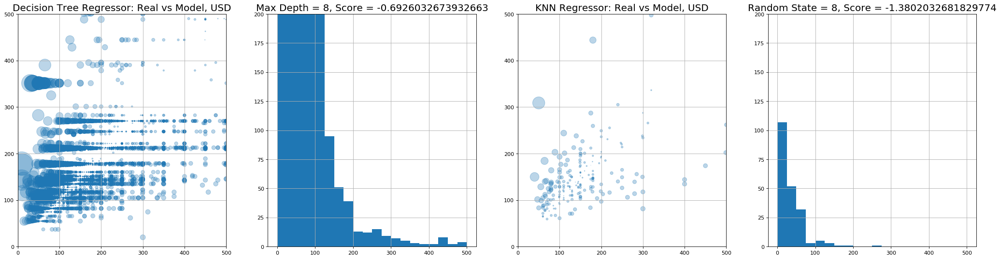

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


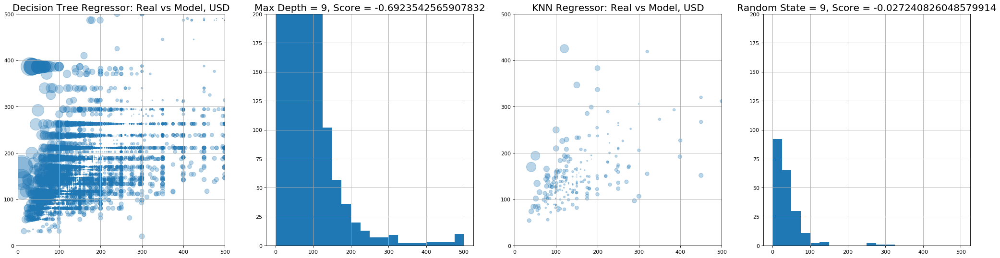

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


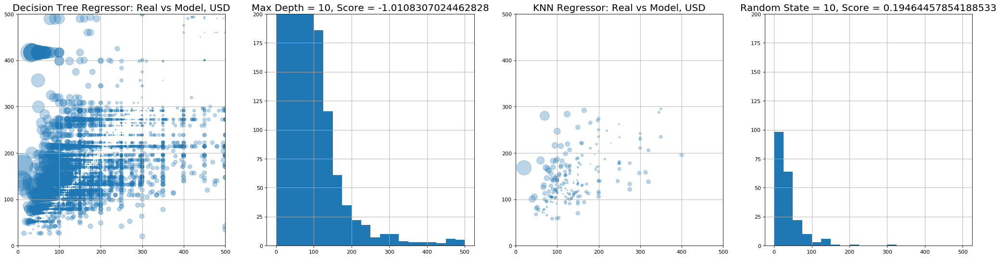

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


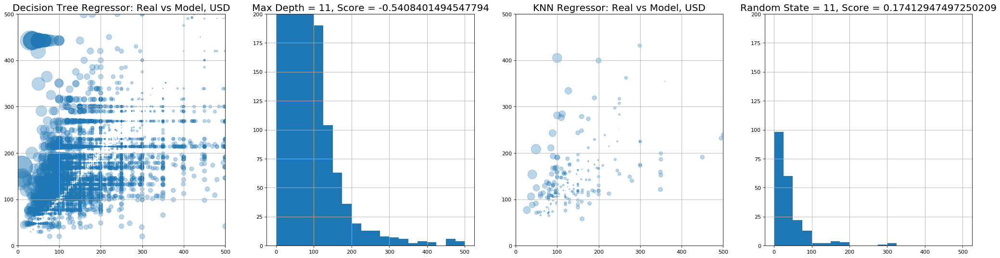

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


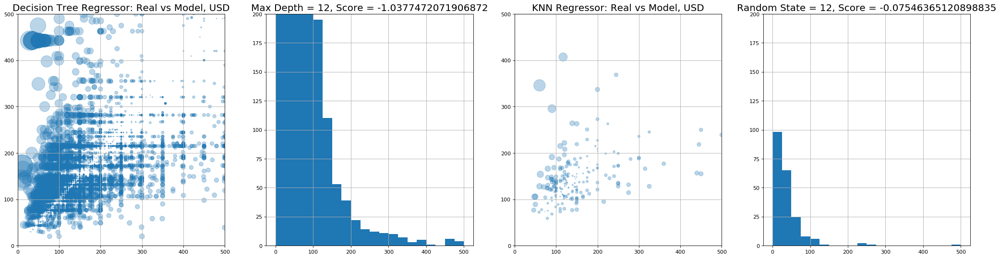

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


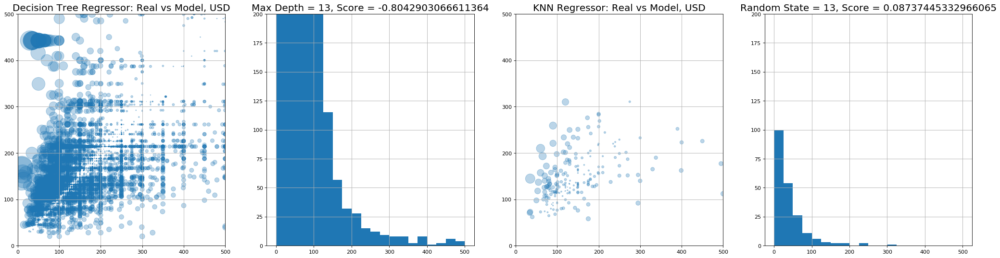

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


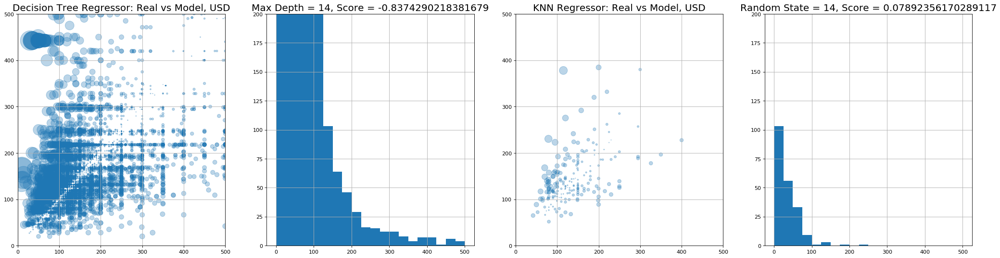

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


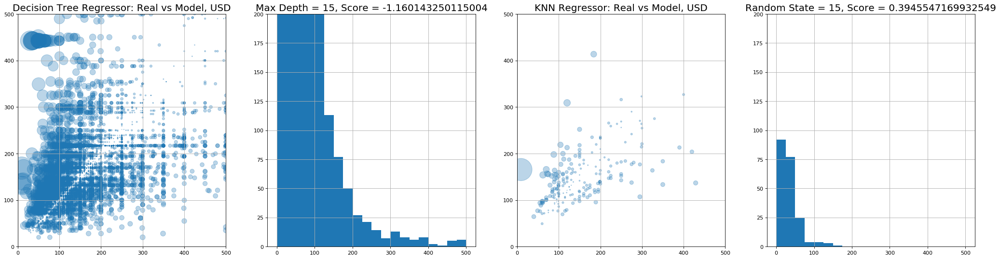

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


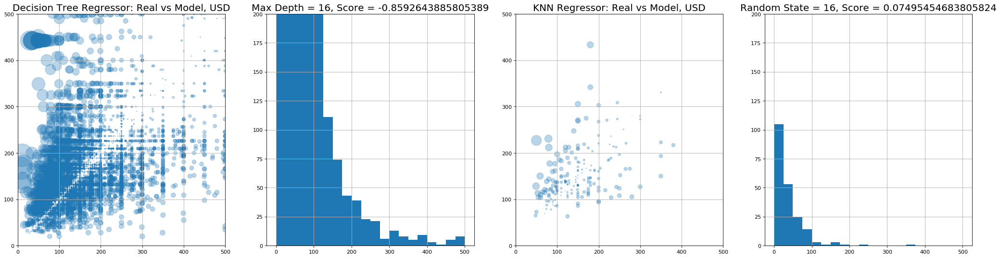

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


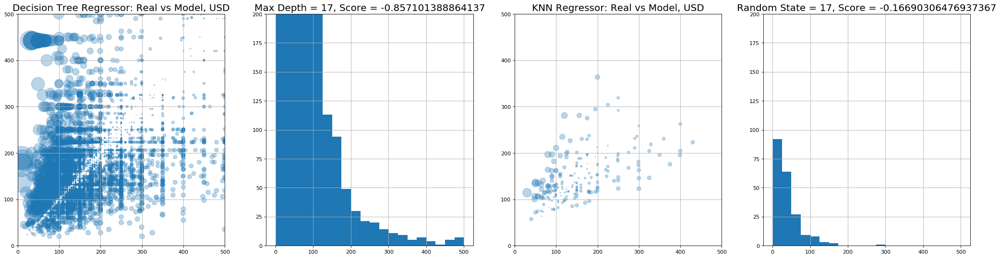

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


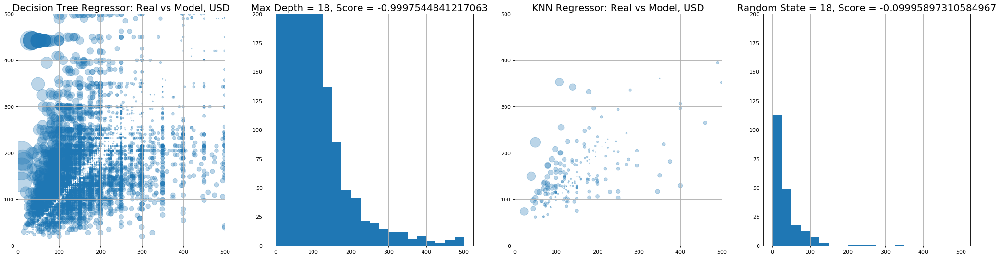

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


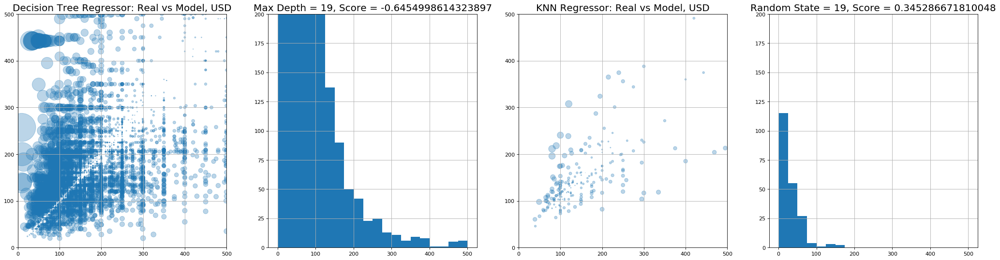

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


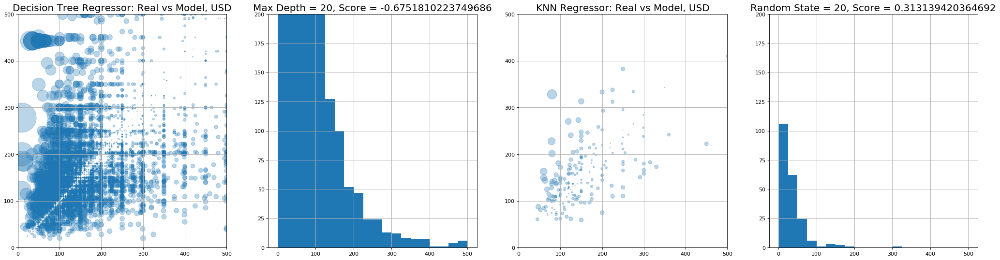

In [773]:
def neigh_predict(rand_state,algorithm):
    X = df[['beds','rooms','baths','lic','acc','guestpic','guestphone','instant','avail','super','hostpic','numver','rsr','rsa','rsch','rsco','rsl','rsv','chlc','chlceh','chlcpr','chlcsr','btr']] .astype(int)
    y = df[['id','price']].astype(int)  
    xtrain, xtest, ytrain, ytest = train_test_split(X,y, test_size=0.01, random_state=rand_state)
    regr3 = KNeighborsRegressor()
    regr3.fit(xtrain[['beds','rooms','baths','lic','acc','guestpic','guestphone','instant','avail','super','hostpic','numver','rsr','rsa','rsch','rsco','rsl','rsv','chlc','chlceh','chlcpr','chlcsr','btr']],ytrain['price'])
    pred = regr3.predict(xtest[['beds','rooms','baths','lic','acc','guestpic','guestphone','instant','avail','super','hostpic','numver','rsr','rsa','rsch','rsco','rsl','rsv','chlc','chlceh','chlcpr','chlcsr','btr']])
    score = regr3.score(xtest[['beds','rooms','baths','lic','acc','guestpic','guestphone','instant','avail','super','hostpic','numver','rsr','rsa','rsch','rsco','rsl','rsv','chlc','chlceh','chlcpr','chlcsr','btr']], ytest['price'])
    table = pd.DataFrame(ytest,columns=['id','price'])
    table['guess'] = pd.Series(pred, index=ytest.index)
    table['%_err']=table.apply(lambda x: (100.0*abs(x['price']-x['guess'])/x['price']),axis=1)
    table = table.sort_values('%_err',ascending=False).reset_index()
    return table, score
ndf, n_score = neigh_predict(8,'auto')
tdf, t_score = tree_predict(5,8)

ndf = ndf.rename(columns={'price':'price-KNN','guess':'guess-KNN','%_err':'%_err-KNN'})
tdf = tdf.rename(columns={'price':'price-TREE','guess':'guess-TREE','%_err':'%_err-TREE'})

both = pd.merge(ndf,tdf,on='id')
print(both)

## The following figures contain scatter plot of Predicted vs. Real prices, and a histogram of percent error for both models, iterated over `max_depth` and `n_neighbors` respectively;

In [ ]:
for i in range(1,21):
    nt, ns = neigh_predict(i,"ball_tree")
    tt, ts = tree_predict(5,i)
    plt.figure(figsize=(32,8), dpi = 80)
    ax1 = plt.subplot(1,4,1)
    ax2 = plt.subplot(1,4,2)
    ax3 = plt.subplot(1,4,3)
    ax4 = plt.subplot(1,4,4)
    ax1.set_xlim(0,500)
    ax3.set_xlim(0,500)
    ax1.set_ylim(0,500)
    ax2.set_ylim(0,200)
    ax3.set_ylim(0,500)
    ax4.set_ylim(0,200)
    ax1.set_title("Decision Tree Regressor: Real vs Model, USD",fontsize="18")
    ax2.set_title("Max Depth = "+str(i)+", Score = "+str(ts),fontsize="18")
    ax3.set_title("KNN Regressor: Real vs Model, USD",fontsize="18")
    ax4.set_title("Random State = "+str(i)+", Score = "+str(ns),fontsize="18")
    ax1.grid(True)
    ax2.grid(True)
    ax3.grid(True)
    ax4.grid(True)
    ax1.scatter(tt['price'],tt['guess'],s=tt['%_err'],alpha = 0.3)
    ax2.hist(tt['%_err'], bins = 20, range=(0,500))
    ax3.scatter(nt['price'],nt['guess'],s=nt['%_err'],alpha = 0.3)
    ax4.hist(nt['%_err'], bins = 20, range=(0,500))
    plt.show()

###  This list isn't too promising, so I went and built a K Neighbors Regression model to see if-- when combined with other elements of analysis-- can more accurately predict prices.

# My final model 

In [792]:
# Just a function to count the number of intersecting items in our amenities lists

def ammcount(list1,list2):
    same_count = 0
    for item in list1:
        if item in list2:
            same_count+=1
    return same_count

# Outputs a table of the K Neighbors closest to the given point or set

def model( Xtrain, Xtest, features, k1, k2):
    
    # Instantiate a NearestNeighbors object and fit to our training data
    nbrs = NearestNeighbors(n_neighbors=k1, algorithm='auto').fit(Xtrain[features])
    dis, ind = nbrs.kneighbors(Xtrain[features])
    for i in range(len(Xtest)):
        x_n = Xtrain.loc[list(ind[0][1:])]
        
        # Incorporating physical distance
        x_n['distance'] = x_n.apply(lambda x: round(((x.lat-tp1.lat)**2+(x.lon-tp1.lon)**2)**0.5,4), axis=1)
        
        # Finding the number of the same amenities
        x_n['same_amm'] = x_n.amm.apply(lambda x: ammcount(x,tp1.amm))
        x_n = x_n.sort_values(['same_amm'],ascending=False)

        
        # Only averaging over listings of the same type
        return x_n[x_n['type']==Xtest['type']].head(k2), Xtest

## I chose a random testpoint and designated a few groups of features cluster by, and decide to scale up the most important features so they're of greater weight in the regression:

In [777]:
for feat in shortfeats:
    df[feat] = df[feat].apply(lambda x: 20.0*x)

In [796]:

rand = rd.randint(0,len(df))
test = df.loc[rand]
rang = list(range(0,rand))+list(range(rand,len(train)))
train = df.loc[rang]

feats = ['lat','lon']
allfeats = ['beds','rooms','baths','lic','acc','guestpic','guestphone','instant','avail','super','hostpic','numver','rsr','rsa','rsch','rsco','rsl','rsv','chlc','chlceh','chlcpr','chlcsr','btr']
shortfeats = ['beds','rooms','baths','acc']


##  Now we're all ready to see how this model fares! Again iterating through the number of neighbors, outputting a table of neigh's per K value, then finding the median and mean of each table

2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19


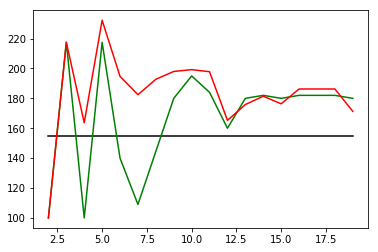

In [801]:
totallist = []
medianlist = []
meanlist = []
klist = []
for k in range(2,20):
    n1, tp1 = model(train,test,allfeats,2*k,k)
    totallist.append(tp1['total'])
    medianlist.append(n1.total.median())
    meanlist.append(n1.total.mean())
    klist.append(k)
    print(k)

tp1
n1.head(10)

plt.plot(klist,totallist,color='k')
plt.plot(klist,medianlist,color='green')
plt.plot(klist,meanlist,color='red')

plt.show()

# The following graph shows my final model's accuracy vs. K

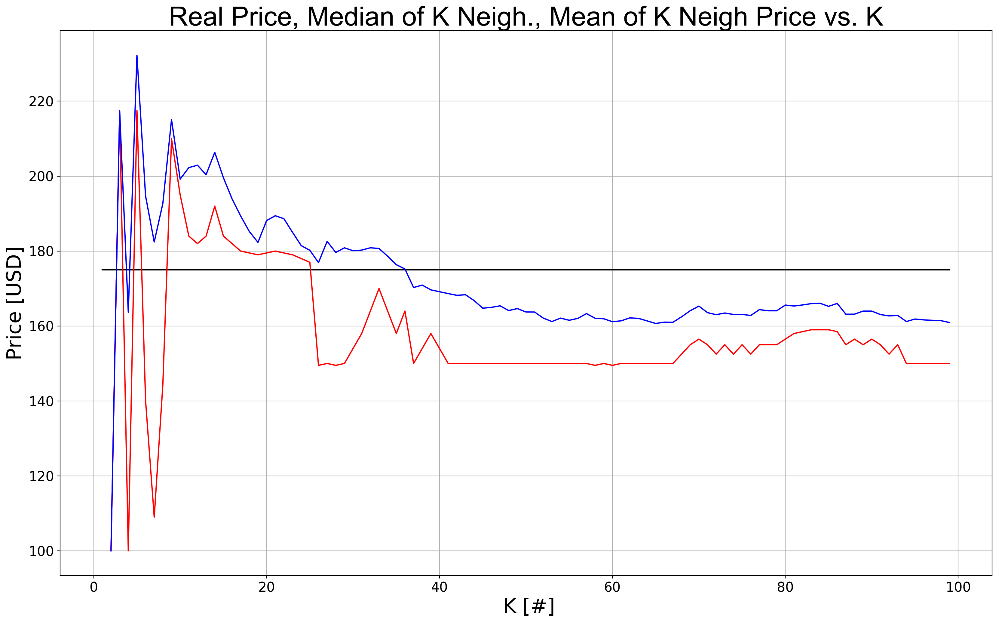

In [771]:
totallist = []
medianlist = []
meanlist = []
klist = []
for k in range(10,100,10):
    n1, tp1 = model(train,test,allfeats,2*k,k)
    totallist.append(tp1['total'])
    medianlist.append(n1.total.median())
    meanlist.append(n1.total.mean())
    klist.append(k)
    print(k)
plt.figure(figsize=(20,12), dpi=200)

plt.plot(klist,totallist,color='k')
plt.plot(klist,medianlist,color='red',label='Median')
plt.plot(klist,meanlist,color='blue',label='Mean of Total')

plt.xticks(fontsize='16')
plt.yticks(fontsize='16')

plt.xlabel(" K [#]", fontsize='24')
plt.ylabel("Price [USD]", fontsize='24')

plt.grid(True)
plt.title("Real Price, Median of K Neigh., Mean of K Neigh Price vs. K", fontname='Arial', fontsize='32')
plt.show()


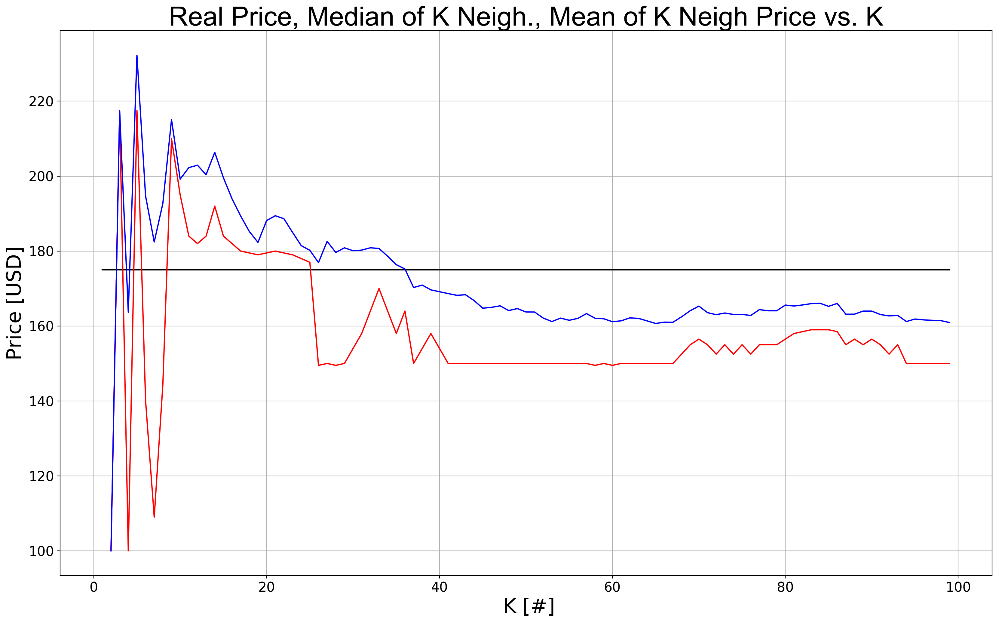

In [795]:
from IPython.display import Image
from IPython.core.display import HTML 
Image(url= "data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAADPsAAAgXCAYAAAD0AeX/AAAABHNCSVQICAgIfAhkiAAAAAlwSFlzAAAewgAAHsIBbtB1PgAAADl0RVh0U29mdHdhcmUAbWF0cGxvdGxpYiB2ZXJzaW9uIDMuMC4yLCBodHRwOi8vbWF0cGxvdGxpYi5vcmcvOIA7rQAAIABJREFUeJzs3Xe0JFW5xuHfO4RhgJEsiIRBEEFEBMlxCJJEVKIoAgYMiBFMYBj1XhEVAyp4DTigkpSggCiCDEGRqAgCgsAgYAARyWFgvvvHrpHDOF27uruqq88577NWLRZT1bu+U91dvWuHbysiMDMzMzMzMzMzMzMzMzMzMzMzMzMzMzMzM7P2TWg7ADMzMzMzMzMzMzMzMzMzMzMzMzMzMzMzMzNLPNnHzMzMzMzMzMzMzMzMzMzMzMzMzMzMzMzMbEh4so+ZmZmZmZmZmZmZmZmZmZmZmZmZmZmZmZnZkPBkHzMzMzMzMzMzMzMzMzMzMzMzMzMzMzMzM7Mh4ck+ZmZmZmZmZmZmZmZmZmZmZmZmZmZmZmZmZkPCk33MzMzMzMzMzMzMzMzMzMzMzMzMzMzMzMzMhoQn+5iZmZmZmZmZmZmZmZmZmZmZmZmZmZmZmZkNCU/2MTMzMzMzMzMzMzMzMzMzMzMzMzMzMzMzMxsSnuxjZmZmZmZmZmZmZmZmZmZmZmZmZmZmZmZmNiQ82cfMzMzMzMzMzMzMzMzMzMzMzMzMzMzMzMxsSHiyj5mZmZmZmZmZmZmZmZmZmZmZmZmZmZmZmdmQ8GQfMzMzMzMzMzMzMzMzMzMzMzMzMzMzMzMzsyHhyT5mZmZmZmZmZmZmZmZmZmZmZmZmZmZmZmZmQ8KTfczMzMzMzMzMzMzMzMzMzMzMzMzMzMzMzMyGhCf7mJmZmZmZmZmZmZmZmZmZmZmZmZmZmZmZmQ0JT/YxMzMzMzMzMzMzMzMzMzMzMzMzMzMzMzMzGxKe7GNmZmZmZmZmZmZmZmZmZmZmZmZmZmZmZmY2JDzZx8zMzMzMzMzMzMzMzMzMzMzMzMzMzMzMzGxIeLKPmZmZmZmZmZmZmZmZmZmZmZmZmZmZmZmZ2ZCYv+0AzMzMzMzMzMzMzKw3kuYDtgJ2AtYGXggsDkwGngYeLLZ/ArcANwN/As6OiMfaiNnMzMzMbDSTtBSwK7A58GJgJVL9e2HgUeABUh38bp6pf18dEb9pJWAzMzMzMzMzMxuVFBFtx2BmZmZmZmZmZmZmXZA0P3Ag8HHgeV2+PIDnRMTDtQdmZmZmZjZGSVoBmAbsT/eJVX8UEXvVHpSZmZmZmZmZmY1ZE9oOwMzMzKxukmLA22xJsyQ9KuleSbdJulLS2ZKOlfQBSTsU2f5sHJA0NfOZmd52jPMiadoAvi9PSXpc0sOS7pF0u6TfSzpP0vGSPiFpD0krt3096iZpeubaTG07Rhs/JM3s8rv7oKSF2o57JEk/7CL+mW3HO55ImlH2ftRdnqQp9f8VZsNN0vLADOAYup/oA3D7oCf6VKgLzRhkPHPFtrGkByr+pjwqaYe2Yh0R8wEVYv3SEMS547C+723z79t/U/6Z9IC2Y7T6SJrS5TNJSDqv7bhHUnJnF/FPbztmM+udpF2B64C30P1EH4rXDlSF+9IBg45pRGxHdnH/vFLSkm3FOiLmXP1tlqT1hiDOk4f1fW9ThbrHjLZjbIMy7cRtxzdMlG/XqGObpdSH9pCkvyv1OV8t6VxJ35V0mKRXSVqu7etRtwr32Cltx2hmo4cqtJ22GNsykq7r4rfhE23FamZmw6GXRigzMzMzezaR6lXzA5OApYFV5nFcSPoDcBbwvYi4bXAhmg2N+YptIrAIsEynAyX9Ffgp8OOIuGAw4ZlZB5OBnYAz2g4EQNIkYNe24zAza4PSRJ+LgVX7KGbgAw2HlaRNgXOB51Q4/GFgl4i4qNmoavNeSWdExCVtB2JmVpNtJC0TEfe2HUhhc2CFtoMws+ZJ2gf4Af0lU3UdvCDpC8ChFQ+/FHhlRDzYYEh1mR84QdLLI+KJtoMxs1FpTn/zRGDR4t/m1eeMpFuBnwCnRMQVgwnPzMz6IWlZ4AJgrYovOTQijmowJDMzGwW8so+ZmZnZ4AhYB/gYcLPSigSrtRyT2TBbHngHcL6k6yW9QZLaDspsHNur7QBGeBXPdHaamY0bkuYDTqe/iT7ggYYASNoc+DnVJvr8G9huFE30gdT+P13SIm0HYmZWk/mA3doOYoR92g7AzJonaV3gePofW+E6OKC0+mTViT4XADuMkok+c6wFfLrtIMxsXFgV+ABwuaTLJO3cdkBmZtZZsSrbhVSb6BPAOz3Rx8zMwJN9zMzMzNoyH/B64FpJb2s7GLNRYC1S9sxLPUnOrDWvKlbUGQYeVGdm49W7gI1qKGfcDzSUtCVpRZ/JFQ6/F9g6Ii5vNqpGvAD4QttBmJnVaO+2AwCQND+wZ9txmNlAfAdYoM8yHgFuqyGWUU3SV4H3Vzz8bNKKPo82GFJTDpW0SdtBmNm4sjFwjqSzJD237WDMzOzZJD0PmAGsWeHwp4EDIuKbjQZlZmajhif7mJmZmbVrYeD/JH297UDMRolNgask7dR2IGbj0CLAK9sOQtJigO8BZjbuFIOKP1hTceN6so+kqcDPqLZK3N+ArSLi940G1ax3SNqu7SDMzGqylaRl2w4C2A5Yuu0gzKxZknYE1quhqD9GRNRQzqgl6WvAeyoe/iNgt4h4osGQmjRnhc1hSZpjZuPHLsA1ktZvOxAzM0skLU+a6POiCofPAvaJiBMaDcrMzEYVT/YxMzMzGw7vKrLamVneYsCZnvBj1ophyKK9GzCx7SDMzFqwGbBCheMuAvYD1iDVm+Yv/rsisDlwAHBLMyEOP0lbA+eQJrHm3AFsERE3NhtV4wQcJ+k5bQdiZlaDCcAebQeBVxs1Gy+qtIM8ChwD7AgsD0witVssDaxOSlhyWFMBDjslxwAHV3zJCaQBjrMaDGsQVgc+13YQZjYuPR84X1Idk1XNzKwPklYgtdevXuHwJ0gT3n/UbFRmZjbazN92AGZmZmYtOAG4rMbyBEwGnkMaRLcaKdtft8ukv0fSFRHxwxpjMxurFgROk7RBRPyx7WDMxpGdJS0SEY+0GIMH1ZnZeLVZhWMOjYij5vHvDxbbXcCva41qFJG0LXAWaQBmzi3AthFxZ7NRDcyKwFeAN7cdiJlZDfYCvtHWySUtBLymrfOb2UDl6uD/ALaJiBvmse++YhvPE+0FHAu8veJLjgXeNYZWQXq3pDMiYkbbgZjZuLMYcK6kdSLi720HY2Y2HklaEbgQWLXC4Y8Ar46IC5qNyszMRiNP9jEzM7Px6MKImN70SSStRBqQ/FbSBKAqjpX064iY2VhgZr27IyKm9FNA0cE7f7EtDCwKLEXKUv8SYHtgS9IkupxJwKmSXh4Rj/cTl5lVtjDwKuDkNk4u6bnANm2c28xsCKyZ2f+LDhN9DJC0PXAm1Sb6/BHYbgwOiHmTpNMi4py2AzEz69PmkpaPiL+2dP5XkpL+mNkYJmlB4AWZw97XYaLPuFe0A3+L1D9SxVERcWiDIbVhzgqbL42Ih9sOxswad1FETO2ngOLeuQAwH2lF4kVJySVXAF4K7AK8vGJxzwV+AGzXT0xmZtY9SSuTJvqsUuHwB4GdI2LcJukyM7NyE9oOwMzMzGysioi/RMSRpCV53wI8VOFlk4H/bTQwsxZFMisiHouI+yLijoi4JiJ+GhGfLTpCXgicUbHIFwPvbyxgM5uXvVo+93wtnt/MrE3LZ/Z/dyBRjEKSdgR+QrWJPtcAW43BiT5zfFvSkm0HYWbWpwnAHi2e36uNmo0Py1LeBvFv4PQBxTKqSJoAfIfqE30+PQYn+syxCuCkDGZWSdGH9mTRh/bPiJgZEVdExOkRMS0i1gfWA2ZULHJbSa67mpkNkKQppPt0lYk+/yKtLu+JPmZm1pEn+5iZmZk1rGiYPQ5YB7i1wkteJ2nthsMyG1oRcWtE7Aa8DXiqwks+KmnphsPqW0QcEBEq2Wa0HaPZCP8u2beTpMkDi+TZ3DE5DkXE1Mz9c2bbMZoNyFKZ/ZcNJIpRRtLOpBV9Fqpw+GXANhFxX7NRtep5wNfbDsL8+2ZWUdlzSStJCIpnoVe2cW4zG7hc/fvqiHhyIJGMIsVEn+OAN1d8yYcj4pMNhjQM3iZph7aDGO+KSRNl9e+pbcdoVkVE/C4itgY+XfEln5O0QJMx1cHPyGY2FkhahTTRZ0qFw/8BTI2Iq5qMyczMRj9P9jEzMzMbkIi4HdiB9NBeZgLwruYjMhtuEfFtqnUKTwYObDgcs/GmbHWthYBdBxXIHMWS95t02D1WV18wMxupbFWaxyLiroFFMkpI2oX0mzaxwuEXAttHxAPNRjUU9pG0e9tBmJlVUPZcsqmkFQYWyTNeS+cJpH4uMRtbcqtC3jyQKEaRYqLPdGD/CocHcHBEfL7RoIbHdyQt1nYQZjZ2FBMlP1Hh0JVod1VMM7NxQdKqwEXAyhUOvwvYMiKuazYqMzMbCzzZx8zMzGyAIuJW4B0VDt1T0oJNx2M27CLi+8AxFQ59pyQ1HY/ZOHIm8HjJ/jayaL8O6PQ9P3WQgZiZtaQsC+tDA4tilJC0K3AaUOW56mfAzhHxcLNRDZVjJT237SDMzDJOLtknYM9BBTJCp9VGnwJOH2QgZta43CoIroOPIGk+4ATgjRUOnw28JSK+0WxUQ2UF4Oi2gzCzsSUiPkNq08g5qOlYzMzGM0mrkVb0WbHC4bcBW0SEkweYmVklnuxjZmZmNmARcSYpa3SZJYEtBxCO2WjwMeC+zDErAusOIBaz8eJB4NyS/Tu0kI2006C6f1OtQ9PMbLQra8t9bGBRjAKSXgP8mGoTfU4HXhsRZZNcx6JlgG+2HYSZWcYFwD0l+/ceVCAAkpYGtuuw+3zg3gGGY2bNy42lcB28UEz0+QHwhgqHPwW8PiK+12xUQ2m/IimBmVmd3gM8mTlmU0nLDCIYM7PxRtLqpBV9qqw+fBNpRZ+ZjQZlZmZjiif7mJmZmbXjuxWO2aDxKMxGgYi4H/h2hUN3bDoWs3GmLIv2RODVgwpE0prAOh12nw48MahYzMxsuEnanbTiWy4TO6QBiXtFRG5QzGhUZcD5ayXt23gkZmY9ioinSau0dbKRpJUHFQ9pJaH5O+w7cYBxmJkNDUnzk+6Br6tw+BPA7hFxSrNRtaZKHfxbkpZqPBIzGzci4lbyK0xOAF4xgHDMzMYVSS8ireizfIXD/wBsFRF3NxqUmZmNOZ7sY2ZmZtaOnwFPZ45ZbxCBmI0SJ1Q45mWNR2E2vpwNPFyyf5BZtDut6gMeVGdmZgVJe5Imq1aZ6PNtYP9iIPlY9CvS6kY5R0uq0hltZtaWsiQEAHsNJIqk03PJY8CZA4zDzGwoFBN9TqLavfhRYNeI+GmzUbXqo6QVqMssCxwzgFjMbHxxH5qZ2YAViQpnAM+rcPiVwNSIKFu92MzMbJ482cfMzMysBcVKJf/IHLbcIGIxGw0i4kbgX5nDXjyIWMzGi4h4FDir5JBXSFpiQOF0yg77d+DCAcVgZmZDTNLepAmgnVZcGOkrEfG2iJjdcFhteyeQ60BeAvjOAGIxM+vVJUBZ1tuBTPaRtAKweYfdZ0XEQ4OIw8xsWEhagLSi5h4VDn8I2Ckizms2qtbdDby3wnF7SRrkZFUzG/t+A0TmGPehmZnVRNJapP7JKmN6LgG2LcYImZmZda1Kx6eZmZmZNeNvlC/nu3jTAUiaAmwJbAK8EHhBcd5FAJFWdPgXcBtwE/BrYEZE5CYqDYSkBYF1gJeTMlKtBKwILANMKrYJpAyrjwP/BP4K/AX4PXAVcHlEPDXw4K0X1wFblex/blMnljSJNNlgd9KqW0sDj5AGT15DaqT78TBn45G0CrAN6buyDun+szjwHNL34/5i+xtwBXA58NuIyE2yairehYCNgS2AlwKrAs8n3Z8mkb7XDwF3AbcCV5PehyvHcIb+NpxM5+zVCwCvBY5rMgBJ65N+o+bllIiYLanJECqRtCiwGekzuxbpM7sc6TM7kZTB9iHSb9CfSVm8LoqIa1sJeC6SFge2BzYENiB935YEJpO+b/eT6gK/I61Q+Ovx8F0rVrvYgFTXWJ1Uz3g+6bpMIr23T5Luow+T7qF/JV2ra0jXqWxw6sApfWHWI73f6wIvIn1WJwMLkn7f7iPdW68DLgJ+NR4GsBa/91sBG5GuzRTS7+WipPf6MdL1uZtUP/4DcClwWUQ8VlMMu9L5GWFyyUsnS3pHpviHIuKHvUU23CTtA3wfmK/C4Z+NiMMbDmkoRMQ/Jb0dOCNz6E6S3hoRY3LST3HfW4f0G70B6Td6ZdJ3ahFgFuke/g+eufddAlwaEY+0EfOgSHo+6XosQXo2EM/UsW+KiAdaDK9rktYhPfNsTKo/rkB6n+cn/V0PkN7jG0jtGz8fbX/jeBQRIelU4P0dDllf0gsi4raGQ3kd6TsyLyc1fO7KJD2P1Na3KametyqpXr8I6XfyYdKqE7cDN5MGhl4UEXe0EvBcJE0A1ibVv+fUx1Yg1VfntPXNR6p/z2nL+CtwJ3AtqW3gNxHx+KBjLyNpMrA1MJX0vPhC0n13Mmn194dJf8ctpDaZC0ntG7lBu6NeMZFuG9Jv9ItJ7bvLAAuTvnOPkO7fd5CepS8n/Ub/sabzTwbe0GH36pmXr1+hDn5VRFzVfWTDrWiXPxV4dYXD7wd2jIgrmo1qOETECZJ2I39tjpF00bD0tdRttLeTNaVYDWsN0rVYgmfa5h8gXYc/j6b+qhHtKFuT2vBfCCxFakeZRXqP7yW1k10PnEfqcxjriTcGLiIekPQX0rNuJ032oS0O7AfsSvosLE56//9O8f0GTh/m5y9JLyZ9nl9G+huW5Zn62iM804d2J6k+cjmpj/nhluL1fXaMKJLqbVRsG5L6H5YotoVJbdKPkdqt7iC1a1xJapO+tY2YxztJLyGtqr5MhcN/CbymSLBoZmbWm4jw5s2bN2/evHkbUxspc1HZdkDbMRZxXpGJ85aGzjsZeB9pokvuWs1rexq4ANgXmL+F6zYReD3wI+DBHv+Gkdu/SAMDN60xxqmZc05v+/PXIe5pmbhnthzfaZn4Hq9YzgElZfx8HsfvTGoMz32WZgGnAy/rcN7pmddPbeCaLQV8hDTYpZfvx6zium8HaEDv86bA90gdnL3E/DfgK8BqbX+nhnkDZlb5PJIG/t/fzXemgViPKjn/hsUxU9u6fwE7kn6THuvxM3sb8D/A81r6LGxNmtTVbfx/AT4ATJpHmTPKXttDjKXlAVNqviZrAP9LGizYy3s6cptNqnN9AFisxhinlZzzmx1eszRwONV+0+beHgV+CGzQxue04e+AgB1Iv3eP9vg+P0RaUWbbGuLJfd772Wa2fK2nZ+Kb0WO5+wJPVbwGH237M1fj9Twg87eePOLY71e4Ng8CKzcQ545NvO8Vzz0FOJI0EKKX78wjpAH8UxuKL/d9n9LAORcF9gd+Sqo3567BH4pruGZJmS8rvofz2jbpMr5pmXgOmMdrFib9zt7Qw3s8CzgT2Kqpz6G30vd7Su49GnHshpljPzKAeDs9V98PLFjxMzy9odgmAm8hDaKc3eM973LgIOZRvx/AtZ2PNDD0eNKA4F7iH7k9TGqf2ZEa2zIof47euMNrNiT9Dj/ew99xO/BJYMlBvycDeM8XJ61+ck0f7/OfSc9tK/QZy5QaPnNl27SWr3UuvgN6KHNBUl2iyt9/D7BO25+5Gq/njMzfu2Nx3LKkxGO56/OThuI8ue73vYtzD207WYXv+4yGrskLgU8Dl5Fvd3gMOBd4BzC5pMzd6VwHX7bL+GaWxdThNS8CvkVvbfj3AJ8Flm/qc9jg53t6G5+hLuLL9QPdVLGcaSVl/Fe7I6l9oso971FS38+qHc47I/P6KQ1csxWAzwA39vBZnvM3TQc2GuD7PLT32Qb+1gWKe0bZ3/OqAcSxNCnhV6cY7gcW6rLMScV351dUb9ec13Zj8X6u3Pb7NWwb+bbT6LHcl1L9ufUnwMS2r4U3b968eRv92wTMzMzMrC25TB+1ZveQtJCkT5AGeH6ZlCGzFxNI2Ra/D9wsad+aQiwlabKkT5MyJv0Q2IPy7OZVLUHqAPm1pF9L2qSGMq0ZT2T21/58I+ldwFmklRxy5ietcnKNpMPqjqUbkpaT9CXSwMYjSCs49GJ+YDdS1qFrJW1UU4j/RdKGki4kZdg+gJTVsBfLkQaM3CTp+0W2cutRRDxJGgDZybaSlmrq/EUm/r077P5ztJgVVtKOkq4hdcDvASzUY1GrkCZg3C7p6CILYuMkvVTSz0mdSXvTffwrkiZi3SDplXXH1wZJUyX9ktRBdhip06bvYkl1rqOAuyRNk7RIDeVWD0CaT9L7SVnC/4dqv2lzm0SabH2FpLMkrVxnjG2R9FrSCh4/J/3eTeqxqEVJq6CdL+kqSdvWFKJlSNqPNDA4t6JPAO+NiCOaj2oovZu0WkCZycBxGobl8vokaXlJ00n3vQ+RVgjoxcKklTwulHRpk3XhphXPB98kZYGdDryKVG/OWZt0DW+Q9Iti5Zy5vY7UPjCv7e39R9+ZpLeSBsMfBazZQxHzk7Luzyj+vhfUGZ/Vp6j3315yyF5Nnl/S6nR+rj6teG4auKKedzDp2nyHtKJPr/fxDYFvADMlvVdSldXy+iJpoqQPkAYc/oSUDX7pGopehNQ+cy5wnaSdayizK5JWkHQyaRLVvqQJWd2aQhpse4ekw4rVIEY1SYtJ+gypffcrpNWberUq6bntNknflVTld836JGkiaTLdqyocfjewZYzDFQQirdZzUIVDdy2eaUa90d5O1gRJ20i6lLSS3sdJq0/m2h0WIg3kPxb4q6QjihXI5vYNOtfBe6kXVyJpKUnHkSbaH0hvbfjLAB8l3b8/XqwUZvVoow/tSNIEnip9BHMmN9zY9r1P0qqSvkuqh36MlPypF5NICTV+K+liSS+qK8a5jcf7bETMAn6QOWwQ4xT2IU086uTEqLiyqKQJkt5Nmmj5PVIytn6evdYgvZ+3SjpZ0ip9lGUZRbvYr6j23HoKsHtE5O7NZmZmWZ7sY2ZmZtaCouEsN0gyNxirm/NtBVwPfIqUObEuqwDfl3S+pBVqLPdZJL2BNFDr41RbDrlXm5Im/Rw5iEEN1rVcw9kjdZ5M0p7A1+j+uUmUD0JqVNFJciPwftIAl7qsDfxG0pcl9dqJ8F8kTZL0dVJmw6l1lUtqHN+XNDDxbTWWOx6dXLJvzoSwpmwJdJqwdVKD5+1I0pLFoK1z6W9g0twmkgZj3yTpNTWW+yxKPkzKoLxDDUVOAc6W9MXR+tspaVlJpwEXklYya8qipMzcv5f0sgbP8x/FgLcLgC9RXx1wF+D6YqLMqCRp5WKy2+nAWjUX/3LSpJ9TJC1Zc9k2gqQ3kTrFc3W12cDbIuLo5qMaThHxb+CtFQ7dBnhXw+E0StI7SXXh/Un1lLpsRqoLf60Y5DoqFBMBDietfvB20gSmXm1PSmzwhbYH5Elappig+23guTUVuz1pUsCo/X0bB04p2beupBc2eO59Svad2OB5O5L0UtKq4V8Dnldj0c8lTcK4QlLd9aT/kLQDaaDwUfQ+KbOKtYBzJB0vqZ97YGXF5KJr6Zy4oluLklawuUxSne/1QBX31xtJA2oXrbHoBYA3A38q6gHWkKIOdAZQJeHHTNJEn5saDWqIRcSpwKkVDv1qk30rTRvt7WRNKNocziK1x2zWR1GLAh8hJd2row2vLyN+u99EPWPNJlKseDSaf9+GzKD70A4lJYfo1gKkPt+BKyZaHELqM38z5RM4urUFKWneYZJqG4/p+yzHZfbvKqnX5IFVvTGz/3tVCpG0BGmiyNHU15Yxx3yk548biu+m1UzSuqT3r8rkxunA6yPiqUaDMjOzccOTfczMzMzasSP5TJu1NHRK+iCpU2HVOsrrYFvg6mJSUW0kLSDpW6SsPcvWWXbZaUmN0z8crYOWx7BcR8U9dZ2oGCT0PXrLiPsA5SuhNKKYNHM6Kbt9U5m4JgDvIw3s73uQjFLm7MtIg0qbej59DvB/xcCeUTMwc8hcQFqSvpMms2gP1aA6SesBV1PfoK15WRY4Q9Ln6uwUBCi+tz8BPkd/2eLm5RDSb+eoyjYtaVPSxKcmJ63NbTXgYjW8mmBxj70cqLV+VlgU+HExIXtUkbQL8HvqmexWZi/gd5I2bPg845KktwDfJV9/eAp4Y0R8p/mohltEnEta9SHnSEmrNR1P3SQtIukk4Bh6XyEyZwJwMHCppF5WSRsoScsA55FWdasrCcAE4FDgkqL8gZP0EuBKmpmguzDp9+3NDZRt/StLQgDtPJf8FZjR4HnnSWmV7d/S+yq+VaxHylC+Z90FS5pGGqw4yNW09gPObXrCT5Fs5GygiUnf65MGRI+qFWwkLSjpGNJE+yYHcz8HOEbSjyTVOZnIgCLxz0+BnSocfjOwRUTc1mxUo8JBpJUVyyxOtXr60Bnt7WRNkLQ96ZrsUmOxy5F+w6bVWGZXJL0POIf6B6dDqnNcPhqesUaBQfahbQ4c2ePLb46Iy+qKpSpJSwMXA1+k91VxciaSJmkfX0cfs++zEBHXA1eVHLIQsHtT51darWmDkkOuj4iy+OaUswJwCc201Y+0EPAFSScM4/s5Wkl6OamvtMpz3jeAN0fE7GajMjOz8cQ/6mZmZmbtOLDCMb/t5wRF5v6vAZ+n/gG98/Jc4BfFAMq+FY2gJ1LtWjVhb9JKQjYEJE0C1swcVstqOsVn7wf0PiDu1Ih4rI5YqiqyVv0CGFQW6m1J3/fJvRZQDNL7DbBObVGV2w84a1CZfMeSIvPUaSWHbN3EYM9i0sgeHXb/btDZYSVNJXUGThnQKT8MfK+uiafFZLczgVfVUV4He5MGWY8KxWSb84DlWzj9ZFInaiOTmSWtRBp42mSW9AnAd4tO51FB0kGkAWpNTYqd20rAhcOQgXcskXQgaTWP3KTsJ4G9IqKVFReG1AeAOzLHLAxMH00DAoq68HnA6wZ0yvVJE36aTKjRl2Ipv3hxAAAgAElEQVTC59Wk1ZqasCFpVdxBD8hbm5RFNbdScj8mAN+UtEWD57AeRMS1pFVBOmlkAFyRvfdFHXafMugBPEVSn+8DkwZwukWBU1TjarmSvkRa7bKX5Cr92pIGn1eKiYLfpNm/bWXgzNGSoKhog/k5MMgVd/YALpBUJeO2VVC0y55FWgUv5zrSij53NRvV6BAR9wFV7qE71HmvHYTR3k7WBElvJ01mbeL+I+CTko5toOzyE0sfAb5Ms/2MKwI/Ke431gNJqwBLZA6rqw9tMqk+2mu7wfF1xNENScsDF9Hfalvd2Bc4WVLPKwf5PvssudV99m3w3Ptl9mdX9Skmol9I/SvMl3kjacVW65OkDYDzyd9jAT4fEQdHRDQclpmZjTOjKtuqmZmZ2VggaRvyA26eJg1W6sfRpKzDVd1Lami6k5Td6TFgMdKKQBuRn2gBKWPR6ZJ2iYh+4/8cnQd5z2028EfSoI9bgYeAh0n13cVIjS9rkzKELdZFDIdLOjEibu7iNdaMqeQzbf2upnO9kzR4rVcD7aiQtCBpos/GXbzsNtJEmz8D/yZ1Fi5D+p5sQbVB0JuTBrF0vaqDpDVI95tcprk5ZpOyd/+OdH/6J7AgKavhS4pYqmRtfQWp03AnL53etZOBd3TYNx8pc9o3az7n9nTuHD+p5nOVKgZ7/ozqA+pmAb8GbiBlcP0X6R62AvBSYFPSb2bOfqTP/5u6DPlZJIk0gfYVFV/yJOkecTUpW/mTpPvC6qTMc2UTSA4EHu852AEpBiefQ/WJnfcBfyDVNe4h1TMeJ2WPXoz03q5PukZVB/ctC3yBfIdhtyaSJuiVDcB+mvT+XkmqA95HGuC/Iuk3cAOq/R0Tge9IWn/YM9VJOhj4WhcveYz0Pb4euLv4/znX6GWk390qHfYLkyab1lE/HvckvYM0SDf3+XwM2C0ift58VKNHRDxUDEQ+n/JruBlpYtAXBxJYH4pBxL+ku/r7n4FLgb/zTKb1JUmD+beg2qoDKwEXSdooIu7u4tyNKwYxnU/570AdXkgawH1pw+cZ6QOZ/bNJK/ZdRWrbeJD0O70Mz/y+VekXW4A0yOnFEfFk7+FaA04BpnXYt7akNRpIClC22uign0sOISX1qepB0rP37aQ67EOkSeerAC8H1iX/myrSarmzIiI7kK20IOldwPu7eMnNpGeqm0l/y8PFvy9Gej5Zk1QHr9q2ALC/pOMj4sIuXlPFJqS2zLLr+W/ShPxbSXXwR3nm79iC9ExRxUbAuxnywXvFb/S5pElWVd1F+l25Gbif9NyyOGl11E2L/1axIfArSVtExINdnN/mUryPPyUl/sm5Gtg+Iv7VbFSjS0T8VNIJ5J/9j5L0y4ioZTB+k0Z7O1kTJL2e9KzadNKEd0j6d8PnmNsRmf0PkJIX/p70+/YUqU13RVK/zpSK51kXOAwn4evVjhWOqasP7ZP0PgFlNmmi0MBIWoI0aaabhB03kFZMv430GZ9IqnOuR7pnVWlT3oNUpzm8m3jB99l5OAn4Ep37iadKen7d7TNFv0pZH+hTpOSROV+lWj32KeBa4CbSM9zDxbYQz4zZWA9Yo0JZAO+WdLbbpHsnaUPSmJ0q40umRcSnGg7JzMzGq4jw5s2bN2/evHkbUxsQme2AFmNbnNQ4k4vxZ32e5z0VzhGkDtMTSR2gypS5Gmmw16MVyr0feFEf8W9JakzMnecO4CBg2YrlijQp4PvAExWv0fE9xD81U+b0tr8nHeKelol7Zouxfb/Ce7VLxbIOKCnjKlIjeJXPxry2W0rOOz3z2qk9XpuvV4ztcdIg57Uy5S1AatC/uWK5+3QZ75LALRXLvgN4O7BUpswFgT1Jg9arlHts29+3tjdgZjefR1JH9V0lx1/YQIydvvezgRXnOnZq5u+Z2UccLyB1VFf5bP2RNBhwcqbMRYA3A3+qWO6H+7yWB1c8z/3AR4AlM+VtRsrq29O9sof4Z2TKnNJDmedXiHVO5/NWwISK5S4JvJc0KajK9XgaWLWH+KeVlPlk2XeBVHdaPFP+SqTfjLKyRm571n0PqHMDdiiudZW/5VpSJ+5CmTKfQ5oEeXvFch8AXtLn3zGz7L1t+zpXiH965hrNyLz+XVR7RniIHutVo2mjvE4bwMklr61Sf3wMWLOGOHfs533PlC3gxxW/gw8D/0uFey7pmfFHFcu9Gli4x/hnZMqe0kOZE0mD7KrEPhu4oPhurUsauDAfaSLA2qTBPWeQBg3lyum0b3qX8U+rGPvc272kgYHPz5S/BPAp0j25Srnvbfu7PpY30gDB0vdgHq95UeY1n6w5RpGeS+d1rpt7+Ax39Z2Yq+xXZ75vI7dzga2B+TNlLk8aUHt/hTKfALboI/7VqdameC8pq/iULsp+GWmA9UMVr89FPf4NM0vKLKs3n0t6Zp0v81nbljRIs8rfcA89/v4MagN+WPFveQo4AdiwQpkvJj2nVG3XPS/3Pcicb2qm/GltX+cKf0PuGh1Q8tqFSSvqVbnWlwLPafvvHcD1nJG5Djt2eN3ipInIuet4IZl+mopxntzr+16h7FHbTka+7jGjx3I3J19nnrM9SFqp9rWkybeTSO3xzyVN/DyclHQkV05ZnWBql/HPrBj73NtlwG7AxEz56wE/qVjmo8Dz2v6ul/wt05v4DNUU2yUVrm+ldinK67QzqN5eOK/t/JLzzsi8dkoP10WkSatVYnsA+J/ceUi/j+8mJcnKlfk0sHmXMY/a+2zDn/ETMzF/sIFzTs2c88wKZexU4XrfRYW+0BFlrkmqEz9VoewbqaFuMRo38m2nkXn9xlRvPzq07b/Xmzdv3ryN7a31ALx58+bNmzdv3ureKjxsH9BSXJNJS4RXaRDYro/zrF+xcedqYO0eyl+RagNkr6HHztQitlz5XyczCDNzjpcUMebO8yiZRtJ5lD01U+b0tr8nHeKelol7ZktxrU1+gO7DwKSK5R1Q8Xs4cnsAOIrUcbc4qQNuWdLKI1/gmUb9j5Wcd3rmHFN7uDavqRj/DGCVLsueRFqpJVf2/WQGjc9V7pkVypxFmnBQ2lE4j7IFvJVqA3x2a/s71+ZGl5N9itd8ueT4p4HlaoxvEqnze17n+q+BWTQ02YeU+f2qCp+nR4C3UHFCyFzlH0a+g/QpKgx86nCOFxbx5f6Gc4Hndln2q0krbXV1T+3hb5iRKXNKD3Hn4vxrr9d8xHv78QrvbQD/00P507q87rOAjwILdHmeDSmf6Ddnu7Sf73yTGymD5X0V/oaHSZN3uur8JE04/TTV6t830F/9dWZJ2TPbvtYV4p+euT4zSl777oqf9fuBjdv+Wwd0PQ/IXIuyyT4LU23y9RX0MUC2OFeTk33eX/Fz8QO6/I0ryt+ctPpCrvyje4x/RqbcKT2U+cWK1+RCYJ2KZa5UXMNufnfmbNO7jH9al+XPJrUNLNrleVYjZcrNlX/9IL7P43Wjh8k+xet+V/KaP9Yc4+Yl5/pUD5/h6T3GsRKdn49GbrfSw4Qc0oT1kyqUfyc9DuYnTR7MlX8asFgf79dKpEmMVe4fq/VQ/swu71G3A5t1eQ6R6u1VJna9tenvaR/vxUEVr9HvqPh7NFf5L6B6O/sn+/g7pmbKntb2ta7wN+SuzwEdXrdIF9f4fGCRtv/WAV3PGZlrMc/JPsVrd6h4PfuebExDk30Y5e1kNDDZh9Tvd1uFa/Ik8Fkq/o4CO1OtvjqvbWqXf8PMLsu/F9ijh2v1lgrvbTDEA6YZ0sk+wCsrXNdbuyhvWg+fu38Ur1uflCBnQeD5wKtIk7LnJNnbt+S8MzLnmNLDtXlfxfh/DCzTZdlLUq2O+2dKJn3PVeaovs82/DnfLhPztQ2c87jMOV9doYzfZso4gx7rUaTELVXa7l/V9vvX0mfmgNy1KXntplR7Bp8NvLPtv9WbN2/evI39reklZM3MzMwMkLQu8BvSijU550fE+T2eZ0Hge6RsvGVOJGUSuq7bc0TEnaQJDl/PHLou8KFuy5e0KynTV5kvR8TBEfF4t+XPERHXkxpqfps5dBIpG6q1QNJCwP9B9tnlzIh4rKEwfgGsERGHRMSlEfHviJgVEf+IiPMi4oPAysA7SZlIB0LSAqTBfDnHAttGxO3dlB8Rj0XEO4AjM4cuThocnSXp9aRB9mXuA3aIiM9FxBNVyp0jku+QBmT9LXP4MZKW6KZ845SSfROA3Ws81y6kzvJ5ObHG8+R8CHh55piZwKYR8d2ImN1N4RHxVER8lpTd7aGSQ+cDjiu+9936PGlQd5nvkFZHu6ebgiPiJ8AmpGswmnwys/8+Uj3pil5PULy3nwH2JnX6lNm51/NUdC+wVUQcERGzunlhcQ2mkjrky2wqaeUe42val0md72XuIn2PvxkRuffrWSLiyYj4BOl9fDBz+JqklUWsC5LeBxxd8fD9IyJXvx/3IuJRUod37ndrA9IE7KEjaTVSxt0yTwOHRMS+3f7GAUTEpaSBSpdmDj1Y0ubdll83SZuRJkCVCdLAnm0i4toq5UbEXyJiX1Jd75H+oqzVk6RBhgdHxMPdvDAi/kxqn/l75tC1JL2k1wCtMWXPJS+WtFaN59qnZN8gn0u+TefnoznOBzaIiEu6LTwi/hUR+5BW1CmzAtXaIZ5F0jrk2wJ+DOwVEQ90W/4cEfEX0iDA0ysc3nQd/Bxg3Yj4dTcvKto1jgAOqXD463uKrGGSngd8rsKhpwKbVP09GikibgO2Ab5R4fCPScq1NdsIkhYFfk61voy/kdoThqmOMJQi4hfAtyoceoSk1ZuOp0djoZ2sbl8krdBT5m7SNTksInLtBgBExM9IfWzH9Rlf3a4DXhoRP+72hRHxXVKirpzXdR3VOCZpKeArFQ49qcEwfgCsHhHTIuKqiHiwaC+7OyLOioiDSIkkP0y1elotJC1JmoCUc3hE7BER93ZTfkT8i/ScnLu2qwJ7VizW99nOLiCtutrJSyWtXdfJJE2ivM/rHlKdv6yMFwEblRxyMaldo6d6VET8jlRfuy9z6H69lD9eFW18vyD/DA7wlYg4tuGQzMzMPNnHzMzMrEmS1pf0fVJG5CoDRB4mZT7s1TsrnOcHEfGGfiZGRMTsiHg3adWPMh+VtHSXxecmDVxNfvBBJcVkob1J2e7LbFLH+aw7kiYAP6Ta9f9qQ2GcTuqwLp04Ukz++WYxsGRQ3k7qJCjzrYg4KCKe7vUkEfER4OzMYe8pJht2VEzc+kKmnEdIK5v9qosQ/0sxUGQ7ygenL0sPExLHs2LwdNmksb1rPF2nQXWzSIPAGidpOeDwzGF/B7bsZXDSSBFxASnLYdkEt7WAN3dTbtG5lRtUdxrw9l7vExFxC+n71vUg6jZI2pA0WKLMgcXgsb5FxBnkB/O8rOg8bMJjwPYR8ZteCygGRL87c5hIn4OhImlrYI/MYX8Dto6IP/Rzrog4j9RRnuucfbek3O+3FSQdQpqwVdVHJc3fVDxjSTH4uMq1/UQxSHvYfIH8ZNZ3RMSX+jlJRNxP+m5fVXKYyNdzB+EIyvt8gpTF/YhuJzYCRMTppAmg/+4tvFoFaVJAzwPFiglgVQYbbtHrOawxJ2f21/JcUvyedBqUd01E/KmO81SI49WkpDtlZgA7FwMOexYRnyc/yfMtkl7cZdFvJ90rO7mTtEpNz20XcxT3t/3JD3hrsq3vItJqwj3fLyPiy8AvM4dtJin3W9iGz5EfGHcKsE/0l8jp6Yg4mHx9Zn56mKQ2XkmaTBrcWHUi8/Oo9ntqySHkE6ZMAqZLyiV0G6ix0E5Wt2JS1lsyh80kTWwse56YpyIZ11vIJzkYlD+TVg3KJdnqKCJOAH6UOWzdYtKhZRTtiWeRVi4tM4u0uk4Tjo6IN+YmbEfEIxHx+SL5yKAcBiyWOebwYvJLT4rJNvuRViss88FcWb7Plivq+cdnDtu3xlO+hrRKVSffj4inMmXsmNn/rn6fgYp+jNzYkh0lTeznPOOFpC1Jk96r/g7tL2mlBkMyMzMDPNnHzMzMrC+SFpQ0WdJykl4maWdJh0g6XtKdwJWkhqWqA87eVgya7SWWhcl3yP+Gejvf3g1cU7J/UeDQqoVJWpb8AIYPdJuVvkwxOaMsKyzkM7NZzSQ9n9SYtluFw8+JiCsbCONWYL8KjbUDV0yEyk16uxw4uKZTvo3yLF/PIz+h4CBg+ZL9s4E3RMTvu4xtniLiBuDAzGHv7mFC4nh3asm+zSSVvceVSFqMzlmWz4uI3KCtuhxG+SDix4FXR1rxrm8RcVFxzjKHd5lN7zDKB9XdDry52wyAc4uIW0n1na4HDrcgl8XuwmKCTp1yA8tEWiGuCZ+o6b56EnBz5piNazhP3T6a2T+LlD3xz3WcrJhUlatrLwB8qo7zjXWSPkj3AzM3BnoepDEOfQy4MXPMAsAJuYndg1Rk539N5rCjIq342Ldi1Zg9KK8PbywpN4ijMZJeQX5SyoeLwXU9KwYpvop8woymfSXSCoN9iYhzSNnJy5Rl4bUWRMRM0vNuJ3vVdKptgWU67GsyM/p/SBL5esMtwO51tZVFxJHAT0sOmQB8omp5xfNLbgLWx3IDRLtR3Ldz2ZWbaut7lNSW9GQNZeXe+wXJJzIYqGKgW27FoatJqzH29Rw6wiHAzzLHbC1p6JITDBtJzyFN9Nm0y5d+UdJQfRaHVXF/ehP59pNN6KJfZUDGQjtZ3T5JWv2ikwdICVj6uiYR8XHyifea9jSwd78Tiwu51d8mkFZYtRKS1iCtQltlAvO3IuKvDYTxG+ADDZTbN0mLk58AcVo/E33mKPoQD6B89eT1JG2QKcr32bzvUf4b+vqi/7QOb8zsn16hjLLkOX+OiOurh9NZRJwK/LHkkEUBr3SZIWkq6blikS5etiRwkpNPmZlZ0zzZx8zMzMaj70mKOjZSxpsHSRnBf0darvmLpIGkK3QZ14ciop/BAvsAy5Xsn0XK4luWpacrIxowyxrW3tpFtpgdKO8cuSwiLq5YVjfOy+zvNLjDaiZpNUlfAP4EvKLCS56guY7Pw3pdOn0AXkH5PeZp0uTBugb7/A34duawjhP1isb192Ref0IdA/ZGKjJ9n1ZyyCKke5hVV5ZFewKdM19347VAp9+NE2soP6vIZJvLzPm5iLii5lN/hbQaYCcrkp9YB/xnkE5uIPQhEfFgxdhKRcQvyWfWGwadJpLNkRtw0LViIklupaAm6hp/A75WR0FF5sSy+ynks4gOlKSXkK9LfKGfVY/mJSJOJr/iwF7FJHfrQNJHgM/3+PJDJeW+68Z/Vjrdn1R3LPNSuhjYPQDvz+y/hfxkv65ExB3kB8HUNdG+F7kswedFRC2rD0XEpaSJYm25n3onTeYmha1R47msPmW/tS+qaUWyTquNRub8ddqG8gFikJ796xh4O9LbSauPd7J7kXm8ik1IA6A6+QvNPOe11db3f3Wt+lyswpcbmDtUdXBSYqiygW6zSJOh6myfDlLW+dxKSrl2qXGtSLxyHr2tejUROLVoS7GMiJhBtWf1T0laq+FwKhkL7WR1k7Qi8LrMYQf1mtxvHt4L9LWSR59OiIiyxH+VFeXkVkFxHbwDSetI+hbwB6oN3r8PmNZQOO+vY2XGhuxNWimtk4eo8Rm+WDH8zMxhZX1ovs9WUCR+uLDkkBWArfo9T9FuW9aufGXFiTpl7b/3dxdVVllylyCt1GQdSNqGNM6nm4k+c2zK8KzCZ2ZmY5Qn+5iZmZm17ylSo3+/A29yjYDfrrFj4T8i4jrKsycuRX6w8RzbZPY3NYj4qsz+smW6rQtKJkpavJjYs6Wkt0j6hqTrSAPzDqV6Y9rhEXFTA6H+HTi9gXLrckBm/6lF50Kdvkr5xL6yhu/tKF+14nGaG0CaG7ifu3faCMUKIWXfuTqyaHcaVPcIUOuEsEwMZVn07gGOqvukRWbjXH2g6md2d2Chkv3XNbCCzSdI9ZqhJGllyjN4/w34ZUOnb6OucXydg+hI2TrLDNvklVz2xXuB/23o3IcCZdncFyANSLR5kHQ4cEQ/RQDHFytFWkaxQmaViY4fqZCFtnHFQNTdM4cdXudqsCN8B/hnyf4d2/jcSVqBtAJJJ0+TBl/X6UvADTWXWdV361wBhJQNu0y3iVxsME6lPHN2X88lRdKa13bYfXFE3NVP+V3I1f1/Vgwar1VE/J3yNrj5SZNFq8i19Z3Y0IrKbbX1/V/N5V2W2T80dfBiJap9M4d9u1iJuVYR8Q/ydftXFr+ZNpdi9YNf0t9qdqtR/+d/LPsoqR28zETSCpvDkCl+LLST1e2NlI+3uiQiapvMWqwYl1ulpEl1v7+ug3cwog9tSUmrS9pG0jskfUfSrcDvgQNJbUtVvD0iyp5je3VVAxNP6nRAZv/Xizpvnb6S2V/Wh+b7bHXfy+zP1UereD3lE9hzMcxRtkr26jWuQgRwEanv7hzSpOL3kVZmXgtYuK7Vr8eiYgXQsyn/DuZ8qM0Vv83MbOzzZB8zMzOzdt0CbBkRx/ZTiKSVyGfdO7Kfc2Qck9nfaYDE3A4h/R1vIA0Yng5cDNxNGqDU1CDvezP7y7I/jScr17Aa1mzSxI77SZ//i0iD5g4CXtJlPKeTBpk14ZyGBpv0rejg3SVz2NF1n7fITDuv7H0PAFcCF0vqNEkrl+XwxIi4s5/4OomIq0jxdbKGJGcK7M4pJfs2KTJb9kTSc+k8WPWnA1xtK/eZ/XpElGW67scZpEknnWxbMVvuHpn9tQ/CKb7HuQyGbbqblBl0Z1Lmxi+T6hbXkyaTnVlkhW5CG3WN3Eo83cplK1yi5vP1K1f//EZEPNrEiSPibuAHmcOq1o/HFUmfoJ5MiEsDJ0oqWzXUnvFpUlbgMvORJlGVTSQdhFdTfs+8NSJ+1MSJi5WQygZ0zEcaSDFo+1Le1/OjiLi5zhMWz0r9TMrrx6k1l3cdacXYTpareQCO1SAi/gpcUnJIv0kIXknnySCDWm10IfJZtGtflXKEutr6vgRsQMqu/lFSG9CvgDtIbX11JyAAICIeI9XxO2mi/v3HiPhTzWWOpjr4JpSvOj8b+GKD5/8mqY2qkwnArg2ef7RaAjif9D3t1z6SDqyhnDGveBbdn/KJq5BW7Ti8+YiyxkI7Wd1yCUZqTy5SrEx8Qd3lVnBjRPyx5jJzk3JHa/KOrWrsQ7sP+BPpPT+WNOHiBV3G8+WIqLt9cI5BJeXqWrEC5cYlh8wGvtHAqX9NmpQzt/tISZRuLHmt77PVnUZ5nW/3Gtqu9ivZ9zhwUsVyylaeXAx4U+WIMiLi8ohYMyJ2iYj3RMRXI+LsiLihaM+yeZC0PXAW/T8fijRJe/n+ozIzM/tv7qAwMzMza8d9pA7utSMil6Gxip0y+68sBuo35ULKB8e8osrgmIi4LyJ+GxEnRsRnIuJNEbFVRKxAyjpTd5alOcoa26A884614xJg3wYHZZ/fULl1eDmwaMn+v0TEbxs699Gk7GTvBLYGlo+IxSNiw4jYr2Qixg6ZcpvqcJrj55n9ufjs2U4u2Sdgzz7K3pM0UHZeBjWoblFgs8xhjX1mI+Jpyu9BC5DJjl0Mbt+87DQ0NKiO6h1dAxcRT0XEnyLi3Ij4RkR8ICJeExFrR8SiwHsbPP2g6xoPAb+rucyyTl/oL/NdrSStDrwwc9gJDYdxXGb/+pKGJhP7kNgI+FSF435JtUEZWwLT+glovCiyRO8H5FbDWZN6JmP1I/fs2/TqnMNYr8ytpPvths57CqltY5AeBq6us8BiFaiytob5GKLfOHuWsueS1SSt10fZnVYbnQX8uI9yu7EV5Z+9f5AGFDaiWH2lrC1xA0lLVijnwYi4KiJOjYjPRcSBEbFtREwBJjWcEb6sDt5EW99FDZQ5aurg5BPTXBIRtzd18mIAbG7C7yubOv8odgSprbFMkJJ0zaxQ3lclrd1vUONB0S9UZZWGwyWt23Q8nYyFdrK6FYmjypJH/QU4r6HTNzFBIWdGA2Xm+iuHaWLBaHUqaeXppgxzH9pWmf2/LhL11KpYJedI0ko5byW1zy8dEUtHxGYR8c55vc732e4Uk/rLngUXo49ELJLWAl5WcsiZEZFr658jl3jlC23+xhsAPwVyk8P+QrW+o2Vw8ikzM2uIJ/uYmZmZDdaVpEHyKxcd3GUTZLrRaRWEORrNsl80rP2m5JAl6X7VlrnP8WQ/r8+UnVvBxY0yw+UMYPvic9eUOibhNSXXUZEbgNiziDghIt4fEd+MiBkRkRt0gqQXA2WZjB6m+YyEuY6n3DW1ESLiJuDakkP27qP4ToPq/gX8oo9yu7El5QO/bikGvjWp38/sOnTORA5wfZENvQk/Bxr7zW5SMdi3KYOua1xXdNTWpqi3PlRySNurfYy0UWb/tU0ONCz8hvLB4yK/Mud4U+UzdDapw/4Qyn+L5jhM0nZ9RTVORMS1pBV+ct4vqWxCadNaffYlDawvy4i6ZcPnf5ZiUFDZAN37aGbw+ZzfzaYnV83t98UAqrqVZQWG4fqNs2f8mPI6Vk/PJUXW6k4TAn4REf/qpdwe5O53P23o+zBS2bP6BMoTDGQ1XP+G8s9HE219v2+gzNwKocN0f8rVwQexCmxuIOymkjSAOEaTiZn9TwMHRMSXSKsJ5p4zJwGnlKz+bc/2cSDXxrQAKVN8WwnJxkI7Wd22zuw/vcEkZT+jvG2mCbVOti+4/t2sY4B9GqwrzqKZz0VdcveEc5s6cUR8KSI+FBHfjYhfR0SVBBm+z3avbNVlSHWWXu3f57lHyiVnWAK4VNKHXXdqTa4ufCuwRUQcDfxfhfK2Aj7Zd1RmZmZz8WQfMzMzs2bdTRp8cDAwpVj94pslq1/0Kpd9r4nO5rnlBtuVZcFpVZH9vYzrzcPhAeBtEbFbw0uOPxARdzRYfr82zOxvLLNvj3L3pxtrnPjYyai9Pw2xU0r2bShp5W4LlHbIA1gAACAASURBVLQSsGmH3T8ewECwOcbCb+rGmf1Nrf5FRDxKtQH444akhYAVM4fVXdf4U83lzVE20XaYJkdvkNl/YdMBFAN7ZmQOy91v7NlOA3aLiCeKusPrKf9MQvpu/cCrKFX2OeCqzDETgOltDEKQtCIpS2aZRn+Dis/eTSWHLFnUaQZlC2D+kv0X1T35cy6Dzub854bKfTCz34MNh1BE/BP4Vckhva44+hrSYPV5Gchqo4Wx8FzSmuI3o9P7CM209TVRB8/VdYaiDl5MoMl9ZhuvgwOXUj7Ja3HgBQOIY6x4Cnh9RJwAEBG/Bj5b4XVr0s7qI6NOUbfcj3yCkJdQbRXUJvj36L9Nzewvq5/0pfjMXNpU+R00UQd3/bsZfwNeExHvanhS+I0DbKvvxVjrQxuP99lSEXE58MeSQ3aStFS35UqaQGpv7OROumsH+SUpkV2ZhUntcXdK+q6kVxeJXax9NwFbRsSc1eg+QHmb4ByHSxqa1bDMzGxs8KBFMzMzs2acDDw/IlaIiD0j4htNTR4oMo6ukjmsqQEx3ZzjpQOIoRJJy0vaXdLRkm4k3xnvjI/t+hcpy/gqEfHtAZyvqQHSdVkts/+6gURR3TqZ/Y3fnyLiAeCfJYesUtxLrbqTM/v36qHM19H5fjvIQXWtf2YrnCP3m5qbxHp9F7H0IjdQfEyTtKCkDSV9QNLZpPvPm3MvqzmM7MprPSqbnDlM7YwvzuwfVPbR3Hehr5Uvx5kTgb1HDiYpspp+qMJrlwV+WHTYW4lixdP9Kf+uA6wKHNl8RP8l9xv9twYSa8zLMD37rpfZf2XD5x/0iqh3N1RubkJU2YQqa1fZc8kqknITgOel02qjjwA/6aG8Xo2F55KBkbS0pF0kHSnpGuAvwHMHHEYTdfDcb/Kw1G+eDyxWsv8Jmn8OJSIeJj8Az3Xwap4E9oiIU+f6909TLYHI/pL2qz+ssScirgaOqHDoByXlVtBqgn+P/pvr4P1z/bted5EGoa8WEYOor1YZ7N4m96F1b9jus1WUrbCzAL31UW1Lqtd2cnw3E+mKdsyvVzx8CVIfwpnAfZJ+Vaz4s65XpmzFdcBWEfHXOf9QJLp7A6meXGYCqS3ayafMzKw2fkAyMzOz8ehNETE9d1DRcDIfKaPKEsDKwA7A3qTBTWVeB2ws6UMR8aP+ws1ajfwA0R0HkEFkrcz+QWY3BkDS4sALgTVIgz5fCqwLPG/QsVjX7iJlw/8RcO6As4Q1NYCsLrn7z80DiaK6F2b2Ly3pHQOII5cNd0XghgHEMSZExO2SrqBzlry9gS90WWynQXV3ARd3WVY/cp/ZVQb0mX2UVAeZl6UkLVIyoDl3n2i6g3DY7kONkDQfqX74IlLm4peQOmdfAizYYmgA9zZUblln5jB1OubqnYO63+fOk1vxyZLjgAPn1ZkeEV+XtBOwc6aMbYHDgc80EN+YEhE3SPo48PnMoQdJOiMiLhhEXIXcb/STA/qNXiKzf5DPvrlrcmOTJ4+IOyU9CDynyfOMUDaB38an04FjgYkd9u9NFwNui+zPr+iw+yfF4J7GSVoCyGWi3kxS0yuUlA10g3ba+hYltYWObOt7Gale3rYm6uC5wYTDMtkn91m4ueGV5ka6gfIJPa6D5z0OvDYifj73joh4StK+wO+AXOKcYyRdERHDPih8GHwGeBXlKyfMBxwvad2IyLVz1mkstJPVRtL8wJSSQ/4dEX9vOIxBt2G7Dj6cbgMuAE4BLmx4JZ+5DW0fWlGfL5uA/M+IuH9Q8VTk+2xvvk9aEafT2Nd9Sc+K3XhjZv/0LssD+CLwJrqrgy4IbF1snwPulXQ+aaWgX4ycgGKNuBrYPiL+a1WmiLimaDfNJUFajrTa/A4Dvj+bmdkY5ck+ZmZmZh1ERABPkZaTfxC4A7hY0sdI2WD+h/LsQFOAU4uM7m+JiHsaCjXX8Q7w1YbO3Y0qcXalmJC1AmmQ7WqkFY5WIV37F5AfGGGDN5uU8eYJ0uSLfwL/AP5KGhx+E3BNRNzWWoTNrYbQN0lLA2XLtz84ZI3tkP/uv4LOg6kG6fl4sk+3TqbzZJ+XS1o1Im6tUpCkNeg8oOHk4jd5UHKf2dcVW9uWB27psC+34l/TnUG3N1z+wEhamLRS0uqkusXIusYUUpbAYTTIgT/DaIXM/jsHEkX+PLk4DY4BDs78DryJlG0xl73/k5IuiohBTiAdrY4CXgNsWnKMgOMkrR0RDw4mrOxv9Mp0P5CjCbU/+5bIDQr6ywBimMngsvw+PqDz2CgREQ9I+gWwa4dD9pT0wS6eJ/akc9/pIFcbrXIf+UTjUeQ1cr+TtBzPtPXNqYNPKf67XBPnrMl4roPnBi8Oqv5d5Vyug5d7BNg1In7V6YCIuFXSeyjPqA+wCKl/ZKMBT04ZdSJiVrES0lWUJw95EfBZ4P0DCSwZC+1kdVqF8nFWg6h/D7rvxHXwwZpN6j97knRPvhe4h5QQ60+kPrQrWx7sP7R9aLTfLt4L32d7EBH3SDoHeHWHQzaVtEpEVOqrkLQIsFvJIRdX7e+aK86HJL0e+BW99yUsQ0qWtw+ApD8APwPOBi7zZJJa/RbYMSIeKDnmi8COpMlYZbYDPgr8b02xmZnZOObJPmZmZmZdKgYInCLpTNLD/MGZl+wCXCVpp4j4YwMhjZZVapapoxBJm5AGcWxKGhg+qAzCBndExJS2gxiAgWTq7VFZRjJInT7DZlzdo8aZU0i/g50yCe8FHFGxrE6r+gCc1E1Q/ZC0IKNnougydO5cy6040HRGzqZWlWlckUV9d1JHzQakVZKGJVt2N55sO4C2SJoETCo55GngvgGFk8vm63psuaMi4tDcQUXn/puAczKHzgecJGmdiHBm4hIRMVvS/sC1dM7qCimL/5eAtw4kMNcr52X5zP5BPB/8YwDnmOOJAZ7LRo+T6TzZZyVgY+CyimV1ei65Dzivy7j6Ma7ud5LWJg2s24z/Z+/O464r58WPf771pDkyNKcSUiJDEypJmceSIokimYdQDscxHH6IZDgZK8RRFIk65hLqNCgJDdKJyJA0Txq+vz+u9ZDHvddae++19r3v+/68X6/nJfe69rqu5372Xvta17q+32+pyH3PLs47CxbsHBy4e8PxSX5XOAcf3bXAkzPzR00NM/MzVYXNZzc0fRAlEdm+HYxvXsvM8yLi7TRvCH11VWGz9yQG82idrEsLbf4NzsGH8YPM3H62BzEBPkPriNfZsR3O4GAfKNV92lb53pkSqDxIU5DzQJn5o4h4FvBl6oN623pw9edAStWfrwHHAN/LzNs6OP9C9QPgKZl5fV2jat30+ZR106b7oLdHxCmZ+cOuBilJWpjm4mYFSZKkqZCZt2TmK2mXRW1d4KSI6CPbbV2Vj2lSt+myVkTcMyL+IyJ+BZxKWbzaDh/Oqh/TnKmubqEZpvMhy7y/Ri1UVfbAug0gTRs+7mxQZroLMvPsIc4zrqbP2DSpe882/T36rgA2qUCKzkTEEyLiK5SNYZ8CnkupljBX184mWQ1r2jRdz2+YYLbDpu/l5SYyirnpXW0CfRbLzBOB/2rRdC3gc1WFUNXIzIsp911N9omIJ/U9norzyn+1csPx2g0KHZlUZSdY2N9vGux46r9zW92XRMQ6wLYDDh+TmbcOO7AxzJXr3TIRsfQoL4yIFSNi/4g4F/gZ8DZK1d+5GuizOEHUQtX03XfdREZRNM3BXf+Z2VXAjm0Cfe5kP9pVbXpxRExDRYK54L3AGQ1tAjgiIibxXTFf1sm6tNDm3wv9+00z8xlad7zOjudE6gMg9xjiXM+vOXY9JZhmZJl5PLAN3VdnuxclCc83gd9HxAciYsOO+1gIvgM8sSnQZ7HM/B3wkhZNFyefmitBfZKkKTVXNyxIkiRNjcw8BDigRdN7Ad+PiAd0PIS5sklw6HFGxF0i4vXAxZSH/vftelCVOVuBQL24fbYHUKNp4X8as+zN22uUgJJFe5CHRMT9m04QEQ8HBrWbWFWfylx6H9SNta4KA/SfcXoar0UziojNIuK7wP8Az6SbzHpLSuZgANQc1vTgeZLvz6bNDxERy0xkJHPLWzLzLSO87g3AL1u0e2LVVs0+CpzUot2nqspofZsr39OTHGfT/cEkqkzcNIE+pIEy8wbgGzVNdm0Z5LkbZQP1TP576IGNZ65c72DIsUbEUhGxNyUr+PspGan7cC1z6L5kHphLc/A+7vnmur8AO2TmmcO8KDOvomyMbZNM4ZMR0dfa/ryRmbcDe9H8Pr4PcFD/I5q/30djcP4t+QytS15nx1BVsTmypslGEbFF03kiYi1gh5omX24bBFKnmmttCryZEmjdtdWA1wEXRMRhETFnEylM2DeAp2bmUN+vmXkM7So+rY3JpyRJYzLYR5IkqQOZ+T7g4y2a3gP4ZkSs2WH3izo8V5+G2sgYEZtSyh8fRHPZ9VH8Dvg08GTKIos0FzR93qdxoXBeXqP0d8dQ/3CvTRbt59Qcm/SmurnyfoXx3rN9Z+ScxMaGsVSbDN8JnA08tocubgV+ALwe2ICyYV6T0fRdOMnvyqZryu0TrhIwF+yfme8a5YXVA9nn0u4a9K6IeMQo/SwkVQbnF9KcjX8t4CP9j2jOfE9Pcl7ZtGF5pIobQ5rGexAtPHVJCNYGHtXiHIPuSy4Dfjj0iMYzV653MMQ1LyLWpVSHPQzocm10sSuALwC7AmtQqnZqMubSHNxN8v/sj8CjM/Ono7w4M0+mBO41WRk4OiKWHaWfhSQzL6BsAm6yX0Ts1PNw5uX30Zicf0vTba49Q/M6O77DG44/r8U5nkf9HtqmPlrLzJsy893AusA+lHvNrp/XLAL2Bn4eEY/u+NzzzbHAzpk5aiDgq4Bft2j3JMqzIkmSRmKwjyRJUndeCZzSot16wAkR0VW566nfUDusiNgWOA3oqgrSzcBZlICsFwD3y8x1M/PFmXmimyw1h8zF7KTz7hqlf8jMK4Dv1zTZre71VSarQW3OzMyLRx3biObL+/WGhuN9b66Z6oeUEbEIOBp4C92tjf0O+Drw75Tgobtl5vaZ+YHM/E1Hfaidpu/KSW4ua+qr6bO60PwoMw8e5wSZeS7wby2aLgKOmlA1mjmtuobt36LpHhGxc8/DmS/f011q2owwiWuem3Y1Df6HUsllkKb7kvsBDx9w+Kgq+HGS5t31LiI2Bs4Augq2vRX4GSWT8n7Ag4DVM/N5mXnMsFmZNTbn4HPXWzKzTXXM2nNQEmk0eRjtAoMEh1CCI5scFhF9JEpbbN59H3XA+bc03ebaMzSvs2PKzPOB02ua7B4RTYGYe9Ycuzgz23wnDyUzb8jMwzNzO+DelKCR7wO3ddjN6pQktE/s8JzzzW7j7BOpKj7tQbt/t3dFxNaj9iVJWtimevOFJEnSXJKZt0XE7sA5lMWTOg8FDqVkSR5X08PrIzPz+R30MxERsQlwArDSCC+/Crig+nMRcCHwS8pC3DSXlZfaavq8rziRUQznJmC5muMbZuYlkxqMenEUMCiT6KYRsXH1wGUm2wLrDDg26ao+0PwZuwNYbg4Eid4A3K3m+EqU78y+TPumg08AzxrhdbcDlwDnU+YZF1X//YvM7PP3qeE0fldGxFKZeccExtIUSHLjBMYwl3Q1Xz8YeAKwY0O7e1M2CD+jo37nrcz8VBXI84SGph+PiB9WwcB9aPp875OZnWVbnSNuAOoSidwVuLLnMazc8/mlRpl5c0R8jcGbtHaJiFfXfP9PU7VRaL7e/bDaFDYnRMQawHcp1XaGdT0zr/VdlJlujpweTe/ZSX5XOAcfzthz8My8NSKeSwn4WaGh+Ssi4qTM/Mq4/c5nmXlHRLwAOJf69d51KYFBXTxnmsl8WSfrUlPAYJ/BV4s5/5YGm2vP0LzOduNwYKsBx1YDHkdJEPEvIuKhwKY15z5ivKE1y8zfUSpmfyQiVqE8b3t89b/rj3n65SjVFbesqgfqTrrYP5KZp0fEO4B3NDRdhpJ86qE+T5IkDcvKPpIkSR3KzD8Az6ddueUXRMSLOuj26obj63XQx0RExLKUcsltH1b8grKZ75nAvTPz7pn5yMzcOzPfk5lfzcwLmxZqIqIuEEGaJk2Lf/ecyCiGM2+uURroK9RnoHt2zbFBm+ruoFRembTrqc/AtRSDg5OmSdPnrikoeVz36Pn8I4uI5wN7t2x+A/BVSvXGrYCVMvP+mfn0zHxDZn4qM3/U8sGMc40JycwbqH9QvhST+75creH4dRMZxQJTVV/Yi3YBDk+PiNf0PKT54kU0f7/cC/hYj2NwXvmv/thwvOk61IW+5xVSW0fVHFuTkmhgkN0H/PyCzPzp6EMa2Xy73n0BWKtl20soCZJ2A+6bmStn5haZuWdmvjMzv5SZP28Z6OMcfHL+0nB8kt8VzsFnQWZeCLyuZfPDImL9/kYzP2Tmr4EDWjR9QUQ8tadhzJd1si45/5am21x7huZ1thtHUb8e/LyaY3VVfe4APjfSiEaUmddm5rGZuW9mbgDcF3gx8EWav4MGWRn4ZFdj1IzeTbuqjOtRgtMkSRqKwT6SJEkdy8xvUwJQ2jgkIjYcs8vfNxyfSxsA3gg8oEW7HwAPz8xNM3P/zDwuMy8bo9+6TMjSNPkjZXF5kLtGxLS9n+fTNUozyMyrgW/VNNltph9GxCIGV1c5uQqgnagq03fTA5O58J79dcPxdXvufxIbG4YWEavSbo52HfAGYPXM3DkzP5qZZ2TmzWN0P23X5vnu8obj957IKJozL/52EoNYiDLzcsqD8DbeGxGb9zme+SAzfw+8qkXTXarM7n1wXvmvmu6DJ/E76XteIbX1HeoDPQfdl2wGbDzgNbNR1Qear3drR8TSExnJmCJiT2CHFk3PBXbIzA0z8+VVUE/TfU0T5+CT0/SendT8G5yDz5rM/ATwtRZN70bJar5Mz0OaDw4Fvtei3Scj4u5ddz6P1sm61DT/XjcioucxOP+WBmtaExyl0mRvvM52IzOvpSQTHeQZEfEvVZ2qe6q6Kq/fqaruzJrM/HVmfjozn5uZawKbAQdSAkuGqVy/bUQ0VezWiKrEs3sC17Ro/oyIaLPGKknS3xnsI0mS1I83A+e1aLcicOSYD+ibHi6sXVXMmWpVWeo22f/emJnbZ+bZHXbfVIGg74czUivVYmHTwv99JzGWITRdo+4zkVGob3VZtDeOiAfO8PPHMjiT3mxtqoP58Z69qOF4m8Dacdyv5/OP6pU0f+dfBGycme+vKsR0xbnGZDVt4NtkIqMYvHF4sUsmMooFKjO/Cny6RdO7AEdHxF17HtKcl5lH0m4D50ciYs0ehjAfvqO7dmHD8Y367Dwi7skUV/TTwpKZt1Kqjg6yc0TM9Fx0UFUfmL37kt9RXzV8aebApr/q9/3WFk0/TEnqc1KHfd+FhsrhE9iMvZA0zb/vVyX8mATn4LPrRUCb5C1bAf+v57HMeVXV0r2BaxuargH8V0/DcA5+J5n5Z+orh6xA/8E4fa/rSXPZ5dQHQKweEbVzxFngdbYbddVSVgCeMsPPd6I+AOyIsUbUg8z8WWa+NzO3pXzfHEDze2ixvfobmTLzUuDlLZsfFBEP73E4kqR5xmAfSZKkHmTmLZTsHX9r0fwRwGvG6O7X1JemXgRsM8b5J2U3Sla/Ogdl5kE99N308MWH/5omv2g4vmmfnUfECRHxtYg4JCJeHRFPi4gH1zwg+XnDKR/T9Rg1K44Hbqw5vusMP5sxszblu7MuC1vf5sN79oKG4w/ruf9JBVK0Vm3k27eh2Z+Bx1fVK7rmXGOymoLut5jIKGDLhuPjZqtXs9fQHAAJZePEp3oey3zxEuAvDW3uTj+/z6bv6C0jYoUe+p1mP2043vf1blLXU6mtuiQEqwPbzfDzZw9of0YHlWVGUq0rXtzQbC7clzyW5oQkRwOvqZKbdGltmufYzsE7kpm/Ba6uaXIXShbyXlVBqBs0NHMO3qPM/AvwAuoDFhd7XUTMtPFWd1J9vtokSds9ImZafxvXfFgn69q5Dcedg0uzpJpHN33X9/YMLSIWRcT/RsSxEfH+iHh5RDwpIjaOiEFVJ73OduNk4P9qjs/0PGqPmvZXAceNM6C+Zeblmfk+4P60C0xqU3FVY8jML9Auacji5FOr9DwkSdI8YbCPJElSTzLzXOAdLZu/IyJGysxTPQxv2tD4uFHOPWFPbzh+GfCWnvpuyvjovFnTpOlh4tZ9dVxlvH8i8DTg1cAhlOzu5wLXRsT3ZnjZOQ2n3drFzLkvM68HTqhp8k+bDaosy88c0PbEzKzbJNS3pvfsTnMgA/SPGo5v2/Pf4VE9nntUD6ds+Kvztir7Wh+asq461+hW0+b37fseQFW5s+mz8Mu+x7HQVRW69gBubdF814h4ac9DmvMy80+0y1L55IjYu+Puz6U+Q++ywKM77nPaNX3nP2rMSsJNZgqckGbTydRXw13yvmRLBmfKns1qo9B8XzIf1vpuAF5RVa7oWtNaHzgH79rPGo5vP4ExbEd9ENeV1VxGPcrMbwMfatE0gM9ExDo9D2nOy8zDgBNbND00IlbruPv5sE7WtaY5eG9z5Op3vW1f55fmiVl7hgY8kFK9bmdgf+CjlOcmvwRujIjDZniN19kOVPcUn6lp8sQ7Jy2sksU8o6b9F6vgsamXmTdn5t7UV7oFWC0i1prEmBa4lwG/adFuQ+CTPY9FkjRPuIgpSZLUr/cCZ7dotwLj3cz/uOH4E8c4dysR8YqI+FZEfCIi3hQRz4mIR0bEWi0XIZuykX0hM9tUShrFIxuO97k5ShrWaQ3Hd+qx782p3zQxUway/wXqMvQuAnYcZ1BNImLFiPhBRBwdEe+NiJdGxBMjYpMFmP29T0fXHNskIu682epxDK7m9sXuhjSSpu/U1YGH9jmAiLh3RPwoIr4QEe+KiBdHxE4Rcf+IWLbp9Zl5IVBXnWZ1miuOjCQi1gU26uPcY2qaZ9wKHNlHxxFxX6Bps41zjW79sOH4phFxv57H8Bhg1ZrjdwCn9DwGAZl5FvC2ls0Pjojes87PdZn5Jeq/9xf7IHDvDvu9geZNO5O49z2sqnT5oYh4bUQ8MyIeFhF377vvJVVVRy6pabIq/QbkDArelmZFZt4BHFPTZOeIuPOz0UFVfe4AvtTZwEbTdF+yY0Qs0+cAImLniPhedd3794jYMyK2q+5X2sxfm+bgX6+qgPShaa0PnIN3rWkOPonvjJ0bjp88gTGoOJDmBGUA9wC+2HNw8nzxYkqVgTr3BD7Rcb9zfp2sB99uON4U7DqOrYE1ezy/NB/M9jO0OjM9Q/M6253PMDhJzHKURIaLPQVYqeZch487mKrS00YR8fSIOCAijoiI0yKizZraKA6gubpi10HBWkJmXgM8j/pn44vtFhEv6XlIkqR5wGAfSZKkHmXmbcALaJdJ+rFjZD7+n4bjD4qI3sp8R8QiygLS44B9gXdTMqD+mLLZ+KaIeHvN61eieXHpzG5G+y99Lwc8uaHZoj76lkb0PeoXCDeOiKYKEqN6SsPxf3kokZlXAac3vO7VI4+onT0pmxyfDbwROJSSDfMXwA0R8cfZ2Jw5D50AXFdz/Fl3+u9Bm+quA77e2YhGkJk/oz5QBvp/z76MUhHkucC/UQKCvw1cSPlOvaDFRpjvNBzfY+xRzmzQv+1s27Dh+AVVhao+7NKijXONDmXmxcCvG5o9v+dh7NVw/OzqwZ8m4z20C65aDvhSdX+iei8HmjLjr0K5N+xS073vXhExKKB4bNU8e2/KBpFXAQdTMqf+BLgyIq6NiCf01f8AxzUcb7oejSQiHsF0BvhKR9UcW4Oq8l6VmGbXAe1Oysw/dD2wITVVcLg7ZQNRn94I7EC57r0D+BzwA0qW4psj4oiG1zfNwXtZ66s0BX2Ac/CufbPh+CP7DLivqlE3bbA/qa/+9c+qTPjPBW5u0Xwb4J39jmjuy8zLgVe2aPoMOkysNI/Wybp0GvDnmuPrRcT2PfX9gp7OK80nTQF5O/S4bjDKMzSvsx3JzN8C369pcud1+t1q2v08M38y6jiqIJ+fATcCF1DWbd5DuYZvTU/Vmqo18aaKMit23a/+VWb+iPJv3sYhEfHgPscjSZr7DPaRJEnqWWaeB/y/ls3fHxFrjNDND2jO6vbmEc7b1q7AOjXHl6U+c+JdW/RRt4F8HHsyuLrEYr1mSpWGUW0MbsqWul/X/VYL+bs3NPvRgJ9/teF120XENsOPqlk17lc1NLswM//aR/8LSWbeDHytpskuAFUmuEEbcI7LzJu6HtsImjbNPjciNuij44hYGXhRXRPg9Mxsygr2+YbjL4yIuqojQ6uypL+0y3N2qGmu0cs8IyLuQgmEbuJco3tNn+OX9RXQUVW4qntgDPCtPvrWzKpKD3sCV7dofn/g4/2OaO7LzCtpd327R8ddN80rVwFe0XGfd/bahuNL0zxX71pTZbrdI6Lufn1UB/RwTqkLpwK/rTm+eIPXVgyuPvbfnY5oBNVGrV80NDtwiUpFnakC+raqabKI5kDa2ZqD7wRs3NjQOXjXTqM+EDiA1/fY/0upz84OzZt/1aHM/Dnt5wsHRsTj+hzPfJCZX6B5Pgzdz8HnwzpZZ6okf02Vyd/Qdb8RsSb9Jy6R5rzq++fSmibL0kPgXBVA9KSaJjcC5ww45nW2O3UVeXaKiGUjYkXqK0OPVdWn+p64kcH3G6vSXAV1VE3JpUw+NTlvA85o0W5x8ikDsSRJAxnsI0mSNBnvAs5v0W5V4CPDnjwz/0bzpt7HRsTjhz13k6oyTlO25sspAUmDtFkgXL31oFqqMj7+Z4umc6lEuRaGzzYcf1H18K9LO1OyIA/ywyrD5Ew+R3OFs/f0lBnsxTRv8pn1jVzzSF0W7c0iYkNKFbhVBrSZln+LwxqOL6L7SgWLvZnmTRltfk/fp76yhuKCugAAIABJREFUyUrAW9sOqqXn05y9e7Y0zTU6n2dUXgfcp0U75xrda3ooe3fg33vq+yDqN4/eQfN1Rh2rsnu2DUjcY4yqqwtGZh5PmedNss+zgPMamr02Itbquu+IeCCwT0Oz4zPzhq77rpOZPwX+t6bJspTrUmciYkeaqydIsyIzE/hSTZPFFV8GVfW5BTi200GNrmk+c3/KPW8fPtBw/BZKZbM6E5+DV9XHP9iyuXPwDlUbQJvmBXtHxIO67jsiVgMObGh2cmb+quu+VS8zP0xzZUYoG4mP7GE9cz7aD7hiwn3Oh3Wyrn0CyJrjT+rhedxBlA3Bkpo1PUN7fUQs33GfLwbuUnP82Mwc9JzM62x3vsrgZD8rAdtTAn0G/fvfSvOeizZObjje133cug3HBz3HVceqoK89gOtbNN8I+Fi/I5IkzWUG+0iSJE1AFYzzIsrGvibPiohnjNDNx1uc//M9ZPR9M7B+Q5sjq2zag1xF/YMRgO2GGVSTqjz2Z4DVWjRfto9y2tIYvkx9Na8VgUO66qyqTNFUbnzgImRm/pnmTUCPol3wXWtVpbR3NDS7ETimy34XuG8DdVWSngk8a8CxK4Dvdj6iEWTmOcDpDc12j4iXdNlvRGwCvKah2e+B7zWdq9rk2PRw4BVdVdWKiNVpvk7Mpisbjt8nItbussOI2JqSva0NN2t0LDN/SX2wOcDruq4sFxG70lzV58TM/L8u+1U7mXkUzVVQFvtIFdyheq8CfjfhPg9tOH534Ohqw3cnqqD0/6JU7qnTtKGoL+9tOL57RHSSBbz6zp+tv6fUVl0SgnUjYgv+UeFnSSdWFXWnwWeBpgDCQyLiIV12GhH7AI9oaHZci99T0xy807W+ysFA2+9v5+Dd+wT1QV6LgM9VyaM6Ua3ZHkZzJamPdtWnhvZC2gWnrAZ8oa+KZfNFtc460arK82GdrGuZeT5wfEOzw6u589giYk/KhmFJ7RwB3FZzfG3ar9s2ioh7Av/W0KzuGZrX2Y5k5s3UV197CvXJS07IzC6Capt+Z3tERJskYa1V69x3r2nyq8yse36njlUVe1/dsvmeEfHCPscjSZq7XCiRJEmakMw8lfYZOf6rqjozzPl/Sf1mBoB7AsdUJbnHFhFPonnx8jrg/XUNMvMW4DcN59m1WiwdW/XA8MNA26CqYHCGH2niqmzhTZlqnx0Rr+qoy/dQX5nizzRnPn4bzVl9D4iIZw8xroEiYhlKNud7NTT9UGY2bUBSS1VmurrArl2Bpw449uUq09W0aFPx40MRsW0XnUXEKpSsc03Zpd8xxO/pUOo3YC8CvhQRG7Q834wiYlnKHKSv6jhduKjheNDhZpkqW/VxtM8WvmJXfeufNFWvWkSZG9+vi84iYkuaM/BD86Z89evlQJtgqxUo18gVeh7PnFZt9H7RhLs9HLi0oc02lA3wXSVteBfw6IY2p2XmNzvqb1hfo3lj0Kci4gnjdBIR96AEd3deOUnqUmb+BKir4PFOYL0Bx+o2hk1Uda/6oYZmy1HmM3WVeFuLiIfSXHX8duDtLU7XNAd/TEQ8oNXAWoiINwCvHOIlzsE7lpm/prm6z0MoAT9dVXd+L2XTZp0LKN+VmgWZ+SegbdXMx9BfBdZ5IzOPZfLfV/Nhnaxr/079evdawDcjYtVxOqmew316nHNIC01m/obmOckbRky++U+qdYePA3eraXZuZp7WcCqvs92pW599KqWyzyBHdDSG71G/drU8ZZ2mk7271fvwbQ3Nvt1FXxpOZh5O+6STH42IjfscjyRpbjLYR5IkabLeBFzWot1awEEjnP8tlCoVdbYCfhQRTWWca0XEjpSNvU1zyoMy8y8tTvmjhuN3oyxwjLVZqwqi+hLwiiFf2kmAlNShDwF/bGhzSETsO04nEfFq4LUNzd5XVTAbKDMvAD7V1B3wxYho6q/+JCVD7NFA00OPvwLvG7GPbPhz6SjnnSfqAk+3BAY94P7vHsYyssz8DtC0YXdZ4NsR0VTFo1b10P9E4P4NTS+iXSABAJl5E83BDmsC3xs12CEilqc8qNh+lNdPUNM8A+D1EfGwcTuKiCcDP2S44CfnGT3IzFOArzc0Wx04KSI2G6eviHgM8C1gpYamR2Rmm/ejepKZ11EyIjcFIQNsQvOG5wUvM78FfHKC/f0NOLBF05cD/10FpY4sIg4ADmjRtM2YelFV9Hs19RVz7wIcHxEjBWdVmw1OBR48yusXoog4ucV9w/pjnH/7Fuf/TGd/obnn6Jpjjx/w8+tonjtM2vtovvffEDi9CjgfWTUfOoHmhDefrSoaNGma8yyibHAb9zq9bER8lOHv752D9+NtNFek2hU4qrqfHElELBURBwNvaNF8vzm4SXVeycxv0D4R2lsjYvsehzNfvAL4w6Q6mw/rZF3LzPMoFc3qPAQ4NSI2GqWPiNiPkkzmLqO8Xlrg3kH9M/OgzEcGJSdr62AGVw1d7J1NJ/E6253MPAs4b8Dh9YB7DDj2J8rvpYsx3EFzZckdgMM6Cvj5d+CxDW2GChx1zaFTL6FdZfTFyadMQitJ+icG+0iSJE1QtbFsv5bNXzTsQ63M/D+aK+1A2ZxzRkTsNmzwTEQsXW3EP4Hmh+L/R3P1kcXqKkEsthvwyVE2AVQPgJ8N/JLmRdeZjJV9TepaZl5L2cBYJ4BPRMShETFUxtqIWC4iPg4c0tD0Jy3aLPZG4LcNbZYCDo6Iz0fE2i3P+3dVVuDvA89s0fzfM/PqYftQo5MpD0WG8RvK5tFpsy9wbUOb5ShBah8cJVNnRGxF+bs/qkXz/UfYoPRZ4KSGNhsAp0XE04Y5cRUg9EOasyjPuirD9M8ami1Lybi61Sh9RMQ6EfE54BvAUBUacZ7Rp/2Apmv92sCPI+KlI8yNF0XEWyiBPnUZPKFUwmuzGVE9q7Kp/mfL5ntHxPP6HM88sT/tKiZ1IjOPpmSgbbI78MOI2GLYPiJi1Yg4nFLlssmXqwDDWZOZp9M8L1+GsrH+a203HEbEitV17myaNwJJ06Sp+vVMvpqZN3c+kjFUFdRe0qLpvfnHfGbRsP1U33WnUJIB1LkK+I+Wp22z1rcNpTLRsPNnACJiJ+BcmtdHZuIcvAeZ+VvK+k+TZ1HuQ4cOIo2I9SiZydskizk8M38wbB/qxf6UKktNlqIEbDdV617QMvOvlHWrSZoP62RdexPNVUcfAJwdEW+KlpVjI2KTiDiREiS3zHhDlBamqrpPU7WcZYHjIuJtw86hI+JuEfFV4DUNTY+rKrK14XW2O6NU6Pl8x3/fw4BrGtq8APj6KM9D4e+JD95Pc+XVb2bmT0fpQ+Or5m17UZ+kZ7FNMfmUJGkJBvtIkiRNWGaeCHyxRdOgbMJZbsguPgwc36LdGpSND6dHxC4RUZuFPCKWj4jnUzb4HExzJrGbgWdl5vUtxgIlc+qlLdq9iPJg5NkR0fiQo9p4+0pKkM/RlKpJo1hjxNdJvcnMr9Auq9ZLgV9FxGuaFv8jYoWIeBlwPs0bim4D9snMNpnxFwc8Pge4pUXzPaoxvyciNm1qHBEPjIiPUDb5PKLF+b+UmYe2aKchVe+HtiXpF/tilZF+qmTmZcA+NC/AB+Wh3q+rB/f3aTp3RGxdBYacSnno3+R9VSbcoVQZ5PYArmhoeg/gaxFxfERsXdcwItaNiIMowTMPH3ZMs6jNA5J7UTZJHhIRGzY1rgI9doyII4BLgD1HHJvzjJ5k5uXA3jR/jlcEDgV+GhF7NM3BI2KliHgx5fvynTRvvrkFeGZmXtlu5JqAdwKntWz7sYgwyKFGdd/X5rPWpX1pF2C0BeW+96iIeHTTBp6IWD0iDqRsRn1hi/P/Cnhxi3aT8CbgnBbtngb8MiK+GRH7RcRDI+KuVXKP5SNiw4jYOSI+Afye8nkZdm1CmlWZ+QvgF0O+bKqqjS6WmcfTnBUaSlKeQ4GfR8ReEXH3usbVXPaZEXEKcCSwStNQgD0zs01GYjLzHODHLZo+BTgvIvZpswk6Iu4VEXtHxJmUgI+RqiXgHLxPH6NdUO5mlHXez7UJzI2IjSLig5Tv6KbM5QBnMnx1d/Wkqj78XKC2OnhlTeDIYZMxLDTVOtEom5lH7W/Or5N1rUrI9Tzg1oamKwDvBn4XER+LiGdExH2quffSVdDAwyLiZRHxHeDnwBN7Hr60EBwCfKehzVKUYPZfVnPM2sR5VWKQNwEXAs9oOPc1DBGU7nW2U0fSfG1eUqffqVWywde1aPokyvvv/UMkZrlrROxLeUazf0PzW1uOQz3KzO8DH2jZfJ+IeG6f45EkzS1DZ3aSJElSJ14NPI7BZaIXuy/wNuDAtifOzKxu/n9Auw24W1A2Zf+terh/EaUiw1+BlSibXh9WtRumMsjLM/PsIcZ9W0S8GfhCi+abUAJ3roqIMygLWVcC11MemtwVuB+lglGbBcubgC8Dz69psxGlWoU0bV5Keb9v29BuTUqlrfdVn5tzKFV2bqRs6Lkn5ZrxCJqD+RZ7WWaeO8xgM/PUiHgh5bPe9MB+eeAA4ICIuBT4EfAHyjXqdkoFhQ2BrSnXy7bOpzwwUX+OYrjMylO5qQ4gM4+JiH8D/l+L5qtSHty/OyLOB04H/kh5zy5VHd+I8p5dd4hhnES7yn0zysw/RMTuwImUbIV1ngo8NSIuocwlLgKuo2zwXQ/YCtic+gQy3wd2GHW8PfosJfPzJg3tlqbM1V4VET8HzqJUn7oGuINyzVydkmHtobSr4nMSpXrMoGCBUTcoqoXM/GpEvAF4f4vmDwY+T6km+WPgPOByynxxBWAdyqbER9D8efr7ECjBsdNYwWzByszbqyoGP6W5YulKwJciYutpq/gwTTLz5Cr4+lUT6u8vEfFkykbypmy2QakUuxvlPvIk4DLK9/QNlGv52sCWlOtA22cnNwK7VJU3Zl1m3hKlUt/pNCe6WAp4fPVnVL+i3IsMcscY55a6cBQlWK2NPwPf7XEs43oNpSLnk1u03Qj4DHB7RJxGCXr6E/AXyn32PSjzma1orkx4Z/+ZmScM0R7KmuYpNN//rwt8GjikCuL5KSVhwXWUOdcqwH0o1+gHUubsdW6nbNZ7UU0b5+A9qdann0e5D9qyofnSlKQJe0bEZZS1n4soa9N3UL6j70uZfw/zb/Yb4GlVgImmRGaeE6Vi4PtaNH88ZV2wTZXFhew1wI4Mt840svmwTta1zPxxRLyEdkm5VqVUIN5vxO5uo9zHbFDTxjm4VMnMOyLi2cD/0jyPuB+lEstHqzn0uZTkFzdT5syr8Y+18aa5KJQAi+dWiYiGGbPX2Q5Ua0ZfB3Zu+ZIzqoQRXY/j8IjYmeb7uFUoQTv7R8RvKUHrF1Mq1l9HuY9bhbJ29RDKs4m2z3L3z8zzRxi+uvdmStKCh7Zo+/GIODMzf9XzmCRJc4DBPpIkSbMgM6+IiNcCn2vRfP+IOLrKhtn2/DdExE7A/1AWHtu4C+Wh0I5t+xnUPfDazGzzYOOfX5j539WC1y4tX7Iq429OupSy0Hc19cE+jwE+MUY/Ui8y828R8RTKJv5HtXjJMlW7Nm3rvDYzPzXKCzPzi1VG9SNo91AEYP3qz7jOA544RNUxjebHlAfPbR4g/SIzz+t5PGPJzPdExFLAu4Z42cbVn3GdBDyjbQWtQTLz+xGxC/AV2j0Euk/1Z1inUjZUTl2wT2beGhF7UTaPtQnSCOBB1Z9xfBB4I+Vh8aBgnzUi4gGZecGYfWmAzPxARCwNvLflS1YAdqr+jONm4PmZ+eUxz6MeZOYlUaqAfqZF880on+eX9jqoue9NlAzUdQEgncnM8yNiB+BblI03baxK+80eda4Gnj5t85jM/F1EPJ5S7WLNHrs6nvLd9rWaNmPNX6QODBPs8+Vx59x9qoJUdwG+RKnO1cbSwDbVn3EdTMl4PpTM/FFEHExztunFVqKswT1m2L7u5Epgd0qQ0V4MrsA4Th9qkJk3Vt9H36D9GtS6lIrQ4/oZ8KTM/GMH51L33k9Zz29TnemdEfHDzGxTJWxBysxrI2IfytxvUn3O+XWyrmXmEVVFvYNoDnAd1e2UZ1jPpD7YZ6p+N9Jsy8yrq3WD79MucHh5ytr2OOvbtwPPycwTR3mx19nOHEH79Z8+K+XtTfm9NiUhW+ze1Z8ufDIzP9LRuTSm6pn+c4GzKdeaOivzj+RTt/Q/OknSNKvLwipJkqQeZeaRlA1JTRYBh1Ub44c5/1WUwJ1Jbiz8G2Xx8kNjnOMFlMxDk/B54KGZeU5m/h8lY/8gO0REXw9ppLFk5rWUh+RfnUB3dwBvyMxDxjlJdQ18KiVT66ScAmyXmb+fYJ8LUmYmZRNaG1Nb1efOMvPdwAsp1T0m5cuU4LRruzhZlYX76cBVXZxvBudX57+tp/OPLTPPomz4m8TDyj8AT8nM12XmbZRskHXGDbhWg8x8HyVr+I0T6vJyYEcDfaZbZn6WUjW0jf0iYtc+xzPXZeaNlOvsxLJJZ+ZPKZuIfzapPinZfbfNzFMm2Gdrmflzyu+k86y0lcMpSTqa/p2ndk6ghSEzLwZ+0rL51N+XVBt8dgEmuVkrgddn5v7Vfd4oDqAECE7CN4EHZ+Z3M/NvQF0w/eYR0aZKp0aUmVdTqtsfNcFuvw5s49rP9KquJXvRbk1wEfDFKohCA2Tmd4CPT7jPOb9O1rXM/ADl+VYf1WBvAJ6ZmV+keZ+Xc3BpCVV1ne0oSaD6dguwZ2YeO85JvM524n8oa/RNbqbH+Wpm/hnYnsmuW0FJWjRqJTn1pEr41jYZxkMoiTckSQucwT6SJEmz6yWURfomD6X9Tf/fZeb1mfnsqp+6QJYunA08KjPbbpSbUVVt4/HUZwce1yWUDMx7Vg+dFzu15jX3ArbtcUzSWDLzhszcGXgd/S3+/4mycf39XZwsM/+HslD5nS7OV+MWSjbnxy3xmVe/2j4c+WKvo+hQZn4G2BI4q+eurgVeDezedcauzPwm8DDgzC7PW53vsZn5l47P27lqrvIs+gt6uoNS6WDTKsBqsaaHyV1UmVCDzPw8sAX9fo4T+BSwiRmo54z9KBXp2vh0RIxS+WzByMzTKBnbJ9nnxZSqth+h/4DOLwGbVwE1U6tKaLE55XfSVfDV9cC+mblPFcjalJRkkpuSpEHa3Jdcmpl1a0JTIzNvy8xXUeaObTaujeNi4PHV5uWRVVnBdwU+2cmoZvZn4EWZ+cRqM+didXPwpSnJCtSjzLwxM58D7Eu/69NXUipqPi0zr+uxH3WgCsbat2XzdWlXiXOhez3lucfEzId1sq5l5ucoc/CzOzztOcCWmfn16v87B5dGUAVcPIZS9buvoLhfUxLOdfLMw+vseKr7kM+1aPrVvp8dZuYVlPff15vaduBKYNcqCdmoCRvUo8z8GO3fCy+LiGf1OR5J0vQz2EeSJGkWZeZvgDe3bP62iLjfiP18Erg/8Am6zyr2V+A1lIcNnSw2ZuY1mfkMyqa7LjOv/xF4A2Xj5UwZRT/b8PrXdzgWqReZ+UFKKfhj6G5T322U7JCbVAE6ncnMyzLzcZTsxH1kHv82JavvW+fTQ4q5oPpOuLih2WnVRtQ5o9rYuxXwYuA3HZ/+DspmxAdk5oczs5eqCJl5KfBI4JXAuME5dwAfpjzE7HuzYWcy8zhgM+DkLk8LnAA8PDNflJn/lKU4M8+gVD8a5DER8bAOx6MBMvOXlM/xS2gf4NHWCcAjM3PfzOw72F4dqR7o70m7udMqwNERcZd+RzXnvZX+qsrMKDNvrjbAP5xS2aFrF1I2ve+WmX/s4fydu9Pv5MGUKqCjBkIt3iDzwMz81J1+vmzD69okN5H6djRlnlZnziQgWCwzvwpsBLyHsjmvSzdQEmY8qKoWMbbM/FtmvoQSpHRlF+esXA28G7hfZh42w/Gmtb6hkytpNNX3x0aUoPi/dXjqayifgwdkqSKtOaKqeHB4y+ZPjYjX9TmeuS4zb6BUgJjopt75sE7Wtcz8BSXJyPOprzDX5M/Aq4CtqnWMxZyDSyOqAucPpKwbfLfDU99ImZM+qFoD7ozX2bEd0VGbsWXmXzPzacBz6CdA9yZKFZiNM/OYHs6vbu1D2bvSxqcjYoM+ByNJmm4G+0iSJM2+jwD/26LdcsCnIiJG6SQz/5yZ+wHrAW8BzhvlPItPB5wE7AGsnZkfqrLjdCozPwHcGzgQ+O2Ip7mNUjVkL2C9zHx/zYb/44D/o2w6mOnP1i6kaC7IzEszc1dK0M9HKBV5RvEXysLwRpn50iU3rncpM7+SmZsCT6Bsxrp+jNP9GfgAZUH78Zl5URdjHJLZsoqmam//PZFRdCwz78jMTwMbAs+mZOAaJ5jst8DbgQ0y8zmTCJqpHmx+FLgvcADDbz64nRJUuHlmvjozuw4m7l0VbPgYYAfG2wB9GXAIJSDyKZn505q2n2DwPONKygMeTUD1Of4kcB/KnPZbjJ7V8/fAR4HNqvdAm7m9pkxm/gB4X8vmmw/RdkGq7rn2or9suXV9n5uZTwQ2pcyFL294SZ2bKfOVHShzy293MMSJy8xfZKkCuh7wRsqmpqaM33cAPwH+A1g/M/fKzCXvy5dvOIdBj7Nvwd+XZOZl1Fdyhrl7X3JdZr6JUvXi1ZT1xXH+zc+iJN5Zs0qY0fkcvwpSWg94OfWB8LWnofybvgJYNzPfnJkzBjxl5umU38ug+ffaEbHNiOPQkDLzT5m5L7A+5R74wlFPRfl3fR1lvfdNOQeqzGpGr6I5Ucxi74mILfsczFyXmacAH5qFfuf8OlnXqt/JkZm5MbAdJVFOm2QI1wHHU9Yp7p2ZH8nMW5do4xxcGlNm/iwzd6IE5h1OCSAfxWWU69V9qjlpL5W1vM6OLjMvpP5+8DLgexMaDgCZeRQlSesulGv+uPdd51ISlq6fmftnqSKkKVf9O7UN1L4rJp+SpAUt0mp9kiRJC1YVuLINZTHz/pQHrfcCVgCWoTxYuLr6cznlof8ZwBmTXiiKiKWBhwJbA4+gZIJcFbgbZYHjVkrGsj9RsuH8AjgNOCUzr5rkWKVpU31+tqB83h9OeSCwLrAy5eHgbZTgmsspD9jPplS7OLWPQL42ImI5ymd9a0r1jQ2AdfjHmG8HrqJcn/5K2SR0BnAmcF5mTnRjaUQcDzz1Tj+6KDM3muQYNLsiYmXgUZT37KaU9+zawIqU9+zf+Md79kpK0O2ZlPft+TkFCzQRsTmwPeXvsDFwD8p3bVKyhV9G+X79AXDCXKlq0FZErEapePQIykb+NSjzjLtRsqbeSNkw8RvKtfJM4MfAudPw76fxRcTdKZtwHkEJmN2A8j5YkTI3vp7yHrgC+DnlQeqplLmx7wFpSlUJMx5K+Wwvngvfm/IdtwIQ/OO+92rK/eTi7+ifVFnS553qHmF9yu9jVcq1Dsp3/m8p85PrGs7xCkpA1SB7Z+ZEMuSqiIhrKfdMi32yqqaiBSIi1qLc+28JPIAyn1mN8hlflrJ2tvi+5E+U+/8zgNMz8/ezMN5NKdfnRwAPBO7OP+bgd1Tj/TMlOc/5lACPU+bbvchCFhEb84/37H0p302Lv6OhzL+vpnw3nQv8FPjebLxfJbU3H9bJ+hARK1Kexd2bf6xz30z5XfwKuLhpPT4izqLc18wkgWVma01fmquqDfSPpFy3HkK5T14bWImSjPNWyjPz31E+q2dRAkTOnq3rldfZ+SMiVqBUb9qasia9IWVN+h6U998ylO+KGyjPQy+hvA9PB052XixJ0vxnsI8kSZIkSWOKiO8Cj73Tj87OzEEPXSVJkqQ5LyLeSskGPMiTM/PESY1HEBG3Aovu9KODM3P/2RqPJEmSuhURl1A29c/kisxcbZLjkSRJkiT1a6nZHoAkSZIkSfPAWkv8/7/MyigkSZKkyVmj4fhvJzIKAX+vUrhoiR97XyJJkjS/rF5zzPm3JEmSJM0zBvtIkiRJkjSGiFiGf82meNFsjEWSJEmaoPvUHEvg0gmNQ8VGM/zM+xJJkqR5IiLWAFaoaXLJpMYiSZIkSZqMJTN8SZIkSZKk4WwNLLfEz86djYFIkiRpYYmIZwHPogR1/P1PZl7dc79LAw+vafKbzLy+zzHoX2w/w8+8L5EkSepYRHwMWJp/noP/OjNv7bnrrRqO/6Ln/iVJkiRJE2awjyRJkiRJ43nhDD/71sRHIUmSpIVoNWC3JX8YEVdQNh3uk5kX9tDvDsA9a46f3UOfGiAilgKev8SPf52ZF8/GeCRJkua5hwNbLPGz2yPiUuAHmblPT/0+u+G4c3BJkiRJmmeWmu0BSJIkSZI0V0XEQ4DnLfHjUzPzstkYjyRJkhacvw74+b2ARzFztZcuvKTh+Ck99auZ7Qfcd4mfHT0bA5EkSVoAZpqDLw1sCOwVESt23WFErA48o6bJHcCPu+5XkiRJkjS7DPaRJEmSJGkEEbEu8BVgmSUOvW8WhiNJkqSF6ZKG48/susOI2ArYpaHZN7ruVzOLiB2BDyzx45uBj8zCcCRJkhaCujn40sBTe+jzbcAKNcdPzcxBiQAkSZIkSXOUwT6SJEmSJA0pInYGzgI2WOLQNzLza7MwJEmSJC1MPwP+VnN8p4h4cFedRcTdgM83NDs9M3/dVZ+aWUQsGxFvAk4Ellvi8Fsy84+zMCxJkqSF4MyG46+LiM72Y0XEU2murPmFrvqTJEmSJE0Pg30kSZIkSRpCROwEHAustsShC4G9Jz8iSZIkLVSZeTNwSk2TpYDPRsQq4/YVEXcFjgPu29D0oHH7UitvBd7Nv1YaPRY4ePLDkSRJWjC+C2TN8S2At3TRUURsRwm2j5pmfwSO7KI/SZIkSdJ0MdhHkiRJkqQhZOZ3KJsc7+ynwGMy84pZGJIkSZIWts80HH8IcHJEPHDUDiJic+DHwKMbmp6UmceO2o+G8h7gsiV+9nlg98ys23wqSZKkMWTmZcDgedG3AAAgAElEQVT3Gpq9PSIOjogVRukjIpaOiFcA3waaAvcPyMwbRulHkiRJkjTdwvV+SZIkSZKGExFrAr8EVgA+DLwlM2+Z3VFJkiRpIYqIRcD5NFfcuQ04HDg8M09vcd6lgR2AFwK7U59NHOAGYIvMPL9x0OpERDwJOAH4C/CGzPzM7I5IkiRpYYiIRwMnt2h6GfBB4IuZ+ccW570HsAvwSmDTFuf/HrCTwd6SJEmSND8Z7CNJkiRJ0ggiYgfgksy8dLbHIkmSpIUtInakZP1uCshZ7A/A2ZQA9quA64BlgJWB1YAHAQ8G7tbyfAnsnJlLVsBUzyJiV+CbmXndbI9FkiRpIYmIzwF7tmx+O2XufQ7wG+Ba4CZgRUrlnvUp8++NgUUtz3kxsFVm/rX9qCVJkiRJc4nBPpIkSZIkSZIkSXNcRLwFeOcsdH0H8IrM/Ngs9C1JkiTNiohYGTgFeMgsdP8bSkWfX81C35IkSZKkCTHYR5pBRCxLyVwIcAUly4okSZIkSZIkSdPsdcBrJ9jfTcArKFWFJEmSpIXmHsBnmGzAz8+AF1D2skiSJEmSZs/SwL2q/z4vM2/pugODfaQZRMTmwJmzPQ5JkiRJkiRJkiRJkiRJkiRJkjS1tsjMs7o+6VJdn1CSJEmSJEmSJEmSJEmSJEmSJEnSaBbN9gCkKfX3csdnnHEGa6655myORUO66aabOOWUUwDYbrvtWH755Wd5RJIkSf1x7iNJkhYS5z7ScK655hq+/vWvc+yxx3LWWaMnlFtppZXYZptt2HXXXdlpp52IiA5HKUkaxLmPJM09F1xwAccccwzHHXccf/rTn0Y+z3rrrceOO+7IXnvtxQYbbNDhCKXp5dxHkiQtJM595r4//OEPbLnllov/7xV1bUdlsI80s9sX/8eaa67JOuusM5tj0ZBuuukm7nnPewKwzjrr+AUoSZLmNec+kiRpIXHuIw1nnXXW4YEPfCAHHnggl19+OWeeeSZnn30255xzDpdddhnXXHMN11xzDddeey1LL700K6+8MiuttBJrrLEGD3jAA9h4443ZfPPN2XbbbVlmmWVm+68jSQuOcx9JmnvWWWcddtxxRw499FDOO+88zj77bH7yk59w3nnnceWVV/59Dn7jjTey/PLLs9JKK7HKKquw/vrrs/HGG7PJJpvw6Ec/mo022mi2/yrSxDn3kSRJC4lzn3nn9uYmwzPYR5IkSZIkSZIkaZ5ba621ePrTn87Tn/702R6KJEmSNO8ttdRSbLbZZmy22Wa88IUvnO3hSJIkSZLmoKVmewCSJEmSJEmSJEmSJEmSJEmSJEmSCoN9JEmSJEmSJEmSJEmSJEmSJEmSpClhsI8kSZIkSZIkSZIkSZIkSZIkSZI0JQz2kSRJkiRJkiRJkiRJkiRJkiRJkqaEwT6SJEmSJEmSJEmSJEmSJEmSJEnSlDDYR5IkSZIkSZIkSZIkSZIkSZIkSZoSBvtIkiRJkiRJkiRJkiRJkiRJkiRJU8JgH0mSJEmSJEmSJEmSJEmSJEmSJGlKGOwjSZIkSZIkSZIkSZIkSZIkSZIkTQmDfSRJkiRJkiRJkiRJkiRJkiRJkqQpYbCPJEmSJEmSJEmSJEmSJEmSJEmSNCUM9pEkSZIkSZIkSZIkSZIkSZIkSZKmhME+kiRJkiRJkiRJkiRJkiRJkiRJ0pQw2EeSJEmSJEmSJEmSJEmSJEmSJEmaEgb7SJIkSZIkSZIkSZIkSZIkSZIkSVPCYB9JkiRJkiRJkiRJkiRJkiRJkiRpShjsI0mSJEmSJEmSJEmSJEmSJEmSJE0Jg30kSZIkSZIkSZIkSZIkSZIkSZKkKWGwjyRJkiRJkiRJkiRJkiRJkiRJkjQlDPaRJEmSJEmSJEmSJEmSJEmSJEmSpoTBPpIkSZIkSZIkSZIkSZIkSZIkSdKUMNhHkiRJkiRJkiRJkiRJkiRJkiRJmhIG+0iSJEmSJEmSJEmSJEmSJEmSJElTwmAfSZIkSZIkSZIkSZIkSZIkSZIkaUoY7CNJkiRJkiRJkiRJkiRJkiRJkiRNCYN9JEmSJEmSJEmSJEmSJEmSJEmSpClhsI8kSZIkSZIkSZIkSZIkSZIkSZI0JQz2kSRJkiRJkiRJkiRJkiRJkiRJkqaEwT6SJEmSJEmSJEmSJEmSJEmSJEnSlDDYR5IkSZIkSZIkSZIkSZIkSZIkSZoSBvtIkiRJkiRJkiRJkiRJkiRJkiRJU8JgH0mSJEmSJEmSJEmSJEmSJEmSJGlKGOwjSZIkSZIkSZIkSZIkSZIkSZIkTQmDfSRJkiRJkiRJkiRJkiRJkiRJkqQpYbCPJEmSJEmSJEmSJEmSJEmSJEmSNCUM9pEkSZIkSZIkSZIkSZIkSZIkSZKmhME+kiRJkiRJkiRJkiRJkiRJkiRJ0pQw2EeSJEmSJEmSJEmSJEmSJEmSJEmaEgb7SJIkSZIkSZIkSZIkSZIkSZIkSVPCYB9JkiRJkiRJkiRJkiRJkiRJkiRpShjsI0mSJEmSJEmSJEmSJEmSJEmSJE0Jg30kSZIkSZIkSZIkSZIkSZIkSZKkKWGwjyRJkiRJkiRJkiRJkiRJkiRJkjQlDPaRJEmSJEmSJEmSJEmSJEmSJEmSpoTBPpIkSZIkSZIkSZIkSZIkSZIkSdKUMNhHkiRJkiRJkiRJkiRJkiRJkiRJmhIG+0iSJEmSJEmSJEmSJEmSJEmSJElTwmAfSZIkSZIkSZIkSZIkSZIkSZIkaUoY7CNJkiRJkiRJkiRJkiRJkiRJkiRNCYN9JEmSJEmSJEmSJEmSJEmSJEmSpClhsI8kSZIkSZIkSZIkSZIkSZIkSZI0JQz2kSRJkiRJkiRJkiRJkiRJkiRJkqaEwT6SJEmSJEmSJEmSJEmSJEmSJEnSlDDYR5IkSZIkSZIkSZIkSZIkSZIkSZoSBvtIkiRJkiRJkiRJkiRJ/5+9ew+yNK3rA/59dy57mr2cVthkMdxJxKAYoklQNIsapCDRwk0q0SiRlBqNpbGkYjRFWUklKQsJhhIFSo0lSKKxEjUSiYEFb6uUl6DRUsRy5boIoovb7+7M9unpmX7yx/Ss/T7ndJ9zus85fWbez6dqavp53svz25qd6fNHf+sLAAAAsCaEfQAAAAAAAAAAAAAAAGBNCPsAAAAAAAAAAAAAAADAmhD2AQAAAAAAAAAAAAAAgDUh7AMAAAAAAAAAAAAAAABrQtgHAAAAAAAAAAAAAAAA1oSwDwAAAAAAAAAAAAAAAKwJYR8AAAAAAAAAAAAAAABYE8I+AAAAAAAAAAAAAAAAsCaEfQAAAAAAAAAAAAAAAGBNCPsAAAAAAAAAAAAAAADAmhD2AQAAAAAAAAAAAAAAgDUh7AMAAAAAAAAAAAAAAABrQtgHAAAAAAAAAAAAAAAA1oSwDwAAAAAAAAAAAAAAAKwJYR8AAAAAAAAAAAAAAABYE8I+AAAAAAAAAAAAAAAAsCaEfQAAAAAAAAAAAAAAAGBNCPsAAAAAAAAAAAAAAADAmhD2AQAAAAAAAAAAAAAAgDUh7AMAAAAAAAAAAAAAAABrQtgHAAAAAAAAAAAAAAAA1oSwDwAc8PDDyW//dnLx4mlPAgAAAAAAAAAAAAD0kbAPAOz7wAeSZz0refazr/5+//2nPREAAAAAAAAAAAAA0DfCPgCw741vTD74watfv//9V9cAAAAAAAAAAAAAAKsk7AMA+z70oe76fe87nTkAAAAAAAAAAAAAgP4S9gGAfdvb3XXbns4cAAAAAAAAAAAAAEB/CfsAwL467LO1dTpzAAAAAAAAAAAAAAD9JewDAPtGo+5a2AcAAAAAAAAAAAAAWDVhHwDYVzf7tO3pzAEAAAAAAAAAAAAA9JewDwDs0+wDAAAAAAAAAAAAAJw2YR8A2Fc3+2xtJaWcziwAAAAAAAAAAAAAQD8J+wDAvjrss7eXXLhwOrMAAAAAAAAAAAAAAP0k7AMA+0aj8b22Xf0cAAAAAAAAAAAAAEB/CfsAwL662SdJtrZWPwcAAAAAAAAAAAAA0F/CPgCwT9gHAAAAAAAAAAAAADhtwj4AkKSUZDQa3xf2AQAAAAAAAAAAAABWSdgHAJLs7iZ7e+P7bbv6WQAAAAAAAAAAAACA/hL2AYBMbvVJNPsAAAAAAAAAAAAAAKsl7AMASba3J+8L+wAAAAAAAAAAAAAAqyTsAwA5POzTtqudAwAAAAAAAAAAAADoN2EfAEgyGk3e1+wDAAAAAAAAAAAAAKySsA8A5PBmH2EfAAAAAAAAAAAAAGCVhH0AIJp9AAAAAAAAAAAAAID1IOwDADm82adtVzsHAAAAAAAAAAAAANBvwj4AkMPDPpp9AAAAAAAAAAAAAIBVEvYBgCSj0eR9YR8AAAAAAAAAAAAAYJWEfQAgmn0AAAAAAAAAAAAAgPUg7AMAOTzsc+nS4a0/AAAAAAAAAAAAAACLJuwDADk60KPdBwAAAAAAAAAAAABYFWEfAMjhzT6JsA8AAAAAAAAAAAAAsDrCPgCQo5t92nZ1cwAAAAAAAAAAAAAA/SbsAwDR7AMAAAAAAAAAAAAArAdhHwCIsA8AAAAAAAAAAAAAsB6EfQAgyWh0+DVhHwAAAAAAAAAAAABgVYR9ACBHN/u07ermAAAAAAAAAAAAAAD6TdgHAHJ02EezDwAAAAAAAAAAAACwKsI+AJBkNDr8mrAPAAAAAAAAAAAAALAqwj4AEM0+AAAAAAAAAAAAAMB6EPYBgBzd7NO2q5sDAAAAAAAAAAAAAOg3YR8AiGYfAAAAAAAAAAAAAGA9CPsAQIR9AAAAAAAAAAAAAID1IOwDAElGo8Ovte3q5gAAAAAAAAAAAAAA+k3YBwCi2QcAAAAAAAAAAAAAWA/CPgCQo5t9Ll5MdndXNwsAAAAAAAAAAAAA0F/CPgCQo5t9kqRtVzMHAAAAAAAAAAAAANBvwj4A9F4pRzf7JMI+AAAAAAAAAAAAAMBqCPsA0Hs7O9Pv2dpa/hwAAAAAAAAAAAAAAMI+APTe9vb0e4R9AAAAAAAAAAAAAIBVEPYBoPcmhX0e+9juWtgHAAAAAAAAAAAAAFgFYR8Aem80Gt+7887uum1XMwsAAAAAAAAAAAAA0G/CPgD03qRmnzrso9kHAAAAAAAAAAAAAFgFYR8Aeq9u9jl/PvmET+juCfsAAAAAAAAAAAAAAKsg7ANA79XNPhsbyeZmd69tVzcPAAAAAAAAAAAAANBfwj4A9F4d9hkMxsM+mn0AAAAAAAAAAAAAgFUQ9gGg90aj7npSs4+wDwAAAAAAAAAAAACwCsI+APRe3eyzsZEMh909YR8AAAAAAAAAAAAAYBWEfQDovbrZZzAYb/Zp29XNAwAAAAAAAAAAAAD0l7APAL03qdmnDvto9gEAAAAAAAAAAAAAVkHYB4Deq8M+k5p9hH0AAAAAAAAAAAAAgFUQ9gGg90aj7npjIxkOu3sPPZTs7a1uJgAAAAAAAAAAAACgn4R9AOi9utlnY2O82aeU5OGHVzcTAAAAAAAAAAAAANBPwj4A9F4d9hkMxsM+SbK1tZp5AAAAAAAAAAAAAID+EvYBoPdGo+56YyO59dbkpuq7pLAPAAAAAAAAAAAAALBswj4A9F7d7LOxkTRNMhx299t2dTMBAAAAAAAAAAAAAP0k7ANA79XNPoPB1d83N7v7mn0AAAAAAAAAAAAAgGUT9gGg9yY1+yTCPgAAAAAAAAAAAADA6gn7ANB7ddjnWrPPcNjdF/YBAAAAAAAAAAAAAJZN2AeA3huNuuvDmn3adjXzAAAAAAAAAAAAAAD9JewDQO/VzT6HhX00+wAAAAAAAAAAAAAAyybsA0Dv1WGfweDq78I+AAAAAAAAAAAAAMCqCfsA0HujUXd9rdlnOOzut+1q5gEAAAAAAAAAAAAA+kvYB4De0+wDAAAAAAAAAAAAAKwLYR8Aeu+wZh9hHwAAAAAAAAAAAABg1YR9AOi9utnnWthnOOzuC/sAAAAAAAAAAAAAAMsm7ANA79Vhn8Hg6u91s0/brmYeAAAAAAAAAAAAAKC/hH0A6LUrV5Ld3e7etWafOuyztZWUspq5AAAAAAAAAAAAAIB+EvYBoNdGo/G9w8I+ly8njzyy/JkAAAAAAAAAAAAAgP4S9gGg1yaFfQaDq78Ph+PXtraWOw8AAAAAAAAAAAAA0G/CPgD02vb2+N61Zp/bbx+/1rbLnQcAAAAAAAAAAAAA6DdhHwB6bVLY51qzz9mzyW23da9p9gEAAAAAAAAAAAAAlknYB4BeG42666ZJbr75z9ebm93rwj4AAAAAAAAAAAAAwDIJ+wDQa3Wzz2BwNfBzzXDYvd62y58JAAAAAAAAAAAAAOgvYR8Aem1S2OcgzT4AAAAAAAAAAAAAwCoJ+wDQa6NRd72x0V0L+wAAAAAAAAAAAAAAqyTsA0Cv1c0+ddhnOOyuhX0AAAAAAAAAAAAAgGUS9gGg1+pmn8Ggu66bfdp2ufMAAAAAAAAAAAAAAP0m7ANAr01r9qnDPpp9AAAAAAAAAAAAAIBlEvYBoNfqsM+0Zh9hHwAAAAAAAAAAAABgmYR9AOi10ai7rpt9hsPuWtgHAAAAAAAAAAAAAFgmYR8Aeq1u9qnDPnWzT9sudx4AAAAAAAAAAAAAoN+EfQDotTrsMxh013XYR7MPAAAAAAAAAAAAALBMwj4A9Npo1F3XzT7DYXct7AMAAAAAAAAAAAAALJOwDwC9Nm+zz2iU7OwsdyYAAAAAAAAAAAAAoL+EfQDotWnNPnXYJ0nadnnzAAAAAAAAAAAAAAD9JuwDQK/VzT512Gc4HH9ma2t58wAAAAAAAAAAAAAA/SbsA0Cv1WGfwaC7vvnm8T1hHwAAAAAAAAAAAABgWYR9AOi10ai7rpt9kmRzs7tu2+XNAwAAAAAAAAAAAAD0m7APAL1WN/vMEvbR7AMAAAAAAAAAAAAALIuwDwC9Vjf7DAbj9wj7AAAAAAAAAAAAAACrIuwDQK/N0uwzHHbXwj4AAAAAAAAAAAAAwLII+wDQa3XYZ5Zmn7Zd3jwAAAAAAAAAAAAAQL8J+wDQa6NRdz2p2acO+2j2AQAAAAAAAAAAAACWRdgHgF6rm30mhX2Gw+5a2AcAAAAAAAAAAAAAWBZhHwB6rQ77DAbj99TNPm27vHkAAAAAAAAAAAAAgH4T9gGg10aj7npSs08d9tHsAwAAAAAAAAAAAAAsi7APAL21u5tcudLdE/YBAAAAAAAAAAAAAE6TsA8AvVW3+iTJYDC+Nxx218I+AAAAAAAAAAAAAMCyCPsA0Fvb2+N7szT7tO1y5gEAAAAAAAAAAAAAEPYBoLcmhX0mNfvUYZ+HH04uX17OTAAAAAAAAAAAAABAvwn7ANBbo9H43izNPkny0EOLnwcAAAAAAAAAAAAAQNgHgN6qm33OnEnOnRu/bzgc39vaWs5MAAAAAAAAAAAAAEC/CfsA0Ft1s89gMPm+xzwmOXu2u9e2y5kJAAAAAAAAAAAAAOg3YR8Aeqtu9tnYmHxf0ySbm909zT4AAAAAAAAAAAAAwDII+wDQW3XY57BmnyQZDrtrYR8AAAAAAAAAAAAAYBmEfQDordGouz6s2ScZb/Zp28XPAwAAAAAAAAAAAAAg7ANAb9XNPvOEfTT7AAAAAAAAAAAAAADLIOwDQG/VYZ/B4PB7hX0AAAAAAAAAAAAAgFUQ9gGgt0aj7vqoZp/hsLsW9gEAAAAAAAAAAAAAlkHYB4Deqpt9jgr71M0+bbv4eQAAAAAAAAAAAAAAhH0A6K262WcwOPzeOuyj2QcAAAAAAAAAAAAAWAZhHwB66yTNPsI+AAAAAAAAAAAAAMAyCPsA0Ft12OeoZp/hsLsW9gEAAAAAAAAAAAAAlkHYB4DeGo2663mafdp28fMAAAAAAAAAAAAAAAj7ANBbdbPPPGEfzT4AAAAAAAAAAAAAwDII+wDQW3XYZzA4/N7hsLtu26SUxc8EAAAAAAAAAAAAAPSbsA8AvTUaddfzNPvs7SUXLix+JgAAAAAAAAAAAACg34R9AOitutlnnrBPkmxtLXYeAAAAAAAAAAAAAABhHwB6q272GQwOv/e225Km6e4J+wAAAAAAAAAAAAAAiybsA0BvzdPsc9NNye23d/eEfQAAAAAAAAAAAACARRP2AaC36rDPUc0+SbK52V237WLnAQAAAAAAAAAAAAAQ9gGgt0aj7vqoZp9kPOyj2QcAAAAAAAAAAAAAWDRhHwB6q272EfYBAAAAAAAAAAAAAE6bsA8AvVU3+wwGR98/HHbXwj4AAAAAAAAAAAAAwKIJ+wDQWydt9mnbxc4DAAAAAAAAAAAAACDsA0AvlTIe9pnW7FOHfTT7AAAAAAAAAAAAAACLJuwDQC9dujS+N63ZZzjsroV9AAAAAAAAAAAAAIBFE/YBoJfqVp9ketinbvZp28XNAwAAAAAAAAAAAACQCPsA0FOTwj6DwdHP1GEfzT4AAAAAAAAAAAAAwKIJ+wDQS6PR+N68zT7CPgAAAAAAAAAAAADAop097QE4XNM0Nyf5lCTPTHJHktuSXEzyZ0n+IMlvllIuLfC8Jyf51CRPSrKZZC/Jg0k+kuTXSikPLOqs6tyNJM9N8oz9cy8n+WiS3yql/M4yzgQ4TrPPcNhdC/sAAAAAAAAAAAAAAIsm7LNmmqb5zCRfnOTvJHlOknNH3D5qmuZtSV5TSvn5Y5z1F5J8SZLnJ/n8JI+bcv/vJvm+JD9cSrkw73kT3vfUJP8myZcmmdin0TTNB5J8T5LXllJ2T3omwDV1s8+5c8mZM0c/Uzf7tG1SStI0i50NAAAAAAAAAAAAAOivm057AK5qmubvN03zh0neleTfJvncHB30SZJBkhcn+bmmaX6qaZo7ZjzrjqZp3pGrjT3fn+QfZkrQZ9+nJXltkvc0TfMFs5x1xAwvTfLuJP80hwR99j0lyauT/EbTNE8/yZkAB9XNPhtH/Uu0rw77XLo0HhoCAAAAAAAAAAAAADgJYZ/18beSHBVmKUkeTHLYj5W/OFcDMU+a4azH5mpz0FEdFo8kaQ+59oQk72ia5qtmOGtM0zTfkOSNmRzyuZDk8oT9ZyX5JYEfYFHqsM9gMP2ZOuyTJFtbi5kHAAAAAAAAAAAAACAR9llnDyd5U6423zwtyflSyieWUjaSPDnJNyb5YPXME5O8vWmaW45x3r1J/nWS5yS5rZRySyllM8mtSV6U5Geq+5skP9A0zQvnOaRpmruSvKba/tMk/zLJXyyl3JarIaDPSPJfqvsen+Qnm6aZ4UfyAY5WN/LM0uxz++3je8I+AAAAAAAAAAAAAMAiCfusn/ck+WdJPqmU8tJSyg+XUt5fSnm07aaU8qFSyutyte3mzdXzn5zk5TOedTHJf0ryyaWU55VSXllK+fVSyoUDZ10spby1lPL3knxVkisHnj+T5HVN09w8y2FN09yU5HXpNgp9IMlzSymvLqX8yf6Zl0sp/6+U8pVJvi5XW42u+fRcDToBnEjd7DNL2OfcueSWKk7ZHtaBBgAAAAAAAAAAAABwDMI+6+NDuRqmeVYp5QcPBm4OU0p5OMmXJnlXdembp7Tf7CZ5bZKnl1K+pZRy3ywDllLekORbq+2nJflHszyf5MuSfNqB9V6SLy+l/OERZ/5Akv9cbX9b0zS3zXgmwER1s89gxs6wzc3uWrMPAAAAAAAAAAAAALBIwj5ropTy+lLKG0opV6bf3XluJ+MBnMckef4Rz7y3lPIvSikfO8aor0nyvmrvxTM++23V+kdKKb8yw3PfmuRg+OlxSb56xjMBJjpOs0+SDIfdtbAPAAAAAAAAAAAAALBIwj43hl9M8vFq79nLOGg/jPTmec9qmuZpST692v7+Gc9sk/z3avvuWZ4FOMxxwz51s0/bLmYeAAAAAAAAAAAAAIBE2OeGUErZS/L+avvOJR753mOcVbf//FEp5Z1znPlj1fpzmqZ57BzPA3SMRt31YDDbc3XYR7MPAAAAAAAAAAAAALBIwj43jvPVuqzZWV9QrecJ+iTJrybZO7A+k+Tz5nwHwKMW1ewj7AMAAAAAAAAAAAAALJKwzw2gaZqbkjy12v7jJR759GOc9cxq/WvzHFhKeTjJ71Xbf3WedwAcVId9Zm32GQ67a2EfAAAAAAAAAAAAAGCRhH1uDM9Pclu195vLOGg/WPTiec5qmmaQ5CnV9vuOcXz9zKcc4x0ASZLRqLs+brNP2y5mHgAAAAAAAAAAAACARNjnRvH11fpikp9f0llfnOQJ1d5bpjzz9Iz/v/ahY5x9f7V+xjHeAZBkvNnnuGEfzT4AAAAAAAAAAAAAwCIJ+1znmqb5vCRfUm2/qZQymnD7Sc+6Ockrq+0HkvzElEc/ccLeHx9jhI9W6084xjsAkow3+wwGsz0n7AMAAAAAAAAAAAAALNPZ0x6A42uaZpjkh6rtC0n+w5KOfEXG23T+XSnlkSnP3Tphb9ozk1Q9HBPfO5Omaep2otqdjx66vZ3tugKEtTY6kOIY1YkO2HfhwvkkZx5dnz27m+3ty1Of29g4k+T8o+sHH9zL9vbOEiYEgNn47AMA9InPPgBAn/jsAwD0ic8+AECf+Oxz/VtFvkDY5zrVNE2T5A1Jnlpd+tZSSt2As4jz7k7yzdX2ryR5/QyP3zJh7zj/KtV/Iya9d1b3z3rjvffem8c97nEnOIrTdO+99572CKyp++9/Tg7k+nL//fflnnvum/rce997R5LnPrr+kz/ZyT333LOECQFgfj77AAB94rMPANAnPvsAAH3isw8A0Cc++1yfHnjggaWfcdPST2BZ/n2Su6u9n07yfYs+qGmav5bkTUmaA9ttkpeUUvZmeMXGhL1Lxxilrs6Y9F6AmVy6dKazPn/+ykzP3XJLt/3n4sVzC5sJAAAAAAAAAAAAAECzz3WoaZqvSfLt1fbvJ3lpKaUs+KwnJfmZJB0zoRQAACAASURBVLce2L6S5CtKKe+b8TWTWnzOH7J/lJtneO+snjjl+p1J/m+S3HXXXXnCE55wgqNYtdFo9GjK9a677spgMDjliVhH3/md5zvrZz/7GXnBC/7y1Oee/OSms97ZOZvP//wX5JzMDwCnxGcfAKBPfPYBAPrEZx8AoE989gEA+sRnn+vfhz/84aWfIexznWma5u6Mt/d8OMkLSikPLvisO5Lck+STqktfW0r533O86sKEvUHmD+vUTT6T3juTUsqRf7ua5s9/mH9jYyMbG0qErleDwcCfHxPtVF1ht99+PrP8r3LnneN7ly5t5PbbFzMXAJyEzz4AQJ/47AMA9InPPgBAn/jsAwD0ic8+16dV/JndtPQTWJimaZ6f5L8lOXNg+4EkX1hKuX/BZw2TvC3JM6pL/6qU8kNzvm5SKOcxxxhrYWEfgFEVN5z1e+7m5vje1tbJ5wEAAAAAAAAAAAAASIR9rhtN03x2kp9KcvOB7YeSvLCU8vsLPusxSd6S5K9Xl76jlPJdx3jlpMahCd0YUz1+hvcCzGR7u7ueNewzGCQ339zdE/YBAAAAAAAAAAAAABZF2Oc60DTNs5P8TJJbDmxvJ/miUspvLPis80n+Z5LPrS69tpTy7cd87R8m2av2nnSM9zyxWv/B8cYBGG/2GQxmf3Y47K6FfQAAAAAAAAAAAACARRH2WXNN03xKknuSbB7Y3k3yD0opv7Tgs84k+bEkL6guvSnJNx33vaWUUZIPVttPO8arnlqtF9poBPTLcZt9kmRzs7tu25PPAwAAAAAAAAAAAACQCPustaZpnpLkHUnuOLB9JcmXl1L+z4LPapK8Icnd1aWfTPJVpZRywiN+r1o/Z56Hm6a5Lckzq+33nGgioNfqsM88zT512EezDwAAAAAAAAAAAACwKMI+a6ppmk9K8rNJ/tKB7ZLka0opP76EI1+X5J9Ue29L8o9LKVcW8P6fq9bPnfP5z0py5sB6L8kvnGQgoL/29pJLl7p7J2n2EfYBAAAAAAAAAAAAABZF2GcNNU3z2CRvT/K06tI3lVLeuITzvjPJ11fbv5Tk7lLKpQmPHMebq/UTmqb5nDme/9Jq/c5SygMnnAnoqdFofG+esM9w2F0L+wAAAAAAAAAAAAAAiyLss2aaprk9yVuTPLO69PJSymuXcN7Lk3xbtf2uJF9UStle1DmllPcm+Z1q++tmebZpmmHGwz4/tYi5gH6aFPYZDGZ/vm72aduTzQMAAAAAAAAAAAAAcI2wzxppmmYjyU8n+RvVpVeUUl6xhPO+Icl3VNu/m+SFpZSHFn1ekv9Yrb+iaZrPnuG5Vya59cD6z5L84MKmAnpne0KUcZ5mnzrso9kHAAAAAAAAAAAAAFgUYZ810TTNuSQ/nuSu6tL3llJevoTzXpLke6vt+5J8YSnl44s+b9+PJnn3gfVNSX60aZqnH/ZA0zRfm+Rrq+1XLimMBPTEpLDPPM0+w2F3LewDAAAAAAAAAAAAACzK2dMegEe9JsnfrfbuT/Kepmn++THe93Ap5UcmXWia5rlJ3pCkObBdkvyPJF/SNM2kx6b5X6WUjxx1Qyllr2mab0zys/nzoNlTkvxK0zSvSPJfSyl/2jTNmSTPSvKyJF9ZvebdGQ8pAcxlNBrfmyfsUzf7tO3J5gEAAAAAAAAAAAAAuEbYZ308c8LeE5O8/pjv+2CSiWGfJJ+c8T/7JslJGoR+P8mRYZ8kKaX8QtM0L8vVcNM1dyR5dZJXN01zIclgwnxJ8rEkd5dSJnRyAMyubvYZDJJ5co512EezDwAAAAAAAAAAAACwKDdNvwUWq5TyPUm+OsmEbo3cmslBn3cn+dullPuWORvQD5PCPvMQ9gEAAAAAAAAAAAAAlkXYh1NRSvmhJJ+a5E2ZHPq55oNJviXJZwj6AIsyqv7V2diY7/nhsLsW9gEAAAAAAAAAAAAAFmVSgwqnoJTyeSs8641J3riq8w5TSnlfkpc2TfP1SZ6b5BlJNpNcTvLHSX6rlPLbpzgicIOqm33mDfvUzT4PP5zs7SU3idACAAAAAAAAAAAAACck7MOpK6U8kuQd+78Alq5u9hkM5nu+DvuUkjz00Pg+AAAAAAAAAAAAAMC8dBAA0DuLbvZJkq2t488DAAAAAAAAAAAAAHCNsA8AvVOHfeZt9rnlluTMme5e255sJgAAAAAAAAAAAACARNgHgB4ajbrreZt9miYZDrt7mn0AAAAAAAAAAAAAgEUQ9gGgd+pmn3nDPkmyudldC/sAAAAAAAAAAAAAAIsg7ANA79TNPoPB/O/Q7AMAAAAAAAAAAAAALIOwDwC9s4xmn7Y9/jwAAAAAAAAAAAAAANcI+wDQO8sI+2j2AQAAAAAAAAAAAAAWQdgHgN4ZjbrrwWD+dwj7AAAAAAAAAAAAAADLIOwDQO8sotlnOOyuhX0AAAAAAAAAAAAAgEUQ9gGgd+qwzyKafdr2+PMAAAAAAAAAAAAAAFwj7APATLYfHOX1X/aL+f6vuDeXLlw67XFOZDTqrjvNPr/+68mrXpW8611HvqMO+2j2AQAAAAAAAAAAAAAW4expDwDA9eHFf+XdefvHn5ckedvP/2p+8iOfdcoTHV/d7PNo2Oed70ye97zkypXk7Nnkl385ec5zJr5D2AcAAAAAAAAAAAAAWAbNPgBM9fH7/ixv//hnPrp+80f/Zi587OIpTnQydbPPYLD/xU/8xNWgT5Jcvnx1fYjhsLtu28XNBwAAAAAAAAAAAAD0l7APAFM99NFusGcvZ9J+bHTI3evv0GafOrHz4IOHvkOzDwAAAAAAAAAAAACwDMI+AEy1u315bO9iO753vajDPo82++zudi/s7Bz6jklhn1JOPhsAAAAAAAAAAAAA0G/CPgBMtTu6MrZ38aHxvevFqColerTZpw771DceMBx211euJBcvTr4XAAAAAAAAAAAAAGBWwj4ATDUx7PPw3ilMshh1s8+hYZ85mn2SpG1PNhcAAAAAAAAAAAAAgLAPAFPd6GGfwWD/izmafW6/fXxva+tkcwEAAAAAAAAAAAAACPsAMNWNFvapMzyHNvscEfY5c2Y88CPsAwAAAAAAAAAAAACclLAPAFNNCvs8crGcwiQnd/ny1V8HHRr22dk58l3DYXct7AMAAAAAAAAAAAAAnJSwDwBT7e6Mt/hcvHB9hn0mlfUMBvtfzNHskySbm9112x5/LgAAAAAAAAAAAACARNgHgBlMava5ePEUBlmA7e3xvUObfeYM+2j2AQAAAAAAAAAAAABOStgHgKkmNvvcQGGfQ5t9dnaOfNdw2F0L+wAAAAAAAAAAAAAAJyXsA8BUu5cmhH0eOYVBFmBSWc+imn3a9vhzAQAAAAAAAAAAAAAkwj4AzGB3p4ztXXykOYVJTq5u9rnppuTcuf3FnM0+ddhHsw8AAAAAAAAAAAAAcFLCPgBMNbnZ5/r8FlKX9QwGSXMtt3TCZh9hHwAAAAAAAAAAAADgpK7Pn9QGYKUmNvts3xjNPhsbBxaTwj5l/L/9muGwuxb2AQAAAAAAAAAAAABOStgHgKl2L00K+5w5hUlObq6wTynJ5cuHvqtu9mnbk80GAAAAAAAAAAAAACDsA8BUlyY1+4yuz28ho1F3PRgcWFy6NP2BA+qwj2YfAAAAAAAAAAAAAOCkrs+f1AZgpXZ3J4V9etDskwj7AAAAAAAAAAAAAAArJewDwFS7EwpvLo7Orn6QBajDPp1mn0lhn52dQ981HHbXwj4AAAAAAAAAAAAAwEkJ+wAw1aQMzMWd6zPsUxf1LLLZZ2fnyNsBAAAAAAAAAAAAAKYS9gFgqolhn0vXZ9inbvaZGvY5otmnDvskSdseby4AAAAAAAAAAAAAgETYB4AZTA77nFv9IAtQN+8MBvtf7O1d/TXtgQOGw/G9ra3jzwYAAAAAAAAAAAAAIOwDwFSTwj7bu+cmZmPW3aHNPpP+I5Mjwz7nz1fNQNHsAwAAAAAAAAAAAACcjLAPAFPtXm4m7j/yyIoHWYA67PNos89hYZ+dnSPft7nZXWv2AQAAAAAAAAAAAABOQtgHgKl2L0/ev3hxtXMsQl3Uc5Jmn0TYBwAAAAAAAAAAAABYLGEfAKY6rNnnegz71M0+Jw37DIfdtbAPAAAAAAAAAAAAAHASwj4ATHUjhX3q7M5gsP/FYWGfnZ0j31c3+7Tt8eYCAAAAAAAAAAAAAEiEfQCYwe7lyd8ursewz6Kbfeqwj2YfAAAAAAAAAAAAAOAkhH0AmGr3yo3T7DN32GfOZh9hn/Wwt5d893cnL3pR8qpXJZcvn/ZEAAAAAAAAAAAAADCbs6c9AADr70Zq9qmLegaD/S+O2ewzHHbXwj7r4c1vTl72sqtfv/WtyeMfn7zkJac7EwAAAAAAAAAAAADMQrMPAFPtXrlxwj5zN/tMCfvUzT5te7y5WKy3vrW7fstbTmcOAAAAAAAAAAAAAJiXsA8AU93IYZ+pzT47O0e+rw77aPZZD3/0R931ffedzhwAAAAAAAAAAAAAMC9hHwCm2t27ccI+dVHPSZt9hsPuWthnPXzkI931ffclpZzOLPx/9u41SM77rhP9tyWNZnSxRo6dxNbYJgTrQoDlVpxwcyqVQBKohEBCInNbkogUxdYpai+Hhd0qDrsUxZtzFha2ikqgRLiERTJOCIGQCxDulyXJ2Vo2gC6OLzEjG8dJNJIta6Znps+LjqP5P093T3dPz0zPzOdT5UK/Xz+X/2hGdl7oyxcAAAAAAAAAAACAQQj7ALCq5tLujvutGPapNvusNexTbfaZmxvuXIxWNexz9WryxBObcxYAAAAAAAAAAAAAGISwDwCr2s7NPlNTn/tFt7DP/HzP51XDPpp9Nl+z2TnYc+HCxp8FAAAAAAAAAAAAAAYl7APAqprLmn26qYZ9nnoqWVwc7myMxuOPJ61WfX/x4safBQAAAAAAAAAAAAAGJewDwKq2S9in1Roi7LNKs8/0dH03Nzf42Rid2dnOe2EfAAAAAAAAAAAAALYCYR8AVtVc3tNxv9XCPs1mvfFlamrFh50M2OyTCPtstkuXOu+FfQAAAAAAAAAAAADYCoR9AFhVs7U9mn2qrT5JH80+q4R99u1LJibK3eXLg5+N0dHsAwAAAAAAAAAAAMBWJuwDwKq2S7NPp7DPqs0+8/M9n9lo1Nt9hH02V7dmnwceqDc7AQAAAAAAAAAAAMC4EfYBYFXbpdmnU0nPWpt9kmR6upyFfTZXt7DPtWvdPwMAAAAAAAAAAACAcSHsA8Cqmq0d3OzTR9in2uwzNzfYuRit2dnun124sHHnAAAAAAAAAAAAAIBhCPsAsKpmJjrut1rYp5rb2bOn/U+S7mGf+flVn1sN+2j22Vy92nsuXty4cwAAAAAAAAAAAADAMIR9AFjVdm322bdvxbCGZp/p6XIW9tlcvZp9hH0AAAAAAAAAAAAAGHfCPgCsars0+1TDPlNTK4Y1hH2qzT5zc4Odi9F56qnkypXunwv7AAAAAAAAAAAAADDuhH0AWFWvsE+rtcGHWYNqbqevZp/5+VWfWw37aPbZPJcu9f5c2AcAAAAAAAAAAACAcSfsA0BPSwtLaXX5z0Wr1VfxzdioNvv0FfYZotlH2GfzrBb2+cQnkuXljTkLAAAAAAAAAAAAAAxD2AeAnprXuoRgPufppzfoICNQze1MTa0Y1tDsMz1dzsI+m6ca9rnllnKen08efXTjzgMAAAAAAAAAAAAAgxL2AaCn7RT26dnss7DQ+aaFhVWrYKrNPnNzg5+N0ZidLeev+IrkppvK3YULG3ceAAAAAAAAAAAAABiUsA8APS08vUPCPt2afZJV232qYR/NPpun2uwzM5McPVruLl7cuPMAAAAAAAAAAAAAwKCEfQDoqfnMYs/Pt1LY5/r1cp6aWjEI+2wL1WYfYR8AAAAAAAAAAAAAtpo9m30AAMbbdgr7DN3sU00JVUxPl/PcXLK8nOwSqd1w1WafI0eS3bvLnbAPAAAAAAAAAAAAAONM2AeAnrZz2KfvZp9Vwj7VZp9WK3nqqeTQocHOx9pVm32OHKl/H4R9AAAAAAAAAAAAABhnwj4A9LSdwj7VzE7fzT7z8z2fWw37JMnly8I+G63Vqjf7zMy0W5ZWevDBZHEx2eN/BQEAAAAAAAAAAAAwhnZt9gEAGG/N60s9P99KYZ9qs0/fYZ9Vmn0OHkwajXJ3+fJgZ2PtPvOZZGGh3B05khw9Wu4WF5NHHtm4cwEAAAAAAAAAAADAIIR9AOhpO4V9qpmdqakVwxqafXbtSqany93c3GBnY+1mZ8u50Uhuuy255Zbk5pvLzy5c2LhzAQAAAAAAAAAAAMAghH0A6Gm1sM+1axt0kBFYr2afJDl8uJw1+2y8S5fK+XnPSyYm2qGfarvPxYsbdy4AAAAAAAAAAAAAGISwDwA9badmH2Gf7a3a7DMzc+PXwj4AAAAAAAAAAAAAbBXCPgD01Jxf7vn5Vgr7VDM7U1Mrhl5hn/n5VZ89PV3Owj4br9rsc+TIjV8L+wAAAAAAAAAAAACwVQj7ANCTZp8M1ewzN9f/uRiNarOPsA8AAAAAAAAAAAAAW5GwDwA9badmn2rYp+9mnyHCPpp9Nl612Wdm5savq2Gfhx9OFhbW/UgAAAAAAAAAAAAAMDBhHwB62k5hn2pmp+9mn/n5VZ8t7LP5qmGfXs0+y8vJgw+u/5kAAAAAAAAAAAAAYFDCPgD0tJ3CPtVmn77DPn00+0xPl7Owz8abnS3nlc0+hw8nz31u+fnFi+t/JgAAAAAAAAAAAAAYlLAPAD01F1o9P99KYZ9qZmdqasUw4mafubn+z8XaLS4m//zP5W5ls09Sb/cR9gEAAAAAAAAAAABgHAn7ANCTZp/01exTDfto9tlYjz+etCq5tJXNPomwDwAAAAAAAAAAAABbg7APAD1tp2afatin72afPsI+09PlLOyzsS5dKueJieSWW8qdsA8AAAAAAAAAAAAAW4GwDwA9bZewT6uVzM+Xu76bfao3dlBt9pmb6/9srN3sbDkfOZI0GuVO2AcAAAAAAAAAAACArUDYB4CeqmGfPSlDMVsl7NOpnKfvsE8fzT7VsM/ly+2AERuj2uwzM1O/phr2efTRetsTAAAAAAAAAAAAAGw2YR8Aemo2y8TK4Vwu5q0c9pmaWjGMOOzTbAqSbKROzT5Vd99dzq1W8olPrN+ZAAAAAAAAAAAAAGAYwj4A9NRcKOdq2KfZ7J2TGRedgjd9N/vMz6/6/Onp+u7y5fqO9dFPs89NNyW3317uLl5cvzMBAAAAAAAAAAAAwDCEfQDoqZqBqYZ9kq3R7rOmsE8fzT6dwj5zc6ufi9Gohn06NfskydGj5SzsAwAAAAAAAAAAAMC4EfYBoKftEvbplNeZnFwxrLHZZ8+e5ODBcqfZZ+PMzpZzp2afRNgHAAAAAAAAAAAAgPEn7ANAT9sl7FNt9pmcTHY9+1/B5eX2P9300eyTJIcPl7Owz8bR7AMAAAAAAAAAAADAdiHsA0BP1bDP/lzLnpTLrRj2mZpaMfRq9Un6DvtMT5ezsM/GuHat/nut2QcAAAAAAAAAAACArUrYB4CemouNYp5IMwdSpnu2QtinmtfZt2/FsFrYZ36+r3dUm33m5vq6jTWqtvokye23d762Gva5dCl56qnRnwkAAAAAAAAAAAAAhiXsA0BPzcVy3qphn2qzz0Bhnz6bfaphH80+G2N2tpxvuqn9Tyd3313fPfDA6M8EAAAAAAAAAAAAAMMS9gGgp+3a7DM1tWIYUdhnerqchX02RrXZZ2am+7X79iV33lnuLl4c/ZkAAAAAAAAAAAAAYFjCPgD0tF3CPmtq9pmf7+sd1Wafubm+bmONqmGfI0d6X3/0aDkL+wAAAAAAAAAAAAAwToR9AOipuVj+p2K7hH3Wo9mnGvbR7LMxZmfLuVezTyLsAwAAAAAAAAAAAMB4E/YBoKfm0vZo9qnmdTai2UfYZ2No9gEAAAAAAAAAAABgOxH2AaCn7drsM1DYp89mn+npchb22RiafQAAAAAAAAAAAADYToR9AOipubQ9wj7VvM7U1IphYWGwm7uoNvvMzfV1G2u01mafJ57wvQIAAAAAAAAAAABgfAj7ANDTdgn7rKnZZ3k5WVxc9R3VsI9mn/XXatWbfVYL+7zwhcmuyv8C0u4DAAAAAAAAAAAAwLgQ9gGgp4Wl3cW8I8M+SV/tPsI+G++zn03m58vdzEzveyYnky/4gnIn7AMAAAAAAAAAAADAuBD2AaCn5vL2aPapZnWmplYMIwr7TE+X8zPPJAsLqz+a4V26VN/ddtvq9x09Ws7CPgAAAAAAAAAAAACMC2EfAHpq7sRmn8nJ+gOq9TEdVJt9kmRubvWzMbzZ2XJ+3vOSvXtXv0/YBwAAAAAAAAAAAIBxJewDQE/N5e0Z9unZ7HPwYP0BQzT7JMnly6ufjeFVm32OHOnvPmEfAAAAAAAAAAAAAMaVsA8APTVb2yPsU83q9Gz26RT26aPZZ2qqXgok7LO+qs0+MzP93SfsAwAAAAAAAAAAAMC4EvYBoKft2uzTM+wzOZlMTJS7Ppp9kuTw4XKem+vvfAxnVM0+n/lM8ulPj+ZMAAAAAAAAAAAAALAWwj4A9NRc3lPMWzXsU83qTE2tGKphn4mJygUdHtBFNeyj2Wd9VZt9+g37vOAFyZ7yR1u7DwAAAAAAAAAAAABjQdgHgJ6arR3Y7LN3bz3sMz/f13uEfTZWtdlnZqa/+yYmki/8wnIn7AMAAAAAAAAAAADAOBD2AaCnZmt7NPsMFPaZmEgmJ8tdn80+09PlLOyzvqphn6LZp9VKrl5Nlpc73nv0aDkL+wAAAAAAAAAAAAAwDoR9AOipn7DP9evJ0tJGnmpw1axOUdzTKexTbfbpM+xTbfaZm+vvfAxucTF5/PFy9/lmn898JrnnnuTQoeTrvi558sna/cI+AAAAAAAAAAAAAIwjYR8Aemq2Joq5U9gnSa5d26gTDWfNzT7z8329pxr20eyzfp54ol7a8/lmn1//9eQv/7L967/92+QXfqF2v7APAAAAAAAAAAAAAONI2AeAnppZvdknSZ6ur8ZKNeyzUc0+wj7rZ3a2nCcmkltv/dxw7lz54d/8Te3+TmGfVmt05wMAAAAAAAAAAACAYQj7ANBTM/01+4x72Kea1Vm12aca9umz2Wd6upyFfdbPpUvlfPvtya5n/5dNNd11/nzt/mrY58qVdlsQAAAAAAAAAAAAAGwmYR8Aumott9LM3mI3kWamcj2NLBf7cQ77LC3V8zyrhn0mJ8vdkM0+c3P9nZHBVZt9jhxZMVTDPg89VPse3nVXsrf88c7Fi6M7HwAAAAAAAAAAAAAMQ9gHgK6WFpZqu4k000hq7T7jHPbplNMpinv6afYZMuyj2Wf9VJt9ZmZWDNWwT6uVPPBAsdq9O/miLyovE/YBAAAAAAAAAAAAYLMJ+wDQVfNas7bbm4UkWyvsU819JH00+1TDPvPzfb1rerqchX3WTzXs07PZJ0nOnautjh4tZ2EfAAAAAAAAAAAAADbbns0+AADjqx322VfsJtIOxmz1sM+qzT5VQzb7zM31dRtDmJ0t557NPkly/nxtJewDAAAAAAAAAAAAwLgR9gGgq+Yzi7XdVgz7dMrprNrss3v36g/poBr2uXIlWVqqP461G7jZR9gHAAAAAAAAAAAAgC1g12YfAIDxtV3CPtXcR6OR7N27YtEp7DM5We7m5/t6VzXsk7QDP4zewM0+587VVp3CPq3W2s8GAAAAAAAAAAAAAMMS9gGgq+0S9qmW8kxNtQM/n9cp7DM11fshXUxP13eXL/d1KwN45pnks58td301+1SSPNWwz7Vr9cYgAAAAAAAAAAAAANhIwj4AdLVdwj7V3Me+fZUL+gn79Nnsc+BAsnt3uZub6+tWBtApkLNq2OfKleTxx4vVzEz95+HixbWfDwAAAAAAAAAAAACGJewDQFeDhH2uXduQIw1lqLDP5GS567PZp9FIDh8ud5p9Rq8a9jl4MDl0aMWiU9gnabf7rLBrV3L33eUlwj4AAAAAAAAAAAAAbCZhHwC6al5fqu32pB0A2krNPtWcTrW0p69mnz7DPkkyPV3Owj6jNztbzkWrT9J32CdJjh4tZ2EfAAAAAAAAAAAAADaTsA8AXVXDPnvSTONzv96fsspnnMM+QzX7VMM+8/N9v6/a7DM31/et9Kna7DMzs2JYWqp/T5917lxtJewDAAAAAAAAAAAAwDgR9gGgq2rYZyI3AhRbqdmnGvbpq9lncrLcDdDsUw37aPYZvWrYp2j26dbqk2j2AQAAAAAAAAAAAGDsCfsA0FXHsM/u3Um2VtinmtMZqtlH2GeszM6Wc9Hs0yvs00ezzwMPJMvLw58NAAAAAAAAAAAAANZC2AeArprzZeJhorHYDsJka4V9qtmPvsI+1Waf+fm+3zc9Xc7CPqM3dLPPww/XglvHjpWXzM8njz66puMBAAAAAAAAAAAAwNCEfQDoqtbss0XDPtVSnmppz3o3+8zN9X0rfao2+/Qd9mm12tU9Kzz/+cnBg+VlFy+u7XwAAAAAAAAAAAAAMCxhHwC62tHNPiMM+2j2Ga1Wq97sMzOzYugV9kmSc+eKsdFIjh4tLxH2AQAAAAAAAAAAAGCzCPsA0NWODvtMTpa7+fm+3yfss74uX65/T/tu9kmS8+drK2EfAAAAAAAAAAAAAMaFsA8AXdXCPruWtmTYp1rKUy3tGXWzz/R0OQv7jFa11SdJbr99xTBgs08i7AMAAAAAAAAAAADA+BD2AaCr5kKrmCcaWzPss2qzz8JCOXcK+6yh2Wduru9b6UM17HPrrZUiJs0+AAAAAAAAAAAAAGxhwj4AdFVv9lnsGfZpldmgsTFUs0+RHkk77NPnF1gN+2j2Ga3Z2XKemalcwGW+MQAAIABJREFU0E/Yp/K9rIZ9PvGJZHFxuPMBAAAAAAAAAAAAwFoI+wDQ1cJ8pdlnV/dmn1arHqoZF6s2+3QK+9QSQem73Wd6upzn5sY3CLUVVZt9jhypXFD9hj/nOeV85Ury+OPF6tix8pLFxeSRR4Y/IwAAAAAAAAAAAAAMS9gHgK6aC9Wwz3LXsE/SbvcZR0OFfarNPknfYZ9qs8/S0vj+3mxF1WafVcM+R4/Wv+nnzxfjLbfUv28XLw5/RgAAAAAAAAAAAAAYlrAPAF3Vwj67uzf7JOMbaKk2DtVKe/pt9umzuqgaGkmSy5f7upU+VJt9ZmYqF1TDPgcO1Kt7zp0rxkajnQlaSdgHAAAAAAAAAAAAgM0g7ANAV72affbnWu36cQ37DNXss4awz6FD7fDISsI+ozNws8++fcmJE+Wu0uyTCPsAAAAAAAAAAAAAMB6EfQDoqpaB2X0j7LM7y5lKGarYKmGfvpp9JifrD5qf7+t9u3YlN91U7oR9RmfgZp99+5Ljx8tdpdknEfYBAAAAAAAAAAAAYDwI+wDQVa+wT5IcSJnuGdewT7WQp69mn4mJej1Pn80+SXL4cDnPzfV9Kz0sLSWPP17u+mr2qYZ9NPsAAAAAAAAAAAAAMKaEfQDoaruEfTplPwqdwj6NRr0CqM9mn6Qe9tHsMxpPPNEO/KzUV7PPiRPl7uGHa+GtatjnoYeShYWhjwoAAAAAAAAAAAAAQxH2AaCrWgZmz9YM+1QLeYoMz9JS0mqVFzz7NU5O9n5QD8I+6+PSpXLevTt57nMrF3UK+xw7Vu5arVp1TzXss7zcDvwAAAAAAAAAAAAAwEYS9gGgq3qzT2tLhn16NvtUv8gk2bu3/X+rzT4DhH2mp8tZ2Gc0ZmfL+fbbk13V/zXT6Rt+8GByxx3l/vz5Yrz55uTWW8tLKnkgAAAAAAAAAAAAAFh3wj4AdNVcbBTzxJ6tF/ZptYYI+3Rr9pmf7/u91Wafubm+b6WHarPPzEyHi7p9w48fL/fnztVurbb7CPsAAAAAAAAAAAAAsNGEfQDoajuEfRYXk+XlclcU9vQK+6yh2aca9tHsMxrVZp8jRzpc1G/Yp9Lskwj7AAAAAAAAAAAAALD5hH0A6Kq5WM5bMexTzX0kAzT7rCHsMz1dzsI+o7GmZp8TJ8q9sA8AAAAAAAAAAAAAY0jYB4CumovlfyYmJrZH2KfvZp/JyXI/P9/3e6vNPnNzfd9KD9Wwz5qafc6dS1qtYiXsAwAAAAAAAAAAAMBmE/YBoKvmYqOYJ/Zky4V9OpXxbESzTzXso9lnNGZny3lNzT5XryaPP16sqmGfT35yoG87AAAAAAAAAAAAAKyZsA8AXTWXqs0+2XJhn07NPkOHfdbQ7CPsMxprava5447KNz/tdp8VqmGfViv5xCcGPycAAAAAAAAAAAAADEvYB4Cumktls8/eidaWC/tUW1l270727Fmx6BT2efaCycneD+therqchX3W7vr15NOfLncDhX127UqOHSs/O3++GG+6KbnttvKSixcHPysAAAAAAAAAAAAADEvYB4Cuas0+e7Plwj7dch+fVw377NmTND4Xcqo2+wwQ9qk2+8zN9X0rXTz2WH03M9Phwl7f9BMnys8qYZ+k3u4j7AMAAAAAAAAAAADARhL2AaCrWthnorH9wz4rvr5as8/8fN/vrYZ95ucHygrRwexsOe/fnxw61OHCa9fKeeU3/fjx8rNz52q3C/sAAAAAAAAAAAAAsJmEfQDoqrm0u5gnJrLlwj7VgE21rKdn2GeEzT5Jcvly37fTwaVL5Twzc6OE6fNarfr3SbMPAAAAAAAAAAAAAFuIsA8AXTWXK80+k7u2XNhnTc0+awj7TE/Xd8I+a1MN+xw50uGiTt+jXs0+Dz9c+yER9gEAAAAAAAAAAABgMwn7ANBVrdlnbyPZu/fz81YI+6yp2Wdysvxsfr7v905MJPv3l7u5ub5vp4PZ2XKemelwUTXdlZRhn2PHys9areSBB4pV9ZLZ2fH82QYAAAAAAAAAAABgexL2AaCr5nKHsI9mn74dPlzOmn3Wpq9mn9XCPgcPJnfcUX5+/nwxftEX1R9RyQOxzS0sJD/xE8nrX5/8/u9v9mkAAAAAAAAAAACAnUbYB4Cumi1hn8IAzT5JMj1dzsI+a1Nt9hkq7JMkx4+X87lzxbh/fz0PdPFif2dke/iP/zH5yZ9M3v3u5Du+I/n4xzf7RAAAAAAAAAAAAMBOIuwDQFe1Zp/JXT3DPouL7UaMcVIt46nmd3qGfSYnez9sFdVmn7m5gW6notrsMzPT4aJOYZ/qN/3EiXKuNPskydGj5Szss3NcvZq87W035oWF5Jd+afPOAwAAAAAAAAAAAOw8wj4AdNVc3lPMq4V9kvFr9xlps88awz6afYbXag3Z7DM1lTQa5W6VZp9E2Gcnu++++r/H7rsvWVranPMAAAAAAAAAAAAAO4+wDwBdNVuDNfsk4x/2WVOzz/z8QO8W9hmdK1eSa9fKXV/NPrV0V+phn/Pn22miFYR9dq7Tp+u7xx9P/vzPN/4sAAAAAAAAAAAAwM4k7ANAV83W1m/2qZbxbGSzz/R0OQv7DK/a6pMkt9/e4cJ+wj4nTpTz1avtNMcK1bDPhQurn5Gt7x//Mfnrv+782ZkzG3sWAAAAAAAAAAAAYOcS9gGgq9XCPhNZzEQWimvGLeyzavZjHcM+1WafubmBbmeFS5fK+ZZbOrQ0Jf2Ffe64o74/d64Yjx0rP37iiXa7ENtbp1afZ73rXfV/XQAAAAAAAAAAAACsB2EfALpqtiaKeWJqdxmGSXKgca2Yxy3sU83n1AIivcI+k5PlZ/PzA727GvbR7DO8atjnyJEuF/YT9tm1Kzl+vNydP1+ML3xh+7KVLl5c/ZxsXQsLya/9WvfPn3wy+fCHN+48AAAAAAAAAAAAwM4l7ANAV830bvZJxj/sM07NPsI+w5udLec1hX2Setin0uwzOZncdVd5ibDP9vZ7v5d86lPlrvozcPbsxp0HAAAAAAAAAAAA2LmEfQDoqpk+mn1Spnu2ddhnwGaf6elyFvYZXrXZZ2amy4XDhn0qzT5JcvRoOQv7bG+nT5fzN3xD8sM/XO7e/e6B/zUAAAAAAAAAAAAAMDBhHwA6ai230szeYrcVwz7VMp5qficLC+W88uubnOz9sFVUm33m5ga6nRVG3uxz4kQ5C/vsaLOzyQc+UO5OnUre+MZyNzeXfOhDG3cuAAAAAAAAAAAAYGcS9gGgo6WFpdpuYt+eetinNd5hn5E2+6wx7KPZZ3jr3uzz8MO1e4V9do5f+ZVkefnGfPBg8oY3JHfe2W74Wens2Q09GgAAAAAAAAAAALADCfsA0NHCUwu1Xcdmn9ZTxTxuYZ9Vm316hX2qzT5LS8niYt/vnp4u56efrr+O/oy82efYsXJutZIHHihW1bDPhQu9z8jWtLyc/PIvl7t7720Hfp799Uq/8zv1HzMAAAAAAAAAAACAURL2AaCj5rV6KqVTs8/+7KBmnySZn+/73dVmnyS5cqXv2/mc5eXkscfK3ZqbfQ4eTO64o9ydO1eM1TzQZz7T/oft5c/+LHnwwXJ36tSNX3/ndya7Vvwv5qeeSn7/9zfmbAAAAAAAAAAAAMDOJOwDQEfNZ+oNNp3CPgd2WtinWhXUQ6ewz+XLfd/O53zqU+1SpZXW3OyTJCdOlPP588X4ghcku3eXl1y82P1xbE2nT5fzi16UvPjFN+bbbkte+tLymjNn1v1YAAAAAAAAAAAAwA4m7ANAR9sl7FPN5tTyO73CPpOT9QcO0OwzNZXs3VvuhH0GNztbzrt3J897XpeLBwn7HD9ezpWwz8RE8oVfWF4i7LO9XL6c3H9/uTt1Kmk0yt3Jk+X8vvclV6+u79kAAAAAAAAAAACAnUvYB4COhg37XLu2rsca2GY2+zQayfR0uRP2GdylS+V82231xp3PW0vY59y52iVHj5azsM/28pu/Wf6RnphIvu/76te97nXJnj035meeSX73d9f/fAAAAAAAAAAAAMDOJOwDQEcdwz77J7Zcs8+awj5rbPZJksOHy3lubqDbSb3Z58iRHhcPEvY5caKcz59PWq1iJeyzvZ0+Xc7f9m3Jc59bv+7WW5Nv+qZyd/bs+p0LAAAAAAAAAAAA2NmEfQDoqHl9qbbbamGfVqtexFMr6+kV9tm9u6zzSAZq9knqYR/NPoOrNvvMzPS4eC3NPlevJo89VqyEfbav//W/ko99rNydOtX9+pMny/n97/fnGQAAAAAAAAAAAFgfwj4AdNSp2WfP1J4tFfbpVMIzULNPUk8HCftsuHVr9rnjjmT//nJ3/nwxVsM+Fy7Uyn/YoqqtPnfckbziFd2v//ZvT/buvTE3m8l73rM+ZwMAAAAAAAAAAAB2NmEfADqqNvvsSTONXY0tFfbplMsZqNknSSYny7lTgqiH6elyFvYZ3Lo1++zalRw7Vu4qYZ/qx1euJJ/6VI/3syVcv568853l7k1vapd5dXP4cPKqV5W7M2dGfjQAAAAAAAAAAAAAYR8AOquGfSbyuVDMFgr7VHMfSR/NPiurO5KRN/vMzQ10O6mHfUbW7JMkx4+X87lzxXjXXfUfiYsXez+S8fee9ySf/Wy5e/ObV7/v3nvL+Q//MHnyydGdCwAAAAAAAAAAACAR9gGgi+b8cjF/PuzTaBT1F9su7FNt9hlx2Eezz+BmZ8t5oLDP/v29H37iRDlXmn12705e+MLyEmGfre/06XJ+2cvq3+dOXvOa8t8hS0vJu9412rMBAAAAAAAAAAAACPsA0FGt2aexuGK4EYgZ57BPp1xONbuzathncrKc5+cHOsP0dDkL+wxmfr7enDIz0+OGETf7JMnRo+Us7LO1Pfxwu5FnpVOn+rv34MHk1a8ud2fPjuRYAAAAAAAAAAAAAJ8n7ANAR7Vmny0Y9qnmPvbuTXZV/8u3wc0+c3MD3b7jPfZYfTdQs89qYZ9qs88jj9SeIeyzvbzjHeV8+HDyHd/R//0nT5bzn/xJ559TAAAAAAAAAAAAgGEJ+wDQ0bBhn+vXk6WyFGjTVHMftVafZPCwz4DNPtWwj2afwVy6VM779tV/TwuDhn2OHSvnVquW5hH22T6Wluphn+/5ntV/TFb61m9tN/w8q9VK7r9/NOcDAAAAAAAAAAAASIR9AOhi2LBPkly7tm7HGki1hKfjX+hfLewzOdn7oasQ9lmb2dlyPnIkaTS6XNxs1pNmq6U4DhxI7rij3J0/X4ydwj6tVu/HMp7+8A+TRx8td6dODfaMffuS17623J05s7ZzAQAAAAAAAAAAAKwk7ANAR9Wwz95d/Yd9nq6vNkVfJS+DNvsMGPaZni5nYZ/BVJt9ZmZ6XFz9hif9VbacOFHOlbBPtfzn6aeTxx5b/bGMn9Ony/krv7L9z6Duvbec/+qv6iEiAAAAAAAAAAAAgGEJ+wDQUb3ZZ0VjyhYJ+1RzOdXcTpLBwz7z8wOdodrsc+VKsrzc+VrqqmGfI0d6XDxs2Of48XI+d64YZ2bqPwYXL67+WMbLk08m73lPuRu01edZr3hF/c/2ffcN9ywAAAAAAAAAAACAKmEfADpqLrSKeWJX57DPVK6n0SivHZewz0iafSYny3nAZp9qIKDVSq5eHegRO9rsbDmvS9hnlWafXbuSu+8uLxH22Xre+c7yj/vkZPLd3z3cs/buTV73unJ35szwZwMAAAAAAAAAAABYSdgHgI76Dfs0khyYXCyu3VZhn2qlyxrDPkly+fJAj9jRqs0+MzM9Lh5ls0+r/Pk/erS8RNhna2m1ktOny93rX5/cfPPwzzx5spw/+tHkE58Y/nkAAAAAAAAAAAAAzxL2AaCjWthnd+ewTzK+YZ9qLqea20kyeLPP/PxAZzh4sN0Ms5KwT//W1OwzMZHs3r36S6phn6eeSh57rFgJ+2xtH/lI8vGPl7tTp9b2zJe9LLn11nJ39uzangkAAAAAAAAAAACQCPsA0EW92Wd5xVAJ++wtAzPjEvYZh2afRiOZni53c3MDPWJHW1OzTz+tPklyxx3J/v3l7vz5YqyGfS5c6O/RjIdqq88XfmHy0peu7Zl79iTf+Z3lTtgHAAAAAAAAAAAAGAVhHwA66tnss3dv8dm4hn1G0uxTvWnAZp8kOXy4nDX79OfKlXbJzkoDNfv0G/bZtSs5dqzcnTtXjNWPP/GJZHk5bAFPP5385m+Wuze/ud64NYyTJ8v57/4u+cd/XPtzAQAAAAAAAAAAgJ1N2AeAjmoZmN09mn0mxjPsM5Jmn8nJch6w2SepN/sI+/Sn2uqTrFPYJ0lOnCjnVZp9rl9P/umf+n88m+f++5OrV2/MjUbypjeN5tn33JPcfnu50+4DAAAAAAAAAAAArJWwDwAdDRb2WSjmbRX2qTb7DBH2qTb7zM0N/IgdaXa2nG++eZX8zlrCPsePl3Ol2ee225KDB8tLLl7s//FsntOny/mVr0zuvHM0z969O3nDG8rdmTNJq9X5egAAAAAAAAAAAIB+CPsA0FE97LPib6/Xwj7zxTwuYZ9qLqea20kyeNhnvvxa+1EN+2j26U+12adnq08y2rBPpdmn0Ujuvru8RNhn/F24kPz5n5e7U6dG+4577y3n8+eTv/u70b4DAAAAAAAAAAAA2FmEfQDoaKBmnz3jGfZZNfuxtFSv4KiGfSYny3kEzT7CPv2phn1mZla5YS1hnxMnyvmRR2rPO3q0vETYZ/y94x3lfOutybd922jf8bVfm9x1V7k7c2a07wAAAAAAAAAAAAB2FmEfADqqhX329Gj22b01wj61Zp/qF5ms3uwzRNhnerqchX36Mztbzuva7HPsWDm3WrU0j7DP1rK4mPzqr5a77/u+ZO/e0b6n0UhOnix3Z8/Wc4QAAAAAAAAAAAAA/RL2AaCj5mKjmCf29Gr2KQMw4xL2qeZyatmPfsI+1Waf+TLY1I9qs8/c3MCP2JE2tNnnwIHkzjvL3fnzxVgN+1y40P/j2Xjvf3/y2GPl7tSp9XlXNezz0EPJRz6yPu8CAAAAAAAAAAAAtj9hHwA6qod9Vg7VZp/xDPusmv3YoGafathHs09/Bm72uXatnAcJ+yTJ8ePlfO5cMVbLfx58sN0ew3g6fbqcX/zi5Eu+ZH3e9VVfldx9d7k7e3Z93gUAAAAAAAAAAABsf8I+AHTUrIQYJva0VgyVsM+u8Qz7VHM51dyOsM9429Bmn6Qe9lml2afZTD75ycFewcZ4/PHk936v3K1Xq0+SNBr1dp+zZ5Pl5c7XAwAAAAAAAAAAAPQi7ANAR83F8j8RvcM+ZchiXMI+I2n2mZws5/n5gc8xPV3Owj6rW16uh31WbfZZa9jnxIlyroR9br21/r28eHGwV7Axfu3XkqWlG/P+/fUwzqjde285z84mf/VX6/tOAAAAAAAAAAAAYHsS9gGgo+Zio5iLDEwt7HOtmLdM2GdhoX7TBjT7zM0N/Igd58knk8VKu9S6h32qzT7nziWtGyG3RqPe7rOTwj5PPpn85m8m3//9yZd9WfLqVycPPrjZp6prtZLTp8vdG9+YHDq0vu/90i9NXvSicnf27Pq+EwAAAAAAAAAAANiehH0A6Ki5VGn26RX2aYxns081l1PN7fTV7FO9aYhmn2rY5/LlIkNCB9VWn127kuc/f5WbRt3s89RTyWOPFaudFPZZXEz+4i+SH//x5Gu+Jnne85Lv/u52a87HP568733JS1+aPProZp+09Jd/mVy4UO5OndqYd1fbfX7rt8qGIQAAAAAAAAAAAIB+CPsA0FFzaYBmn5TpnnEJ+6ya/egU9tmzp5wnJ8v5+vWBkzrT0+W8uJhcu9b5WtpmZ8v5+c+vf2tq1hr2mZlJ9u8vd+fOFeN2D/s88kjyi7+YvP71yS23JPfck/zUTyUf/WjnH/tHH01e+crk05/e+LN2U231OX48+YZv2Jh3nzxZzv/8z8mf/unGvBsAAAAAAAAAAADYPoR9AOhoYXF3Mfdu9imTK+MS9hm42WfPnqRRhpzqNyVZWBjoHNVmnySZmxvoETtOtdlnZqaPm9Ya9tm1Kzl2rNydP1+M1bBPtUFmq3nmmeQDH0j+9b9OvviLkxe8IPnBH0ze/e7kypX+nvGP/5i8+tXj8ef+ypXkvvvK3VveUv9jvV6OHUu+8ivL3ZkzG/NuAAAAAAAAAAAAYPsQ9gGgo+ZS+Z+InmGf1lPFPA5/6T8Zotmn8nUlqTf7JMn8/EDnOHSovrt8eaBH7DjVZp8jR/q4aa1hnyQ5caKcK2Gfahbo4Yc7F0SNq1Yr+fu/T37mZ9qNPDffnHzLtyQ/93O1EqOODhxoB3uqvw9/8zfJG96w+b8XZ8+WrVm7dyf/8l9u7Bmq7T7vetfm/74AAAAAAAAAAAAAW4uwDwAdNZcrYZ+9K6oxVgn7XLvWDhVspqWlegHPUGGfTs0+1cqgVezZk9x0U7kT9ultU5p9kuT48XKuJGCqzT5LS8lDDw3+mo302c8m99+f/MAPJHfdlXzplyb/7t8lH/pQf7m1L//y5N//++SP/ij59KeT3/3d5A//MLnjjvK697+/3aKzvLw+X0c/Tp8u51e/Orntto09QzXs85nPtH+/AAAAAAAAAAAAAPq1Z7MPAMB4ai7tLuZBwj6tVjt3sX//uh1vVZ1CDLXczgaFfZJkejq5evXGLOzT27g2+9x8c3LLLe3Qy7MuXqw33WympaXkox9NPvjB5AMfSP7H/xgsgHPLLck3f3Pyqlclr3hFcvvt9WvuvLP9/HvuaYdZnvXOdybPfW7yX/5L0mjU71tPf//37a91pVOnNvYMSfKCFyQvfnF5lrNn2w1KAAAAAAAAAAAAAP0Q9gGgo7U0+yTJ009vbtinmvtIhmz2mZys7/qpQ6k4fDj5p3+6Mc/NDfyIHaXa7LNhYZ9qs88jj7Sfu+JZR4/Wwz6b7dKldvjmgx9M/uAPygDOanbtSr7u65JXvrId8Pmqr0p27179vhe9KHnf+5KXv7zd5vWsn/3Z5PnPT370Rwf/Otai2upz++2bF7A5ebIM+/z2bydve1vn7CAAAAAAAAAAAABA1a7VLwFgJ2ouD9Dss3w1VU8/vS7H6tvIwj5799Z3QzT7HD5czpp9equGfWZm+rhpFGGfakVPq1VL8xw9Wl6ymWGf//2/k6//+vbvz1ve0m6Q6Sfoc+edyQ/8QHL//e3g0l/8RfLjP558zdf0F/R51td+bfsZeyrx8R/7seSXf3mwr2UtFhaSX//1cvf9318/10Z54xvLZqMrV9pBLAAAAAAAAAAAAIB+CPsA0FFzufxb8r3CPvuXxi/s0ymPU2vV6Cfs02jUbxyy2WclYZ/uFhaSJ54odxvW7HPgQDsJs9L588U4LmGfhx9OXvKS5K//evVrp6bazT0/8zPJP/xDu7Dol34pef3r6z+bg/qWb0ne8Y76/q1vTd773rU9u1/vfW/y5JPl7i1v2Zh3dzIzk3zjN5a7M2c25ywAAAAAAAAAAADA1rNJ///OARh3zVal2WdyRT60EorZtbiQffvKrMVmh306NftMTlYW/YR9nr1xZXpoiGaf6elyFvbp7vHH67sNa/ZJkuPHk0cfvTGfO1d8XA37XLgw3GvWYmEhOXmy98/RF39x8qpXtUM+L3nJ8L8d/fje700+9ank3/7bG7vl5fYZP/Sh5J571u/dSXL6dDm/5CX179NGu/fe5M///Mb83ve2/7144MDmnQkAAAAAAAAAAADYGjT7ANBRc7n/sE+azdpfYN/ssE81jzM11S7pKfQb9qk2+wwR9qm2p8zNDfyIHWN2tpwnJ5Obb17lpqWldgJmpWHTLSdOlHOl2efYsfLjT35yqB+JNfmxH0v+9m/L3fR0u6nnF3+x3dzzD//QbvJ55SvXN+jzrH/zb9rnWun69eQ1r0n+7u/W772PPpp88IPl7tSp9Xtfv17/+mTXin9tXruWvO99m3ceAAAAAAAAAAAAYOsQ9gGgo2arLH/bamGfvkpeqmGfvXs7P6xaCTQ/P/B5qmEfzT7dXbpUzjMzHYJaVZ3SNmtp9llplWafVit58MHhXjWM3/md5Gd/ttzdfXc7dHT//clb35rcddfGnWeln/7p5C1vKXdzc+2GoYceWp93/sqvtL8Hz7rppnbQZrM9//nJy15W7s6e3ZyzAAAAAAAAAAAAAFuLsA8AHe3IsM86NvtMT5ezsE931WafI0f6uKn6DU9GF/Y5f75Ik9x0UzvIsdLFi8O9alAPPZS86U3lbnIyue++5NChjTlDL41G8va3J9/2beX+scfaDUNPPDHa9y0vJ7/8y+Xuu74rtX8fbZaTJ8v5fe9LrlzZnLMAAAAAAAAAAAAAW4ewDwAdbfWwTzWPU83rJNnQsE+12WdubuBH7BjVZp8ND/ucOFHOTz3VTqusUG332Yiwz8JCOzxSDYr91/+afOVXrv/7+7VnT3LmTHLPPeX+4sXkW781uXp1dO/64z9OHn643J06Nbrnr9XrXtf+/XjW/Hzy3vdu3nkAAAAAAAAAAACArUHYB4COamGfqd0rhnrYZ//+crXZYZ+RNvtMTpbz/PzA56mGfTT7dFcN+8zM9HHTKMM+MzOp/UCfO1eMmxH2+dEfTT7ykXJ3773JD/7g+r97UPv2tUMtX/Zl5f5jH0u+4zuG+iPU0enT5fylX5p8zdeM5tmj8JznJK94Rbk7c2ZzzgIAAAAAAAAAAABsHcI+AHTUTBl82Tu1tZp9qtmPcWv2Efbpbna2nIdq9mk0kr17hzvArl3J8ePl7vz5YqyGfS5cGO5V/frt3243+FTP8Pa3t7/UcXT4cPKBDyQveEG5/6M/Sr7v+5KlpbU9/7OfTd797nJ36tT4/X7ce285f+hD7bMDAAAAAAAAAAAAdCPsA0BH1bDPas0+4xb2qeZx1tRW904zAAAgAElEQVTsUw37DFFLMj1dzsI+3Y2k2WffvrWlPqphn01s9nnooeTNby53k5PJffclhw6t33tH4ciRdrjluc8t97/1W8kP/3DSag3/7P/+38s/ihMTyfd+7/DPWy+vfW1ZDtZstsNbAAAAAAAAAAAAAN0I+wBQ01puZXGLh306ZT9q+g37rPyb+slImn2uXx8qM7QjjKTZp+M3fACrNPscO1Z+PDubXLu2tld2srCQnDyZzM2V+5//+eQrvmL071sPR48m739/cvBguf+FX0h+8ieHf+7p0+X87d+e3Hrr8M9bL4cOJd/6reXuzJnNOQsAAAAAAAAAAACwNQj7AFCzeH2xtpvYt2fFMP5hn2oep1rOk2T4Zp8RhH2SeoCD5OrV9j8rDd3ssxYnTpRzpdnn7rvrtzzwwNpe2cmP/EjykY+Uu+/6ruStbx39u9bTV3918p73JHv3lvv/9J+St71t8Of9z//Z/melU6eGPt66O3mynD/84eSJJzbnLAAAAAAAAAAAAMD4E/YBoKZ5rVnbbbWwz7o2+wxRyTM9Xd9dvjzwY7a9S5fqu9tv7+PG9W72+eQni3fs318PIV28uLZXVr373e0Gn5WOHUve/vak0RjtuzbCy1+evPOd9bP/q3+V3H//YM+qtvrceWfyTd+0tvOtp1e/uv0z86ylpeRd79q88wAAAAAAAAAAAADjbc/ql7BZGo3GZJITSV6U5LlJbkrydJLPJLmQ5P9rtVoL6/DeO5O8OMkXJNmX5KkkDyb561ar9al1eN90kq9PcneSQ0nmk8wm+Wir1RrxX50G+jFw2KfVyoF9y1mZIb12bZ0O16eRhn1G0OwzOdl+zMpbhX3qqmGf6enUgmQdVb/hK5MVwzh2rJxbrXaa51/8i8+vjh5NZmdvXDLKsM+DDyZveUu5m5pKfuu3kptuGt17Ntob3pA8+WQ74POsViv5nu9JnvOc5GUvW/0ZzzyT/MZvlLs3vznZvXu0Zx2lAweS17wmOXv2xu7s2eSHfmjzzgQAAAAAAAAAAACML2GfMdNoNL46yWuSvDztwE2Xv3meJLneaDQ+mOTnWq3WH4/g3a9N8mNJvrbLJcuNRuOPkvxUq9X6sxG878uT/N9pf70dv85Go/H3Sf7fJL/aarVaa30n0J/mM4u1Xc+wT5IDU0tZGfbZ7Gafah6nmtdJsqFhnyQ5fDh5/PEb89zcUI/Z1qphn2p7TlejbvY5cKBdF/Poozd2587Vwj5/8ic3Ph5V2Gd+PnnjG+s/Hz//88Xrt6wf+qHkn/85+c//+cZuYSF57Wvbv59f/dW97//t3y6Dco1GO+wz7u69twz7/NmftX/ejxzZvDMBAAAAAAAAAAAA42nX6pewERqNxusajcYDST6a5CeSfGN6B32SZCrJa5N8uNFovKfRaDx3yHcfaDQa9yV5T7oHfZL2z8s3J/nTRqPxc41GY+iwWKPR+A9pf62vS++v80uSvCPtr3Gorw8Y3Kphn717a5+3wz43bHbYZ6TNPpOT5Tw/P9SZDh8uZ80+dSubcpIBghCjDvskyfHj5Xz+fDEePVp+fOHC2l+ZJD/yI8nHPlbuvvu7kx/4gdE8fxz8xE/UW22eeir5lm9ZPTR1+nQ5v/zlyQteMNLjrYtXvSo5dOjG3Gq1m5oAAAAAAAAAAAAAqoR9xsf/keSLenzeSvLZJN3qJF6b5GONRuOuQV7aaDT2Jfn9JG/o8s5uvRM/nOSdjUajMcj7PvfO/yfJT6dzs9TVJMsd9i9NO2R0y6DvAwY3VLPPZHnPZod9xrHZZ3q6nIV96sam2SdJTpwo53PnivHYsfLjUTT7vOtdyX/7b+Xu+PHk7W9vN9hsF41G++v8zu8s95/6VPKKVySPPdb5vgcfTD784XJ36tT6nHHUpqba7UUrnTmzOWcBAAAAAAAAAAAAxpuwz/i6muTXkrwpyQuT7G21Ws9ptVr7knxBkv8zySOVe+5M8geNRuPAAO/5+SQvqez+IsmrkhxotVqHkxxKcjLJxyvXnUzyHwZ4VxqNxvck+b8q64eTvDXJza1W61CSfUnuSfK+ynVfnOQ3hgkYAYPpGPbZvyIIswXCPiNt9qmGfUbU7DPXLU65g23lZp//n717jbK0rM+Efz3Vh2q6gUYUBVpRQehGQUFDB9CoQ9QocYyOiYcsTYKHEddkMnkzM3nflcQkk0liTiYTNQFJPCUzE0En5ggjxrhiJhAbtFvx0C2MkZZGEIRuDk1XVXc/74fC6rqfvat61669a+9d9fut5Qr/u55933d3HXp/qCvX3XcnDzzQ/XH/9/8mb3pTubZuXXLNNcmxx3a/77BatSr57/89ueSScv0b35huwWkXhvvgB8v5MY9JXvnKvl2x5173unL+53+e/vMCAAAAAAAAAAAAzCbsM3y+mungy6l1Xf94Xdcfruv6X+q6nvkt+rqud9d1/QdJzk3yl43Xn5Xk5zo5qKqqC5K8pbH84SQvrOv6E3VdP/LoeQ/WdX1NkguTfLLx/C9WVfXEDs/bkOR3G8vbk2yt6/qP67re++h5k3Vd/5+6rl+e5Ncaz/9Akld3ch7QvakDh1rWjhr2WVsGZ5ZV2Gd8vJy7bPZphn00+7Qa6mafXbuSup4ZTz+9tW3nttu6O2piInnNa1rDQu95T/LMZ3a35ygYH08+/vHk2c8u17/4xeQVryg/rYcOJR/6UPncG94wR2vXkHrRi6YDSrNdc81g7gIAAAAAAAAAAAAML2Gf4bE7yZuSnPto8OWho72grusHM92uc3PjQz9dVVUnv/raDNLckuStdV23/pb/9HkPP3reXbOWx5O8o4OzkuQ/JHn8rHl/kh+u6/qeuV5Q1/UvJPlEY/lXqqrytQt91K7ZZ9XaVUeGEQj7NPM4bQMB3Tb7CPv0zVA3+zz0UJFGWrcuOe208pFbb+3uqP/0n5LPf75ce8Mbkje/ubv9RsnxxyfXXZc87Wnl+j/+Y/L61ycHH/1xdP31yR13lM+M2t/P2rXJqxuR5auvHsxdAAAAAAAAAAAAgOElMDEk6rr+w7quPzhX0Gae100k+dnG8vokL5rvdVVVnZfkxY3ln67reqrd87POuz/JLzSW31RV1UlHOW91kp9pLL+rruuvz/e6R/1kknrWfHaSV3TwOqBLzWafNZlMNTarwmQEwj59bfaZmOjqThs3lrOwT6muW5t9Bhr22bQpWb++XNu1qxjPPLP8cDdhn49+NHnve8u1zZuTK65obQ5arh7/+Okwz8knl+t/+ZfJ2942/bXx/veXH3vOc5JnPWvp7tgrr31tOX/+892HxAAAAAAAAAAAAIDlSdhnefiHJN9prJ13lNf8m8Z8a13Xf9/heX+W5IFZ8+okLz/Ka56f5LGz5sNJ/qiTw+q6vi3JpxvLr+rktUB3WsM+jVDM6tUtr9mwZrKYDx5MJidbHlsyPQ379KnZZ9++rrZZtu69t/VTsmlThy/uR9hnbKy13WfnzmJcbNjnttta22mOOWY6AHTssQvba9Q99anJJz7RGor7wAeSf/fvkr/6q3J91Fp9vuuFL5wON82m3QcAAAAAAAAAAACYTdhnGajr+nCSf2ksn9zu2Vl+qDFfs4Dz9if5m6Psd7Tzbqzr+pudnpnkI435B6uqWrWA1wMLMDVxuJjX5GD5QFW1BH6aYZ9ksO0+zTxOM6+TZOBhH80+pWarT1UlT3hChy/uR9gnaQ37HKXZ52tf63zrAweS17wmefDBcv29703OPXcBd1xGnvnM5K//uvVb7oorym/XdeuS179+ae/WK6tXJz/8w+XaR5rvcgAAAAAAAAAAAIAVTdhn+VjbmOu5Hqyq6rFJntlY/qcFnndDY77kKM83P77Y8x6bo7cXAV1qafapplofagRjNqyeaHlkkGGfnjb7jI+X80Trn7UTzcYSYZ9SM+zzhCfM/Slp0a+wz5Yt5dwI+5x1VvnhhTT7/Mf/mGzfXq698Y3JZZct4H7L0Pd933TTzdg871J/+Idbw3Oj5HWvK+cvfzn50pcGcxcAAAAAAAAAAABg+Aj7LANVVY0leWpj+a55XvL0NmufXeCx/9yYj6uq6ontHny0gafx69ALPu8rSR5orJ29wD2ADrU0+1QHWx8a8rCPZp/Rs2dPOZ966gJevFTNPjt3FmOz2ec730nuv//o215zTfKHf1iunX32dINNVXVxz2XmFa9Irrpq7o+/+c1Ld5d+eO5zk02byrWrrx7MXQAAAAAAAAAAAIDhI+yzPLwoyXGNtc/P83yjpiD76rq+b4Fnfr2Dfb/r9LQ2D7V7/Zzquq6TfKPD84BF6ibss6aebMnKDH2zz+RkOXca9umy2acZ9tm3r6ttlq1ms08zDDGvpQr77N6d7N8/Mz71qcmqVeUjR2v3ue225C1vKdeOOWY6ALRhwyLuusy8+c3JO9/Zun7GGckLXrD09+mlsbHkNa8p166+Oqnn7GUEAAAAAAAAAAAAVhJhn+Xh7Y354SSfnuf5ZsvO7oUeWNf1/Y+eM9vmds+2Oa+rM5N8s8PzgEVqDfscan2oGYyZmmoJKgx92KfTZp/x8XLuUbPPgw8mB9vkqFaqoWz2OavxT1hdF2meNWuSpzylfGS+sM+BA8mP/Mj05362P/iD5JxzFnfV5ej//X+Tn/7pcu2nfmp5tB+99rXlfOutyY4dg7kLAAAAAAAAAAAAMFyEfUZcVVUvTPLKxvKf1HU932+in9iY7+ry+G815sd0eN5UF01CCzkPWKSWsM/Y0Zt9hinsc/BgcqiRT2qW8yTpPOzTfHGXYZ+NG1vXHnigq62WpaFs9tmwIXnSk8q1XbuK8cwzyw/PF/b5mZ9pDXT8+I8nl122iDsuY1WVvOtdye/9XvKiFyW/8ivJT/7koG/VG1u3tgbFPvKRgVwFAAAAAAAAAAAAGDLCPiOsqqqNST7QWH4oyX89ykuPbcz7u7xC4zerW/Yd1HnAIk0eaIZ9RqvZp5n7SHrc7NMuTdSBZrNPkuzbt+Btlq2hbPZJki1byrnLsM/VVydXXFGunX32dKsPcxsbm273+eQnk3e8Y3peDqqqtd3n6quny6MAAAAAAAAAAACAlW31oC9Ad6qqqpJ8MMlTGx/62bqumw04TY1fx093FRWt4ZvmvoM676iqqnriUR45eebQRx7JI+2SAwytA7NaVw502cCy0j2yvwzBrKkOtnwfjK9eXSRGJx5+OMccczizc6T33z+ZRx5ZeChmse6/P0nKsEddP9KSBxmfnCz/DIcP53Cb7/cqSbMY6JG9e5P16xd0r6pKVq9el4MHq5m1u+46kJNP9tv9SbJnz7pM/21Pe+xjJ/LII4fnfsEs6x55ZNYrk4mxsbafy26sOeOMrP7kJ2fmg1/+cqZm7f2Up6xKsnZm3rnzcB55ZKLY47bbqrz1reOZ/edbv77On/7pRMbG6rYBNZa/V76yym/+5pGfLrffnnzmMweydaufCSyM9z4AwErivQ8AsJJ47wMArCTe+wAAK4n3PqNvKfIFwj6j61eSvKqx9tdJruzgtc26g8ku7zDRmOeqUVjq8zrxzU4f/MxnPpPHPe5xiziKQfrMZz4z6CuMpN23P1TMVT2Z66+/vlj7VwcO5PhZ8y0335zJyZckeezM2s03fzUnnfSN/l10Dvfcc0ySlxRrN97491m//mCx9uIHH8zsuM72L30pd69rxnqSdffdlx9orH36uusyddxxC77b+vUvzQMPHGkK+tSnPpdvf/veBe+z3Bw8WOWee/51sXb77Tfk+usf6Oj1P/jQQ8Wbms9+8Yu5v0dvgJ966FCeOWt+6Oab8w+zvh8eeOCkJBfPzDt3HsonPnF9qkdzPZOTY/nZn31+Hnyw/Np6y1u25447vpk77ujJNRlBdZ2ceur35847j5QVvutde/LmN39pgLdi1HnvAwCsJN77AAArifc+AMBK4r0PALCSeO8zmu69t/+/+zt29EcYNlVVvSXJLzSWdyb58bquO/l/Bd/87ee1bZ86uvHGPNdvVS/1ecAiHZyqinlN1drOc3h1mRcdO3Qo69aVYZqJiVW9v1wHJidbz127tvXPMHawvO/hVe3ve2h1azZ2bGqqzZNHt359+bqHH17T1T7Lzf33j6euy6+7E0/s8Md8XWfVZJkjPbS2239qWj30xLIM7tg9e6ZTGo865ZSHi4/v378mDzxw5PwPfOCcfOMbG4tnLrlkdy65pOPcKctUVSXPe96eYu2f/unUHO6s0AoAAAAAAAAAAABYpjT7jJiqql6V1vaeO5K8pK7r+zvc5qHG3Fpj0Zlms05z30Gd14knHeXjJye5KUme//zn54mNX/RmuB04cGAm5fr85z8/69o0tTC/2z5wYzGvG6/ykpeUTTnjJ56YfP3rM/M5mzfntG88Ltu3H3lm06bNeclLzujrXdv54hfL0MjYWJ2XvezFM00r3zXeCPc858ILc/gFL2jd8OGHW5ZeeOGFqZ/ylAXf7ZRTxnPXXUfmpz71vLzkJecueJ/lZtu28pOzdm2dV7/6hS2fs7YOHEjVyLpedMklqZ/2tJ7crXr605Nf+qWZefWBA3nJOeckmzYlSQ4eTP79v68zNSsk96QnXZILLzyca65Zlf/9v8vg0dlnH87VV5+UDRvK7ylWpic9qco11xyZ77vvmBx77EvzvOdJ/NA5730AgJXEex8AYCXx3gcAWEm89wEAVhLvfUbfHXfc0fczhH1GSFVVL0ryZ0lm/3b6vUleXNf1QuoBmiGZ9V1eqduwT/N1vT7vqOq6nve7q5r12+XHHHNMjjmm2yszaOvWrfP560J9qCx+W7vqcOvf43hZtrW2qnL88WV4ZnJyTY45Zumba5odZ8ccU2X9+jZfB412nvFjj03afb2saf0zrKuq9s8exYknlvP+/Wu72WbZ+c53yvnUU+f4nLVzoLUBaN1jHtPV56etM85INmwoQl/H7N6dzAoTnX56smvXkZfs3j2eTZuSn/zJcqv165OPfWwsj3ucTzrTnv3s5Jxzki996cjaxz8+nhe/eHB3YrR57wMArCTe+wAAK4n3PgDASuK9DwCwknjvM5qW4nM2dvRHGAZVVV2U5C+SzP7t+geSvLSu650L3K7ZAHRyl9dqvm6uZqHm+tqqqk5s++T8TunwPGCRGhmYrFnVpmGiGYCZmsqGDeVSm0KcJfHII+U857+nLX/QOYJJq1cnjRagdgGTTmzcWM5793a1zbJz553l/GhpTmean/Ckd0GfJBkbS846q1zbWf7Te+aZ5Ye/+MXkNa9JHmrEUq+4Inn603t3NZaH172unD/2sdYfTwAAAAAAAAAAAMDKIewzAqqqOi/JtUlm/xr9I0leXtf157rY8muN+bQu7vSYJMceZd/51hd8ZpIndXgesEijHvZp5nDmbDfsNOzTbpMuwz4nnFDO+/Z1tc2ys2dPOZ966gJe3O+wT5Js3lzOs2t80hr2efe7ky98oVy77LLkx36st9dieXjta8v5nnuSv/mbwdwFAAAAAAAAAAAAGDxhnyFXVdWWJNcnmf3r4VNJXl3X9T92uW2zCWhjF007T+1g3+/6v0kmG2unL+SwqqqqJE/p8DxgkVrDPnXrQ0Mc9umo2aeuFxb2GR8v54mJru7WDPto9pnWbPZZdNhnzoRXl7ZsKeejNPscPFjOz3hG8t739vZKLB9Pe1py4YXl2hVXDOYuAAAAAAAAAAAAwOAJ+wyxqqqekuTvkpw0a/lQkh+t6/q6RWz9lTZr37vAPRq/kpqHktzR7sG6rg8luXWR552d5PjG2lcXuAfQoRXR7HPoUOvaAJp9hH2mNcM+mzYt4MXNsM/4eDLW47c4R2n2OeusuV+6fn3y0Y9O/1+Yy+WXl/MnP5ncdttg7gIAAAAAAAAAAAAMlrDPkKqq6tQkn0oy+9ed6yRvqev6Y4vZu67re5Pc0lh+7gK3aT7/93Vdt6n+OPLxHp93X5IdC9wD6NBUo5Vkzepl2OzTTDQlydq1c2/ao7DPxo3lLOwzbc+ecl5Us0/bT/giNZt9du9O9u+fGZvNPrNdeWVy9tm9vxLLy2tekzzmMeXaVVcN5i4AAAAAAAAAAADAYAn7DKGqqh6b5JNJTm986Kfquv5Qj475y8b8mk5fWFXV+iQvP8p+RzvvoqqqntTpmUle25j/tq7rg22fBBZtaqoq5jWrR6vZp+uwz3zNPuPj5TwxseB7Ja3NPvv2dbXNstPTZp9+hH2aaZ66Tm49Ulr3xCe2b5B685uTN76x99dh+TnmmOQnfqJc+8AHus4VAgAAAAAAAAAAACNM2GfIVFV1fJL/neTpjQ/9XF3X7+3hUR9vzGdWVXVJh699XZLjZ80Hk/zNUV7zD5lu4/musSRv7eSwqqqelqR5t7/o5LVAd6YONsM+bR4a4rBP85fj24UwFhz26VGzTzPso9ln+uukGXoaumafDRuSJzUyqrt2zfzn2FhrHuicc5J3v7v3V2H5etvbyvk730n+1/8azF0AAAAAAAAAAACAwRH2GSJVVR2T5K+TfE/jQ++s6/qdvTyrruvPJ/lUY/n3qqqa5zfdk6qqTkjya43lD9V1/e2jnHcwye81lv9jVVVP7eC670kyO3mwK0dvEgIWoRn2WbtGs09L2KdHzT7CPq2tPskQhn2SZMuWct65sxjf/OYj//2YxyQf/Wiyfn1/rsLytHlzckkj3nzllYO5CwAAAAAAAAAAADA4wj5D4tGQzceSPL/xoffUdf1zfTr25xvzM5NcVVXVqnYPV1W1IcnVSU6etTyR5L92eN5/S3LPrHl9ko9VVXXSXC+oquq/JnlpY/kX67o+1OGZQBdGvdmnL2Gf8fFy7rLZZ+PGct63L6nrrrZaNvbsKefjj0+OPXYBGyxV2Gfz5nKe1eyTJD/1U8nHP5781m8lO3a0ZoOgE5dfXs7/5/8kt9wymLsAAAAAAAAAAAAAg9Hu17cZjN9Pcmlj7ZtJvlpV1eVtnj+aB+u6/h/zPVDX9WerqvpgkstmLf9Ekqc9GrL5TF3XB6qqOjbJy5L8YpJzGtv8Wl3Xuzu5UF3XD1VV9Z+SfHjW8rOTbHv0vD+v63pvVVVrk1yQ5P9L8vLGNn+X5KOdnAd0b+pQI+yzpk0aZYjDPs0cTrOUJ8nim326DPs0m30OH04eeig57riutlsWms0+C2r1SQbX7NMI+1RV8spX9udoVo4f+qHkCU9I7r77yNr73pe8972DuxMAAAAAAAAAAACwtIR9hsfT26w9Kckfdrnf7UnmDfs86ieTnJXkubPWnpfkE0nqqqoeSLKx3Qsz3UT0awu5VF3Xf1JV1XlJ/p9Zy09J8v4k73/0vGPTvnVqV5IfreuV3oEB/Td1sPwWXLOman2og7DPxERy6FCyqm1fWP8sSbPPxMSC75W0hn2SZO9eYZ/ZNm1a4AaDbPap6+mUD/TI2rXJW96S/Nqsd1h/8ifJb/zGAhuvAAAAAAAAAAAAgJHVLlDBClLX9f4kL03y520+XGXuoM8fZjp4c7iLM38myTuSHGrz4ePT/uvyH5O8oK7rexZ6HrBwU4eaYZ82D3UQ9kkG0+7TdbPPfKmkHjX7HHdcazZk796utlo29uwp56Ft9mmGfR56qDWpBD3w1reWPycefDD5sz8b3H0AAAAAAAAAAACApSXsQ+q6fqiu61cn+TdJts33aJJPJXlhXdf/rq7rNr8p3/GZv5rke5L8RZKD8zz6lSRvfvTMu7s9D1iYUQ/7dNXss2bN/A0tPQr7jI0lxx9fru3b19VWy8bINPts2pSWL/KdO/tzFivak5+cXHppuXbFFdNFUgAAAAAAAAAAAMDyt3rQF2BaXdcvHII7fDzJx6uqOi3JhUlOS7IuycNJvp7kxrquv93D83YkeVVVVSckuTjJmUmOSzKZ5I4kn6vrelevzgM61xL2WdvmoeUY9pnP+Hg5T0ws+F7fdcIJZcBHs085D22zz9hYctZZyfbtR9Z27Uq+//v7cx4r2tvfnvzt3x6Zt29Pbrop2bp1cHcCAAAAAAAAAAAAloawDy3qut6dZPcSnrc3ybVLdR5wdFOHm80+bRpv2oR9xsen8xCHDx9ZHkTYp1m60yzlSbLwsE+Pmn2S6bDP7bcfmVd62Gdkmn2SZMuWMuyj2Yc+eelLpxt+Zv+suPJKYR8AAAAAAAAAAABYCcaO/ggAK83UoVXFvGZtm7DP2kbdz9RUqiot7T7LptmnGfZZRLPPxo3lvJLDPnXdGvYZ2mafJNm8uZx3KaCjP1atSv7tvy3XPvKR5P77B3MfAAAAAAAAAAAAYOkI+wDQoqXZp13Yp02zTzIcYZ++NPuMj89/yAKccEI579vX9VYj7777WnNTwj4w7U1vSlbP6uF85JHkT/5kcPcBAAAAAAAAAAAAloawDwAtpg530OwzxGGfJWn26WHYZyU3+zRbfZLklFMWuMlShn22bCnn229P9u/v33msaCefnLzqVeXalVdON2IBAAAAAAAAAAAAy5ewDwAtpg6vLuY1423+uZgj7LN+fbm8bMM+zTqaBRD2OWLPnnJ+/OOP/qlosZRhnzPPbF279db+nceK9/a3l/POnck//MNg7gIAAAAAAAAAAAAsDWEfAFpM1aPd7NMs3WnmdJIsPOwzPj7/IQuwcWM5r+SwT7PZZ9OmLjZZyrDPhg3JaaeVazt39u88VrwXvjDZvLlcu/LKgVwFAAAAAAAAAAAAWCLCPgC0mDrcCPssoNlnGMI+S9Lss4iwT7PZZ9++rrcaec1mn1NP7WKTpQz7JK3Ji127+nseK1pVJZdfXq79+Z8nd989mPsAAAAAAAAAAAAA/SfsA0CLqXp1MQv7pLXZZ2Jiwff6rmbYR7PPET1p9lm/vuv7dETYhyX2Yz9W5g2nppIPfGBw9wEAAAAAAAAAAAD6S9gHgBajHPap69bSnUM5CAMAACAASURBVGYpT5KBNvts3FjOKznsM5LNPlu2lPPOnf09jxXvxBOT1762XLvqquTQocHcBwAAAAAAAAAAAOgvYR8AWrSEfdatan1oSMM+k5PTgZ/ZetLs08OwT7PZZ9++rrcaec1mn5EI+7Rr9ml+0UGPvf3t5fyNbyTXXz+QqwAAAAAAAAAAAAB9JuwDQItRbvZpl8Fp2+wzOVnORwv7jI+X88TEgu41WzPss3fvys2KNJt9Nm3qYpNBN/s8/HDrHwR6bOvW5LzzyrUrrhjMXQAAAAAAAAAAAID+EvYBoMVUyuDLKDX7NHMfyfA3+0xOLmq7kXXwYHL33eXaSDT7bNrU+oW+a1d/z2TFq6rk8svLtb/922T37sHcBwAAAAAAAAAAAOgfYR8AWgj7tNEM+yyi2Wfjxta1vXu73m5k3X13a6PRgpt9Dh6c/t9s/Q77VFVy1lnlmrAPS+BHfzQ57rgj8+HDyR/90eDuAwAAAAAAAAAAAPSHsA8AhfpwnYMjHPZp15DTzOkkWXjYZ3y89aBmUqVD7cI++/Z1tdVI27OnnNesSR772AVu0nG6q8e2bCnnnTv7fyYr3nHHJW94Q7n2x3/c+uMMAAAAAAAAAAAAGG3CPgAUpva3/tb4YsI++/f36madaWY/1qxJVrW5/qKbfeq669+wX7Om9e9pJTb73HlnOZ96ajK20Hcmgwr7bN5czpp9WCKXX17Od92V/NVfDeYuAAAAAAAAAAAAQH8I+wBQaBv2OWZ164Ptwj51PfBmn2b2Y87cx2KbfZJkYqLjezWdcEI5r8SwT7PZ59RTu9hEsw8rzDOfmVx8cbl2xRWDuQsAAAAAAAAAAADQH8I+ABSmHjnYstZR2Keuk0OHBh72OXCgnJuFPDMW2+zT7rAF2LixnFdi2Kdds8+CDUuzz+7dS19jxYrVbPf51KeSr31tMHcBAAAAAAAAAAAAek/YB4BC180+STI1NfCwT9+afXoc9mk2++zb1/VWI6vZ7LNpUxebND/hq1dP/6/fzjyzde3WW/t/LiT5kR9JTjyxXLvqqsHcBQAAAAAAAAAAAOg9YR8ACl03+yRDEfbpW7PP+Hjr2sREx/dqaoZ9NPv0qNlnKVp9kmTDhuS008q1nTuX5mxWvHXrkssuK9c++MH2RVcAAAAAAAAAAADA6BH2AaDQ67DP/v1JXffoch3oW7NPu7DPIpp9Nm4sZ2GfHjX7LFXYJ0k2by7nXbuW7mxWvLe9rZzvuy/52McGcxcAAAAAAAAAAACgt4R9AChMHTjUsrZmfZsgTIdhn7pe2raJvoV9qqo18NPDZp99+7reamTt2VPOI9XskyRbtpSzZh+W0JlnJi96Ubl2xRWDuQsAAAAAAAAAAADQW8I+ABTaNvssIuyTJA8/3IOLdahZtrNu3RwPLjTsk7SGfRbR7NMM+6y0Zp/9+1v/zJp9YGEuv7ycb7wx+cIXBnMXAAAAAAAAAAAAoHeEfQAotGv2WbV2VeuDQxr26VuzT9KaHBL26dqdd7aujXyzz65d01VWsERe8YrklFPKtfe9bzB3AQAAAAAAAAAAAHpH2AeAQjPssyaTqcaq1gfnCPusX9+6vGybfSYmOr5X08aN5bzSwz7HHpscd1wXGw1Ts8/DDyd79izd+ax4a9Ykb3lLufanf5o8+OBg7gMAAAAAAAAAAAD0hrAPAIXWsM9U+wdXr27z4qmMjbXmLUai2Wft2qNv3sdmn337ut5qJDUzMZs2dbnRIMM+mzalpcpq166lOx+SvPWtydisd/QPPZT8z/85uPsAAAAAAAAAAAAAiyfsA0ChGfZZO1fYp6paAz+PBmia+YeRCPt00uzTx7DPSm/2OfXULjcaZNinqlrbfXbuXLrzIcmTnpS8/OXl2hVXJHU9mPsAAAAAAAAAAAAAiyfsA0BhauJwMa+p5gj7JK0BmSEI+zTzN818zoxuwj7j4+U8MdHxvZqEfcp5JJt9ktawj2YfBuDyy8v5C19IPvvZwdwFAAAAAAAAAAAAWDxhHwAKzWafNdXBuR8ewrDPqDT7bNxYzvv3t15pOduzp5xHstknSbZsKWdhHwbgB34gecpTyrUrrxzIVQAAAAAAAAAAAIAeEPYBoNDa7CPsM6MZ9ulhs0+S7NvX9XYjp2fNPvv3l/Ogm3127lza8yHJ2FjytreVa1dfndx332DuAwAAAAAAAAAAACyOsA8AhZawz9ihOZ7MUIZ9mmU7zXzOjG7CPuPj8x+2AO3CPnv3dr3dyFk2zT7NsM/u3a0BJFgCb3pT+WPswIHkwx8e3H0AAAAAAAAAAACA7gn7AFCYmmw2+4xW2GdJm30WEfZZty5Zu7ZcWylhn7pubfYZ2bDPWWe1rn3ta0t7B0jy+Mcnr351uXblldPfbwAAAAAAAAAAAMBoEfYBoDA1Uf5m+Jqxg3M/PIRhnyVt9pmY6Phe7TTbffbtW9R2I+P++1s/T5s2dbnZoMM+69cnp51Wru3atbR3gEddfnk5f+1ryac/PZi7AAAAAAAAAAAAAN0T9gGgMDXZDPto9pnRw2afpDXss1KafZqtPklyyildbjbosE+SbNlSzsI+DMjzn5+cfXa5duWVg7kLAAAAAAAAAAAA0D1hHwAKU5OHi1nYZxZhn55ohn1OOilZu7bLzYYh7LN5cznv3Ln0d4AkVdXa7vPxjyff+tZg7gMAAAAAAAAAAAB0R9gHgEJrs8/hOZ7MUIZ9mvmbZj5nRjdhn/Hxcp6Y6Phe7WzcWM4rJeyzZ085n3rqIjYbxrCPZh8G6Md+rPw2OHgw+cAHBncfAAAAAAAAAAAAYOGEfQAoTE2W85pV8zT7NOtYhiDsM8rNPvv2LWq7kdFs9tm0aRGbDUPYZ8uWct61K6nr9s9Cn51wQvL615drV12VHJrnRzkAAAAAAAAAAAAwXIR9ACgst2afvoZ9Ftns0wz7aPbpwjCEfZrNPg8/3PqHhCV0+eXlvHt3ct11g7kLAAAAAAAAAAAAsHDCPgAUWjIwq0Yr7NPMfjTzOTO6CfuMj5dzj5t9VkrYp9nsM/Jhn02bWr/od+5c+nvAo77ne5JnP7tcu/LKwdwFAAAAAAAAAAAAWDhhHwAKoxz2OXy4tWynr80+iwz7bNxYzisl7NMsvdm0aRGbDUPYp6pa23127Vr6e8Cjqip5+9vLtWuvTW6/fTD3AQAAAAAAAAAAABZG2AeAQksGZvXohH2aQZ9kjmafuu5Ns0+7Axeg2eyzb9+ithsZy67ZJxH2Yei87nXJ8ccfmes6ueqqwd0HAAAAAAAAAAAA6JywDwCF1mafeu6Hhyzs08x9JHNkPw4dal0bQLNPM+yzEpp9Dh1K7rqrXOu62WdBVU59tmVLOe/cOZh7wKOOPTZ54xvLtfe/P5mcHMx9AAAAAAAAAAAAgM4J+wBQmDpYzqPU7NNx2KeZaEoGEvbZuLGcV0LY5+67pzM6s3Xd7NPu71+zD8y4/PJyvvvu5C/+YjB3AQAAAAAAAAAAADon7ANAYWqqKuY1q3vT7FPPs02vtMt+NPM5SboP+4yPl3OzVWaBms0++/YtaruRcOed5bx6dXLSSV1u1nG6awk0m3127166lBvM4Zxzkuc9r1y78srB3AUAAAAAAAAAAADonLAPAIWpg70P+xw6lExO9uJ282uX/Wgb9ml3mQE0+zTDPg880Np6s9zs2VPOp5ySjHX7bmSYwj5nntm6duutS38PaHj728v5059Odu4czF0AAAAAAAAAAACAzgj7AFBoDfvM83CHYZ9kaUpOmtmb8fGkqto82G2zTzPs0+Nmn7qeDvwsZ81mn1NPXcRmwxT2Wb8+Oe20cu0rXxnMXWCWV786edzjyrX3vW8wdwEAAAAAAAAAAAA6I+wDQKEfzT7J0oR9mtmPOXMf3YZ9xsfLeZHNPhs3tq7t3buoLYdes9ln06ZFbNb8hFdV6+doKZ17bjnffPNg7gGzjI8nl11Wrn3oQ+2zcgAAAAAAAAAAAMBwEPYBoDB1qBH2mS8Ds9LCPs1mn0WGfY49Nhlr/Eu8b9+ithx6fW32WbdujiqnJbJ1azlv2zaYe0DD295Wznv3JtdcM5i7AAAAAAAAAAAAAEcn7ANAYfJg+U9DN2Gf1auTtWvLDy1F2KeZvWlmc2b0qtlnaio5fLiju7VTVckJJ5Rrmn0WoON01xK54IJy/vznk4MHB3MXmOWMM5KXvKRcu+KKwdwFAAAAAAAAAAAAODphHwAKU4cWH/ZJkvXryw8NfbPPqlVHP6Bdemhi4uivm0cz7HPffYvabuj1tdln2MI+jzySfPnLg7kLNLz97eX82c8m27cP5i4AAAAAAAAAAADA/IR9ACgsKuwzOTnznxs2lB8a6rDPmjXTNTtH0y7s06wTWqBm2GXnzkVtN/SaYZ+eNvs0E2ZL7XGPS04/vVzbtm0wd4GGl7+89efNlVcO5i4AAAAAAAAAAADA/IR9ACi0hH3WzvPwPM0+gwj7NHM37bI5SdqHfToxPt66tshmn2c9q5yXc9PGI4+0Nhctq2afpLXdR9iHIbF6dfLWt5Zr/+N/JA88MJj7AAAAAAAAAAAAAHMT9gGgMHVoVTGvWTNP482QhX0W1ezTiT40+5x3Xjnv2LGo7Ybat77Vurbswj5bt5azsA9D5K1vTVbN+hH/8MPTgR8AAAAAAAAAAABguAj7AFCYOtxs9hmdsE/fm33abbjIZp/zzy/n225LHnxwUVsOrT17ynnDhuT44xex4SiEfb785aX54ocObNqU/Ot/Xa5dcUVS14O5DwAAAAAAAAAAANCesA8AhanDjWafEQr79L3ZZ/XqZKzxT+cim32e8YyyaaOuk1tuWdSWQ+vOO8v51FOTap4vr6MaxrDP+eeXn9BDh5Lt2wd3H2i4/PJyvuWW5MYbB3MXAAAAAAAAAAAAoD1hHwAKwj5H0Wz3WWTYZ9265Oyzy7Xlmg1pNvts2rTIDYcx7LNhw3SCa7Zt2wZzF2jjxS9OTj+9XLvyysHcBQAAAAAAAAAAAGhP2AeAQkvYZ3yefyqGLOzTzN00czkzFhP2GR8v54mJzl87h/PPL+cdOxa95VBq1+yzKMMY9kmSrVvL+aabBnMPaGNsLHnb28q1a65JvvOdwdwHAAAAAAAAAAAAaCXsA0Bh6vDqYtbs09DjZp8kOe+8cl4pYZ9l2eyTtIZ9NPswZC67LFm79sg8MZF86EMDuw4AAAAAAAAAAADQIOwDQGGq1uwzryUI+9xyS+sVl4M9e8p5xTT7fP3ryb33DuYu0MZJJyU//MPl2nvek0xODuY+AAAAAAAAAAAAQEnYB4DCVF02+6xdNzphn66bfWZXXBzN+Hg5T0x0/to5NMM+ExPJrl2L3nboNJt9lm3Y5xnPaL3LTTcN5i4wh8svL+fbb08+/OHB3AUAAAAAAAAAAAAoCfsAUGiGfUap2afrsM+Am31OPDE57bRybceORW87VOq6tdln06ZFbjqsYZ/Vq5NnP7tcE/ZhyDzvecnFF5drv/qr2n0AAAAAAAAAAABgGAj7AFAY5bBPM3fTzOXM6GXYpwfNPklru8/27T3Zdmjs29eazVm2zT5JsnVrOW/bNph7wByqKvkv/6Vc2707+eAHB3MfAAAAAAAAAAAA4AhhHwAKLWGfY1bP8WSGLuyzJM0+4+Pl3INmn6Q17LPcmn2arT7JCgz71PVg7gJz+P7vT5773HLt136tZxlGAAAAAAAAAAAAoEvCPgAUplIGX9asWzX3wysx7NNs9ulR2Of888t5x47llQ25885yfuxjW3NTCzbMYZ8LLijne+5Jbr99MHeBObRr9/nmN5MPfGAw9wEAAAAAAAAAAACmCfsAUOhX2Gf//sXe7OiauZtmLmdGL5t9elSB0Wz2ue++5I47erL1UGiGfTZt6sGmwxz2Of305MQTy7WbbhrMXWAel1ySfN/3lWu//uvafQAAAAAAAAAAAGCQhH0AmFEfrnMoq4s1zT4NfWr2efKTkxNOKNe2b+/J1kNhz55yPvXUHmw6zGGfqkq2bi3Xtm0bzF1gHu3afe64I/njPx7MfQAAAAAAAAAAAABhHwBmmdo/1bI2SmGfJWn26VPYp6pa23127OjJ1kOh2eyz7MM+SXLBBeUs7MOQ+lf/KnnBC8q1X//1nv14AwAAAAAAAAAAABZI2AeAGW3DPsesbvPkdz/YJuxT10lawz4TE8mhQ4u94fyWpNlnfLycJyY6f+1RLOewT7PZZ9OmHmw67GGfZrPP5z7X/28C6FKz3efOO5M/+qPB3AUAAAAAAAAAAABWOmEfAGZMPXKwZW1BYZ9kJszQDPsk/W/3WZKwT5+afZLWsM/27T3beuA0+2T6G+CrXx3MXeAoXvCC6Yaf2d75Tu0+AAAAAAAAAAAAMAjCPgDMWHSzTzITpFnqsM/Bg9P/m62Zy5nRy7BPH5t9vvGNZO/enm0/UD1v9qnr4Q/7POEJyZOfXK5t2zaYu0AHmu0+3/pWctVVg7kLAAAAAAAAAAAArGTCPgDMWHCzz9q1bTYZTNinXftEX5p9xsePfnCXzj679a/0C1/o2fYDc+hQctdd5dqim32mppLDh8u1YQv7JK3tPsI+DLHv+77k+7+/XHvnO1tzdQAAAAAAAAAAAEB/CfsAMGPBYZ95mn3Gx5Oxxr8yyyLs02z26WHYZ+3a5BnPKNd27OjZ9gNzzz3TgZ/ZFt3s0y59MIxhn61by/mmmwZzD+hQs93nrruS971vMHcBAAAAAAAAAACAlUrYB4AZUwcOtaytWT9PEGaesE9Vtbb79DPs0y770czlzOhls8/EROev7cB555Xz9u093X4g9uwp51WrkpNOWuSmoxr2+eIX1aQw1J773OTFLy7XfuM3kv37B3MfAAAAAAAAAAAAWImEfQCY0bbZp8uwTzL4sM+oNfskyfnnl/NyaPbZvbucTz55OvCzKO2SB8MY9nnOc8qKq4MHl8cnlWXtl3+5nO++O7nyyoFcBQAAAAAAAAAAAFYkYR8AZjSbfaoczqq186Qyhijs08zcVNU8GZ4hDvs0m32+8pVkcrKnRyy5bdvK+ayzerDpqDT7HHtscvbZ5VrzLwSGzMUXJy95Sbn2m7/Z35/hAAAAAAAAAAAAwBHCPgDMaIZ91mRqjie/+8DwhH2a2Y9jjpkO/LS1mLDP+Hg5T0x0/toOPOtZ5Tw1lXz5yz09YsndcEM5X3RRDzZtfsLXri0bdIbJ1q3lfNNNg7kHLMB/+S/l/O1vJ1dcMZi7AAAAAAAAAAAAwEozpL8VC8AgLDjss6pN688QhX3m1KzKGaJmn+OPT844o1zbsaOnRyypqanWbEtfwj7D2OrzXc2wj2YfRsCFFyYvfWm59lu/pd0HAAAAAAAAAAAAloKwDwAzWsI+1cH5X1BVrUGZAYV9mpmbZiansJhmnz6HfZLkvPPKeZTDPl/8Ymsu58ILe7DxKId9br01ue++wdwFFqDZ7nPPPckf/MFg7gIAAAAAAAAAAAAribAPADOmJg4X81GbfZKhCfssKPuxmLDP+Hg5T0x0/toONcM+27f3/Iglc8MN5XzWWcnjHteDjUcp7HPuua1fNzffPJi7wAJs3Zpcemm59tu/nTz00GDuAwAAAAAAAAAAACuFsA8AMxbc7JMMTdhnuTf7HD7c/tlhd+ON5XzRRT3aeJTCPmvWJOefX67ddNNg7gIL9Mu/XM733pu8970DuQoAAAAAAAAAAACsGMI+AMxoafapDs3x5OyHhiPss5yafZq5kAcfTL7xjZ4fsySEfR61dWs5b9s2mHvAAl1wQfLyl5drv/3b0z+XAAAAAAAAAAAAgP4Q9gFgRkvYZ2x0mn2WLOzTrtmnrjt/fQdOPTV53OPKtR07enrEkvjWt1pDSis27HPBBeW8bVvPv27oofvuS1772uTpT0/e/e5B32bgmu0+992n3QcAAAAAAAAAAAD6SdgHgBmTB0a32efAgXJuZnIKvQz7HD6cHOwgFLUAVZWcd165tn17T49YEs1Wn+OOS57xjB5tPmphn2azz113JXv2DOYuHN1//s/JNdckX/1q8h/+Q3LDDYO+0UA95znJK15Rrv3O7yQPPDCY+wAAAAAAAAAAAMByJ+wDwIypybJpRLNPG+PjrWsTE52/vkPnn1/Oo9js0wz7fO/3JqtW9WjzUQv7PO1pyQknlGvbtg3mLsxvcjL56EfLtT/7s8HcZYi0a/d5z3sGchUAAAAAAAAAAABY9oR9AJgxNdFo9hnrotlncnLmP5dl2KddZVCzVqgHms0+yyHsc9FFPdx81MI+Y2PJBReUa8I+w+mf/il58MFy7dprk7pu//wKcf75yQ/9ULn2rncl+/YN5j4AAAAAAAAAAACwnAn7ADCjtdmni7DPgJp9mnmbdpmcGSMY9rnjjuTee3t+TN9MTiY331yureiwTyLsMyquvbZ17etfT772taW/y5Bptvvcf3/y7ncP5CoAAAAAAAAAAACwrAn7ADCjNexzeI4nZz80HGGfJWv2GR9vXZuY6Pz1Hdq8ufXPMErtPtu3t/61XHhhDw8YxbDP1q3lfPPNyeEOvsdYWu3CPvOtryDnnZe86lXl2u/+brJ372DuAwAAAAAAAAAAAMuVsA8AM1oyMKs0+7RoF/bpQ7PPqlXJueeWa6MU9rnxxnI+++zkMY/p4QHLIezz4IPJrl2DuQvt3X578pWvtP/Yddct7V2GVLPdZ+/e5Pd/fyBXAQAAAAAAAAAAgGVL2AeAGZp9OjA2lqxdW671odknmW7RmG379r4c0xfNsM9FF/X4gFEM+5xySvLEJ5Zr27YN5i60N1+g5x/+IXnooaW7y5B65jOTV7+6XPu939PuAwAAAAAAAAAAAL0k7APAjNZmH2GftprtPn1o9klawz6j3Oxz8cU9PmAUwz5JcsEF5SzsM1yuvXbuj01OJn//90t3lyH2S79Uzvv2TQd+AAAAAAAAAAAAgN4Q9gFgRr/DPvv3J4c72LIbzbzNunXzPLzYsE9z8z6Ffc4/v5x37mzNuAyjO+5IvvnNck2zz6O2bi3nm24azD1odeBA8qlPlWvNYN98YaAV5Nxzkx/5kXLtv/235P77B3MfAAAAAAAAAAAAWG6EfQCY0czArF3d27BP0r+wSsfZj7pODh4s1xbb7DMxsbDXd+jcc5OqOjIfPpx86Ut9Oaqnmq0+J5yQbNnS40OWS9hnx46+ff2wQJ/5zHQi8buqKvnpny6fufba6Z8h5Jd+qfz59MADye/+7uDuAwAAAAAAAAAAAMuJsA8AM/rd7JMkDz/cxcU60CzXmTP70Qz6JEPb7LNhQ3LWWeXa9u19OaqnmmGf7/3eZKzX7ziaYZ/163t8QJ885znlPDWVfOELg7kLpWZrz4UXJm98Y7n2zW8mX/7y0t1piD3jGclrXlOu/f7vJ/fdN5j7AAAAAAAAAAAAwHIi7APAjKlm4c3qDhoshiTs08x+NPM4M5qJpiRZu3Zhhy1R2CdJzj+/nHfs6NtRPdMM+1x8cR8OGdVmn40bW2uOtm0bzF0oNcM+l16aPP3pyWmnzf/cCvaLv1i2+zz4YPKudw3uPgAAAAAAAAAAALBcCPsAMGNqqirmxYZ92uUvlirsM2f2o13YZ6HNPuPj5TwxsbDXL8B555XzsId9DhxIPve5cu2ii/pw0KiGfZJk69ZyvummwdyDI267Lbn11nLt0kunkyyXXlquC/vMePrTk9e9rlx797uT73xnMPcBAAAAAAAAAACA5ULYB4AZUwcbYZ81iwv7jI21ZjD6FfZplussqNlnoWGfJWz2aYZ9vvCF5NChvh23aJ//fPlXXFXJ935vHw5aTmEfzT6Dd9115XzyyUe++Zphn3/6p2TfvqW51wh4xzvKdp+HHtLuAwAAAAAAAAAAAIsl7APAjJawz+oOXjRP2CdJNmwoP7wsmn2aYZ8lbPbZv3+6hGRY3XhjOT/jGcnxx/fhoFEO+1xwQTnv3Ck8MmjNtp6XvWw6rZgkl1ySrF175GMHDyZ/93dLd7chd/bZyetfX6695z3JvfcO5j4AAAAAAAAAAACwHAj7ADBj6lAz7LO4Zp9kmYZ9xsfLuY/NPk94QnLKKeXajh19O27RbrihnC++uE8HjXLY51nPav2a+9znBnMXphN0n/50ufaylx357w0bkhe8oPx4Mxy0wv3iLx7JRiXT7T6/8zuDuw8AAAAAAAAAAACMOmEfAGZMHSz/WegoAzMEYZ+6bs3bNMt3ZvSj2aePYZ+ktd1nWMM+dd3a7HPRRX046NCh1s/jKIV9xsdbP6nbtg3mLkwHfWa3c61albz4xeUzl15aztdeO/0FT5Jk8+bkR3+0XHvve5N77hnMfQAAAAAAAAAAAGDUCfsAMKOl2WdEwj5TU8nhw+Xakjb7zA4K9EEzF7J9e1+P69ru3cm3vlWu9SXs02z1SUYr7JMkW7eWs7DP4DRbep773OSEE8q1ZtjnrruGN3U3IO94R9nu8/DDyW//9uDuAwAAAAAAAAAAAKNM2AeAGVOHRrPZp12xTsfNPlU13eSxEEvc7HP++eU8rBmDZqvPiScmZ53Vh4OWQ9jnggvKWdhnMOq6NezTDPYkyZlnJmecUa41X7fCnXVW8oY3lGt/8AfJt789mPsAAAAAAAAAAADAKBP2AWDGqIZ9FpT9aIZ9Ftrqkyx52KfZ7HP33dPFIsPmhhvK+aKLprNUPbccwj7NZp89e5I77xzMXVaynTuTb3yjXGsX9qmq1nVhnxbveEeZndy/P/mt3xrcfQAAAAAAAAAAAGBUCfsAMKMl7LO2gxetxLDP+Hg5T0wsfI8FOOOM5Nhjy7Xt2/t6ZFeazT4XXdSng5ZD2Gfz5uS448q1m24azF1WsmZg54lPTM45p/2zzbDPP/9z8p3v9OdeI+ppT0ve+MZy7Q//cDjDiQAAvWbZjAAAIABJREFUAAAAAAAAADDMhH0AmDF1aFUxr1nTQS3L2kYiaABhn3bFOs3ynRkj2OwzNpY861nl2o4dfT1ywR55pPVOSxb2WbWqu8/jII2NJRdcUK5t2zaYu6xkzbDPpZfOXUf1gheUobLDh5Prr+/f3UbUL/xC2e7zyCPafQAAAAAAAAAAAGChhH0AmDF1uNns00HYZwibfVavnv5fW/0I+/S52SdJzjuvnIct7HPzzcnBg0fmsbFk69Y+Hdb8hI9aq893CfsM1oMPJv/4j+Vas71ntmOOSS65pFy77rre32vEnXFG8uM/Xq5dcUXyrW8N5j4AAAAAAAAAAAAwioR9AJgxdbjR7DMiYZ9msc682Y9ehH3Gx+e/QB80wz7bt/f9yAW54YZyfuYzk2OP7dNhyyXs00xD3XzzdFsMS+NTnyp/HqxZ0xrmaXrZy8r5uut8ztr4+Z8vA5cHDiS/+ZuDuw8AAAAAAAAAAACMGmEfAGa0hH3GRyPs08x+NIt3Cv1o9hlA2Oe226aLSYbFjTeW80UX9fGw5Rr22bt3+hPL0rj22nJ+/vOT446b/zXNsM+9906HtCicfnpru8/73qfdBwAAAAAAAAAAADol7APAjNZmnw7+mRjCsM+SN/tMTCx8jwU655xk1axPT10nt9zS92M7UtfCPl3ZtCk5+eRybdu2wdxlpanr1rDPpZce/XWnn55s2VKuNfchSfILv9Da7vMbvzG4+wAAAAAAAAAAAMAoEfYBYMbU4dXFPCrNPs1ineXY7LNuXXL22eXajh19P7Yj//Ivybe/Xa5dfHEfD1wuYZ+qam33uemmwdxlpbnllmTPnnKtk7BPu+eEfdp6ylOSyy4r1973vta/dgAAAAAAAAAAAKCVsA8AM6bqFdDsMzlZziMS9kmS884r5+3bl+TYo7rhhnI+6aTpApS+WS5hn6Q17KPZZ2k0AzpPfWqyeXNnr22GfW66Kbn77t7ca5n5+Z8vf8ROTGj3AQAAAAAAAAAAgE4I+wAwY6puNvssw7BPL5p9xsfLeWJi4Xt04fzzy3lYmn1uvLGcL7pourSmb5Zz2Gf79tZAGr3XDPtcemnnX7TPe15y7LHl2ic+0Zt7LTNPfnLypjeVa1ddldxxx2DuAwAAAAAAAAAAAKNC2AeAGS1hn3Wr5nhy9kODD/s0i3WaxTuFXoR9hqTZ55ZbkoMHl+ToebUL+/TVcgr7fM/3lPPExPQnlv7Zu7e1jqrZ1jOf8fHkRS8q15rhIWb83M+VP2YnJ5N3vnNw9wEAAAAAAAAAAIBRIOwDwIylaPbZv7+bm81vyZt9mmGfJWr2aYZ9JiaSnTuX5Og5PfRQ8sUvlmsXX9znQ5dT2Ocxj0nOPLNcu+mmwdxlpfjkJ5NDh47M69YlL3zhwvZohoOuv344kndD6LTTkre8pVz74z9OvvnNwdwHAAAAAAAAAAAARoGwDwAzlqrZp667ud3cmsU6fQ/7jI/Pf4E+OfHE6V+cn23HjiU5ek433VTmJlavbi2r6bnlFPZJkq1by3nbtsHcY6VotvC88IXJ+vUL2+NlLyvn++9PPvvZRV1rOfu5n0vWrj0yT04mv/7rg7sPi3f33clP/VSyeXPygz+YfPjDyb59g74VAAAAAAAAAADA8iHsA8CMqZTBl36EfQ4dmv5F715qZj+axTuFfjT7LFHYJ2lt9xl02OfGG8v5Wc9aeG5iwYR96Nbhw8l115VrzZaeTjzxicm555ZrzRARM574xOStby3X3v/+5PbbB3Mfurd/f/Krv5o87WnJe96TfO1r01/6P/ETyeMfn7zylclHPjId7AUAAAAAAAAAAKB7wj4AzJjM2mLuR9gn6f0vAS8o+9GPZp/Jyd7XFc2hGfbZvn1Jjp1TM+xz0UVLcOhyC/tccEE5f+UryYMPDuYuy93/z96dh9k53/8ff94zk5mIRBCEiloqQQkJkkjsakm0pVQtRWtpYvuqVi211Va1t6iWJpQuqqqoWmLfShKJSixF7UssQWyJMJnl/P6465f53PfJTGbmnHOfc+b5uC5X+3mfc+77bfZe13n1NXNmXEnSVrKlZ0klQ0KGfdp1wglhu09TE5x+enb7qHNaWuDqq2HwYDjlFJg/P/2chQvh5pthn33i4M/ee8M//lHSPKwkSZIkSZIkSZIkSZIkVQ3DPpIkAFqbW2klDPdUStgn+Ubikjf7ADQ2dv46XZCv2adEOaOUXC4d9hkzpgQ3rrawz7BhUFe36JzLweOPZ7dPNUsGcoYMiStKuiIZ9pk1C958s2vX6gFWXRUmTAhnV1+dfTuZOnb33bDxxnDggfDWW0v2mgUL4LrrYLfdYODAuPln8uT0r2BJkiRJkiRJkiRJkiRJUn6GfSRJADQtSL8Dt1LCPiVv9skX9ilRdcHw4eH5gw9g9uyS3DrlhRdg7txwVpJmnwULwnOlh32WWgo23DCcTZ+ezS7VLhn2SQZ2OmP0aOjfP5zdcUfXr9cDnHRS+Dshl4NjjskusKj2PfVUXHy1447w5JPpx6MI9t0Xdtml/V+ln3wCf/hD/O22yipwyCFw//1xW5AkSZIkSZIkSZIkSZIkKT/DPpIkYDFhn6Xq8jwz+aQ8YZ8279yuq4P6+vApFR/2aWhIz0rU7LP66ul8QVbNGMlWn5VXjvcrumpr9gEYOTI8G/YpvPffh0cfDWfdCfv06hWnINpKhokUWHllOP74cHbvvX7Yys1bb8EPfhCXji0uv7b99jBzJvz5z3DzzfDuu3DVVbDTTlDbTk547lyYOBG22w4GDYKjjoIpU6C1tTj/LpIkSZIkSZIkSZIkSZJUqQz7SJIAaPqsOTXrUtgHoDm8VrLdp9Bhn2SpTr7inf+vwpt9oih+A3ZbM2eW5NYpybDPmDHxfkVXjWGfESPC84wZ2exRze68M6yQ6dMHttqqe9dMhoXuvhsWLuzeNavcT34Cq64azo49NvVrQxmYPx9OOw0GD4Yrr8wfwNlgA5g8Ge66CzbaaNF82WXhgAPicNDbb8Nll8HWW7f/O+Gdd+CSS2DzzWHNNeG44+Dxx216kiRJkiRJkiRJkiRJkiQw7CNJ+p+CNftAKlBT7LBPyZt98oV9StTsAzB8eHjOqtlnypTwPHp0iW5cjWGfZLPPa6/BnDnZ7FKtJk8Oz9tvn7+lqzPGjg3P8+alvzEU6NMHzjornD37LEyalM0+ioNWkybFIZ/TT4cFC9LPWXlluOKK+PfN2LHth3hWXBEOPRQeeABmz4aLLoLNNmt/h9dfh/PPh002gXXWgZ/9DJ55plv/WpIkSZIkSZIkSZIkSZJU0Qz7SJKAAjf7lDjsU/Jmn7q69DudS9TsA+lmnyzCPp98Ak8/Hc4M+3TDeuulv1Fs9ymclpa4cqStceO6f92VV4aNNw5nt9/e/etWuf33T4cWTz01/rmi0snl4gzcsGEwYULctJO09NJx288LL8DBB0Ntbefu8aUvwVFHxU1wL78M55yT/h2W9MILcOaZsP76MHRoHA578cXO3VeSJEmSJEmSJEmSJEmSKp1hH0kSAE2ft6RmlRL2KXmzTxSlE0UZhn1eeQU++qhktwdg+vT4jeJf6NUrbmQoiWoM+9TWpj+A06dns0s1mjED5s4NZ4UI+wDsvHN4NuzToZoauPDCcPbee3D22dns0xPNmgU77hh/+f7nP+nHa2pg/Pg4eHPqqdC3b/fvueaacPzxMHNm3OZ02mmw7rrtv+bpp+Hkk+PWoREj4q+bN97o/i6SJEmSJEmSJEmSJEmSVO4M+0iSgMU0+/RZgiBMTwz7ADQ0hOfGxq5dpwvWWy+99hNPlOz2QNzS0NbGG3fQqFRI1Rj2ARg5Mjzb7FM4yQDO+uvD6qsX5trJsM9//gOvvVaYa1exbbeFXXYJZ7/6lR+6Yps9Gw44IP6Zfc89+Z8zblz8O2XiRFhlleLsse66cYjomWfie51wQhwGas9jj8Exx8CXvww//jE0p/9skSRJkiRJkiRJkiRJkqSqYdhHkgRUdtgnWarTbuikUGGfDJt96uthgw3C2axZJbs9AFOmhOfRo0t4854S9knWJ6nrkmGfZECnO0aOhOWXD2eTJxfu+lXsvPOgrk2BXGNjHPpQ4X3ySdyQM2QI/OEP+X+0bLQR3H13/O2S/B1TLFEEG24Iv/gFvPQSPPpoHORZddX2X3fRRXDuuaXZUZIkSZIkSZIkSZIkSZKyYNhHkgRA0+ctwbmGFmrrazt+YRmEfTJp9skw7AMwbFh4LmXYp7UVpk0LZ4Z9CiAZ9vngA3j55Wx2qSbvvAP//nc4K2TYp7YWxo4NZ8lwkfJaZx049NBwdu21cc5NhdHcDJddBmuvDWedlf7xCXGw5uqr42+T7bcv+Yr/XxTFPwZ/+Ut4/XV46CE4/HBYccX8zz/zTHj++dLuKEmSJEmSJEmSJEmSJEmlYthHkgSkwz69aFrMMxPKIOyTzNmUJOzT0BCeGxu7dp0uSoZ9Zs4s3b3/+1/46KNwVrKwTy7XyU94Bfnyl9Pvajf10H133BGe+/WDzTcv7D2S4aF77y15ALBSnXoq9O8fzo4+2lKr7srl4JZbYOjQODDz3nvp5/TtGweAnn8evv/9OLdWLmpqYMst4Te/gbfegrvugoMOiudfaGyEQw7xa0WSJEmSJEmSJEmSJElSdTLsI0kCuhH2yffu4IybfZKlO4Fk2Ke+vms3zbjZZ/jw8PzMM7BwYWnuPXVqeB40CFZbrTT3zvtxrpawzxe1Fm3NmJHNLtUk2bKz445dD/ktzk47xZ+/LyxYENeSqEMrrAAnnRTOHnkEbrwxm32qweOPR2y3HeyyCzz3XPrx2lo47DB48UU48UTo06f0O3ZGXR3ssANceSUcdVT42AMPwFVXZbKWJEmSJEmSJEmSJEmSJBWVYR9JEgBNja3BuVfUvGQvjKL0G+dLGPbpdNFLoZp9kmGfEjf7bLhheG5qigM/pTBlSnguWasPpJNdUD1hH0iHfWz26Z7m5rgSpK1kC08hrLACjBoVziZPLvx9qtSRR8Iaa4Sz448vXYCxWrz77lL86lcbs8UWvXnggfzP2WUXePpp+O1vYeDAkq5XEGecAauvHs6OOQbmzMlmH0mSJEmSJEmSJEmSJEkqFsM+kiQgX7PPEoZ9INOwT76MTaeafboa9mloCM8lbvbp3x/WWiuczZxZmnsnm30M+xRQMuzz+OPpr1ktualT4eOPw9nYscW517hx4TnZKKTF6t0bzjknnL30EvzmN9nsU4kuu6yWI474Gg8+mL9mbZNN4P774eabYd11S7xcAfXtC5ddFs4+/DDd+CNJkiRJkiRJkiRJkiRJlc6wjyQJ6EazD2Qa9ul09qNYzT4lDvsADB8enmfNKv49P/oo3SBk2KeANt00PH/2GfznP9nsUg2SgZthw+BLXyrOvZKNQc8/Dy++WJx7VaE994TNNgtnZ54JH3yQzT6V5Lnn4JhjetHUVJt67MtfhmuuiUvCttmm9LsVw7hxsM8+4ey66+C227LZR5IkSZIkSZIkSZIkSZKKwbCPJAnIE/apMezTrmSzT76KoSIbNiw8lyLsM21aeG5oSIeOiirfJ7zdKqcKs8IK6cqmGTOy2aUaJMM+yUBOIW28May0UjibPLl496syUQQXXhjOPvwwDvyofZMmQS4XBbNlloFzz4X//he++12oqbL/1ferX8Fyy4Wzww+H+fOz2UeSJEmSJEmSJEmSJEmSCq3K3vYlSeqqSm32yVeo0272o4qaffKFfVpb8z+3UKZODc+bbJLOPRVVMuzTu3ecEqgmI0eG5+nTs9mj0s2eDU8+Gc6KGfapqYkrR9pKho3UrjFj4oaftn7zGwuS2tPYCH/4Qzj75jdbeOklOO646spCtjVwYDoc9vrrcMop2ewjSZIkSZIkSZIkSZIkSYVm2EeSBORr9mlZ8heXWbNPTw37fPIJvPpqce+ZDPuMHl3c+6UkP+Ht1jhVqBEjwrNhn65JtuostxyMGlXceybDRPffDwsWFPeeVeacc6C+ftG5qQmOPz67fcrdTTfB3Lnh7KyzmlhhhWz2KaUDDoBttw1nl1xiGZokSZIkSZIkSZIkSZKk6mDYR5IEQNPCXHDuFVVG2CeZsWloiAs2FqtQYZ9knU1jY9eu0w2rrkrqDd2zZhXvfi0t8Oij4SzzsE+fPiVeoASSzT7/+U9hv2l6imSrzk47QV1dce+5ww5QW7vo3NgYB360xNZcE374w3B2443wr39ls0+5mzQpPA8d+h5rr53L/+QqE0Xwu9+Fv45bW2H8+PSvekmSJEmSJEmSJEmSJEmqNIZ9JElA9TT7tNvqA1XV7BNF6XafYoZ9nnkmbg9qK/OwTzU2+wwfHgZGWlpg5szs9qlEjY1wzz3hLNm6UwzLLQdjxoSzZOhIHTrpJBgwIJz95CdxkEOLvPgi3HdfONthh9eyWSYjgwfDz34Wzp54An75y2z2kSRJkiRJkiRJkiRJkqRCMewjSQLyNPtUaNinw+xHscI+GTT7QDrsU8xMyNSp4Xn11eFLXyre/fLqCWGfpZeGDTYIZ9OnZ7NLpXr4YZg/f9E5iuJmn1JIhopuvx1yPaNppVCWXRZOPTWczZgBf/1rNvuUqyuuCM/9+jWy2WZvZ7NMho49FoYODWennQYvvZTJOpIkSZIkSZIkSZIkSZJUEIZ9JElAnrBPbSfCPvX1iYu1H/ZZuBCamzuz3eIlC3VK1uzT0ND+IiUyfHh4LmazTzLsU/JWH+gZYR+AESPCs2Gfzpk8OTxvuimstFJp7j1uXHh+9VX4739Lc+8qcuihMGRIOPvpT9M/AnqqhQvhqqvC2bbbvkF9fc+rP+rVCyZNijN9X/j8czjkEHN2kiRJkiRJkiRJkiRJkiqXYR9JEpAnA1PTiTcMd7LZBwrX7lM2zT4ZhX2SzT6zZ8P77xfnXsmwz5gxxblPu3pK2GfkyPA8Y0Y2e1Sq228Pz8m2nWLacMN05VVyH3WoVy8477xw9sYbcNFF2exTbm65Bd59N5ztsMNr2SxTBkaNgv/7v3B2773wpz9ls48kSZIkSZIkSZIkSZIkdZdhH0kS0M1mnw7CPn36pF9SqLBPMmNTsrBPstmnsbFr1+mmIUPSuaNitPvMnZsuJ7HZp4iSYZ+XXy5eiqvavPIKPPtsOCtl2CeK0vcz7NMlu+wCW28dzs4+Ox1y6YkmTQrPo0e3sNpq87NZpkycdRYMGhTOjj4a3nsvm30kSZIkSZIkSZIkSZIkqTsM+0iSgDwZmNrKbPZJBl9SqqzZp64uLhJpqxhhn2nTwvNSS8FGGxX+Ph3qKWGf9ddP/7vZ7rNkJk8OzyuuCJtuWtodkmGfhx6CefNKu0MViCK48MJwNm8enHpqNvuUi1dfhbvuCmcHHdSJgG6V6tcPfvvbcDZ3bhz4kSRJkiRJkiRJkiRJkqRKY9hHkgTkC/vk8j8xnw7CPg0NUJP4jVOssE/Jmn3KJOwDMGxYeC5G2Gfq1PC86aZd/9B1S08J+9TVwcYbh7Pp07PZpdIkW3TGjk3/ACq2r30t/AZpaoJ77y3tDlVik01g//3D2cSJ8Mwz2exTDn7/e8i1+RXdvz/stpthH4BvfhO+851w9uc/w513ZrOPJEmSJEmSJEmSJEmSJHWVYR9JElDcZp8oSrf7FCrsk8zYtNvsk8tBc3M462pipaEhPDc2du06BZAM+8ycWfh7JMM+Y8YU/h5LpKeEfQBGjgzPNvt07LPP4L77wlmyZacUllkGttwynCVDSFpiZ50Vfqu3tsKxx2a3T5aam+HKK8PZfvtBnz7Z7FOOLr44DkC1deihhfu7Q5IkSZIkSZIkSZIkSZJKwbCPJAnIE/apK1zYB4oX9ulU9iPPXtXY7PPcc+mPS3c0N8Ojj4az0aMLd/1O6clhn+nTwzoPpT34YPg1UlMDO+6YzS7JkNHtt/v566LVVoOf/CSc3X473HNPNvtkafJkeOutcDZ+fDa7lKtVVoHzzw9nr74Kp52WxTaSJEmSJEmSJEmSJEmS1DWGfSRJADQlC2/qOvGmdMM+mYZ9Ntwwbk/6QmsrPP104a7/9NPpz5dhnxJIhn3eew9eey2bXSpFsj1n9GhYfvlsdkmGfd58E556KptdqsBxx8HAgeHsJz+BlpZs9snKpEnheeRI2GijbHYpZwcfnC7X+uUv4fHHs9lHkiRJkiRJkiRJkiRJkjrLsI8kCYCmpig496qtjLBPMmOTzOAEChn2aWgIz42NXbtOASy9NAwZEs5mzSrc9adODc9rrQUrrVS463dKTwr7rLkmDBgQzmbMyGaXSjF5cngeNy6bPQDWXRdWXz2cJffTEuvXD848M5w9+ST84Q/Z7JOF2bPhttvCma0++dXUwMSJUF+/aNbaGn+8mpsX/zpJkiRJkiRJkiRJkiRJKheGfSRJADQ1J8I+vSoj7GOzT2zYsPA8c2bhrp0M+4wZU7hrd1pPCvtEEYwYEc6mT89ml0rwwgvw4ovhLNmuU0pRlL5/snlInXLQQbDBBuHs5JNh/vxs9im1q66KAytf6NsX9t47u33K3brrxl8fbT3+OFx8cTb7SJIkSZIkSZIkSZIkSVJnGPaRJAF5wj51nXhxGTX7lCzsU0bNPgDDh4fnQjb7TJkSnkePLty1O60nhX0ARo4Mz4Z9Fi8ZpFlllXQKrtSSYZ9HHoGPPspmlypQWwsXXBDO3n47PatGLS1w5ZXh7LvfjQM/Wrzjj4evfjWc/exn8Mor2ewjSZIkSZIkSZIkSZIkSUvKsI8kCYCmlmTYpzKbfZKFO4Ee1Ozz5JPxm8O769134aWXwplhnxJKNvv8+9+F+cRWo2TYZ9y4uF0nS9tuGwYDW1rg7ruz26cK7LRT/E9b558Pb72VzT6lcvfd8Npr4Wz8+Gx2qST19TBpUjhbsAAOOwxynfgzR5IkSZIkSZIkSZIkSZJKzbCPJAmAhU3hr4ROZWDKKOxTsmafZNinpQWam7t2rQJIhn0+/RRefLH71502LTwvvTQMHdr963ZZTw/7fPopPPtsNruUs08/hQceCGfJVp0sLL00bLNNOEuGktRpF1wANW1+ZS1YACefnN0+pZAMrAwbBptsks0ulWbMmDjc09add8K112azjyRJkiRJkiRJkiRJkiQtCcM+kiQAmloqM+yTLNQpWbNP27aOLzQ2du1aBTBwIKy8cjibNav7150yJTyPHAl1dd2/bpf1tLDPwIGw+urhbPr0bHYpZ/fdBwsXLjrX1cH222e3T1vJ0NHkydDams0uVWKDDeDgg8PZ1VcX5mdeOZozB/75z3A2YUL2xVWV5Oyz4UtfCmc/+hHMnZvNPpIkSZIkSZIkSZIkSZLUEcM+kiQAmlrCdw1XStinW80+UQS1tV27cb5UUTJ5VGLDh4fnQrzxferU8Dx6dPev2S09LewDccKqLcM+acm2nC22gP79s9klKRn2mTMHZs7MZpcqcsYZ0LfvonMuBz/5Sfyf1ebqq8PiuD594LvfzWyditS/P1x6aTh77z045phs9pEkSZIkSZIkSZIkSZKkjhj2kSQBBW72aduw8T9lGfbpaqsPlGXYZ9iw8NzdsE9TE8yYEc4M+2RgxIjwbNgnlMulwz7JgE2W1l4bBg8OZ8l91Wkrrww//Wk4u+8+uO22bPYpltZWmDQpnO25Z/lk2SrJbrvF/7R19dVw772ZrCNJkiRJkiRJkiRJkiRJ7TLsI0kCoKklbLjpVd+JF2fY7JPM1+TL4Px/hQz7NDSkZ42NXb9eASTDPt0tD3nyyXS2ZrPNunfNbuuJYZ9ks89TT6U/Dj3Zs8/C66+Hs3HjstllcZL7TJ6czR5V5sc/hkGDwtmxx+b9FVSxHngAXnopnE2YkMkqVeHXv4Zllglnhxzij1RJkiRJkiRJkiRJkiRJ5cewjyQJgKbWZLNPtOQvzjDsk1mzT76wT8bNPsOHh+c5c+Cdd7p+vSlTwvOQIbDCCl2/XkH0xLDPJptATZvvz+bm7tc2VZNkS85qq8H662ezy+Ikm4amTYP3389mlyrSpw/84hfh7Lnn0k04lSz577L++mUQuqxgq64K55wTzl56Cc44I5t9JEmSJEmSJEmSJEmSJGlxDPtIkoB8zT6VEfbJrNmnthbq6sJZxs0+X/lK+uPcnUzI1KnhefTorl+rIJqaoKUlnPWEsE/fvvDVr4az6dOz2aUcJcM+O+8MUSd+fpXC1luHX6u5HNx1V3b7VJF9943zcG2deip8/HE2+xTS++/DjTeGs/Hjy+/Lu9IccgiMGRPOzj8fnngim30kSZIkSZIkSZIkSZIkKR/DPpIkAJpaKzPsk1mzD6STRRk3+9TUwEYbhbOZM7t+vbIL+yQ/2dAzwj4AI0aEZ8M+sU8+gX/9K5wlW3TKQe/e8LWvhbNkSEldUlMDF14Yzt5/H84+O5t9CumPf4SFCxedGxpg//2z26da1NTEjUlt/wRoaYmDVMk8qSRJkiRJkiRJkiRJkiRlxbCPJAlIh33qGwz7dKjMwj4Aw4eH5642+7z9Nrz6ajhLNiGUXE8O+4wcGZ5nzMhmj3Jzzz3Q3LzoXF8P222X3T7tSYaQ7rjDZEGBbL017LprOLvoovTPsEqSy8WBlLb22AOWXz6bfarNV78KJ5wQzmbMgEsvzWYfSZIkSZIkSZIkSZIkSUoy7CNJAqApl2j2qYCwT0tL+lbJ/E27e3U37NPQEJ4bG7t3vQIYNiw8dzXsk2z16dcvfnN0pgz7LPLCC/DBB9nsUk6S7Thbbw19+2azS0fGjQvPc+ca2iqg886DurpF58ZGOPHE7PbprocfhueeC2fjx2ezS7U64QRYZ51wdtJJ8Prr2ewjSZIkSZIkSZIkSZIkSW0Z9pEkAelmn171nfgVkVHYJ1+RTk9v9kmGfV54AebP7/x1kmFbizZEAAAgAElEQVSfUaOgtjb/c0umJ4d9hg5Nh8seeyybXcpFLpcO+yTbc8rJGmukE3PJ/dVlQ4bAYYeFs2uvhenTs9mnu5KtPkOGwFZbZbNLterdGyZODGeffgqHHx7/eJEkSZIkSZIkSZIkSZKkLBn2kSQB0JSrC869enci2dGFsM9nn0Fr65LfIh/DPmkbbBCGcnI5ePLJzl8nGfYZPbp7exVEMuzTq1cZJJBKpFcvGD48nPX0VpgnnoC33w5n5Rz2gfR+hn0K6mc/g/79w9nRR1decOPDD+H668PZ+PEQdaJwT0tmq63SjUm33Zb++EuSJEmSJEmSJEmSJElSqRn2kSQB0NSaCPs0FLfZB/IXtXRGvtcn8zeB5F719d1bINm00tjYvesVQO/esN564WzWrM5dY+HCdGnMmDHd26sgFiwIzz2l1ecLI0eG50qtLCmUyZPD81prweDB2eyypMaNC8///jfMmZPNLlVohRXg5JPD2SOPwI03ZrNPV11zTZgd7dULvv/97PapduedByuvHM5++MM4dCVJkiRJkiRJkiRJkiRJWTHsI0kC8jT7lCDs8+mnS36LfPKFfXp6sw/AsGHhubNhn5kz07mlUaO6t1NBJD/hPT3s8+ijlVdZUkjJVpyddy7/6pMttoC+fcPZHXdks0uVOvJIWHPNcHbccWWRxVwiuRxMnBjOvvUtWHHFbPbpCZZdFi65JJzNmRN/3UiSJEmSJEmSJEmSJElSVgz7SJIAaCIR9uldu+Qvzijsk8zWRFEHZT3FDvuUybvJk2GfmTM79/qpU8PzeuvBcst1b6eC6OlhnxEjwvOcOTB7dja7ZO3DD2HKlHC2887Z7NIZ9fWwww7hLBlaUrc0NMC554azl1+G3/wmm306a/p0eOqpcDZhQja79CR77AHf/GY4u+IKePDBbPaRJEmSJEmSJEmSJEmSJMM+kiSg+M0++XIZhW726d27g2KPQod9GhrCc5k0+wwfHp6fegqam5f89cmwz+jR3d+pIHp62GftteMKirZmzMhml6zddRe0ti469+4N22yT2Tqdkgwl3Xln575B1aE99oAxY8LZmWfC3LnZ7NMZkyaF5zXXhO22y2aXniSK4kBYsnhrwoSy+dUuSZIkSZIkSZIkSZIkqYcx7CNJAqCJMPhS6Gafmhro0yecFTrs02H2o9jNPmXyjuCNNgrPjY3w3/8u+euTYZ/km+Yz09PDPjU16Xaf6dOz2SVryTac7barnK+HcePC88cfp7/p1C1RBBdeGM4++igO/JSzTz6Ba68NZz/4Qfytr+JbbTX4xS/C2fPPw1lnZbOPJEmSJEmSJEmSJEmSpJ7Nt45JkoDih30All46PHc37JPM1iSzNynFbvZpbOze9QpkwID4TcttzZy5ZK+dPRveeCOc2exTRkaODM89MezT2gqTJ4ezZFtOOVt11XQiLxleUrdtthnstVc4+81v4IknstlnSVx7LSxYsOhcWwsHHpjdPj3R4YfDqFHh7Jxz4Omns9lHkiRJkiRJkiRJkiRJUs9l2EeSRGtzK62E4Z5KCPvY7LN4w4eH51mzlux1yYKRZZeFddctzE7dZtgn3ezz2GNx+KUn+fe/4b33wlmyLafcJcNJhn2K4uyzob5+0bm5GXbbDT74ILud2jNpUnj+5jdhlVWy2aWnqq2NPw91dYtmzc0wfnzP+1ErSZIkSZIkSZIkSZIkKVuGfSRJNC1Ih3N6LVWX55mLUSbNPoZ9Fhk2LDx3Neyz2WZQUy5/LRj2STf7zJsH//1vNrtkJRmMWXddWGutbHbpqmTY58kn41otFdSaa8LRR4ezV16BffaBlpZsdlqcxx+Pc2xtjR+fzS493dChcNxx4WzaNLjssmz2kSRJkiRJkiRJkiRJktQzlcvbdyVJGSp42Ke5GXK51NOK3eyTzN6kFDrs09AQnhsbu3e9AkqGfWbOzPspSZkyJTyPHl24nbrNsE9c8zFoUDibPj2bXbIyeXJ4rrRWH4hTdMsuG87uuCObXarcaafFH+627roLTjklk3UWK9nqs9pqsNNO2ewiOPlkWHvtcHbCCfDGG9nsI0mSJEmSJEmSJEmSJKnnMewjSaLps+bUrFfv2iW/QL7QTHP6msUO+9jss0gy7PPBBx0Xh3z+edwu0ZZhnzKUbPfpSWGf995L//smW3IqQV0d7LhjOEs2FqkgGhrghhtg4MBwfvbZ8bwcfPopXHNNODv4YKjtxK9hFdZSS8HEieFs3jw45JAlC85KkiRJkiRJkiRJkiRJUncZ9pEkdb/Zp74+z0XT1yx02CeZrSl5s0/yhmXU7LPGGtC/fzibNav91zz+ePghiiIYNargq3WdYZ/YiBHhecaMbPbIwp13hu+0X3pp2HLL7PbpjmRI6e67YeHCbHapcl/6Evz973HGqq0DDoBnnslkpcB118VBki/U1MBBB2W3j2Lbbpv+PEyenA5mSZIkSZIkSZIkSZIkSVIxGPaRJOVv9unTiSBMvtBMCcI+mTf7NDSE5zJq9omidLtPR2GfqVPD8wYbwDLLFHavbjHsE0s2+8yaVVZBs6JKtt9sv336+7BSjB0bnufPh4cfzmaXHmCLLeCii8LZ/PnwrW/Bxx9ns9MXJk0Kz2PHwmqrZbOLQhdcACuvHM6OOgrmzMlmH0mSJEmSJEmSJEmSJEk9h2EfSRJNn7ekZp1q9sko7JPM1pQ87JNs9imjsA+kwz4zZ7b//ClTwvPo0YXdp9sM+8Q22SROc32hqQmeeCK7fUqlpQXuuCOcJdtxKsnAgbDppuEsGWZSQR1+OHz/++HshRdgv/2gtTWbnZ5+GqZNC2cTJmSzi9KWWw4uuyycffABHHlkNvtIkiRJkiRJkiRJkiRJ6jkM+0iSqqbZJ5m96XCnQjf7lFm7yvDh4bm9Zp9cLt3sY9inTPXvD+usE86mT89ml1J69FH48MNwNm5cNrsUSjKsZNinqKIoDm5sskk4v/VWOPPMbHZKtvqssgp8/evZ7KL8vvUt2HPPcHb99XDTTdnsI0mSJEmSJEmSJEmSJKlnMOwjSaqasE+H2Y+FC8NzD2v2eeUV+Oij/M99/XV4++1wZtinjI0cGZ5nzMhmj1JKBmGGDoXVVstml0JJhn2efTb+RlXRLLUU3HgjrLBCOD/ttDj0U0qffQZ//GM4O/BAqOtEsZ5K49e/hgEDwtnhh6fzh5IkSZIkSZIkSZIkSZJUKIZ9JEk0fd4SnGtooaauE78iMgr7JLM1JW/2KfOwz3rrpf8Vn3gi/3OTrT7LLw9DhhRnry5Lhn369Mlmj3KQDPv0hGafZNgnGZSpRJtumk6dTJ6czS49yJe/DNddBzWJX3P77gvPP1+6PW64IR3APPjg0t1fS26lleDii8PZO+/A0Udns48kSZIkSZIkSZIkSZKk6mfYR5KUCvv0Ih3UaVelNPsUOuzT0BCeGxu7d70Cq6+H9dcPZ7Nm5X/ulCnhefRoiKLi7NVlNvsskgz7PPccfPxxNruUwttvw8yZ4WzcuGx2KaTaWthpp3CWDDWpKLbbDs4/P5x98gnsthvMm1eaHSZNCs877ABrrVWae6vzvvvddMbw6qvhrrsyWUeSJEmSJEmSJEmSJElSlTPsI0nqftintjadDOkJYZ8yb/YBGD48PC8u7JNs9hk9ujj7dIthn0U23DD99fvYY9nsUgp33BGel1kGxozJZpdCS6YH7ruvLH+WVKMf/xj23jucPfMMHHgg5HLFvfdzz8FDD4Wz8eOLe091TxTB5ZdDv37hfMIEmD8/m50kSZIkSZIkSZIkSZIkVS/DPpIkmhpbg3OvqLnzF0kGD0oQ9km+Hz6ZvUkpdtinzJp9AIYNC8/5wj6ffZaeG/Ypcw0N6U/ujBnZ7FIKybabHXfs/vdvudhppzAs+dln8OCD2e3Tg0QRXHFFnJ1r64Yb4Nxzi3vvK64IzyuuCLvuWtx7qvtWWy3dCPXaa3DCCdnsI0mSJEmSJEmSJEmSJKl6GfaRJOVp9qmMsE/mzT4NDeG5DNs4knmQ//wHFi4MZ489Bs1tPuU1NTByZPF36zTDPqHkJ2n69Gz2KLamJrjrrnCWbMOpZAMGwGabhbNkuElFs/TScNNNsNxy4fzEE+HOO4tzz8ZG+MMfwtkBB0B9fXHup8IaPx622SacXXopPPxwJutIkiRJkiRJkiRJkiRJqlKGfSRJVdPsU/KwT7LZpwzDPhttFJ6bmuCZZ8LZlCnhecMNoW/f4u7VJYZ9Qsmwz9SpsGBBNrsU0+TJ8Mkn4Wzs2Gx2KZZkeOnmm2H+/Gx26YHWWgv+8pewYCmXg332gZdfLvz9/vEPeP/9cPaDHxT+PiqOmpq4mSn5K+jgg9O/piRJkiRJkiRJkiRJkiSpqwz7SJJY+Fmi2aemMsI+yTfVJrM3KcVu9mlsjN8hXkb694/fyN7WrFnheerU8Dx6dHF36jLDPqERI8LzO+/AttvCnDnZ7FMMf/877LVXONt4Y1hllWz2KZZk2Oe112CrreCtt7LZpwcaOxbOOiucffgh7L574TN0kyaF5623hiFDCnsPFddXvgI//3k4e/55OP30bPaRJEmSJEmSJEmSJEmSVH0M+0iSaFpYmmafPn3C86efdi8b0+nsR7GbfQAWLuzeNYtg2LDwPHPmov+ey6XDPmPGFH+nTmtpSX9se3rYZ511YP31w9n06bDZZvDss9nsVCi5HFxwAXznO+nGrH33zWanYho2DNZbL5zNnBl/Lp96KpudeqCf/jQO97T1xBMwfnzhcpwvvQT33hvOJkwozLVVWkcdBaNGhbMLLoB//zubfSRJkiRJkiRJkiRJkiRVF8M+kiSaGsN3MfeqaVnMM9vRhWaf1ta4DKerkhmAkjf75LthcqkyMHx4eG7b7PPKK/Duu+HjZdnsk+/j2tPDPjU18Pvfw7LLhvNXX40TWw88kMVW3dfcDEccAccem35s7Fg48sjS71RsNTXwpz/B8suH8zfegC22gLvvzmavHiaK4Oqr07mrv/wFLrqoMPe48srwvPzy6YCRKkNtbfz5bPunREsLHHRQ3j+BJEmSJEmSJEmSJEmSJKlTDPtIkvI0+xQg7JOn4SYZ9oG43aerMm/2aWhIz7qTXiqSZLPPrFmLWiqmTAkfW3FFWGut0uzVKclPNhj2ARg5Mv4krrFGOP/oI9hxxzhAUknmz4ddd4XLLks/dsghcMst3f++LVebbALTpsHaa4fzTz6BnXeOg10qun794KabYJllwvmxx8L993fv2k1N6U/j/vsvQVBVZWv99eHkk8PZk0/Cuedms48kSZIkSZIkSZIkSZKk6mHYR5KUWbMPVHjYp0KafZJhn08+iRt9AKZODR8bPTputyg7hn0Wb7314pDIyJHhvKkJvvc9OOOMRemucvbmm7DllnD77enHzj03DgDV1ZV+r1IaPDj+phwzJpw3N8PBB8epgkr4XFa4ddZJ5+RaWmCvveD117t+3VtvhTlzwtn48V2/nsrDT38KQ4eGszPPhGeeyWYfSZIkSZIkSZIkSZIkSdXBsI8kiaaFlRn2SeZqOmxHKEXYpwybfVZdFQYMCGezZsX/mQz7JDMGZcOwT/sGDoxrR3bbLf3YqafCgQfmbdsqG08+CZtttugL8wsNDXDddXDccWWaQiuCFVaAe++FPfdMP3bWWbDffmX5c6ba7LIL/Oxn4ey99+Db3+56pnPSpPA8ZkzcDKPKVl8fNzbVtPlf1gsXwkEHxSExSZIkSZIkSZIkSZIkSeoKwz6SpHTYp7Y4YZ+6uvhNsW11NezT1JR+E23Jm33yvb4Mm32iCIYPD2ezZsH8+fDEE+F89OjS7dUpybBPTU33P3/Vpk8fuP56+PGP04/94Q8wbhx89FHp9+rIXXfBFlvA7NnhfMAAuO++/KGXate7N1x7LRx/fPqxv/wFdtgB5s4t/V49zKmnwje+Ec4eewwOP7zzBUuvvQZ33BHObPWpHptuCsccE84efRQuuSSbfSRJkiRJkiRJkiRJkiRVPsM+kiSamsJ3LdcXKewD6XafroZ98mVqSh72iaJ0u08Zhn0Ahg0Lz7NmwYwZ0Nq6aFZXF79huSwlwz5LLdVzml46o7YWfvlL+PWvw5oJiIMzm28Or76ayWp5XXEF7LwzzJsXzgcPhmnTyrhqqgRqauCcc+B3v4s/r23961/xx+all7LZrYeoqYE//Sn+cmzrqqvg8ss7d63f/z4MCC2zDHznO93fUeXjtNPSXysnneS3qSRJkiRJkiRJkiRJkqSuMewjSaJpYXjuVdOa/4ntKXHYJ5n9gHTuJqXQYR+Ahobw3NjY/WsWQTLsM3MmTJ0azjbaKC6HKUv5wj5avP/7P/jHP9Kf0Geegc02i+tJstTaCieeGFebJCu6Nt88/uJce+1sdis3EybArbdC377h/Pnn489l8htZBbXssnDTTenfXT/8ITzyyJJdo7k5Dvu0td9+6Wuqsi21FFx5ZTj77LP4x1xnm6AkSZIkSZIkSZIkSZIkybCPJCmdgamtzLBPyZt9oGKafYYPD8+zZ8Mtt4Szsi5RMezTed/8Jjz0EKy8cjifMwe23hr++c9s9vr8c9h3Xzj77PRje+8N99wDAwaUfq9yNnYsPPwwrLpqOH//fdhuO7jhhmz26iHWXx+uvjqcNTfDHnvAW291/Po77oh/5rY1fnzB1lMZ2XJLOOKIcHb//TBpUjb7SJIkSZIkSZIkSZIkSapchn0kSekMTF35h33yZWoyafapkLDPkCHpVadNC8+jR5dun04z7NM1m2wSf6LXXz+cL1gA3/oWXHJJafeZOxd22AH++tf0YyecANdcswTfyD3URhvFn8sNNwznn38O3/kOXHCB9SFFtMcecPzx4eydd+L5woX5X/OFZNBj003TbWuqHmefDV/+cjg79th04EuSJEmSJEmSJEmSJEmS2mPYR5KUp9mnC28Yz7jZp7a2g+xOLgctLeGsEGGfhobw3NjY/WsWQV0dDB3a/nMM+1Sp1VePW2G22y6c53Jw1FHwox+lvzeK4cUX4y+yhx8O57W1MHEi/OIXUOOfpu0aNAj+9S/YaadwnsvFaYIjjogrZ1QUZ50VZ9Xamjo1/jZanDffhNtuC2cTJhR+N5WPfv3iH2ltffIJHHaYeTxJkiRJkiRJkiRJkiRJS853VEqSqqLZp8PsR759elCzD8Dw4Yt/bOWV40xI2TLs0z3LLguTJ8MBB6Qfu/hi+Pa3u/7NuCSmTIHNNoMXXgjn/frFSYjx44t372qzzDJwyy35EyOXXQa77grz55d+rx6gthauvRbWWCOcX345XHll/tdcdVWYpVt6adh776KtqDKx007w/e+Hs1tvjb9+JEmSJEmSJEmSJEmSJGlJGPaRJNHUHAXnSmz2SWZuUvLtU1/ftZu3d+MybfYBGDZs8Y+NGQNRtPjHM2fYp/vq6+H3v4czzkg/dvPNsM028M47hb/v9dfHrUJz54bzQYPilp9kS4061qtXnDA599z0Y7ffDlttBW+9Vfq9eoABA+Cmm9I/gg4/HKZPD2etrekQ0D77xBk3Vb9f/hIGDgxnP/whvPtuNvtIkiRJkiRJkiRJkiRJqiyGfSRJNDWH5151lRf2yazZp6EhPJdxs097YZ/Ro0u3R5cY9imMKIJTToE//Sn99f/YY3H7zjPPFOZeuRycdx7suWc6BDdsGEybBhtuWJh79URRBMcdB3/9a/rn0MyZMGoUPPVUNrtVuWHDYNKkcLZwYVyQ1TbIcc898Oqr4fMsseo5ll8efvvbcDZ3bhz4kSRJkiRJkiRJkiRJkqSOGPaRJNHUlGj2qYCwTzJT06Vmn0KEfZI3LuOwz9Chi2/vMezTw+y3H9x9Nyy7bDh/7bW45um++7p3/eZmOOwwOP749GPjxsFDD8Gqq3bvHorttRfce29cOdPW7Nmw+eZw113Z7FXl9t0XfvSjcDZ7dpxt++LXTTIQtNFGMGJEafZTedh9d9hjj3B23XVxmZokSZIkSZIkSZIkSZIktcewjySJppZE2KdX+Yd9yrbZJ9lgUkb69oUhQ9LzXr1gk01Kv0+nGPYpvK23hilTYM01w/nHH8PYsfDHP3btuvPmwTe/Cb/7XfqxQw+Ff/4T+vXr2rWV3+abw9SpsPba4XzePNh5Z7jiimz2qnLnnRd/G7X14INw7LEwZw784x/hY+PHLz5wqep16aVxy09bhx0GH32UzT491bvvwhFHwN57w7//nfU2kiRJkiRJkiRJkiRJUscM+0iSaGpONvt04SI9NexTQc0+AMOGpWcbb7wEzUhZM+xTHOutB9OmwciR4bypCb7/fTjtNMh1Ivz35puw5ZZwxx3px847D377W6jryg8YdWjw4Djws/nm4bylJU6ZnHQStLZms1uV6tUL/vY3GDQonF98cRwoaG5eNFtqqbgNSD3PwIFw0UXh7O234Zhjstmnp/re9+JfQdddF/+aeuKJrDeSJEmSJEmSJEmSJEmS2mfYR5JEU3P466BLGZgSh32SmZoOwyqGfYD8YZ/Ro0u/R6cZ9imelVaC+++H3XZLP3b66XHoZ+HCjq/zxBMwalT6HdQNDXEi4thjrTUpthVWgHvugb32Sj/2i1/EaZMy/xlVaVZaCW68MV3y9sAD4XnPPWHZZUu2lsrMfvvFhWltXXll/O2q4nvySbjzzkXnzz6D3XeHDz/MbidJkiRJkiRJkiRJkiSpI4Z9JEk0tVRe2Kdsmn2S7/BubOz+NYto+PD0zLCP6NMHrr8ejj46/dif/hS/S729d0XfcQdssUXc7NPWCivAfffBd75T2H21eL17w1/+Aj/9afqxv/4VdtgB5s4t/V5VbMSIuDGkPePHl2YXlacogt/9Dvr2Defjx8P8+dns1JNcfnl69vLLsP/+Fp5JkiRJkiRJkiRJkiSpfBn2kSTR1BK2bVRC2CdZTtHpsE9NTfxPd1VYs0++sM+YMaXfo9MM+xRfbS1ceCFcemn6e+P++2HzzeHVV9OvmzgRvvGN9DvWBw+GadMq5AusytTUwNlnx5+b2trwsYcfjhN+L76YzW5V6qCD4LDD8j+23np+Gwi+/GU477xw9uqrcNJJmazTY8ybF2dW87ntNjjrrNLuI0mSJEmSJEmSJEmSJC0pwz6SpKpo9klmblKS+xSi1Sffjcu82WelleC731103msvGDQou32WmGGf0jniCLj55rjtp61nn4VRo2D69Pjc2hq3xxxyCLS0hM/dYguYOhW+8pXS7Kz8xo+P382erBN54YU48DN1ajZ7VamLLsof6hk/Pm52kQ45BLbaKpz9+tfwyCPZ7NMTXHtt++1Jp54KkyeXbh9JkiRJkiRJkiRJkiRpSRn2kSTR1BI2P/Sq78K7kuvrExctbdin080+hQr7NDSE5zJv9gH44x/hxhvhhhvgmmuy3mYJLVgQng37FNc3vgEPPQQrrxzO330XttkGrrsO9tkHzj03/dq994a774YBA0qyqjqw005xm8+qq4bz99+HbbeF66/PZq8qVF8ffzjbftv07w/f+152O6m81NTAFVeEOeFcDg4+uCL+fKg4uRxcfnk4++pXw/K6XA723RdeeaW0u0mSJEmSJEmSJEmSJEkdMewjSaKptfKafZJvii2bZp8KeLdubS3sthvsvnv83yuCzT6lt8kmMG0arL9+OP/sszjQ87e/pV9z4olxgqzDb0iV1EYbxZ/LjTYK542NsOeecP758Tve1W1f+hI88AB8/euw9dZw003m3hQaPBjOPDOc/fe/cMYZ2exTzaZPh5kzw9kFF8A554SzDz+Eb387/aeGJEmSJEmSJEmSJEmSlCXDPpKkwjT7lDjsU7bNPo2NhbmuQoZ9srH66vDII/C1r7X/vNpamDQJzjorrExQ+Rg0CP71Lxg7Nv3YccfB4YdDc3Pp96pC66wDt94ah3623TbrbVSOfvQjGDEinJ13Hjz+eDb7VKtkq88aa8COO8Ixx8ThnrZmzox/DJp7lCRJkiRJkiRJkiRJUrnw3ZiSJJpaswv7NDUt9qntKpuwTwU2+1Qkwz7Z6d8fbr8dDjww/+P9+sWP/+AHpd1LndevH9xyCxxySPqxyy+HXXaBefNKv5fUw9TVwZVXhn+KtLTAwQd37W8ipX34Ifz1r+FswoQ4mxpFcNVVsO664eNXXw0TJ5ZsRUmSJEmSJEmSJEmSJKldhn0kSemwT0MXfj10MewDXWv3SWZqkpmblIULw7Nhn8pi2Cdb9fXxO9PPPDOcDxoUN//suGM2e6nz6urgssvg3HPTj02eDFttBW++Wfq9pB5m6FA48cRwNmsWnH9+NvtUmz/+MfyTrFcvOOigRed+/eDGG6Fv3/B1Rx4Jjz5amh0lSZIkSZIkSZIkSZKk9hj2kSTRlMuu2QdgwYLO365smn0aGsJzY2NhrquQYZ/sRRGcfHLcDDNuHIwfD9Onx+9YV2WJIjjuOLjuuvTPsFmzYNQoePLJbHaTepATT4QNNghnp58Ozz6bzT7VIpeLy8ra2n13GDgwnK23Xtzw01ZTE+yxB7z7bnF3lCRJkiRJkiRJkiRJkjpi2EeSVBXNPpmFfWz2KQ3DPuXjG9+A22+HiRNhlVWy3kbdseeecN99MGBAOH/zTdhiC7jzzmz2knqI+nr4/e+hps2fXQsXwsEHQ0tLdntVugcfhOeeC2eHHpr/uXvsAcccE85mz4a994bm5uLsJ0mSJEmSJEmSJEmSJC0Jwz6SJJpydcG5mGGf+nqoDbNFXQr7JLMfycxNimGfypXLGfaRimXMGJg2DQYPDufz5sHXvw6TJmWzl9RDjBgBRx8dzqZOhUsvzWafapBs9VlnHdh668U//+yzYZttwtn998NJJxV8NUmSJEmSJEmSJEmSJGmJGfaRJNHUWrqwTxSl230KEfbJrNmnoSE8N0ZEFxYAACAASURBVDYW5rpaJN/H1LCPVDhrrx2nCzbfPJy3tMCECXDCCdDams1uUg9w+unxt2FbJ54IL76YzT6VbM4cuPHGcHboofHfn4tTVwd//Susumo4P+88uOGGwu8oSZIkSZIkSZIkSZIkLQnDPpKkkjb7QGHCPskCHZt9qlgy2QWGfaRCGzAA7rkH9t47/dg558B3v+vPN6lI+vSBK68MZwsWwPDh8POfd+3vpJ7qqqvCP/l694bvf7/j1w0cCH//e/rPwwMPhOeeK+yOkiRJkiRJkiRJkiRJ0pIw7CNJoolE2Kd3becvUuKwj80+PYhhH6k0eveGa66Jm3ySrrsOtt8e3n+/9HtJPcBWW8Fhh4Wz+fPhlFNg8GCYOBGam7PZrVK0tMDvfhfO9t4blltuyV6/2WZw8cXhbN482H33+D8lSZIkSZIkSZIkSZKkUjLso5QoipaKomjzKIoOjKLox1EUnRRF0ZFRFO0bRdHQKIoK/nUTRdGKURTtEkXRj6IoOjmKoqOjKPp2FEWrFfpektIW5sLgSyU2+2QW9rHZp/gM+0ilU1MDv/hFnCyoTQQ/H3kExoyBF1/MZjepyp1zDgwZkp6//TYccggMHQo33wy5XOl3qwR33QWvvhrODj20c9c49FD43vfC2bPPwsEH+3GXJEmSJEmSJEmSJElSaRn2KWNRbPD/QjYXRVE0JYqiz6IoyrX9p4D32zmKoluBT4CHgd8DvwR+DlwC/Bl4EvgwiqLLoyj6agHuuVUURXcB7wA3A78CzgQuBP4OvB5F0dQoinbt7r0kLV4TibBPBTb7JDM3KaUK+zQ3x//X8iqcfGGfDj/hkrpl/Hi47Tbo1y+cv/BCXH8xZUo2e0lVbJll4F//ggMOgChKP/7cc/Ctb8UtQNOmlXy9snf55eF5+HAYObJz14ii+DrDhoXz66+HX/2qe/tJkiRJkiRJkiRJkiRJnWHYp8xEUdQ3iqKz/heA+QB4njhkcxQwGij4u5ujKBoYRdEtwG3A14G6Dl6yDHAI8EQURWdEUdTpVEAURXVRFF0CPAjsQPtfi5sB/4ii6LooipZu53mSuqjSwj65XDr/kVmzT0NDetbYWJhrK5b8ZDc0xO0jkoprp53g4Ydh0KBwPncubLcd/O1v2ewlVbGVVoKrroJZs2Ds2PzPefhhGD0a9tgDnn++tPuVqzfegFtvDWeHHpo/NNWRpZaCG26AZZcN58cdBw880OUVJUmSJEmSJEmSJEmSpE7xnbLlZwXgROIAzLIdPLfboigaCDwAfGMxT/mcOHTUnOexOuAU4Kooipb4a+l/z70GOHIxT/l4MfM9gdujKLLOQSqgloUt5BK/Dso97LNwYXpWNs0+AJ9/XphrK5YM+/Tpk80eUk+04YZxhUiy5qKxEfbaC847L05gSiqoDTeEyZPhnntg443zP+eGG2D99eGII2DOnNLuV24mTYLW1kXnfv1gn326fr211oJrrgnDQi0t8Y+9N9/s+nUlSZIkSZIkSZIkSZKkJWXYR38E1k3M3gR+CKyRy+WWyuVyA4AGYDjwSyD5Nvv9gR914p4nEAd32nrqf7N+uVxuWaAPsDPwSOJ5WwGXdOJekjrQtCAdyum1VEcFX3kkwzP5Ejn/092wTzL7ARk2+xj2Kb5O1zhJKqhVV4WHHoKdd04/dvzxcX1Gc75cuKTu+trXYMYM+MtfYI010o83N8Nvfwtrrw1nnAHz55d8xcw1NcEVV4Sz/faLAz/dsfPOcOqp4ezdd+E732n3z9xMtbbCCy/AvHlZb1JdPvwQbr8d/v73uN3p6afhnXfa/f82kCRJkiRJkiRJkiRJ6rYuvJtbJfYp8Dgw43//rA2cWYgLR1E0FtgxMZ4BjM3lch+0HeZyuVZgFjAriqJrgXuA/m2ecmoURb/P5XIfdXDPQcRtQG3dBeyWy+UWtLnfZ8DkKIruBq4Evtfm+eOjKJqUy+VmdPgvKalDcdgnDKwUJOzT0hK3PbT9v0T/n6oK+zQ0pGeNjYW5tmKGfaTs9esHN98MRx4Jl18ePjZxIrz+Ovztb91/d72klJqauKVm993jYM/Pfw4ffBA+Z/78OJhy2WVw2mlw8MFQ10P+1/4tt8Dbb4ezQw8tzLVPOQWmT4+DHl+YOhWOPhouvbQw9yiE1tY4iHLKKfD88/GfuTvuCHvsAbvuCsstl/WGlaWxEaZMiZu17rkHHnssbI5qa5llYIUVFv0zYED75+WXL9z/DJEkSZIkSZIkSZIkSdWth7z9p6IsAC5nUbjnmVwu1/LFg1EUHVDAe+2TODcCeySDPkm5XO6xKIqOAP7cZrwM8HXgmg7u+TPilqAvvAPs1Tbok7hXcxRFPwA2BjZo89DPgZ06uJekJdD0WbqNoVfv2s5fKN+71pqaoL4+Ne5u2CdfcU6+gp3ULm0VM+xjs09hGfaRykNdXZw0+MpX4Nhjw8fuuAO23BJuvRUGDcpmP6nKNTTAj38MBx4I55wDF1+c/pPjnXfioMtFF8HZZ8dBjzy566qSzB+OGQMbbliYa9fUwJ//DJtuCi+/vGj+m9/AqFGw//6FuU9X5XJw551w4okwc+aieVMT3HZb/E9dHWy/fdxItOuucfhEodZWeOqpONhz991xmV2+/3OBfD75JP6n7ddHR/r3X7Jw0IorwjrrxF+HkiRJkiRJkiRJkiSp5ylo2CeKohMLeb0KcHYul8sV8oK5XO5d4LBCXrMdmyfO/8zlcq8v4WuvBX4FrNhmthXthH2iKFoRODAxPqmjNqD/x959x0lV3f8ff5/tNOlNQbEBRhFQRBSDiIg1KkrUxIooYMGeiDEa/cUSjeabqLFhbNFg7yISsYEootjABmgQonEB6Sxbz++PwzJz79zdnd2ZO2Xn9Xw87sM9Z+7c85mZ3Z27eN/zsdZWGmMukusmVGuUMWaAtfbjOOsFUIegsE9RyyR09pFCC/tkVGefggIpP991MqpFZ5/kIuwDZA5jpMsuk3r1cle5RycNPvnEXf3+8svSgAFpKxFo7tq1c2Gf886Trr5aeughF/qI9uWX0ujR0tCh0p//LO23X3pqDduiRS6cES1ZXX1qtW8vPf20ew6jf+VNmOBCRf37J3e9eM2ZI11xhQum1KeqyuUxp093NY8Y4Tr+jB7tAiW5atky973z2mvSzJlSaWnq1l671m1LljS87667ukDbiBHh1wUAAAAAAAAAAAAAADJLsjv7XCcpqeGXDHeLpIp0F5GAbr7x+/He0VpbY4yZJ+mIqOnuDdztF/J+z62T9FicS74uabGkXaLmRksi7AMkKLCzT8smBGHqCvsESHZnn6KiOD7xOqywj+TaCkU/CDr7JBdhHyDzjBkjbbeddPTR0sqVkfnvv3cdfp54Qjr88PTVB+SAnj2lBx5w3X4mT5ZeeSV2n3fecZ1ujjvOdfrp3Tv1dYbp3nu94w4dXAebZBswQLrnHun00yNzZWXuef3gAxcISpVPP5WuvNI1Umusqippxgy3nXOONHy4e75Gj5a6dEl6qRllzRrpzTcj3Xu+/rpx9y8pcW97q1a5Y6XKokXSYYdJDz8snXRS6tYFAAAAAAAAAAAAAADpl+ywTy0T0nEzSXMINeX7xmsbeX//JS4NXTl/jG/8orV2UzwLWWutMeYJSdHdo46R9Id47g+gboFhnxZJ7OwTINmdfUpK4rgTYZ/sRdgHyEz77Se99550xBHeq6Y3bJB+8Qvpzjul8ePTVx+QI/bcU5o2TXr9dem3v5U+/DB2n2eekZ5/3v1I/uEPUteuqa8z2TZvdmGnaGPHxnle2ASnnSbNnet+tdX65hvX5OyFF+IInifom29cJ6d//Su2k1Otvn2la691p71PPum6+dTVcLK62nW0mTlTOvdc6cADXY7zuOOkbv6PBclCFRXuLaq2e8/770s1NfHf3xhp772lkSPdNnRo5Hurqkr66SeXdV250gWAar/2j2u/TiQgVFkp/epX0o8/Shde2PTjAAAAAAAAAAAAAACA7BJW2Kc5BGHq01zCTMvl7ZTToZH37+gb/9DA/gf5xu80cr05vnF/Y0xHa+2qRh4HQJTAsE+rosYfKI1hn7iyH2GGfYqLveO6rqpE0xD2ATLXzjtLc+ZIxx4rzZ4dma+uliZMkJYsce1Ewr4KHoBGjHCBhscfd51fvv3We3t1tXTXXa5DyG9+I116qdS6dXpqTYann3ZBimhh5wv/7/+k+fNdiKTWyy9L113ngjhh+OEH6Y9/lKZMcSGTINtvL11zjQseFWz5V56TT5bWr3cdgJ56ygXC6sqj19RIb7zhtvPPdw3afvlLF/zZdttQHlbSWSstWBDp3PPWW9KmuD5aJGKnnVyw55BDpIMOkjr6/8Vji4IC1wmpMd2QKitdQCgoCBQUGFqxQlq3znuMiy5y3w833ujCSAAAAAAAAAAAAAAAoHlLRWef5hL8qX1MzeXxSNJb8oZ99o/3jsaYAkn7+qbrDO8YY3pKauObnhvvelu8FzC3m6TZAfMA4lS5uTpmrrBlE4IwKQz7+C9UzIjOPtHo7JNchH2AzNaxo7uy+swzpalTvbfdfLNLHDz8cHjtNgBslZfnOoAcd5x0990uJOIPxGzc6IIhd93l/jtuXHJPi1Llrru844MPlnr3DnfNoiLXMWfvvaXS0sj8NddI++wjHX548tZavVq66SbptttiT4Vqde7sgl0TJ8ZmzyWpTRv3/fCrX7mma9OmufpffrnuY1orvf222y64wHW0GTNGOv54qUeP5D2+ZPjvfyPhntdec51vGqNDB/d9U9u9Z6edwqlTcj9jXbvG31WrutqFe+64wzt/000u8HPffdn5cwsAAAAAAAAAAAAAAOIXVtgnGp83mrnukTQuanyEMaaPtfarOO57lqR2UeN1kp6sZ/++AXPfxLHOVtbaVcaYdZK28R2XsA+QAH/YJ19VMnlNeHvI5c4+hH3CRdgHyHwlJdIjj7grpa+/3nvbk0+6K7Kff17q1Ck99QE5prhYuvBC6YwzXDjg//4v9vTkxx+lc86R/vpX1ynk2GOzp1vIZ59J7/g+amLixNSs3aOH6540cqQLZEguIHPyydKHH0o77pjY8TdudAGfm2+W1qwJ3qdNG+myy6SLL3Zfx6N1a+mEE9y2caP0yiuu489LL9V9Lm6ta9o2e7YLnuy3n+v4c/zxrptQGCoqXNBp9WrXCSfov6tWuQ5LX3zRuGMXF0sHHOA694wcKQ0YIOXnh/M4EpWf774Pund3ga5oDz/swmZPPpnd3bkAAAAAAAAAAAAAAED9wgr7WLmQj5V0k6TYthHZ50o1r64+stbOM8bcLan2sqgCSc8aY0ZZa5fXdT9jzEhJf/FNT7bWrqtnOf9nLK+31tZx6VK9lknaPWrcpwnHABDFH/YpVKWa9PbQiLBPy5becaKdfdIe9vF/lHp5efKODcI+QLbIy5Ouu85d6T5hQuQqeEmaM8ddJT5tmrTrrumrEcgxbdtKN9wgnXuudPXV0oMPugBHtK++cp2Ahg934YFsyOTdc4933K2bdMwxqVt/+HDpT3+SfvObyNzq1e55nDOnaacqFRXSlCnu1+j//he8T3GxdP750uTJib1OrVq5bj1jxkibNkmvvupe+xdfdB2A6vLuu2675BJp330jx+jVy7tfTY20bl3dYZ36/tvYvwvqY4w0cKAL9hxyiOtSlE2nkcZIv/udC/ycfbb3bXX6dGnECNelqXPn9NUIAAAAAAAAAAAAAADCk4rOPtdYaytSsE6ojDFXNrxXVrpAUmdJx28Z7ybpU2PMHZJelPSVpE2S2ksaKOlUSb+WlBd1jL9Za+9qYJ0OvnEdly816Ad5wz7tm3gcAFsEh32acBVcfr67Ii36CtIUdfbxN9YJ5K+lqKhxi9aHzj7hIuwDZJdx41zLhzFj3NXetRYvdoGf555zrRUApEyPHtL997tOMJMnu9yd35tvSiedJM2Y4bJ7mWrDBtfZJNpZZyU3xx2PSy+V5s513XFqffyx65b0wAPxd0mqrpamTnVhrG+/Dd4nP18680y3T48eidcerWVLafRot23e7II/Tz0lvfCC91e439y5bvvNb6T+/d2pdW1oZ80aF/hJh169Ip17RozIjvBaQ8aOlbp0cV2Vok+L581zAaZXX028oxQAAAAAAAAAAAAAAMg8GXwJD1LBWltprR0jabyk2m4+7SVdJel9SWslVUoqlfSqpFMU+b75XtLp1tqL4liqtW+8qYkl+674jjkugEaKCfuYqqYfzH+VZZxhn7Kyxl0Q2KTsB519shdhHyD7HHKINHu21LOnd37VKungg6W775Z++CE9tSFxa9a4RMidd0rPPit9/326K0Kc+vVznUBef10aNCj29pkzpb/9LfV1NcbUqdL69ZFxXp7repJqxrgAVd++3vmHHpLuvbfh+1vrAjUDBkinnlp30OeEE6TPP3fHTHbQx6+kxHVI+uc/pdJS1+nntNNch6j6fPKJC54sWeICP6kM+rRvLx1/vHtbWbxY+uYb91ydcELzCPrUOvJI93PbwfcxKosWSfvv74JmAAAAAAAAAAAAAACgeUlFZx9kAWvtFGPM65L+KumoBnavkvQXua5N/vBNXXyX9qupbS/86/mPGxdjTEOXSXXbumBZmcr8F5ojo22O6qqymQ4rDdq4wfscFZqqJn/PlxQWylREmrlt3rBBNuBY+flGkrcbzqpVZWodZ3xv/foCSZGwTlFRtcrK6m8iV1RervyocYW1qk7Sz3ZRYaHn2JXr16uK3xtJU7Rhg/f5LSjg+QWywS67SG+8oeLjj1feJ59E5isqXOuLc85RTc+eqhk8WHaffVSzzz6qGTCAQF8ThHruU1Uls2CB8ubNi2xffRWzW02PHpHXcfBg91q2bJncWpA0Q4a4Tj7PPJOvyy4rVGlppA3N5MlWBxxQrj32sHUfIE2slf7+92JFf27JoYdWq3PniphscCoUFEhTpxr9/OfF2rAh8hxOmmTVt2+5Bg8Ofg5nzcrT1VcXaO7c/MDbJemQQ6p1zTWVGjjQHSMdj+/gg912223S66/n6dln8/XSS/lavTrOtkUJat3aql07q/btpfbt3X/btbPq0MGqa1dp//2rNXCgVX7U09ic//zr31+aOdPo6KOLtGxZ5Gfgf/+Thg2zevzxCg0fnqaWSkCK8e8+AAAgl3DuAwAAcgnnPgAAIJdw7pP9UpEvIOwDGWO6SbpV0omS6r7aKKJA0m8lHWuM+aO19pE47uO/arP+q/Lr5m+X0dSrQZfFu+Pbb7+tTs3pI4FzzNtvv53uEjLekoXrJA3ZOi5QpWbMmNGkYx0uqShqPO+dd/TTmjUx+61ZU7Rl74hp095Su3bxdcRZsKCPpMjHqK9d+6NmzJhX730OWLFCHaPGny9apKVNfJx+g9etU/eo8eIFC/R1ko4Naf///ledo8ZfLl2qb3h+gayRP3myBt16q7p98EHMbXnLlilv2TLp6aclSTX5+VrXq5d+6tNHq3fdVat799bGbbd1LTQQl0TPfUpWrlT7r7/eurVbskQFcXSsy1u+XFq+XPnPPitJqsnL07pevbS6d2+39emjDd27uzYsyBjbbCOdf34nXX310K1zFRVGY8ZU6JZb3lJRUWYFBxYtaqdPPjnQM7f33u9rxozSNFXknHtud9188+Ct48pKo+OPt7r11jfVrl3kT98lS9rqkUd200cfda3zWH37rtKpp36h3XdfpRUrXBOtTJCX5zroHH200YIFnfTOO9tp7tzuWr++qN77FRTUqFWrCrVpU6nWrSvUunXlli3o68h/W7WqVGFh/YGzn35y3ahyzbXXlujaa4do6dJIy6X1642OPrpAF100XwccQLc15Bb+3QcAAOQSzn0AAEAu4dwHAADkEs59stPKlStDX4OwT44zxgyW9LIkf5rlP5Jek7RE0kZJ7STtKWnklq8lqbekfxpjjpP0a2ttfbFC/231XxFUt+IGjgugkaorveNCU9XkY9kC79tKXnV14H4lJbHzmzfHkzV0Kiq8+xYVBa9TXy3+WhNRXVjoGedVNf05RKy8Cm8+tLrY/1YAIJNVt2ih96+4Qv3uu087vvJKvfvmVVer3ZIlardkyda5ijZttgZ/VvfurdW77qrKNm3CLjsn5G/erHZLlqj9V1+5cM+iRWqxalVSjp1XU6N233yjdt98ox2nT5ckVbRqFXkda1/LbbZJynpouj33XKljjlms55/fZevcd99to0ce2U1nnrkwjZXFmj69l2fcufMmDRyY3qCPJO2//w869thFeu65XbfOrVrVQrfeOkjXXPOu/ve/Vnr00b6aM2e7Oo+xww5rdcopX2jQoB8zOt9YWGg1cOAKDRy4QhMnfqKFCztp2bI2Ki6uCgzulJRUZ/TjyUYdOmzW9dfP1o037quFCyP/lFNVla9bbx2kNWs+01FHfZvGCgEAAAAAAAAAAAAAQDIQ9slhxpidJL2qSHhHkn6SdJ6kJ6y1MR/jbIxpLekySb9XpAvQaElPGmOOttbW9dG7G3zjkiaW7e/k4z9uvHo2cHs3SfMkadiwYerRo0cTl0E6bN68eWvKddiwYSopaeq3W24oe9PbaaEor1qjRo1q0rGKWraU1q7dOh7Uv79qDjkkZr+agA+J32uvn2uPPer/9O5aM2Z4wzU77ti9wZqLr77aM959wAD1beLj9Ct86ilp9uyt45223VbbJ+nYkIr/8AfP+Gd77aU+PL9A9jnsMJU/+6wK/vEP5X3wgcz69XHdrWj9enWdP19d58/fOlez666q2WefrZvt10/yBS9zSVznPjU1Ml9/rbx585T3/vvKmzdPZuFCmTqCuQ2xRUWyffrILF0qs25dXPcp2rhRXT/6SF0/+ihS1i67uNdx0CDVDB7sXsuipn4uAJrqwAOlYcNq9Nlnkc5LL7ywi8aP76kRIzKju8/q1dKcOd7v7fPOK9Thh2fGOcGIEdIvflGtt96KhNI/+6yzbrjhKH38sVF1dXDiZccda3TVVVU64YQi5eX1T1W5SXPEEemuIHcdcYR05pnVeu65yPectUb33ben2rXbTddeW0XQCs0W/+4DAAByCec+AAAgl3DuAwAAcgnnPtlv+fLloa8RRtinOV9K0Nwe2z3yBn1WSxpqrf2yrjtYazdIusYY85WkRxV5To6SdLake+u4qz+U07JJFScp7GOtrfeny0RdEdOiRQu1aOFfFtmipKSE168h1d4uOYV51U1/znwX5xbn5Ul1HKtlS2nTpqgyqkvq2jVGpa8bUZs2BWrRooG3NN/FzEWtWtVZW6O1auUZFlZVqZDvu+QpL/cMi9q2Td5rByC1Tj7ZbdXV0pdfSnPnSu+95/67YEFwGjRA3qJFylu0SPrXv9xESYm0997SkCHSvvu6rWdP5eJVzlvPfVau9D6/77/vCeQ22s47R57fIUNk+veXKSpyr5n/tfzss/hfy8WLlbd4sTR1qpsoLnav5ZZ1tO++0vbb5+RrmUotWrgfp0GDvG+748cX69NPpY4d01dbrSlTpLKyyLigQJowoVAtWmRO0O+JJ6S99pL++9/I3Icf5gXu262bdPXV0rhxeSoi4IYmaNFCeuop6YILpDvv9N52yy2FWrGiUFOm5HQWFjmCf/cBAAC5hHMfAACQSzj3AQAAuYRzn+yUitcs2WGfmPYN1tqKJK+RLs3qsRljBkoa6Zv+bX1Bn2jW2qnGmKMk/Tpq+nfGmH9Ya4M+Hny1b9wt/mo9ujdwXACNVFnhvRi3MK9pn/Dv7uy7ksyfyonSqpU37LNxY/zLbN7sHcf1fumvJZlXvRUXe8e+cAoSFH1lr0TQB2gO8vOl3Xd325lnurkNG6QPPogERt57T/rf/+I73ubN0jvvuK1W9+7ewMigQVLr1sl/LJmgokLtvv5a7b/+WoVTp7rnccmSph+vbVtp8ODIczd4sNS5c/C+eXnSz37mtrFj3dyGDdKHH3pfyx9+iG/t8nJpzhy31era1RM00qBBUps2TX98CLTHHtJNN0kXXRSZ+/57acIE6ckn05u3sla6+27v3HHHucBMJunSxYUvhg2r+zS4XTtp8mRp0iQXfgcSkZ8v3XGHtO220u9/773toYekFStcCM332QQAAAAAAAAAAAAAACALJDXsY62dmczjZZJm+NiO8o3XS3qokce4Xd6wzw6S9pI0L2Dfr33jNsaYdtbaNY1cs2cDxwXQSJXl1jNOZdhnxYrIuDFhH3/2I67uhWGGffwF+NNISAxhHyA3tG4tDR/uNsld3b9smTcwMn9+/L9jf/hBeu45t0kulLLHHt7uP7vt5uazibXSf/7j6aRTMn++Dqxo4ucQ5OdL/fp5wzS9eyf2vLRuLR14oNtqa16+3Nv954MP4n8tf/xRev55t0mutt13j7yOQ4a41zI/v/7joEGTJknTpkkzZkTmnn7ahQbOOCNtZWnWLOmLL7xzEyemp5aGDBki3XabdM453vmWLaULL5R+8xupffv01IbmyRjpyitd+G38eG9jtWnTpIMPll56SerUKX01AgAAAAAAAAAAAACAxkt2Zx9kj36+8fvW2rqvyg82T1KFpKKouYEKDvsEdQzaSdL8eBczxnSQtE0cxwXQCJUVSQz7FBV5xw2EfaIlEvZJe2cff9iHzj7JRdgHyE3GSNtv77YTTnBzFRXSp596QyOLFsV3vJoad99PP5XuvdfNbbONtM8+3gBQly7hPJ6mWrdOmjfP+5hLSz27NKrhynbbeTse7b13+C0fjJF69nTbmDFurrJS+uwzb5jr6zhz/DU17r6ffSbdd5+ba93adSCqfR333Tfz2r5kgbw86YEHXP7rp58i85MmuW41O+2Unrr8XX16947kAjPRhAnS0qXSn/7kTo/PPtt1XeFbEmEaN869hZ14ovf0ee5c3TnW1AAAIABJREFU6YADpOnTpV690lYeAAAAAAAAAAAAAABoJMI+ucv/WcKlgXvVw1pbbYxZJal71HTHOnZfJmmDpNZRc/uqEWEfSUMC5r4ImAPQCLFhn5o69oxDIzv7RGtM2MffCCDtnX2Ki71jOvskF2EfALWKiqRBg9x23nlubtUq6f33vWGYNXE2j1y3Tpo50221dtzRG/4ZODD293xYqqulhQu9j+Xzz11nnKZo0cI9V9GPp0eP5NbcVIWF0l57ue3cc93cTz+5YFN0AGj16viOt2GD9Prrbqu1ww7ejkUDB8Z50pDbtt1WmjJFOv74yNyGDdKpp0pvvSUVpPhfEUpLpaee8s5NnOgyZJnKGOnGG6XLL3e/tlq2THdFyBW/+IV7SzvqKG9g76uvpP33l155RerfP331AQAAAAAAAAAAAACA+BH2yV0bfOOmXjntv2xpU9BO1lprjHlD0i+ipodKuqsRaw31jT+11q5sxP0BBKis9IV98hPo7JOisE/Gd/Yh7JM8VVVui0bYB0C0jh2lww93m+S6vixaFAmLvPee6+ZTHef727ffum3qVDcuKpIGDPCGRnbcMTlJgx9+cHXW1vrBBy5V0UTrt9tOLQ46SAVDh7pa99gjue93YevQQTr0ULdJLuS0eLE3/PPJJ7HvC3VZutRtjz/uxoWF7rWsDT4NGSLtvHNmp0bS5LjjpDPPlO6/PzI3Z44LsFx1VWpreeAB72lcSYl0+umpraGp2rVLdwXIRfvtJ82e7X6VLlsWmf/hB9eh6/nnM7szFgAAAAAAAAAAAAAAcAj75K4VvvGujT2AMaarpLa+6frCN8/LG/Y5yhjT0lobGBAKcELA8QAkqLLCOy7Mz/zOPk0K+1T4H2iInX3Ky5N37Fznf7Elwj4A6peXJ/Xp47bTTnNzmzZJ8+dHQiNz53qvgK5PRYXrHPT++5G5Tp283XIGD5ba+k+LfcrKXA3RXXu++65pj1FyIactgZXyAQM0c906VbZurVGjRqmgufyeNEbadVe3nXqqm4t+Hmufy3ifx8pK1zlo3jzpjjvcXO3zGP1atvc3Qc1Nf/2r9Oab0jffROauvdYFCAYPTk0NNTXSPfd450480eXCANRtt92kd9+VDjtMWrAgMr9unfsZfvRRacyY9NUHAAAAAAAAAAAAAAAaRtgnd833jXc3xvS21n7diGOMDpj7uJ79X5RUpcj3XVtJJ0m6v857bGGMGSFpF9/0c3HUCKABMQ1vsiDs42+c42+sE4jOPtmJsA+AZGjZUjrgALfV+v57b/Bm3jwXCorHypXSSy+5TXKhlL59vd1/WrTwBlIa05HGr7YjTXTAKKojTU1ZmSpnzGjasbNNixbS0KFuq+XvkDRvXvwnFqtWSdOmua1Wnz7e17JfP6kg9/50btNGeuQR6ec/jzTGqq6WTj5Z+ugjqXXr8Gv4979do61oEyeGvy7QHGy3nfT229Ixx0izZkXmKyqkE06Qbr9dOu+89NUHAAAAAAAAAAAAAADql3tXLKHWqwFzNyk4wBPDGNNB0pW+6f9aaxfWdR9rbakx5iFJ46KmrzPGPGOtXVPPWoWS/uqbfs1a6w8sAWiCbAz7NKmzD2Gf7ETYB0BYtt1WGj3abZIL4ixc6A0AffGFZG3Dx7LW7fvFF9IDDyReW69ekaDJvvtKAwfGmWzNUd27S8ce6zbJJVI+/zzyOr73nhvH81pK0ldfue2hh9y4dWvp17+WLrhA2n33cB5DhtpvP+n3v3cdfWotXixdcol0773hr3/XXd5x//7uRwJAfNq3l2bMcCG9Z56JzFsrnX++y71ed93W7CgAAAAAAAAAAAAAAMgghH1ylLX2W2PMi5J+ETV9rDHmb5IutdbW+bHjxpiukp6V1MN3021xLP3/JJ0qqWjLuLukx4wxx1lrYz5K3RhTIGmKpH6+m34fx1oA4hAb9onzQtggaers02D2o6bGbdGSGfYpLvaOy8uTd+xcR9gHQKoUFLgkQf/+0vjxbm7tWtclJjoAtGJFctdt00baZx9v156uXZO7Rq7Jz3fdePr1k84+282tWxd5LWtfz9LS+I63YYNLttx7r3TwwdKFF0pHHinl5YX3GDLI738vTZ/unrZaU6a4p+CYY8Jbd/ly6cUXvXPnnEMoAWiskhLpiSdcuOfuu7233XCDa45277052cAMAAAAAAAAAAAAAICMxv/Kz0DGmEGSBtVx834B+0+s53CPWmvX13HbZEkjJUVfNX2BpOHGmL9ImmGt/WHLGkbSz+Q6/1woqZPvWEsUR9jHWvudMeZ6SVGfDa1DJb1njPl/kl6x1m40xpRIOlDSVZKG+g5zv7V2rgAkRUzYpyD7Ovs02OwgqA46+2QH/4tdUMCViABSp21baeRIt0muFcK333rDPx99JFVUxHe8vDzXGSY62LPbbi6cgnBts40L6hx8sBtbKy1d6u3+M39+w6/lzJlu23lnadIkaexYd+xmrKBAeuQRacAA7/naWWe5b+Fu3cJZ9777vFnt2gZLABovP1+6807X1O7qq723PfCAyz4+8YTUsmV66gMAAAAAAAAAAAAAALGy4mpZY0x7SR3kQiktJFlJZVu2VdbatWksLwxHSfpDI/a/q57bpksKDPtYaz83xvxK0tOSoq8w3FPSg5JkjNksaaOktqr7+2WFpMOstfFe3X6dXKeeMVFz/SQ9uWXNtZK2kRT0mc2zJZ0f5zoA4lBZ5f1Ry4bOPv78R4ONXlId9qGzT/I0+sUGgBAZI+20k9t+9Ss3V14uffyxNwD0zTfutm7dXBqiNtwzaJDr5IP0M0bq1cttJ53k5ioqpE8+8QaAliwJvv+SJdJFF0lXXeUCP5MmSbvskqrqU26XXaS//c0FfGqtXOke+rRpye+2U1XlugdFO+UUfnyARBjjfmV16yZNnOgN0738sstCvvSS1LFj+moEAAAAAAAAAAAAAAARGRX2McbkSzpArnvNIEm7S+opb+eZoPttlLRM0qeSPpT0rqQ51toErljPDdba540xB0l6WFKvgF1Ktmx1eUvSGdba/zRizRpjzK8llUo6N2CXtnXc9ekta5XVcTuAJqis8o4LCzI77FNTE/uh+2nv7FNc7B3T2Sd5CPsAyHTFxZEuPRdc4OZ++sm993TpkvwUBMJTVCTts4/bJk1yc8uXS3ffLd1zj0u3+K1fL912m3T77dKRR0oXXuiumG+Gr/uZZ7ogwHPPReamT3fdQs47L7lrvfii9P333rmJ9fWzBRC3s8+WunaVTjzR+2fLe+9JQ4dKr74q7bBD+uoDAAAAAAAAAAAAAABOXroLkCRjzHBjzKNyHWJel3S9pNGS+khqKdfhpb6ttaTdJJ0g6SZJb0sqNcY8YIzZP7WPJvtYa2fJBasmyoWlGrrSv0KuY9AxkkY0JugTtWaltfY8SQdJmtnAmu9LOs5aO8Zau6GxawGoX2Wlr7NPhod9gnI0GdfZh7BP8mza5B0T9gGQDTp0cFdSN8PAR87p0UO67jpp2TLp/vul/v2D97PWJWEOOUTq10+6997Y97AsZ4zrttOtm3f+ssukzz9P7lp33+0d77df3U89gMY7+mjptdek9u298199Je2/v/TFF+mpCwAAAAAAAAAAAAAARKQ17GOM+YUx5hO5sMdJktrJG+Kxjdjku29HSadJmmWMmWeMGZWih5Uwa+011lqTpO0/ca65yVp7j7V2kKT2kg6RdJakyyRdJekiSafLdV3axlp7uLX2BWttTYKP9U1r7UhJ3SUdK+mSLetdJhfe2sFau6+19tlE1gFQt4oqX9inkLBPo/k7+5SXu4t+kTg6+wAAMkFJiTR2rPTRR9Kbb0qjR0t5dfw5vXChNGGCCwpdfrn03XcpLTVMnTpJDz7ondu8WTr55NjOi021ZIk0Y4Z3jq4+QPINHSrNnu1+VUX7/ntp+HBpwYK0lAUAAAAAAAAAAAAAALZIS9jHGLOdMeZVSc9J2kN1h3u23qWBTQH3tVG37y3pFWPM88aYrqE+uGbAWrvWWvuatfYf1tpbrbXXWWv/Zq192Fr7nrW2PIQ1f7TWPm+t/b8t691qrX3SWtt8rowDMlRllfetoLAggYOlIOzjz35IsY11YqS6s4+19T52NAJhHwBAJjFGOvBA6ZlnXCrl0kultm2D9129Wrr5ZmmnnaRf/tJdVd8MwsCHHipNmuSd+/hj6eqrk3P8e+/1jtu3d08fgOT72c+kd9+Vdt/dO19a6gI/H32UlrIAAAAAAAAAAAAAAIDSEPYxxoyU9JGkkYoN+UjxB3nq6+rjv1/t7UdJ+sgYMyyEhwYAWamy2t/ZJ4GDpSnsk/bOPkFpo6AWRGg8wj4AgEzVq5d0yy3S8uXS3/8u9ekTvF91tfTUU9LPfy4NGiQ9/LDrApjFbrrJhQSi3Xyza3qUiPJy6f77vXNnnMHbPxCmHj2kWbOkIUO886tWSSNGSO+/n566AAAAAAAAAAAAAADIdSkN+xhjjpP0sqRO8oZ8okM68QR5/KEeBdwv6JhGUjdJrxpjjgjpYQJAVonp7JPhYZ+gDE1xcQN3CjvsE1RAll/EmzEI+wAAMl3r1tK550qffy5Nny4dfnjd+86fL51+urTDDtI110j/+1/KykymFi2kRx/1nk5ZK512mrRmTdOP+/TT0sqV3rkJE5p+PADxad9emjFDOuAA7/yaNdLIkdKcOempCwAAAAAAAAAAAACAXJaysI8x5lBJj0kqVGwgp66QjpG0WtICSf+W9PyWYzwh6QVJMyV9Lmmt6u8G5F+nWNLTxpjh4T1iAMgOldUhhn0qKurcNSjsY23wvtH82Y+SEsmY4H238od98vLclix09gkPYR8AQLbIy5MOPVSaNk368kvpvPNiT3hq/fijdO210vbbS6eeKn3wQWprTYIBA6Trr/fOLVvmck9Ndffd3vGIEXU3TAKQXG3auLziQQd559evl0aNkt56Kz11AQAAAAAAAAAAAACQq1IS9jHG9JT0qKQCebv1SLHdez6RdJOkwyR1t9Z2stbuaa091Fo72lr7a2vtSdbaY621h1hr+1lrO0jqIelISbfIBYD8wR//msWSHjPGdA/jMQNAtvCHfYqKEjhYAp19rI0vH9Ok7Ie/jmR29ZGCwz509kkOwj4AgGzUp490xx3S8uXSrbdKvXoF71dZKT3yiLTPPtLQodITT0hVVSktNRGXXhobDJg6VfrXvxp/rIULpVmzvHMTJza9NgCN16qV9NJLLtwTbeNG17TstdfSUxcAAAAAAAAAAAAAALkoVZ19HpLUQd7QTXTXnWpJ/5A0wFo70Fp7hbV2hrX2x3gXsNZ+b619xVr7W2ttP0mDtqxbE7Ve7dq1ukh6IIHHBQBZr7ImxM4+jQj7SO4isob4A0FBOZsYYYd9ghJSdPZJDsI+AIBs1q6ddMkl0uLF0rPPSsOH173vnDnSiSdKO+4o/elP0qpVKSuzqfLypIcecg8z2rnnSkuXNu5Y/q4+XbtKxxyTWH0AGq9lS+n556WjjvLOl5W5uVdeSU9dAAAAAAAAAAAAAADkmtDDPsaYEyQNV2zQp/brtyT9zFp7trX202Sta62db60dK2kPSe8ErFv79SHGmGOTtS4AZJvK6nzPuLDI1LFnHFIQ9snIzj7GSMXF3jnCPslB2AcA0Bzk50vHHiu98Yb0ySfSuHGx5w61li+XrrhC6tlTGj9eWrAgtbU2Us+esUGdtWul006TqqvjO8bGjdLDD3vnzjorwY6TAJqspER6+mnpuOO88+Xl7lfZCy+kpy4AAAAAAAAAAAAAAHJJqGEfY0yepBsVG7IxW7brJY2w1i4OqwZr7VeShkm6Wd6Qj6JquSms9QEg08V09inO7LCPP0OTEWEfKfaC3fLy5K+Riwj7AACamz33lO67z4V6rr9e2nbb4P3KyqQpU6R+/aSDD3ZX18ebnkmxE0+UTjnFO/f229Itt8R3/8cek9ati4yNkc4+O3n1AWi8oiL3s3nSSd75igrp+OOlp55KT10AAAAAAAAAAAAAAOSKsDv7jJa045avo4M+VtLl1tqrrLW2rjsni3UmS7rSV0etXYwxR4ddBwBkosoaf2efBN4aGhH2yc+Pzcds2tTwEv7sR0lJHHWlIuzjL4TOPslB2AcA0Fx16iT97nfSf/4jTZ0qDRlS976vvy4dc4zUu7f01796kzEZ4o47pB128M5ddZU0f37D9/V3BjriiNhjAUi9wkLpkUekU0/1zldVuZDfv/6VnroAAAAAAAAAAAAAAMgFYYd9zo/6Ojroc7+19s8hrx3DWnujpIcU2+FHkialuh4AyASxYZ/UdPaRYrv7xNPZp0nZD8I+2YuwDwCguSssdK0z3n1XmjtXOvlkqaAgeN9vvpEuvljabjvpggukRYtSW2s92raV/vlP15WnVmWlezj1Bbo/+MBt0SZODKdGAI2Xny898IA0bpx3vqbGdfR68MG0lAUAAAAAAAAAAAAAQLMXWtjHGNNN0s8VG6pZKunCsNaNwyRJ30WNa0NIw40xXdJTEgCkT2WN92LSwuLMDvv4MzQZ09nH36aovDz5a+Qif9inZcv01AEAQCoMHuzaaCxd6tridO4cvN+GDdLtt0t9+khHHSX9+99S+E1zG/Tzn0uTJ3vnvvxS+u1v676Pv6vP9ttLhx+e/NoANF1+vnTvvdI553jnrZXGjnW3AQAAAAAAAAAAAACA5Aqzs8/xvuPXdtP5nbW2ns/1DZe1doOkK7fUEy1P0ujUVwQA6VVp/Z19EnhroLNPBJ19koPOPgCAXLTtttL/+3/Sd9+5lhoDBgTvZ6308svSqFHS7ru75Ew8J1QhuuYaaa+9vHN//7s0bVrsvmvWSFOneufGj3fBAgCZJS/P/SxfdFHsbRMmSHfckfqaAAAAAAAAAAAAAABozsIM+xwSMLdE0uMhrhmvqXK1+B2a6kIAIN1iO/tkdtjHn6HJ2LAPnX2Sg7APACCXlZRIZ5whzZ8vvfWWdNxx7or7IF984dpu9OzpWuksXZrSUmsVFUmPPhr7lj12rFRa6p175BFpU9RHgRQUSGeeGX6NAJrGGOkvf5Euvzz2tkmTpFtvTX1NAAAAAAAAAAAAAAA0V2GGfYbKdfKRIl19HrTW2rrvkhrW2hpJDynS3cdu+Xpo2ooCgDSJ6eyT4WEff/bDn7EJ5K+jqCiOOzVScbF3TGef5CDsAwCAu8J+2DDp6aelJUukyy6T2rUL3nf1aunPf5Z22kkaM0aaNct1AEqhvn1jL/ovLZXOPjtSirWuEVG0Y4+VundPTY0AmsYY6cYbpauvjr3tssukG25IfU0AAAAAAAAAAAAAADRHoYR9jDG9JXUMuOmxMNZroqkBc52MMbumvBIASKNK6+vsU5Jfx55xSEPYJ2M7+xD2SQ7CPgAAePXq5cI8y5dLd90l7bZb8H41NS4cNGyYtPfe0kMPpbTz4MSJ0pFHeudeeEGaMsV9PXu2tHCh9/ZzzklNbQASY4x07bXSddfF3nblldI116Q8YwgAAAAAAAAAAAAAQLMTVmef3QPmllprvwlpvUaz1i6R9J+Am4JqB4Bmq1Le4Eumd/bxZ2gyJuzj7+yTwotpmzXCPgAABGvVyiVqFi6UXn1VOuKIuvf96CPpjDOk7bd37Th++CH08oyR/vEPqXNn7/zFF0tffx3b1ad3b+mgg0IvC0ASXXmldMstsfPXXiv97ncEfgAAAAAAAAAAAAAASERYYZ++UV8bSVbS7JDWSsQsufqi9Q3aEQCaq2zv7ONvqBOIzj7Zi7APAAD1M0YaNUp6+WXpq6+k88+XWrcO3re0VPrjH6UddpBOOUWaNy/U0rp2le6/3zu3aZN0wgnSU0955ydMcA8FQHa59FLpttti5//0J+mSSwj8AAAAAAAAAAAAAADQVGGFfXYNmFsQ0lqJCKopqHYAaLZiOvtkWdgnYzr7EPYJB2EfAADi17u3dPvt0vLl0l/+Iu24Y/B+lZXSo49KgwdL++8vPf54g+dtTXXUUa4BUbRPPpEqKiLj4mLp9NNDWR5ACkyaJN1zT+z8X//q8oc1NamvCQAAAAAAAAAAAACAbBdW2KdbwNwXIa2ViC8D5rqnvAoASKNsC/v4MzQZ09mnuNg7Li9P/hq5pqYm9nkk7AMAQMPatpUuvlhatEh6/nlpxIi69333Xemkk6T+/aVvvw2lnFtucTmkupx4otSxYyhLA0iR8eNdJy9/h64773Sduwj8AAAAAAAAAAAAAADQOGGFfboEzP0Q0lqJ8NdkFFw7ADRL1RXVsr63gkwP+9DZJ4cEPYeEfQAAiF9+vnT00dLMmdKnn0pnnVV3UvqLL6Sbbw6ljFatXCOhgoLg2/2dfwBkp7FjpX/+U8rz/Wvjffe526qr01MXAAAAAAAAAAAAAADZKKywT2dJ1jf3Y0hrJSK6ptp6O6ejEABIh8pNsWGcwhZ1XIUZjzR09snYsA+dfRLnT3ZJhH0AAGiqfv2kKVOkZcukG26Qttsudp/PPgtt+UGDpGuvjZ3fc09pyJDQlgWQYiefLD32WGy47+GHpVNOafBPRAAAAAAAAAAAAAAAsEVYYZ9WAXObQlorEUGXlQfVDgDNUmDYJ5mdfaqrJevPfkYko7NPXR9O75GKsE9xsXdMZ5/EEfYBACD5OnWSrrhC+vZb6Q9/8N62YkWoS19+uTR0qHfuvPMkY0JdFkCK/fKX0lNPxf7Z9dhj0kknSRUV6akLAAAAAAAAAAAAAIBsElbYpzhgLhOveg6qKah2AGiWKsuqYuYS6uxTVBSwSN0f3ZyMsE/GdvYh7JM4wj4AAISnsFAaPtw7V1oa6pL5+dKTT7plW7aUxo2Tzjor1CUBpMkxx0jPPRf7mQjPPCONGUMjVAAAAAAAAAAAAAAAGpLKsE/dV3unT3XAHGEfADkj6WGfoBBNPWGfli2943jCPv4MTcZ29uHqtcT5wz7GBAfKAABA03Tu7B2vWVPvuVsydO8uvfGGtGGDdN99Ul5Y/yoBIO2OOEJ66aXYvP6LL7owUFC2HwAAAAAAAAAAAAAAOGFdVpPAleJpl5/uAgAgVQLDPi0TCMI0MuyTss4+FRXeMZ19skPQi21MemoBAKA56tIldm7lypQszVs6kBtGjpReeSX2b79XX5WOPDK+vwEBAAAAAAAAAAAAAMhFfIYuAOSwdHf2SVnYJxWdfQj7JF+TXmwAABC3Dh1iUzelpempBUCzdeCBLtzTpo13/o03pMMPl9avT09dAAAAAAAAAAAAAABkMsI+AJDDsrGzjz9D48/YBEpF2Ke42DsuL0/+GrmGsA8AAOHKz5c6dfLOrViRnloANGtDh0qvvSa1a+ednzVLGjhQevhhqSr2z1MAAAAAAAAAAAAAAHIWYR8AyGGVm6tj5tIZ9qmsrHd3VVXFXgBGZ59mjLAPAADh69zZO6azD4CQDB4szZzpmopFW7JEOv10abfdpIceIvQDAAAAAAAAAAAAAIBE2AcAcpo/7JOvKpk80/QDJhj2kerv7hOUnyHs04wR9gEAIHxdunjHdPYBEKK99pLefDM2ZyhJixdLZ5wh9e0rPfggoR8AAAAAAAAAAAAAQG4j7AMAOcwf9ilUPW114hFy2Mef/ZBiMzaBUhH2KS72jsvLk79GriHsAwBA+OjsAyDF+vWTZs2S9tkn+PYlS6SxY6U+faT776+/+ysAAAAAAAAAAAAAAM1VKsM+NoVrAQDikPSwT16e2zyLhBv2obNPM0bYBwCA8NHZB0Aa9OkjzZ0rvfSSNGhQ8D7ffCONG+f2/cc/CP0AAAAAAAAAAAAAAHJLKsM+G40xFZm0SVqfwscPABknJuxjqhI/qD9IU88VWUVFUn6+d66+sE9QfobOPs0YYR8AAMJHZx8AaWKMdOSR0vvvSy+/LA0eHLzft99KZ50l9e4t3XcfoR8AAAAAAAAAAAAAQG4IO+xjov5bkKFbdJ0AkFMqytIb9jEmtrtPYzr75OXFmduhs092IuwDAED46OwDIM2MkY44QnrvPWnaNGnffYP3+89/pLPPlnbdVZoyRaqoSGmZAAAAAAAAAAAAAACkVCo7+9gM3QAgZ1WW13jGqQ77SI0L+/jzMy1auAvDGpSOsE9lpVRTE7wv4kPYBwCA8NHZB0CGMEY6/HDp3XelV16RhgwJ3m/pUmn8eBf6ufdeQj8AAAAAAAAAAAAAgOYplWEfAECGybawjz/74c/X1CkVYZ/i4ti58vLkr5NLCPsAABA+OvsAyDDGSIcdJs2ZI736qrTffsH7ffedNGGCC/3ccw+hHwAAAAAAAAAAAABA8xJ22CcbOuhken0AEJrYsE914gdNYdgn7uxHOjr7SLGtiNA4hH0AAAifv7PP2rUElgFkBGOkUaOkd96RZsyQ9t8/eL/vvpMmTpR22UW66y5+hQEAAAAAAAAAAAAAmocwwz4mCzcAyCmVFd6sY2FeCJ19Gvh45caEffzZGcI+zRxhHwAAwufv7CNJK1emvg4AqIMx0iGHSLNnS//+tzR0aPB+y5ZJ557rQj933knoBwAAAAAAAAAAAACQ3QpCOu6/RLccAMh4/s4+RWGEfULs7BOUrwmUirBPcXHsHFeXJYawDwAA4WvfXsrPl6qjOjyWlkrbbZe+mgAggDHSyJHSwQdLr78uXXONCwD5LV8unXeedOON0uTJ0rhxjfjbEQAAAAAAAAAAAACADBFK2Mdae0oYxwUAJFdsZ5/qOvZshBSGfejs08wR9gEAIHx5eVKnTtKPP0bmVqxIXz0A0ABjXOBnxAjpjTdc6GfWrNj9li+Xzj8/Evo56yxCPwAAAAAAAAAAAACA7JGX7gIAAOmTbWEff3Ymozr7FBS4i2Wj0dknMYR9AABIjc6dvePS0vTUAQCNYIwL/Lz1luv0c+CBwfv997/SpEnSzjtmEjfkAAAgAElEQVRLt9/OZzIAAAAAAAAAAAAAALIDYR8AyGExYZ/8msQPmqudfaTY9BFXkSWGsA8AAKnRpYt3TGcfAFnEGOmgg6Q333SdfoYPD97v+++lCy5woZ+PP05lhQAAAAAAAAAAAAAANB5hHwDIYZWV/s4+mR328WdnCPs0c4R9AABIDTr7AGgmhg93gZ8333QBoCDffy8ddlj9f3sCAAAAAAAAAAAAAJBuBekuAACyWU1NjVatWpXuMppsw4YKzzjfVGlFgp/k3lZSUdR4/U8/aXM9xzSmpaRI4uennzZrxYr1gfuuWuXd15i6943WsaLCk25dvWGDqkL4xPoOhYXKjxqv+fFHVfLJ+E3Wfv16z4nK2ooKVfB8AkCMsrIyrV27VpK0YsUKtSAciUZq1aaNWkaNy5Yt0wbecwFksZ/9THr8cenddwt1yy0tNWtWkef2H3+U/va3DTr77LI6joBMxrkPAADIJZz7AACAXMK5DwAAyCQdO3ZUXh59VZBexlrb8F5AjjHG9JC0TJKWLVumHj16pLkiNEZZWZlmzJghSRo1alSof/yvWLFCXbp0Ce34YTtQV+otXbd1PFjP6X2NTuiY/5Y0Mmp8kaS/1XuPyyX9KWr8sqSj6tj3VkmXRI3vlzSuwZrKJEX33Bkk6cMG79V4SyTtFDU+WtKLIayTK76T1DNqfISkV9JUCwAAzdnvJf0xavyCpGPSVAsAhGOopL9L6h81t1TSLpKq0lIRAAAAAAAAAAAAgMxVWlqqzp07h3b8VF7rjHAsX75cPXtuvcq1p7V2ebLXIG4GADmt0DPKU2XCR/QfoTBwr2gbfeNWgXs5Jb7x5jgqiq0h8UcZzF+Nv1o0jv/Ulc/cBgAgHKW+cXj/VAUA6fKOpPN9cztIOikNtQAAAAAAAAAAAAAA0DDCPgCQ07wxGJPxYZ/Gxz+MpHzfXFhhn3LfuDikdXIFYR8AAFJjhW+cvX0rAaA+syXN8c39Nh2FAAAAAAAAAAAAAADQIMI+AJDDbNZ39mk4/hG0Pp19sgNhHwAAUoPOPgByx598436SjkhHIQAAAAAAAAAAAAAA1Ksg3QWExRiTL6m9pCpJ66211WkuCUAz1LFjR5WW+i+PzB7XjPhUby+IjHfZeQc9+25ij6fN+PHSc89tHf/24ot1/hVX1Ln/jBlFOuWUyLhHjz6aPz+4htNO20bTp0fGkydfrEsumVB/QRs2SDvt5Jl678MPVdOzZ/33a4K2xx4rzYl8UvRfbrxRN4wbl/R1ckJ5ufJ8r9Eb776r6p13TlNBAJC5ysrK9Oabb0qShg8frhYt/HFJoH75ixdL+++/dbyNpNLvvpNKiC4DaF5qaqQDD6zSV19F/kl0332f04svrkljVWgszn0AAEAu4dwHAADkEs59AABAJunYsWO6SwCaT9jHGDNM0qGSDpbUW1LbqJtrjDHLJc2X9Jqkx621P6W+SgDNTV5enjp3zubPPve+DbQoTsLjad3aM2xVWKhW9Rxz222947Ky/DprqKnxjjt1aqXOnevrBCSpIPatrmO3blIYr1ubNt5hQYHaZPX3Rxqtib3YrsN224XzugFAlisrK1Pbtu7Pn86dO/M/PtB4AedLnSXedwE0S5MnS2PHRsZz5xZq0aLO0ZlHZDjOfQAAQC7h3AcAAOQSzn0AAAAAr7x0F5AoY8yRxph5kt6QNFnSYEntJJmoLV/SDpKOlXSHpO+NMXcYY7hyCUBOq6wynnFhgU38oIWFvkUq6929lS+rs3Fj3ftu3uwdx/XvOkHr+2tMFv+n3/sLRvzKymLn+Ic8AADC0a5dbOAni7tXAkB9fv1rqUcP79xNN6WnFgAAAAAAAAAAAAAA6hJa2McY08MY87OArUuSjl9gjLlH0guS9lIk2CNJto6tdp8iSedIWmCMGZWMegAgG8WEfQrTH/bZvFmqrg7e15//8GdrAqUy7FNc7B2Xl4ezTi4g7AMAQOoYE9vFZ8WK9NQCACErKpIuucQ798IL0sKF6akHAAAAAAAAAAAAAIAgYXb2eV3SZwHbPoke2BhTsuX4ZykS4IkO9Ujezj61/MGfzpJeNMaclGhNAJCNKqu8bwOFBXXs2BgJhn0kadOm4H39+Q86+zRjhH0AAEgtf9iHzj4AmrGzz5bat/fO/fnP6akFAAAAAAAAAAAAAIAgoYR9jDG9JO0ib+DGSFpirX05CUvcL+kAeUM+/rX84R8puPtPoaQHjTEHJKEuAMgqldX+zj5JOGgSwj4bNwbv68/OZFxnH8I+yeMP+xQXS3lhZpQBAMhxXXxNeOnsA6AZa91aOv9879yjj0rLlqWnHgAAAAAAAAAAAAAA/MK6avbQLf+NDttYSbcnemBjzHmSTlJsyKdWUMDHf5s/9FMk6Z/GmDaJ1gcA2SSms0+Gh30yvrNPcbF3XF4ezjq5oEkvNgAAaDI6+wDIMZMmef/MqKqS/vKX9NUDAAAAAAAAAAAAAEC0sMI+IwPmyuQ68jSZMaatpGsVCfPUF+Qpk7RI0jxJSyVVytv1x3//7SX9LpH6ACDbVFanP+zTooVkvA2G4u7s06SwT35+7ILJQmef5CHsAwBAavnDPnT2AdDMde4sjRvnnZsyRfrpp/TUAwAAAAAAAAAAAABAtLDCPoPlDdRYSdOttXVcvh23KyV1iDpurei1XpN0iKT21tq+1tp9rbU7SWov6US58E904Kf2/kbSJGNM+wRrBICsEUrYp6jIt0j9YR9jpJYtvXPxdvbxZ2sC+dcPq6uPRGefZCLsAwBAanXp4h3T2QdADrj0Uvd5ELU2bpT+/vf01QMAAAAAAAAAAAAAQK2kh32MMZ0k9Qy46ekEj1siabxiQzq1QZ0aSRdYa0dZa2daaz1Xd1try6y1T0raT9IfFQn8RIeGWkg6PZE6ASCbVNb4wj5FSeh408jOPpLUqpV3HBT2sbaJ+Y9Uhn3o7JM8hH0AAEgtOvsAyEG9ekknnuidu+02adOmtJQDAAAAAAAAAAAAAMBWYXT2GRQwVyHppQSPO1rSNlu+jr4avTa08wdr7R0NHcRaW2Ot/YOkPyu2w48k/SrBOgEga1RW53vGhUV17NgYSQj7BF1YVVnpAj/R4sp/VFTUX18yEfZJHsI+AACkFp19AOSoyy/3jleulO6/Pz21AAAAAAAAAAAAAABQK4ywz+5RX9eGaT621q5P8Lin+ca1XXmspPnW2hsaebzfSfo84Hh7G2M6B98FAJqXbOrs489+SLHZmkCp7OxTXOwdl5eHt1ZzR9gHAIDUorMPgBy1557S4Yd75265Ja4/ZQEAAAAAAAAAAAAACE0YYZ8dA+Y+SOSAxphiScMV24Wn1jWNPaa1tlou8OO/st1I2r+xxwOAbFRZ4+/sk4S3hRSGfeLKf6Qy7ENnn+Qh7AMAQGr5O/ts3BjcbhEAmiF/d5+lS6UnnkhPLQAAAAAAAAAAAAAASOGEfXoFzH2Y4DH3lVTbLqG2m0+t/1prX27icV+WtDJgflATjwcAWSU27JO5nX2CcjMZ19mHsE/yEPYBACC1/J19JLr7AMgZw4ZJQ4Z45266SbJ1fewQAAAAAAAAAAAAAAAhCyPss4NiO/B8meAxhwXM1YZ+Hm/qQbd093lesd19ejf1mACQTSprCjzjwuLMDftkRWef4mLvuLw8vLWaO8I+AACkVtu2sedJpaXpqQUAUsyY2O4+n30mvfJKeuoBAAAAAAAAAAAAACCMsE/bgLnVCR5zaD23TU/w2B/4xkbB3YkAoNmptP7OPkl4W0hRZ5/CQik/P3a/GHT2yU6EfQAASC1jYrv70NkHQA45+mipb1/v3E03pacWAAAA4P+zd9/xUdSJ/8ffk4Qk9B5ERRCwcaIgVb+iWE69n6eCKCqiQvJVf+rBneVEvVOsnBxnr3cnRbFgx4IiehZsIGJDQYoNEZVeQiDZJPP743P7252ZTbJJdndmd1/Px2MeZD67O/MJgSS7O+/PGwAAAAAAAACSEfZpHmNsUyOP2V+RtqDo1qBKSR808thLoj4OH7uokccEgLTgbfYJbtjHnf1w52pq5GfYh2afhiPsAwBA6hW5ngrT7AMgi+TkSFde6RybP1/68EN/5gMAAAAAAAAAAAAAyG6pCvvEuGw7PpZldZPUPrzr+vNz27Z3uh9TTz/HGGvbyGMCQFrwNPukUdgn7uxHKsM+BQXOfZp9Go6wDwAAqUezD4Asd/bZ0h57OMdo9wEAAAAAAAAAAAAA+CEZYR87xliLRhyvfy3n+bQRxw3bHmMs3r4IAEhrIdvV7FOYW8M96yFJYR93biYtmn0I+zQcYR8AAFKPZh8AWS4/X7r0UufYCy9Iy5b5Mx8AAAAAAAAAAAAAQPZKRthna4yxlo043oBabvukEccNi9U6lICr3QEg+CrsfMc+zT6N5G72KS+X7FgZWNSJsA8AAKlHsw8A6IILpDZtnGNTpvgzFwAAAAAAAAAAAABA9kpG2GdLjLHujTje4FpuS0TYpyDGWFkCjgsAgRdSMJp9mjVz7sfT7BPIsI+72ae6WqqsTN75MhlhHwAAUo9mHwBQy5bSJZc4xx59VFqzxp/5AAAAAAAAAAAAAACyUzLCPpslWa6x3g05kGVZeZL6SQrXIkTXI4Qkfd6Q47rEah3anoDjAkDgheQMvvgV9mlIs487V1MjP8M+kjelhPgQ9gEAIPVo9gEASdL48c6nd6GQdMcd/s0HAAAAAAAAAAAAAJB9khH2+TrG2BENPNYRksJ9D5brz89t265o4HGj7RFjjLAPgIxnV9sKKd8xlt80fcI+gWz2KYhRFldenrzzZTLCPgAApB7NPgAgyXw7LC52jv3rX9KmTf7MBwAAAAAAAAAAAACQfZIR9lkU9bEtE8453rKsWA06dTmlhnFb0vwGHC+W7lEfW/899q8JOjYABFZVRZVnLCnNPhV15zLjCfu4C3ICGfah2SdxCPsAAJB6sZp9bDv2fQEgw11+uZQT9cppaal0//3+zQcAAAAAAAAAAAAAkF2SHfYJy5c0rj4HsSyrUNIomfBNLPPqOa+a9IkxtjJBxwaAwAqVeRt3khL2SVKzT6xcTUx+h31o9mkYwj4AAKSeu9ln587Yv5gBQBbo3l064wzn2N13e5+qAAAAAAAAAAAAAACQDMkI+3wmaWPUfrjdZ4JlWXvW4zjnS2r/34/DjTth2yS91ZhJRhkYY4ywD4CMFzPs0ywBQRh3mKa62my1aEjYJ5DNPvn53jGafRqGsA8AAKnnbvaRTLsPAGSpK6907q9fL02f7s9cAAAAAAAAAAAAAADZJeFhH9u2Q5IekQnoRGspaa5lWW3qOoZlWftJukXeVp9w6OdZ27YrGztXy7KaShoc4zwrGntsAAi60E7vt9EmTfMaf+BYYZo62n1ihX1s13dmd2YmkM0+OTnewA9hn4Yh7AMAQOq1bCkVFDjH1q3zZy4AEAB9+kjHH+8cmzJFqmz0q5IAAAAAAAAAAAAAANQuGc0+kvSvqI/DAR1bUi9JSyzLOqmmB1qWNVzSfEktoh5f2/Eb41hJMWoY9EmCjg8AgRXksI9tezMyadHsI3kvkC0vT+75MhVhHwAAUs+yvO0+NPsAyHJXXeXc//576emnfZkKAAAAAAAAAAAAACCLJCXsY9v2cklPKhL0iQ7s7CFptmVZayzLetiyrEmWZd1kWdZUy7K+kfSMpI6ux9lRx3rPtu2PEjTV02KMrbVte3WCjg8AgRXksI9k2n2iucM/gQ37uCuHaPapv6oq79eNsA8AAKlRVOTcp9kHQJY78khp4EDn2OTJ3jZaAAAAAAAAAAAAAAASKVnNPpI0TtLG/34cHdYJf7y7pNGSJki6RtIYSXtH3a8mV9VyW9wsy2ouaXjUucLnfT8RxweAoIsZ9mmWgCBMksI+7qIXd6amRoR90o/7iy0R9gEAIFVo9gEAB8uSJkxwjn3+ufTaa/7MBwAAAAAAAAAAAACQHZIW9rFte4OkS+Rt5wl/HN6P3sLjivE4W9I/bdv+MEFTHCWpRYzx9xJ0fAAItHQP+wS22aegwLlfXp7c82Uiwj4AAPiHZh8A8Bg2TNpvP+fY5Mn+zAUAAAAAAAAAAAAAkB2S2ewj27afkmnicQd33KEfd8gn+vawhZIuTeD0xit2g9DcBJ4DAAIrtKvKM5ZXmNf4Azcg7JOb683IuMM+7oKcwIZ9aPZpPMI+AAD4h2YfAPDIyZH+/Gfn2NtvSwsX+jIdAAAAAAAAAAAAAEAWSGrYR5Js2/67pBJJu+Rt75GczT5S7PDPy5KOs207IfUIlmWdJOk3MW762rbtVYk4BwAEnTvsk6eQrByrhnvXQwPCPpK33aeuZh93pqZGfod9aPapP8I+AAD4h2YfAIhp9Ghp992dY7T7AAAAAAAAAAAAAACSJelhH0mybXu6pD6S5qjucI+ibt8g6XJJp9i2XZrAKU2Ut9XHljQ7gecAgEBzh32aqO5ATlySFPZJm2Yfd0URzT715w775OYm/+sGAAAMmn0AIKaCAulSV+f47NnS8uX+zAcAAAAAAAAAAAAAkNlSEvaRJNu2V9q2fZKkXpImSVooaae84Z91kp6WdL6kvW3bvsO2bXcwp8H+2+rTQ9K2GNtziToPAARd0sI+OTlmc5wsQM0++flxPrCB3BMj7FN/7i82rT4AAKQOzT4AUKMLLpBat47s27Y0ZYp/8wEAAAAAAAAAAAAAZK6UhX3CbNv+2rbtv9q2faht2y0kdZDUTdJukvJt2+5s2/YZtm1PtW27LAnnf8m27bY1bIsTfT4ACKpQebVjv4lVmbiDu1tYkhD2SZtmn/Ly5J4vExH2AQDAP7GafRK3/gYApLVWraRLLnGOPfKI9NNP/swHAAAAAAAAAAAAAJC5Uh72cbNte5Nt26tt215n23ZV3Y8AACSCp9kn4GEfd0FOYMM+NPs0HmEfAAD84272KS+Xtm/3Zy4AEEDjxzvXeAiFpDvv9G8+AAAAAAAAAAAAAIDM5HvYBwDgj3Rv9nFnampE2Cf9EPYBAMA/7mYfybT7AAAkSZ06SWPHOscefFDavNmf+QAAAAAAAAAAAAAAMhNhHwDIUuke9glss0/0Es+SWQ0f9UPYBwAA/zRv7v3Zu26dP3MBgIC64gopJ+pV1dJS6YEH/JsPAAAAAAAAAAAAACDzEPYBgCzlCfvkVCXu4AkO+9i2NzNDs08GKytz7hP2AQAgdSzL2+5Dsw8AOPToIZ1+unPsrru86xYAAAAAAAAAAAAAANBQhH0AIEuFKmzHfhMruGGfWHmZwDb7uMM+NPvUH80+AAD4q6jIuU/YBwA8Jkxw7q9bJ82Y4ctUAAAAAAAAAAAAAAAZiLAPAGQpb7NPZeIOns1hn4IC5z7NPvVH2AcAAH+5m33WrfNnHgAQYH37Sscd5xz7xz+kygQ+tQYAAAAAAAAAAAAAZC/CPgCQpTzNPjkJbPbJz3edrHFhH3f2Q/IW6NSoosK5n+pmH8I+9UfYBwAAf9HsAwBxcbf7fPut9Oyz/swFAAAAAAAAAAAAAJBZCPsAQJbyhn2qa7hnAyS42SdW2Cdtmn3Ky5N7vkxE2AcAAH/R7AMAcTnqKKl/f+fYrbdKth37/gAAAAAAAAAAAAAAxIuwDwBkKU/YJzeBzT4JDvvEKseJu9kn1WEfmn0aj7APAAD+otkHAOJiWdJVVznHPvtMev11f+YDAAAAAAAAAAAAAMgceck4qGVZ85Jx3DiEJO2StF3SWkmrJX0h6TPbtst8mhMABFIolL7NPgUF5qKquBD2ST+EfQAA8BfNPgAQt2HDpH32kVaujIxNniwdd5x/cwIAAAAAAAAAAAAApL+khH0kHSvJrvNeqVNpWdYCSbMlzbRte4PfEwIAv4UqnPtNctMn7FOv7Eeqwz4FBc798vLkni8TEfYBAMBfNPsAQNxyc6U//1m64ILI2JtvSosWSQMGpHYuti19/rkJHh16qLTnnqk9PwAAAAAAAAAAAAAgcXKSfHwrIFsTSYdL+oekNZZlPWBZ1h5J/cwBIOA8GZgAh33c5Tju8pxa0eyTftxhn2bN/JkHAADZKlazjx2k9TwAIFjOPVfq3Nk5Nnlyas69caM0a5Y0Zoy0++5S377SyJFS9+7SZZdJmzalZh4AAAAAAAAAAAAAgMRKdtjHDtAWDv7kS7pA0jLLsqLW3ASA7JJOYZ+0avYh7NN4NPsAAOAvd7NPKCRt2+bPXAAgDRQUSH/6k3PsueekFSsSf66qKmnhQumGG0x7T1GRdNZZ0sMPS7/8ErlfKCTdcYfUs6d0++2UzgIAAAAAAAAAAABAukl22Mcv7mYfyRv8aSHpAcuyplqWlevLLAHAR54MTF5wwz7uvEzc2Y+qKu8q9MkO+xQUOPe5oqr+CPsAAOAvd7OPZNp9AAA1uvBCqVWryL5tS1OmJObYv/wiPfKICfUUFUmDB0vXXy8tWCBV1/FUfvNm6fLLpQMOkJ56iqI2AAAAAAAAAAAAAEgXmRr2cbf6hLmDP5akMZJmpnJyABAE3mafBF7xk4CwT2WlVFFhPnZnP9zlOTWKdV6afYKPsA8AAP5q1sz7y9n69f7MBQDSROvW0sUXO8ceeUT6+ef6HysUkubPl665RjrkEKlzZ+m886RZs6RNm+p+vGV5x777TjrjDOmww6T336//nAAAAAAAAAAAAAAAqZWXpOOulTNkkwqWpAJJTSU1i3F7dPDHkjPwc4ZlWSts274+BfMEgEAIVTqv/mmSF6ywj2TaffLzG5H98CPsQ7NP4xH2AQDAfx07OqsWafYBgDr98Y/SHXdEngZWVEh33ilNnlz3Y3/8UZo712xvvCFt2xb/eZs2lY46SjrhBLPl5kpXX22afNwWLJAOP1waMUK69VapZ8/4zwMAAAAAAAAAAAAASJ2khH1s294zGceNl2VZBZK6SOopqb+koZKGSGoiZ8gn+uNrLMuaY9v2Ij/mDACpVhFKj7BP27becpxAh31o9mk8wj4AAPivqEj6/vvIPs0+AFCn3XaTxoyR/vnPyNgDD5jgTZs2zvuWl0vvvmvCPa++Ki1dWr9zHXCA9LvfmXDPkCHep6JPPildeql0+eXSBx94H//ss9ILL0iXXCJde63Uvn39zg8AAAAAAAAAAAAASK4cvyeQDLZtl9u2vcq27bm2bd9s2/axknaXdI2kzYoEfaKvdM+TdEfqZwsA/ghVOveDGvaRvNkP90VMNQpC2KeiQqquTu45Mw1hHwAA/Nexo3OfZh8AiMsVV0g5Ua+4bt8uPfig+XjVKunee6Xf/15q10767W+l226LL+jTsqU0fLgJEn3/vXnMbbeZY9T0HHnwYOm996RnnpF69PDeXlkp3XWXue0f/2CtCgAAAAAAAAAAAAAIkowM+8Ri2/ZG27ZvlbSvpFfkDPyEr3A/1LKsY3yaIgCkVKjS+SOgSRN/wz75+VKeq28uHPZJq2afggLvWEVFcs+ZaQj7AADgv6Ii5z7NPgAQl549pREjnGOTJ0v77GO2ceOkOXOksrK6j9Wnj2kFeucdaeNG6bnnpAsukLp2jX8+lmXms3SpCfa0a+e9z9at0p//LO2/v/TEE6xXAQAAAAAAAAAAAABBkDVhnzDbtjdJGibpNTmDPmEXpHxSAOCDUKXl2M/3Oewjedt9MqLZR2J55Poi7AMAgP9o9gGABpswwbm/ZYtp9alLu3bSmWdKM2ZIa9dKn34qTZokHXFE45/K5udL48dL33xjgj35+d77/PCDNGqUaQSaP79x5wMAAAAAAAAAAAAANE7WhX0kybbtSkmnSvomelgm/PN7y7Ji1DIAQGYJVbmaffJquGNDJDnsE+hmH8I+jWPbjahyAgAACUOzDwA0WL9+0rHH1n0/y5IGDZImTpQWLDC5yieekM47T+rcOTlza9NG+vvfpeXLpbPOin2fRYukI4+Uhg+XVqxIzjwAAAAAAAAAAAAAALXLyrCPJNm2vVPSDTIBn2iFkoamfEIAkGKhKue3v4RmYNwHq6iI62E1hX0anP3wI+xTECMvWl6e3HNmkljBKMI+AACkHs0+ANAof/lL7PFOnUyY54knTI5ywQLp+utN6Cc3N3Xz69ZNevxxaeFCaciQ2PeZPVv6zW+kcePIfAIAAAAAAAAAAABAqmVt2Oe/HpP0Q4zxQameCACkmqfZJ9+dfWyEBDX7lJWZP93NPrHKc2Jynzc31yydnEw0+zSO+4stEfYBAMAPNPsA/rn3Xumgg6RRo6Rt2/yeDRpo6FDpvvukAw80H0+aJH36qbR2rTRjhnTmmVL79j5PUtLAgdI770jPPy/ts4/39spK80+yZ09p8uTYT9kAAAAAAAAAAAAAAImX1WEf27ZtSa/L2+5zsA/TAYCU8oR9ktns08CwT7jZx30xUYObfZLd6iNJeXneQBHNPvEj7AMAQDC4m33Wr5ds25+5ANnkrbdMjcqSJab6Zfx4v2eERrj4YvOlfOst6eqrpT59pJwAvhprWdKwYdJXX0n33CN16OC9z7Zt0lVXSfvvLz32mFRdnfp5AgAAAAAAAAAAAEA2CeDbyyn3lmvfktTVj4kAQCqFqnId+0Fs9gmHfdzFOA1u9klF2MeyvBOk2Sd+hH0AAAgGd7NPZaW0ZYs/cwGyyX33OfefeELauNGfuSDrNGki/eEP0qpV0oQJUkGB9z6rV0ujR0sDBkhvv53yKQIAAAAAAAAAAABA1iDsIy2P+ji8TPHufkwEAFIpVO1q9glw2Cetmn0kwj6N4f5iW1bsK8wAAEByuZt9JGndutTPA8gm69dLL77oHKuoMDUqQAq1bi3dequ0fLl09tmx7/PJJ9JRR0knnyx9/XVq5wcAAAAAAAAAAAAA2YCwj7QpxljLlM8CAFIsnZt9Ah/2cYdTystTc95M4A77FBaawA8AAEitwkKppZLzv1cAACAASURBVOup8fr1/swFyBaPPhr7udPUqZJte8eBJOva1fyzXLRIOvLI2Pd56SXpwAOliy+WFi7k6S8AAAAAAAAAAAAAJAphn9hhHyoEAGS8UHX6hH1i5T/iQrNP+mlwjRMAAEg4d7sPzT5A8ti2CfXE8sUXpkYF8En//tJbb5niqf32895eVSU98IA0eLDJiQ4cKI0bJ82cKa1YIVVXp37OAAAAAAAAAAAAAJDu8vyeQADE+jtguVQAGS9kp2/YJ/DNPoR9Go6wDwAAwVFUJH37bWSfZh8geRYtkr76qubbp02T+vVL3XwAF8uSTjpJOuEE6aGHpIkTY/9YCIXMP+dFiyJjbdqYAFB4GzTI/IgBAAAAAAAAAAAAANSMZh+pXYyxnTHGACCjeJp9ChL4I6GBYZ9mzZz74bCPOysT+LBPgasgrrw8NefNBIR9AAAIDpp9gNSpqdUn7LHHvL8rAz5o0kS66CJp1Srpmmvia97dskWaN0+6+Wbp5JOlTp2kbt2kM86QbrtNeu89qaws6VMHAAAAAAAAAAAAgLRC2EdqH2NsS8pnAQApFqp2FpsFIewTb7NPPBcTxTwvzT7BR9gHAIDgcNcu0OwDJEdZmfTEE86xkhJTpRK2dav0/POpnRdQi1atpFtukVaskMaNkw44oH6P/+EH6amnpCuukIYMMcfr00e68EKTffvyS6mqKjlzBwAAAAAAAAAAAIB0kFf3XTJe36iPLUm2pJ98mgsApEzIDl6zT01hH5p9sghhHwAAgoNmHyA1nnlG2r49sm9Z0sSJJg3xxhuR8alTpVGjUj8/oBZdukh3320+3rpV+vhj6aOPpIULzfbLL/Edp6pK+vxzs/3rX2asRQupf39p4EBp0CDz5557JufzAAAAAAAAAAAAAICgIewjHRVj7NuUzwIAUixkZ2GzT35+nA9sJJp9Go6wDwAAwUGzD5Aa06Y59487ziQoioudYZ8335S++07ae+/Uzg+IU+vW0jHHmE2SbFtasyYS/vnoIxMGCj/Xr0tpqfT222YL2313qV+/fLVuvY/23XezBg/maSMAAAAAAAAAAACAzJTVYR/LsppJOlamzSfapz5MBwBSKl3CPlVV3ocHvtmHsE/DEfYBACA4aPYBkm/VKumdd5xjJSXmz+HDpTZtpC1bIrdNny7deGPq5gc0gmWZ3FqXLtKIEWasslJatiwS/lm4UPryS6m6Or5jrl0rrV2bK6mXJGniRFsHHOBs/+ndO3VP/wEAAAAAAAAAAAAgWbI67CNpnKS28oZ9PvBhLgCQUiHbeeVLk8LcxB08gWGfWDmZwId9Cgqc++XlqTlvJiDsAwBAcLjDPjT7AIk3fbpzv3176eSTzceFhdLZZ0v33Re5fcYMaeJEKTeBz9+AFMrLM2Gc3r2l//1fM7Zjh/TJJ84A0OrV8R3Pti0tXSotXWr+e0jmv84hh0TCP4MGSd26mfARAAAAAAAAAAAAAKSLrA37WJbVRdKf5Q36bJS0MPUzAoDUCik9mn3c2Q/JW5xTI5p90g9hHwAAgqOoyLm/YYOpXshJ4O+NQDarrIykE8JGj3YuHlBS4gz7/Pij9MYb0vHHp2SKQCo0by4NGWK2sF9+McGfcPhn0SJp69b4jrdrl/TBB2YL69jRBH/C4Z8BA6R27RL7eQAAAAAAAAAAAABAImVl2MeyrPaS5klqp0jYx/rvx0/Ztu0OAAFAxgkpPZp9YoV9At/sQ9in4Qj7AAAQHO5mn6oqafNm0zwCoPHmzZPWrnWOFRc79/v2lfr0kT77LDI2bRphH2S83XYzJVfhoqvqamnFChP+ef/9Sv3nP6X64YdWqqyML4C6fr00Z47ZwvbZJxL+GTjQ/FdzF/UCAAAAAAAAAAAAgF+yLuxjWVZ/STMl7ScT7gmHfMIe9GNeAJBKdrWtkPIdY0EM++zaZQI/boFv9nFfHVRenprzZgLCPgAABIc77CNJ69YR9gESZepU537//tJBB3nvV1IijRsX2Z89W9q4kf+LyCo5OdL++5vt9NNDmjfvHVVU5Kio6Lf6/PNCLVxogkCrVsV/zJUrzfbYY2a/SRMT+AmHfwYNknr2pNAOAAAAAAAAAAAAgD+yIuxjWZYlaaikiyUNlwn4hEUHfp6xbfvLlE8QAFKsqqJK7h8BTZom8EdCgsI+krRpk3PfsqT8fO/9YqLZJ/0Q9gEAIDgKCqRWraRt2yJj69dLBxzg35yATLF+vfTii84xd6tP2KhR0hVXRBYRqKgw6YTx45M7RyDg8vOrNXCgrSOPjIxt3CgtWqT/H/5ZuNCMxSMUMo9dtCgy1qaNCf6Ewz8DBkidOiX28wAAAAAAAAAAAACAWJIS9rEsa/dkHDcO+ZKaSWovaQ9J+0jqJ+lwSW3/e59w0Md2PXa7pD+nYI4A4LtQWUiesE8Am30kacMG537TpibwE5eKitrnlSw0+zQcYR8AAIKlqMgZ9lm3zr+5AJlk5kypsjKyX1gonXVW7Pu2aycNHy7NmhUZmzrVtP3E/eQIyA7t20snnGA2SbJt6bvvnOGfTz6J/2n6li3SvHlmC+vSxRRx9e8v9etntg4dEv+5AAAAAAAAAAAAAMhuyWr2WSNvmMZP7iaf8Fh0q89Ftm2vTvXEAMAPJuzjDFEktNnHXb1TXW22nJxaHxYr7ONegdddmlMrmn3SD2EfAACCpWNHadWqyP769f7NBcgUtm3COtFOO81UiNSkpMQZ9vniC5NY6NcvOXMEMoRlSd27my2cpwuFzH+hcPjno4+kZcviP+aPP5rt+ecjY926RQJA4RBQbf+lAQAAAAAAAAAAAKAuyQr7SM6Ajd/cwSPLNXatbdtPpHA+AOCr0M5Kz1hCwz6xQjWhkLfxxiXc2mNHfYeO1ewTN8I+6YewDwAAwVJU5Nyn2QdovI8+kpYudY4VF9f+mKOPlrp2lX74ITI2dSphH6ABmjSJNPJcdJEZ27pV+vjjSABo4ULpl1/iP+b335vtmWciYz17OgNAfftKrVol8jMBAAAAAAAAAAAAkMmSGfYJUrOPFAkf2Yo0+lRJutS27Xt9mxUA+CCoYR/Lkpo1k3bsiIylZdjH/XmWl6fmvJmAsA8AAMHSsaNzn2YfoPGmTXPud+8uHXlk7Y/JyZHGjpWuvz4y9vjj0m238TszkACtW0vHHGM2ySxCsmaNs/3n44+dr1fUZdUqs4VLuSxL2ndfbwAoVstxqoRC0ubN0qZNkT/btJEGDkzdSygAAAAAAAAAAAAAYktm2EcKRruP7fpTMvNaLmmsbdsLUj8lAPCXb2GfODRv7rx4ZuNG5+3u0pxa0eyTfgj7AAAQLDT7AIm1Y4f0hKtceuxYE+apy5gx0g03RKpQt26VnntOOvvshE8TyHaWJXXpYrYRI8xYVZW0fLkJ/YS3zz7zPo2tiW2bxy9fLj32mBnLyZEOOMAZADr44Po9FbZtadu2SFgnOrjj/tM9Vloa+5h77WVyieHwEwAAAAAAAAAAAIDUS3bYJ0jtPuHg0UpJt0maZtu292p3AMgCMcM+zRIYhGlk2CdaWjb7EPZpOMI+AAAEC80+QGI9+6y0fXtk37JMiCceXbtKxx4rvf56ZGzaNMI+QIrk5kq9epnt3HPNWGWltGyZNwBUURHfMaurpa++MtvDD0fOc+CBUr9+JvhTVVV7kGfLFnOfRFq92ny7uegi6e9/l1q0SOzxAQAAAAAAAAAAANQtmWGfILT6SFK1pKWSXpc027btd32eDwD4Lp3DPmnR7FNQ4NwvL0/NeTMBYR8AAIKFZh8gsaZOde4ff7y0557xP7642Bn2efNN6dtvpe7dEzM/APWSlyf17m22sWPNWEWFCe9EB4CWLIn7ZRFVVUmff242vz3wgDR3rjR9unTkkX7PBgAAAAAAAAAAAMguyQr73JKk49alStIuSdsk/SzpB0lLbdumUgEAooR2eZd8zStM4I+EBIZ9Nm507tPsk+EI+wAAECw0+wCJs3KlNH++c6ykpH7HGDZMatvWVHqEzZgh3Xhjo6cHIDHy86W+fc12/vlmrLzcBH6iA0Bffpn4Rp7GaN7cPAV3L7ry3XfS0KHS+PHSpEne120AAAAAAAAAAAAAJEdSwj62bV+bjOMCABLDHfbJU0hWTno0+6RF2Idmn4YrK3PuE/YBAMBf7mafDRvMlcm5uf7MB0hn06c799u3l046qX7HKCyUzj5buvde53EnTuT/JRBgBQVS//5mC9u507T3RAeAli2Tqqsbfp68PJMHbNcu8mf0xzWNtW1rQkrV1abN58orvU/P775beuUVky/8n/9p+BwBAAAAAAAAAAAAxCdZzT4AgABzh32aKCQpmGGfTZuc++7SnFrR7JNebJtmHwAAgsbd7GPb5hc09ziA2lVWSg8/7Bw75xzvQgHxKClxhn3WrJHeeEM6/vjGzRFASjVtKg0ebLawHTukzz6LhH9WrZKaNas5tOMO77RoIVlWw+eUkyNdcol0wgnS2LHSu+86b1+1ShoyRLrsMummm3jKDgAAAAAAAAAAACQTYR8AyEKxwz4JZFlmVemqqPM0MOzjXtE2LZp9CPs0TCjUyC84AABIuA4dvGPr1hH2AerrtdektWudY8XFDTtWnz5S377Sp59GxqZOJewDZIDmzU1rjt/NOT16SG+/bdp8rr7a+bKGbUu33Sa9/LLJMA4a5Ns0AQAAAAAAAAAAgIyW4/cEAACpV7HTFfaxKhN/EnewpoFhH7e0CPu4V+cuL0/NedOdu9VHIuwDAIDf8vOlNm2cY+vX+zMXIJ1Nm+bcHzBA6t274ccrKXHuz54tbdjQ8OMBgEtOjvSnP0mffy4deqj39uXLpcMOk666ijVOAAAAAAAAAAAAgGQg7AMAWShU7mxPSaewj7s0p1ZBafapqpIqk/B3nGkI+wAAEExFRc79dev8mQeQrtatk1580TnW0FafsFGjnIsMhELSY4817pgAEMO++0rvvitNmeJd26S6Wpo8WerXT/r4Y3/mBwAAAAAAAAAAAGQqwj4AkIXcYZ98K74gTr1kc7NPrEQSy9zWjbAPAADB1LGjc59mH6B+Hn3UGf4vLJTOOqtxx2zbVjr1VOfY1KmSbTfuuAAQQ26udMUV0iefmGIyt6VLpcGDpWuvlSoqUj8/AAAAAAAAAAAAIBMR9gGALORt9qlK/EmyudnHvdStJJWXp+bc6YywDwAAwUSzD9Bwtm1CONFOO01q3brxx3a3Ay1ZIi1e3PjjAkANevWSPvhAmjTJ+xJLVZV0880mDPTZZ/7MDwAAAAAAAAAAAMgkhH0AIAt5wj45lTXcsxHcV33EubQrzT5ZzB32yc83ywcDAAB/0ewDNNxHH5nKi2glJYk59tFHS127OsemTUvMsQGgBnl50tVXm2xh377e27/4wgR+brwx7nVfAAAAAAAAAAAAAMRA2AcAspA37JM+zT5pEfah2adh3GEfWn0AAAgGmn2AhnO3+nTvLh1xRGKOnZMjjR3rHHv88diNmQCQYL17SwsXSjfcYAJA0SorpYkTpUGDTOkYAAAAAAAAAAAAgPoj7AMAWShUYTv2m1jpE/aJVZpToyCFfWj2qRthHwAAgolmH6BhduyQZs1yjhUXm5BOoowZI1lWZH/rVum55xJ3fACoRZMm0nXXSYsWSQcd5L3900+lfv2kv/3NBIAAAAAAAAAAAAAAxI+wDwBkIU/Yh2afxMrN9Z6LsE/dCPsAABBMNPsADfPMM9L27ZH9nBzpvPMSe46uXaVjj3WOuduEACDJ+vQxgZ+//tW8JBItFJKuuUY67DBp2TJ/5gcAAAAAAAAAAACko4SGfSzL+j/uLZHH91Mmf24Aso8n7JObPmGftGj2kbztPuXlqTt3uiLsAwBAMNHsAzTMtGnO/eOPl/bcM/HnKSlx7r/1lvTtt4k/DwDUIj9fuukmacECqVcv7+2LFkl9+0pTpkhVSXgZCgAAAAAAAAAAAMg0iW72eVnSS1Hbi5Zl5Sf4HH7J5M8NQJbxNvtUJ/4k2dzsI3lTSTT71I2wDwAAweRu9tm4Uaqs9GcuQLpYuVKaP985VlycnHOdcorUtq1zbPr05JwLAOrQv7+0eLE0YYIpNItWXi5deaU0ZIi0YoU/8wMAAAAAAAAAAADSRaLDPmFW1JZpMvlzA5Al0rnZh7BPBiPsAwBAMLmbfSQT+AFQM3erT4cO0sknJ+dchYXS6NHOsRkzqM4A4JvCQunWW6X335f22897+4cfSgcfLN15p1SdhPVnAAAAAAAAAAAAgEyQrLCPXfdd0lYmf24AsoQnA5ObPs0+7gxNrfwM+xQUOPfLy1N37nRF2AcAgGDq0ME7tm5d6ucBpIvKSunhh51jo0dL+UksiHa3Bq1ZI73+evLOBwBxGDxY+vRT6bLLJMu1dNauXdKll0pDh0rffOPL9AAAAAAAAAAAAIBAS1bYBwAQYOkc9qHZJ4MR9gEAIJjy8qR27Zxj69f7MxcgHcydK/38s3OspCS55+zTRzrkEOeYu10IAHzQtKl0223S/PlSz57e2999VzroIOmRR1I/NwAAAAAAAAAAACDICPsAQBbyhn2SUFpG2Me5T7NP3Qj7AAAQXEVFzn2afYCauUM2AwZIBx6Y/PO6231mz5Y2bEj+eQEgDocfLn32mTR+vPe2sjLpvPOkG2+U7CS8RAUAAAAAAAAAAACkI8I+AJCFgtzs06xZ7be7MzQ1qqryXiGSyrBPQYFzn2afuhH2AQAguDp2dO7T7APE9uuv0ksvOceS3eoTNmqU83lIKCQ99lhqzg0AcWjeXLrrLumtt6S99/bePnGidP75cb+EBAAAAAAAAAAAAGQ0wj4AkIU8YZ+84DT75ObWHuiJO/8R63x+NvsQ9qkbYR8AAIKLZh8gPo8+KlVWRvabNpXOPDM1527bVjr1VOfY1KnUZAAInKFDpS++kC680Hvb1KnSKadIpaUpnxYAAAAAAAAAAAAQKHkpOMdVlmVV1n03AECqhCotx36TvOA0+0hmpdeasjFxN/vEOl9+ftxzaDR3s095eerOna4I+wAAEFw0+wB1s21zlXq0006TWrdO3RxKSqQnnojsL1kiLV4s9e+fujkAQBxatJAefFA68EBp/HhnLvHVV00gaM4cqVMn36YIAAAAAAAAAAAA+CpZYR8r6s+JSTqHHyxJLIcKIO15wz5JOEkjwz4bN8a+jWafDEbYBwCA4HI3+xD2AbwWLpSWLXOOFRendg5HHSV16yZ9/31kbNo0wj4AAusPf5D22EMaNcr50snixdKhh5rgz377+Tc/AAAAAAAAAAAAwC85KTiHlSEbAGSMkKtvrUleEnKMjQz7xJKXZ7a4EPZJP4R9AAAILnezz7p1/swDCDJ3q0+PHtKRR6Z2Djk50tixzrHHH/f+rg0AATJ8uPSf/0jt2jnHv/tOOuww6YMP/JkXAAAAAAAAAAAA4KdUhH3sDNkAIGOEKp3f/tMl7OPOz9TK77BPQYFzv7w8dedOV4R9AAAILpp9gNrt2CHNmuUcGztWsnxYP2bMGOd5t26Vnnsu9fMAgHoIh3r23ts5vmmTdMwx0vPP+zMvAAAAAAAAAAAAwC/JCvtkYkgm0z4fAFksVOm84CwpGZgkhH3qlf3wO+xDs0/9EfYBACC4aPYBavf001JpaWQ/J0c67zx/5rLXXtJvf+scc7cOAUAA7bef9OGHUr9+zvFdu6QRI6R77/VnXgAAAAAAAIifbUtlZeatpE2b/J4NAABAestLwjF9WLIUAFAfoSpXsw9hn8Rzh31o9qkbYR8AAILL3eyzebP5fSuVv18BQTZtmnP/+OOlPff0Zy6SVFwszZsX2X/rLenbb6Xu3f2bEwDEoVMn6e23pTPOkF55JTJu29K4cdLq1dKtt5pMJQAAAAAAABonFDLrWJWWmgL78Mc1bfHex45aUv2gg6TRo6VRo6Q99vDvc02GTZukxYul3XaTevf2ezYAACATJTrsc0uCjxd0lX5PAAAaIlSVns0+7vxMrSoqvGN5yci41qCgwLlPs0/dCPsAABBc7mYfSdqwQercOfVzAYJmxQrp3XedYyUl/swlbNgwqV0757KJ06dLN93k35wAIE4tWkgvvCBddJH00EPO26ZMkX78UZoxw/vSCwAAAAAAAIwdO8xL18uXm+3rr6XvvpO2b3cGc2JdWpNoX3whXXmlNGGCdMwx0jnnSMOHSy1bJv/cybB5s3nt6sknpTfekCorJcsyC9RceaXfswMAAJkmoVc927Z9bSKPBwBIjqA3+zRrFnu8Uc0+eXnm2XWquJNJhH3qRtgHAIDgat/e/C4VvRTb+vWEfQDJhGiideggnXSSP3MJKyiQzj5buueeyNiMGdL110u5uX7NCgDilpcn/etf0l57Sddd57xt1izp55+l2bOlNm38mR8AAAAAAIDfqqulNWsiYZ5wsGf5crNYStDYtgnHvPGGWeRl2DAT/Dn22NSu3dsQW7ZIL74oPfWUNG+e95Ik2zZhpn32MUEmAACARAn4r0kAgGRISdgnP9910hQ3+7jPl5RPshbu5WXLy1N7/nRE2AcAgODKzTWBnw0bImPr1vk3HyAoKiulhx92jp1zjvf5kB9KSpxhnzVrpNdfl044wb85AUA9WJZ07bVSly7S+eebb7lh77wjHX649Oqr5nYAAAAAAIBMVVpqWnrcgZ7ly72XWaSLsjLp8cfN1qmTdNZZ5qX1vn1Tu45vbbZtiwR8Xnstvhakc8+VFi6UevVK/vwAAEB2IOwDAFkoVOVcyblJfhKeKTei2aemsE+jmn1SHfah2af+CPsAABBsRUXOsM/69f7NBQiKuXNNvUS04mJ/5uJ28MHSIYdIn3wSGZs2jbAPgLQzZowpEzztNHNxS9hXX0mDB5vAz0EH+TY9AAAAAACARquullavdgZ5wuGen35K3TwKCqQWLWrfmjev+z7h+331lTRzpvTMM9L27bHP+euv0p13mq1XL2n0aFNcv9deqfu8w7Zvl156yQR85s6t/7q+paXSKadIixbRSA0AABKDsA8AZKFQtavZh7BP4hH2qT/CPgAABFvHjs59mn0AaepU5/7AgdKBB/ozl1hKSpxhn9mzTWivQwf/5gQADXD88abN58QTpV9+iYyvXWsafp5/XjrmGP/mBwAAAAAAUJfqarN21PffS99952zrWbky8S09lmUCM/vtZ7Z99zVv9dQU1mnePPGX1hQVSUcdJd13n2nJmTnThGiqqmLff+lS6ZprzDZ0qAn+nHaa1Lp1YucVrbRUevllE/B55ZX4Aj4FBdLvfieNHGkWopk5M3LbqlXSqFEmNJSbW/MxAAAA4kHYBwCyULo2+7jzM7XyO+xTUODcr+9yH9mmqsrbeUzYBwCAYCkqcu7T7INs9+uv5h3AaEFp9Qk76yzpsssiz0dCIemxx6Q//tHfeQFAAxxyiPThh+ZCiq+/joxv325Ky6ZPNxeAAAAAAACA9PTxx5auueZ/9NNPLdSlS766dJH23DOyRe+3bOn3bL2iwzyxttWrvZdFJEKLFtL++0dCPfvtZ/b32Sc4l100bSqdcYbZ1q2TnnzSBGQWLar5MW+/bbY//EE6+WTzus8JJyTm8p8dO6Q5c0zAZ86c+Nbvzc835x85UjrpJKlVKzM+fLi0bJn08ceR+776qnTdddIttzR+rgAAILsR9gGALBSqTs+wD80+GSzW309QXnUCAAAGzT6A08yZUmVlZL9pU+nMM/2bTyxt20ojRkiPPx4ZmzpVGj/eLOsIAGmmWzfp/felU06R3nsvMl5ZKZ1zjvTjj9JVV/EtDgAAAACAdLJrlzRxovSPfxSoutpca7F1q/TllzU/plWr2CGg6K1168S+RuBXmEcyn0e3bs4wT/jjzp3T67WQoiJp3Dizff219OijZvvhh9j337XLhHKeesqU1p95pnkdaMCA+n3eZWWmueepp8w6XvE0KTVpYhqnR440gaNYDUOFhdJzz0n9+zvfOps0SerTRzr99PjnCAAA4EbYBwCyUMhOz7BPWjX7uCdLs0/tYr2KQtgHAIBgodkHiLBtado059hpp8V+p89vxcXOsM+SJdLixeadRwBIQ+3aSa+/bi7qeOYZ523XXGMurLnnHikvC9/9sG0TePryS/NSWP/+JvcJAAAAAEBQffCBeQlz+XJJiv/alW3bpKVLzVaTFi1ih4Ciw0Ft20YCI3WFeX74oV6XvjRIq1axW3p69qznNTNpYv/9pZtvlm680SzwMnOmCeNs3Rr7/hs2SPfea7Z99zVtP6NHS3vvHfv+O3dKc+eaY770kmn0qUtennTccSbgc8opUps2dT+mSxfzOtXRRzvXCBszxnyOvXvXfQwAAIBYsvDtLgCAp9mnICfxJ8n2Zp+CAuc+zT61I+wDAEDw0ewDRCxYIC1b5hwrKfFnLnU56iiz5OP330fGpk4l7AMgrRUWSk8+KV1+uXTnnc7bHnxQ+ukn6Yknan6NKRNs3mzym+Htyy/NFn0xTMuW0oQJ0qWXSs2a+TdXAAAApJ8vvpBee03q1Uv63e+knCS8nQwgu5WVSX/9q3leb9vJOUdpqWmO+frrmu/TtKkJ/dh2asI8knldo2tXqUcPb0tPp07p1dKTKDk50pAhZrv7bmnOHBP8eeWVmr8mK1ZI111ntsMPN6GfkSPN1/S110zA58UXzb+DuuTmSsceK51xhgn4tGtX/89hyBDprrukSy6JjJWVScOGSYsWNeyYAAAAhH0AIAuFqp3f/gn7JIF7SRXCPrUj7AMAQPDR7ANEuFt9evSQjjjCn7nUJSdHGjtWmjgxMvb449Jtt3HlN4C0lpMj3XGHtNdeJvQTfWHQSy+ZlVRfftmbV043u3aZfGl0qGfJEhNoqsv27ebCqfvvNyvknndedjYeAQAAIH6rVknXXivNy8Dj+wAAIABJREFUmhUZ+/3vpYcf5iJlAIkzf75ZO2nVKu9teXlVGjFipY45prvWrcvXmjX6/9uPP0obNyZ2Ljt3SitXJvaY4TBPt26xt2wN9MSrsFAaMcJsGzeaBV8efVT68MOaH/Pee2YbP96szbt9e93nyc01rx+NHCkNHy61b9/4uV90kfTJJ2a9rbBvv5XOOssEl3Jza34sAABALLytAwBZKGSnZ7NPvSqJ/Q77uJt9ystTe/504w775OSk/msGAABqR7MPYJSWOq94kaTi4mC/OztmjHT99ZEr4bdtk557zix1CABp7tJLzQq855zjfPnlo4+kww6TXn1V6tnTv/nFq7raXPzhDvWsXClVVTXu2GvXSv/7v9Ltt0uTJ0snnhjsH1sAAABIvbVrpZtukh56SKqsdN728stS377S009LAwf6Mz8AmaG0VLr6aunee2Pf3q9ftc477x3ttdd2HXdc15jrg+7caRbAcIeAoveT/fYFYZ7Uad9euvhis61aZUI/jz4qffNN7PtXVJitJjk50lFHRQI+iV4kxrKk++4zr+ssXBgZnzdPuuYa87oMAABAfRD2AYAsVGE7QxTpEvah2SeDucM+TZvy6hcAAEHjbvbZutW8Y5Kf7898AL8884x5VzosJ8dUJQTZXntJv/2teUcxbNo0wj4AMsbpp0u77SadfLK0ZUtkfNUq6dBDzcWJgwb5Nz+3X391BnqWLJG++koqK0vM8Vu1MivYRrcdSdLSpdJJJ5kyur//PVh/JwAAAPDH5s3md8O77vK+XRdt9Wrp8MOlf/xDGjeOt/EA1N+bb5qFKL77zntbQYFppL3oonK9+WbtlSxNm5pFPWpb2KO83IQY3SGg6GDQr796nzeHEeYJpp49zZpWEydKCxZIM2ea1p9Nm2p/nGVJQ4eagM+pp3rf7kq0ggLp2Wel/v2lX36JjP/97yY8e+aZyT0/AADILIR9ACALhWznt//8QsI+CecO+5SXm1eKeMUntlhhHwAAECyxljdbv17aY4/UzwXw09Spzv0TTkiP/wclJc6wz1tvmeUPe/Twb04AkEBDhkjvvy/97nfmQsSwDRvMiq2zZpkwUCrYtrRxo/Tzz+aijh9+cAZ71q9PzHny86UDDpAOPFDq3Tuy7bmn9MUX0oQJ0muveR83f740eLAJSU2alB7NRwAAAEissjLpnnukW291BuZrEwpJf/yj9O67pgGodevkzhFAZti2TbrySumf/4x9+6GHmnWJ9t+/9tBhfRQUSHvvbbaaVFSY5+3hEJAUCfgQ5gk2yzL/bg49VLrzTumVV0zw5+WXI60+lmVeKxo5UhoxwiwSk0p77GECP0OHOi9fKi42/9b79EntfAAAQPoi7AMAWcgd9kmXZh93fqZWfod9Cgq8YxUVscdB2AcAgHTQrp1pMKmujowR9kG2WbFCeu8951hxsT9zqa9TTjH/j6OXOZwxQ7rpJt+mBACJ1quX9OGH0oknSp99FhnfuVMaPly67z7p//7fhh+/osKs/BsO8fz8c2SL3v/113q9FBaXvfd2Bnp695b22afml7wOPliaO1d6/XVzUVX030fY009Lzz9v/k6uvTb5K9sCAADAf6GQNH26dMMNpvUilsJCafx46ZxzpIsvNuGeaM88Y36/fPppLlYGULt580ybz48/em9r2lS65Rbz/SY3N/Vzy8834Z6uXVN/biROfr40bJjZNm82a1yFQibos/vu/s7tsMOke++VLrwwMhZ+jWrRIqlDB//mBgAA0gdhHwDIQiE5rwJo0jQJPw5o9vGO7dpF2KcmhH0AAAi+nBzzzsO6dZGx6I+BbDBtmnO/QwfppJP8mUt9FRRIo0dLd98dGZsxQ7r+en/eTQeAJNl9d+mdd6TTTjNBl7Dqaumii8wFRjffHFmh17al0tLYoR33/saNyZ9/hw7eUE+vXlLLlg073m9/Ky1eLD3xhPSXv5iWoWiVlebCkxkzTBPQpZfW/NocAAAA0ld1tQnp/PWv0sqVse+Tm2uKga+7LrK+z5tvmmD4rbc677tqlWmLvOcecyE/DRgAom3ZIl1+uffl1LAjjjAF6jTNIpHatpVOPdXvWThdcIH0ySfOZqvvv5fOOMO0Medx9S4AAKgDvy4AQBbyhH0Kk3BhV7Y3+9QU9qHPPjbCPgAApIeiImfAZ/16/+YCpFplpfTww86xc84xSwemi+JiZ9hnzRpzJfwJJ/g3JwBIglatpDlzpPPP937rnjRJevttk2MOh3jKylI/x6ZNpd/8xoR5DjwwEuzp1CnxF0rm5Ehnny2NGCHdf78JO23e7LxPaam5iPP++00OtLiYC04AAAAygW2bp/5XX20uNq7JyJGm/HfffZ3jeXnS3/4mHX64eRkk+vfI8nJzEfP8+dIDD0gtWiTncwCQXubMMU0mP/3kva15cxMevPhi81wVyAZ33y19+aX0/vuRsTffNE3Mt9/u37wAAEB64NdmAMgydrWtSj/CPhUVcT80Pz/2xQRp1ewTq8GnvDy1c0gnhH0AAEgPHTs692n2QTZ59VVT7xCtuNifuTTUwQdL/fo5x6ZO9WcuAJBkTZpI06ebAIvbBx9I770nffNN8oM+4aaeESNMiObZZ6UVK6Tt26VFi8wqx5ddZhp4dtstuSuiFxaac33zjbmgJNbLVz//bC7K6t1beuEFc3FoEG3aZL6O33zj90wAAACCa+FC6ZhjpOOPrznoc9xx0scfS08+6Q36RDvxROnTT6VBg7y3PfqoNHCgtHRpYuYNID1t2iSde670+9/HDvocfbS0ZIn0hz8Q9EF2yc837Xq77+4cv+MO8zMUAACgNqzLBgBZpnJXpRTwZh/JrOiydatzLK3CPjU1+yA2wj4AAKSHoiLnPs0+yCbTpjn3Bw40VQzpprhYWrw4sv/CC9KGDeZqdADIMJYl3Xij1KWLdNFFUlVVYo7bpIkJ5nTuHPnT/XHnzuZXpyAWwLVtK02eLF1yiXTdddIjj3hDPV9/LQ0bZlZwnzJFGjzYn7lKZm4rVphwz/vvmz+XLYvc3r+/aXE66yypZUv/5gkAABAUy5ZJf/mL9PzzNd9nwADTrnH00fEft2tX0+IzYYJ0553ecw4YID34oGkAApBdZs82z7vdayVJ5nnalCmmCSyZC1wAQbbbbtJzz0lHHOFcK/n886UDDvCu0QUAABBG2AcAskyoLCRP2KdpEn4cJCHsEys/UyO/wz6xzkezT80I+wAAkB5o9kG2+vVX6eWXnWMlJf7MpbFGjZIuvzyyGEEoZJYP/NOf/J0XACTR+eeb1VNHjqy9yadly9jBHXeIp23bzFiFeK+9pBkzTNvPhAnS3Lne+7z3nnTooaaZaNKk2ld7T5SdO00u9f33I+GejRtrvv/HH5vtsstM4Of8882FplxEBgAAss3q1aZN8uGHperq2PfZf3/plluk4cMb9vtSfr5pIjj8cLOeyLZtkdvKykyrx7vvSnfdxdt9QDbYsEEaN06aNSv27ccdJ/373+b5J5DtBg2SHnjA+dbCrl3mZ/LHH3vX2wMAAJAI+wBA1jFhH6eUhH1s2yyfmhtfi1Dz5t6xtGr2sSyTTopu86HZp2buK2149R8AgGCi2QfZauZMqbIyst+0qXTGGf7NpzHatJFOPVV6/PHI2LRp0h//yFXRADLaiSdKn35qwi2SN8iz226xX4/KBgcdJL36qvSf/0hXXil98on3Ps8+a1ZqvvBC0wbUqVPizv/LL87WnsWL671ukCRpxw7poYfMdtBBJvQzerT50QcAAJDJNmyQ/vY36b77al57cM89pRtuMGGcvAS8NTxihHTwwdLpp0uffea87d//lj76SHr6aWmffRp/LgDB9PTTpjE21tsErVtLt98ujR3LS45AtOJi87rLffdFxn780SxQ8/rrqb+0CQAABF8GrD0HAKiP0M5Kz1hKwj5Svd6lT/uwj+StIiLsUzOafQAASA80+yAb2bY0dapz7PTTzTvW6crdSrRkiVk6EAAy3L77mnaaSZPMysOnnWZWJO/RI3uDPtGOOUZatEh67DGpWzfv7VVV0v33Sz17mgtFS0vrf46qKvNj58EHpXPOMX/3nTubi0Vvv11asKBhQR+3L74wX+Pdd5fOO880FNl2448LAAAQJKWl0k03Sd27m9+lYgV92rWTbrtNWrnSXGCciKBPWM+e0ocfmkC42+efS/36mTAAkInmzpWOPFLq29esq3PFFaaxY948adWqxDyvCapffzXPp0eOjB30OfFE6auvzPccgj6A1x13SEcc4Rx75x3p8sv9mQ8AAAg2mn0AIMv4HvZxB2BqEOsCizgfGjlXXfNJtoIC535NS2mBsA8AAOmCZh9kowULpK+/do4VF/szl0QZOlTae2/pu+8iY9OmSQMG+DYlAEAw5ORIo0aZ8M3990s33yxt2uS8T2mpdP315kK26683GdKaXnrbvt2s6h5u7fnwQ2nbtobNrXNn6X/+RzrsMPNn796mjejf/5bmzDFBIredO6VHHjHbAQeYtp9zz5Xat2/YHAAAAIKgokL65z/N72o1rcXTrJl02WUmgJDM9UoKC02Qe8gQE/rZsSNy2/btJgwwbpw0ZYr3rVMgHW3fbv5vPfRQZMzdbiVJubnSXnuZMF6PHmaL/rhVq9TNOVFsW5o1y/yf3rjRe3vbttJdd5mGVUI+QM2aNDFh2H79pDVrIuP33CMdcog0ZoxvUwMAAAFE2AcAsozvYZ840eyTZQj7AACQHmj2QTZyt/r07Olddi/d5ORIY8dK110XGXv8cbPUb7Nm/s0L/4+9+w6PotrfAP6eTUKAUELvRaQ3QaqCgIpcqSJSlCoJir1gVyxce73qtYAKKEi1gKIBuYCIFKX5AyQCSkd6JyGkzu+PL+vuzM4mu8nuzuzu+3meeZI5s7tzks1mZ2bPe75ERLYRHw88+KC8Xbz6KvD2256Xto4cAe68U7a9/DLQvz+wf78r2LNqlczonpfn//4dDgnzuId76tTxHDDWp48sf/8NTJ0qA+727jV/zD/+kEF5jz8uM2/ffrvkXzkIjYiIiMJFbi4waxbw9NPAnj3mt4mLk9DN+PFAlSqh69uwYTJAeeBAIDVVv+2//5W5VObONa8gSRQuli+XcyRvrz93ubkyz87u3TJJgVGFCuYhoHr1pEKpwxHo3hfNoUNy/vfNN+bb+/eXCSOqVQttv4jCVeXKwLx5UnHafd7gO+4AmjYF2re3rm9ERERkLwz7EBFFGdOwT8kgBGGCEPYJu8o+DPv4zhj24QBDIiIiezJW9jl3To5x/DpQIwojaWnAnDn6ttGjI2NU8KhRwLPPypScgJRZ+PprmXqTiIjoosRECfLcdZe8bXz6qeutw2n7dgnPJCYCp08Xbj+lSwMdO7qCPR06+DfTdY0aMqD1ySeBJUuk2s/8+UCO56VQZGXJbNSzZ0uGd8wYmTU3lINhiYiIiPyhaVLJ8MkngS1bzG+jlARuJkyQsIAVmjSRqo533glMn67ftm6dhIE++wzo29ea/hEVVkaGvP7efjtwj3nihCxr13puK15cinKbVQW65JLQXo7XNKmU+sAD5ud7FSoA770HDBkSGZdMiUKpbVvgo4/kUr1TZqZcY1m/Hqha1bq+ERERkX0w7ENEFGWyL+R6tIVL2CfsKvsYa9G7T8dBeqzsQ0REFB6MlX0A4NgxoFat0PeFKBS++EICP04Oh/6Tt3BWuzbQowfwww+utsmTIzvsk5Eh54r+jB4nIiIAcrg3ZYpU+3n8cSAlxfM2/gR96tZ1BXs6dQKaNwdiYoreT4dD3t569JDKQ599JsGfv/4yv/1ff8nPM348cMMNwG23AdddZ79ZtImIiCh6HTkCJCdL2MebPn2AF18EWrYMXb+8SUiQY7CuXYF77tHPhXjqFNCvH/Doo8ALL1jz8S2Rv9auBUaOlEkOjBISgIcflmEAO3e6ljNnirbPCxekMukff5hvNw5D8MaX8E1Bt9E073OaDhokQR/jHGFE5LuRI4GNG4F33nG1/f23VMpbtgwoVsy6vhEREZE9MOxDRBRlzCr7xBQLwCfpRqzsw8o+/mDYh4iIKDwkJsoozFy3ADnDPhTJpkzRr19/vZQOiBRJSfqwz/LlMiLh0kst61LQvPuujL6Ijwfef18+RSUiIr+1aCEDTX/8EXjkEWDDhoLvExsrs7g7wz1XXglUrx78vlapIgNJH3kE+OknmS33q6+kso9RTo5s++oroE4dGVCblBRZb/tEREQUfr77To5Jjh0z396pE/DKK0DnzqHtV0GUkuOptm0lDPDnn/rtr70GrF4tlRZ5vEV2lZUFPP+8VDrN9ZxPFV26AFOnmlfSOnkS2LXLFf5x//7AAc9qqf6yeo7RypWBDz4AbrrJ2n4QRYrXXwc2b5ZrLU6rVklFrQ8+sK5fVtm/H5g1C/j6a/k+1OrXB0aMAG6+GShVKvT7JyIiMmLYh4goyhgr+8QhC8oRhKkgAhz2KVbMzxk17RD2YWUf3zHsQ0REFB4cDqnuc/iwq+3oUev6QxRM27cDK1fq25KTrelLsNxwA1C+vIxAcJo6VabXjSR79kgpirw8OVccN04+qeO0iEREhXb11TLD9dy5wJNPArt3u7aVLy+BHme4p21boGRJ6/qqFNCtmywnTgDTp0vwx9ss2Xv3As88Azz3HNC7t1T76dlTQktEREREoXD+PPDQQ8DEiebbW7SQAEKvXr5V7rDKZZcB69cDY8ZI8WR3K1cCrVoBM2dKZUUiO9m8WeaJ2bTJc1t8vLz+7r/f+/iF8uVladvWc1tmplyqMoaAdu2Sxfixud0MHSoVSCpWtLonRJEjLg6YM0f+Z+zb52r/8EOgdWu5LhHpTp4EvvwSmDEDWLHC2r4cPCh9GDcOGDYMuP12eR6IiIiswo8miIiijGfYJxuA/cM+fmc/7BD2YWUf3zHsQ0REFD6MYR9vU4sShbupU/XrFSsCffpY05dgiY8Hhg+XqjdOn34KTJggVbwixaefStDH6cQJmVa4WTPLukREFAkcDslO3nijzDqfng60awc0auTnpD0hVKGCzIx7//0ym/zHH0tgyWxAXV4esGCBLDVqyKz6yclS+YeIiIgoWDZskIGl27d7bqtSBXjjDeCWW8LntL1MGRnA3KWLDJp1/wj3+HHgX/8Cnn5awtbh8jNR5MrJkdfYM8+YD21o2xaYNg1o0qTw+4iPl3OmRo08t2kacOiQeVWgXbusnXerVi3gvfeAfv2s6wNRJKtUCZg/XyZNcb9GcffdQPPmwBVXWNe3YMnIkGsuM2YACxf6NaQsJM6dk+D1xIny/3/sWFb7ISIiazDsQ0QUZbIz83TrccgJzo6Ukiuy7jWtixD2MeZmCmTclxUzNjPs4zuGfYiIiMJH5cr6dVb2oUiUkwN89pm+beTIyKwEk5SkD/v8/TeweLGUMIgEubmewS0ASE1l2IeIKEDi44GbbrK6F/5RSgbQdOoEvP22DCz5+GPzmbsBeXt8/nkpfpeYKGEmpeSrt+8Ls92srWJFGdA7cKC9Z+4nIiKiosnNBV5/XYIvOSYf3/brB3zyiQwGDjdKAffcA3ToAAwaJJUUnTQN+Pe/gVWr5JisShXr+knRbccOYNQo4JdfPLfFxkoA6IknglvxUymgenVZOnf23H7unLx+MjML9/iaVrj7FS8ONG1q30kdiCJF69byXj9smKstO1uuuaxfL/8bwl1ODrBsmVT2+/pr+b8WDtavl+XBB+X5GTuW1X6IiCh0GPYhIooyHpV9VBCnRoiLC1jYJywr+8TH69cLe9UtGjDsQ0REFD6MIwpY2Yci0cKF+gpWgIRiItFllwFt2sjUwU5TpkRO2GfZMmDfPs/21NTQ94WIiGwpMVFmyr3rLhm48fHHwKxZQFqa5201DTh1KvR9nDdPKihNmhSeA3yJiIgof3v3yhwjK1Z4bitZUsLJY8aEf/C3XTvgt98kULFggX7b0qUyaHb2bKkCRBQqeXnA++8Djz1mXvGzeXOp5mOHQd2lS0t/iChyDR0KbNwIvPmmq+3QIQn8LF/uOQwpHGiaXG+ZMUPe548cKfg+ZcvKpCd9+sixUKicOgV8/jmQkiLvD0ZpaXJtZtIkqfZz++0yQQur/RARUTAx7ENEFGU8KvuoIFX2ASRg417NJtrCPqzs4zuGfYiIiMIHK/tQNJg8Wb/eoUNkV4FJTtaHfb75RoJ8kTCa2PhcOjHsQ0REBkrJANR27WRQzezZEvxZt87qnol584DVqyWT26uX1b0hIiKiQJk5U0LHZ854bmvbVgbGNmwY+n4FS7lyctnhzTeBxx/Xzxt56BBw9dXAHXcA3btLFUbjpUiiQNq7V+b3WbbMc5vDATzyCDBhQngOriei8PXKK1J5eMkSV9svv0iVvI8+Cp/w759/ynHMzJnyfUHi4yXcM2yYXPew6n/vkCHA/v3y0cInn0i1ZzPOaj/jxkmfb78duPzy0PaViIiiQ1gV2FRKNVZK3aGUmqiU+lEptUMpdUwplaaUylRKZV38asGIbiKi8BDysI9u576HfZo00a83auTnvhn2CS8M+xAREYUPVvahSHf4MPDdd/q25GRr+hIqt9yiP3/JzpZP4cLdyZMyMtrM1q2h7QsREYWV0qWB224D1q6V2efvugsoU8bqXsnst717A3feCaSnW90bIiIiKorTp2Vg6LBhnkEfhwN46ikJ+kZS0MdJKeDhh4GffgJq1NBvy8sDPvgAGDAAqFJFfv6kJBlwu22bVAcIV0eOAD/8ALzxhoSdvv8e2LPHvHIABZemAVOnAi1amAd96tcHfv5ZBtwz6ENEoRYbKxOQXHKJvv2TT6SijJ0dPiwVCdu3l/fwCRPyD/ooBVx7rUxscuQI8OWXUtnY6v+9tWoBzz0n79MLFkgIyeFlpLWz2k+bNhLU/vhj4Ny5UPaWiIgine0r+yilqgC4A8BIAHWNm03uonlpd3/M0gBeMbndJE3TNhWup0RE4cEz7JPr5ZYBUISwT4cOwOjRcpGtRg25oO0XO4R9jGefmZmh70O4YNiHiIgofLCyD0W66dP108qWLClTuUWyxETgppv0AZ/Jk4H77w+faQLNzJgBZGWZb9uxQ84brThXJCKisNKqFfD++zIo8/ffZT6fvDwZIJiXp/8+0G3nzgGvveaZr584EVi6VA5bOnSw5vdCREREhbdiBTBiBLBvn+e2OnWAzz8HOncOfb9CrVMnCVYPHw4sXmx+mz//lGXqVFmvWBG48kq5b+fOMrDW6gHBRnl5wK5d8rP93/+5vh46ZH77hASZCLNZM6BpU/narBlQu7b3gcVUeIcPS/WFBQvMt999N/Dqq/K8EBFZpUIFYP584IorgPPnXe333gs0b26v44SzZ4Gvv5YKPkuX+hZibdNGAs9DhgDVqwe/j4UVGytBnz59pNrPlCkSujpwwPz2GzbIe8y4ccDQocDYsaz2Q0RERWfbsI9SKgHABAB3AigO78Ee3d18eWxN084ppRoBuNqwqRiAMX52lYgorHiEfRz2rOyjlJwkvfOOTDDt9/gr44AuVvaxL01j2IeIiCicsLIPRTJNkxMRd4MG2WMq/2BLTtaHfX7/HVi/HmjXzro+FZXxuXSXnQ3s3Ak0bhy6/hARUVgrUcKat8URI4AxYzwLD/75pwxyHT9eJkpifpWstmGDHE6WLy9/s1WrWt0jIiL7ycoCnn1WggRmFWqGDwfeew8oWzb0fbNKpUpASgrw0ksyg35BA4SPHwe+/VYWQII+7dq5wj9XXinvRaGSmQmkpuqDPZs2+Tejf3q6XIJZv17fzhBQ4M2dK1UyT5703FarllxK6t499P0iIjLTsqWEXd3nIsvJAQYOlPeMmjWt61tWFrBwoZwDLljg23CoSy+VAMzQoeF5Wb5WLTmOe+opYNEi4KOPpEqf2bFLWpps/+gjCTbdfjtwyy1SSZqIiMhftgz7KKU6ApgDoCZcAZ5AF+N9F8A10FcCGqiUukfTNI7GJqKI5Rn2sWdlH6dCn+iwsk/4MPu9MOxDRERkX6zsQ5FszRpg2zZ9W1KSNX0Jta5dgUsuAXbvdrVNnhy+YZ+NG2WUjTul9KOpUlPD81NFIiKKKlWqyGDWjz8GHnxQP6Nvbi4wYYIMsJk+HWjY0Lp+UvTas0cGO82c6Wp75RXgoYeAhx/mYCYiIqft22UG+w0bPLclJgIffgjcfHPo+2UHMTHA009L0eG5c4FVq+QSTXp6wffNzARWrpTl1VelrUkTCf44A0D16gWmcPGZMxLkcQ/2pKYW6iNwnzAEFDgnT0rFntmzzbffeivw9tvRFbQjovAweLC837zyiqvtyBFgwACpFGicgziY8vKAn3+WgM+XXwKnThV8n8qVJaw0bBjQvn1g3o+t5l7t58AB+RiloGo/Y8fKOfLQoRL8adMmtH0mIqLwZruwj1LqFgBTIVV2gIJDPoUNAy0AsBtAXbgCP6UB9Afg5fSOiCj8ZWfp/13GqSCGfYoV068H60qnGTuEfVjZxzfGqj4Awz5ERER2Zqzsk54uIw5LlrSmP0SBZKwEU78+cNVV1vQl1BwOCTY9/bSrbdYs4K23wvP1bXwua9eWMNNPP7naUlPlU1EiIiKbU0oGg1xzjcz4/+uv+u1r1wKtWwNvvikDSCJh8AzZ3+nTwMsvA++84zmfU3o68O9/y8D1p5+Wv0vjxwVERNFC04BJk4Bx48w/EuvWDZg2TWaLj3ZNm0p1H0AqF2zeLMEfZ5jn4EHfHuePP2T5+GNZr1LFFfzp1EmOm/L76FjTZF/OQI8z3LNrV5F+PAByiaVlS7kMs3WrBIj8ZdcQkKZJGD0vT74C9vjINyVFClofPuy5rXJl+Tvp1y/0/SIi8tULL8j70KJFrrZ164CePeX/vqZ5Lnl55u2FvZ1jQkZ5AAAgAElEQVSmSR/27y+4v6VKATfeKMGW7t0lHBOpataUaj/jx8vzM2kSq/0QEVHg2eqtVCk1CMB0AA6Yh3cC9vGEpmmaUuorAA8b9tUTDPsQUQTzCPvYvLJPoTHsEz4Y9iEiIgovxso+AHDsGFCnTuj7QhRIaWnAnDn6tqSk6BotO2oU8Mwzruo3Z88CX30FjBhhbb/8lZEh0wu6Gz0aOH5cH/bZujW0/SIiIiqi+vVloOvLL0tFn1y3S7vnzwN33gksWCCzylatal0/KbJlZckApgkTgBMn8r/tsWPAfffJTPkvviizUrPiABFFk6NHgTFj5P3ZKC5OBu8+9JBUtiG92Fjg8stlufdeuVSxd6+Ef5wBoN9/1xfw9ebIEeDrr2UB5GPIDh1cAaBatSRY5Az3/N//yXtYUVWqJMGiVq1cXxs0cD3fmgYcOiSXJ1JT5atzCUYIqEwZfRjHuBS13ey5KFdO5l6pV8+1ONdr1w5uGPjsWXl9ffKJ+faBAyWYXLFi8PpARBQIMTFSSbVdO2DnTlf78uWy2EFsLHD99VLBp1+/8Jw/rChiYoDevWU5cEDmIvvkE+/hKGe1n3HjJBTVv7+8V9euzeNCIiLyZJuwj1KqJYBPYR70URfbFgFYCmA1gIMATgI4Y3J7X30DCfsAruo+1xTysYiIwoJH2CeGYZ+giY/XrxunNyTBsA8REVF4KVtWjq3cj7cY9qFI8MUXEvhxcjgk/BJNatUC/vUv/RSBkyeHX9hn/nyZat5JKQn7pKTob5eaGtp+ERERBUBsrFRKuf56qfKzY4d+e0oK0KKFzFDev781faTIpGlymPXYY8Cff5rfplQpCZ4ZZzHetUtmLH79deDVV2V2ZyKiSJeSIqeiR496bmvcWOaouPzy0PcrXCkF1K0ry7Bh0nb6NPDLLxL8WbVKqh+afexolJER+AHS9erpgz2tWwPVquU/h4xSQPXqslx3nas9WCEgK5w6JcvGjZ7bHA6piGAWBKpXT8JShZ2D58cf5fW3d6/ntnLlgPffB26+Obrm+CGi8FaunJyPdewo/9ftonNneV8eNAioUMHq3thDzZoyp9pTT8lHLR99BHz3nXm1n/R0uX7jrEYYHw80bCjHiu5Lw4Zyvk1ERNHJFmEfpZQDwFQAJWAe9JkJYIKmaR6XjlXRzrxWAzgOwP1Qo7pSqpGmaduL8sBERHblWdnH5GwiUKI97MPKPr4xu+pu/N0RERGRfSgln7QePOhqMxu1QBRuJk/Wr/fsKaMtok1Skj7s89NPwF9/SSmBcGF8Lq+9VgKJTZvq27dvB3JyZNQ0ERFRmGnXTmaef+QR4IMP9NuOHwduvFEGOL7zDlC6tDV9pMjx668yM/6qVebbY2OBu+6SAU2HDwNPPgl8+63n7TZulMHMPXoAr7wiA6GJiCLN+fPAo49KmMDM3XcDr70WfTPeB0NiogSgr79e1rOz5fjIWfln1Sqp6hNIsbFAs2auQE+rVsBll8n8SIESqhCQ1fLygH37ZDELXiUk6MM/7t/XrWv+GsrIAJ54Qo6BzfTsKZUWovGSHxGFv+bNgWnTJFhjFhwJZT+GDZPQZN261vXD7vyt9gPIHNJbtshiVLOmZwiocWN5T2N4lYgostnlk+zhAFpDH/RRAC4ASNY0bVYwdqppmqaU+hVAb8O+2wNg2IeIIhIr+4QQwz6+MYZ9ihfnmSgREZHdGcM+x45Z1xeiQNi+3XPkYnKyNX2xWr9+MgXfiROutqlTgRdftK5P/tizB1i6VN/mfC6NYZ/MTGD3bqBBg5B0jYiIKNBKlpSBxH36SF738GH99qlTZeDktGky2y6Rv3bvlgGzc+Z4v81NNwEvv+w6pKpQAfjmGxlk/dhjwOrVnvdZvFiWoUOBF16QwbtERJHgt99k8Osff3huq1xZBnn27h36fkWLuDigfXtZHnxQwjE7d8olH2cAyOy58aZ0aQnzOKv1tGollxbi44P3M+QnWkJATunpwO+/y2KmalV9EKhaNQn5bDcZ7VWqFPDWW8CYMfwYmojC24ABcp4/b54MQVLKc3E4zNvzW3y5T0IC0K0b0LKl1b+F8ONPtR9vDhyQZckSfXupUkCjRp4hoPr1QzPPcmamHG+cPStf3b93b6tTR64fVKsW/D4REUUau4R9HjWsKwA5AG7WNM1k3qeA2gQJ+7hrHOR9EhFZxiMDE8PKPkFjvNKbmRn6PoQDY9inRAlr+kFERES+q1xZv87KPhTupkzRr1eqFL2jb+LjgeHD9VOgfvop8O9/y1R0djd1qn69XDmgf3/5vlIloGJFKXfglJrKsA8REYW9nj1l1texY4Gvv9Zv270b6NpVQhfPPQcUK2ZJFynMnDolWe///hfIyjK/TYcOwJtvAp06mW/v3FkGVX/zjQSGtm3zvM3MmcAXX0hVoKeeksM1IqJwlJcHvPEGMH68+cehffpIEVrjJTUKLqVkoGv9+sCoUdJ24oQEUZ0BoLVr5b2uWjVXoMf5tV49GfxsdwWFgFJTgR075G8zJka/OByebYFqz84G9u4Fdu2SZfdu1/enTxf95z58WBazYLG7rl3lchHDxUQUKa66ShYKP8ZqP1OnAgsXShi5sO+NaWnAhg2yuHM4pPKSWTWgihXlOCEtzXs4x9fv/RkKN348MHGiVIUiIiLfWR72UUpdBqApXJV11MXvXwtB0AcANpu0MexDRBGLYZ8QYmUf3zDsQ0REFH6MI7BY2YfCWXY28Nln+raRI6N7JGxysj7sc/Ag8MMPQK9e1vXJF7m5nmGfYcP052bNmgE//eRa37oVuOGG0PSPiIgoiCpWBL78Uqr43HsvcO6ca1tenlReWbQI+Pxzz2J3RE5ZWcAHH0jO+9Qp89tccgnwyivAoEEFz4yvlOSu+/SR/Pizz+qLxAJyOP7OO5K/f/RRqcSQkBCQH4eIKCT275fLCMuXe24rUUKqiYwdy2oidlGhAtC3ryyAvA9duCBVfCKNewioe3dr+tCokXn7qVP68I/793v3BmZYQfHicgx8333hEdoiIqLoUrMm8PTTsmiazKu4fbtMlOG+7Nkj2/2Vl+d6b01J0W8rUUKOfwrzuEVx5gxwyy3A998D770HlC0b2v0TEYUry8M+AK43aTsK4OUQ7X+XYV0BqBeifRMRhZxn2CeIR+5WhX00zR5hH1b28Q3DPkREROGHlX0okixcCBw5om9LSrKmL3bRogXQti2wfr2rbcoU+4d9li6VUVbujM9l06b6sE9qavD7RUREFCJKyaz1XbrIoOOVK/Xbf/sNuPxy4NVXJRDEQY/kpGnAV18Bjz8O7NxpfpvERBmEdPfdnpe+CxIbC4wZAwwdKsGeV16RGYDdnTsnj//++1KFKinJmsv6RET+mDMHuOMO85nYL78cmDFDZk8n+4qL4/uNFcqVk+Xyyz235eYCf//tGQJyrhsv45lp105C8Hz9ERFROFAKqFJFli5d9NsyMoC//vIMAW3bBpw/X7j9GYdphdrnnwM//yxfO3e2ti9EROHADmGfK9y+d1b1+VLTtPQQ7d/9sot2sQ+JIdo3EVHIRUVln9zcgvsSCqzs4xuGfYiIiMIPK/tQJJkyRb/esSOnuwekuo972Ofbb+W1bnz924nxuWzdWhZ3xueWYR8iIopAl1wi1QXeeEPCE+6XZTMzgQceAL77Tgri1axpWTfJJtasAR56SL6aiYsD7rkHGD8eKF++aPsqWRJ44gng9tuBl16SmXyzsvS3OXxYBs6/9ZbcZsAAVsMgIvs5e1b+N06f7rlNKQlPPvdcdBcNJiqsmBigdm1ZunXz3J6eLqEfY2WgnTvluDc5WY5tYu0wIo6IiKiISpSQ+dlatNC35+VJONasGtDff1vT17g4qdZTtixQpozr+/R0YMkS/W337gW6dgWefBJ45hmGr4mI8mOHU5sGkJCNu+9DuP8zJm0RWKCXiEhkGcM+sRFY2cdsPwz72BfDPkREROGHlX0oUhw+LCNd3UV7VR+nm28GHnzQdR6TnS3TrD34oLX98ubECWDePH2b2XNpDPv88YdMGBETE7y+ERERWSAmBnjsMaBHD2D4cM9865IlMlBk4kRgyBBr+kjW2rlTgjdffOH9NoMGAS+/DFx6aWD3XaEC8OabwH33SSDt88+lupC7HTuAgQOBDh2A117znN2YiMgqS5dKtbI9ezy31a4tASD+zyIKnoQEoHlzWYiIiKKVwwHUqiVL9+76befOSQjIGATascNzwg2nUqU8Qzr+fh8f732yjlmzgDvvBM64jdbOywNeeAFYvFgqYtavH5jfDRFRpLFD2KeaSdtfIdy/WQUhhn2IKGJlZ+uPqovFRmBlH7uEfeLj9euZmaHvQzhg2IeIiCj8sLIPRYrp0/WVQUuW5GhXp8REGV35+eeutsmTpRSAHadWnzlT/ylVfDwwdKjn7YxhnwsXZIRWoEewEhER2UTr1sCGDRLqePtt/bbTpyXf++23wPvvy9s/Rb6TJ2UwzXvveb9kf8UVUhnqyiuD25c6dYBp02T2/SeeABYu9LzNr7/KbL+9e0vwyDibMRFRqBw/Lv+vpk0z3z50KN9PiYiIiMh6pUsDbdvK4i43Vz4OOXLEFe4pW1ZuH+z50G65Ra4xjBwJrFih37Z2LdCqFfDuu8Do0fb8CIqIyEoOqzsAIMGkLZRTApsFe4JY5oKIyFrZOfojYlb2CSJjZZ+cHFlIj2EfIiKi8MPKPhQJNE3CK+4GDZJpyEgYK+Ns3QqsW2dNX/Jj9lzeeCNQvrznbatU8Ww3ljogIiKKMMWLA//5j1TzqVHDc/vMmRKgWLYs9H2j0MnMlGo6l14qfw9ml9Hr1ZNKP6tWBT/o4+6yy4CUFPkbbNfO/Dbffy+3Gz0a2LcvdH0jItI0Cfg0bmwe9ClTRmYinzGDQR8iIiIisq+YGLkmcOWVQMuWMgFHYmLwgz5OderIef9LLwGxhjIV6elAcrLMQXfiRGj6Q0QULuwQ9jEbZR7KEdnlTNrOh3D/REQh5RH2CeZ/XIZ9PNtY3ccTwz5EREThx1jZJyNDrsIShZM1a4Dt2/VtycnW9MWuunaVEZ/ujKEaO/jtN2DTJn2bt+dSKc/qPgz7EBFRlLj2WmDLFplN1ejAAdn+0ENS+I4ih6YBc+YATZoADz8sFZ2MypWTAFBqqgyssWoW3auvlko+X3wBNGjguV3TgE8/BRo2BB55RKoUUWRITwdWr5ag2aZNwK5dUkQ4I0OedyKr/PUXcN11wKhR5oMOu3QBNm82LyxLRERERER6MTFS2XfNGjm3N/r6awkiLVkS+r4REdlVbME3CbrzAMoa2ioACFU+02QOs5Dtm4go5FjZJ4Ti4z3bMjOBBLOidlGMYR8iIqLwY6zsA0h1n0suCX1fiArLGFpp0ADo3NmavtiVwyFTpz/9tKtt1iwZCVqypHX9MjI+l3XqANdc4/32TZsCK1e61hn2ISKiKFKunFTy6dsXuOsuz+DHW28BixcDr70G9OgRutldQ+X8eQmS/P67/C66dZNKMlZcPg6FlSsl4PPrr+bbixUD7r0XeOop+X3YgVISOLrhBuCTT4AJE4AjR/S3ycwE3nhDtj/xhBSkTEz0nBmY7C0jA1i4UMJo330nr08zMTFAqVJA6dKymH3vz/aSJeVUhyg/WVnyf+b5581DsGXKAK++Ctx+O/+eiIiIiIj81bYtsHEjMG4c8NFH+m0HD0rg/qGHgBdfNB9+R0QUTexwyfMwPMM+9QDsCNH+O7p9ryCVhvaHaN9ERCGXncvKPiFjVtmH02J6YtiHiIgo/JQuLaPCsrJcbceOMexD4SMtTUaUuUtKsm4Kczu79VbgmWdc02mfOwd8+SUwcqSl3fpHRoaMWHY3enT+o61Y2YeIiAi33CI551tvBZYt02/7/XegVy/Jz44ZI4dJ1atb0s2A2bIFmDQJ+Pxz4MwZ/baEBPlddOsmlWXatAnf0EhODrB1q8yQm5ICLFjg/bZDhgAvveRZyNEu4uKAO+8ERoyQrPlrr8lhvLvTp4HHHpMFkOeybFlZEhNd3xsXb9vKlIm8gJvdZGYCP/wgp2Pffuv5nJrJzZXXrfG1W1hKyd9K6dLyt9ChA9C7twwmK2sctUBRac0aCfH8/rv59oEDgXfeCf/3RiIiIiIiKyUkyLWaXr2A5GTPSppvvikVfmbMAJo1s6aPRER2YIdL1bsANIaEbJy6AVgUov1fZdLGT/iJKGJl5+gHPIU07OM+GDSY7BL28VbZh/QY9iEiIgo/Skl1nwMHXG1Hj1rXHyJ/zZ0LpKe71h0O+4RX7KZmTeBf/wIWuV2qmzLFPr+vefP0JQmUklHL+TF+KpSaCuTlcTpmIiKKOrVqAf/7H/Duu8Djj3teuty7Vwr8Pfcc0K8fMHasDIYPl7fM8+clUPDRR8Avv3i/XXq6hA9++EHWS5UCrrpKgj9XXw20bm3fAMjRo/Kz/fKLDE5ft05/mGumUyepVtGxY/63s4tSpeTvcOxY4IUXgIkTvc8rlp4uy8GDhd9f6dIFh4MqVgS6dgUaNiz8fqJJdrYM0JozB5g/P3ChncLSNAkZpaUBhw4Bf/wBfPqphPw6d5aBZr17A02acD6IaHPmjFQLmzjRNd+Fu1q1gPffl+p4REREREQUGDfcALRvLx/tLF6s37Zpk1QBev114O67eY5GRNHJDmGfDQB6ua0rAL0BPB7sHSulagC4BvqgEQCsC/a+iYiskp1rYdjHyso+VkzFaBb2YWUfTwz7EBERhadKlfRhn2PHrOsLkb+mTNGv9+rFKXnzk5ysD/v89BPw119A/frW9cnJ+Fx27y5lCPJjrOxz/jywbx9Qt25Au0ZERBQOHA7ggQfkLXT4cBlEYZSbK/naefPk7fK226TaT9WqIe+uTzZvloCPWRUfX6SlAQsXygJItZcuXVzhn8susybwlJ0tz8+aNa6Az65dvt+/fn3g1VeBG28Mz8ExlStLMO3++4Hx44HZs4Ozn3PnZHE/3fXmssukQtKQIfatkGSVnBxg+XIJ+Hz9NXDyZMH3iYmRmZ3T0iSLH2rOPi9fDjz6qPy/cwZ/rr6aH11EMk2Tv9N775UAmJHDAdx3H/D88xJAJCIiIiKiwKpWTa7D/Pe/Ur3XfUKaCxfkWD0lRT4Sstv1qHPnZDKd334DiheXn6V6dflarZpMGBIuE+cQkT3ZIezzs9v3GiTs01Qp1VvTtO+DvO97IL8DY9jnf0HeLxGRZaIy7BMba82nl7GxsuTkuNoY9vHEsA8REVF4qlxZv87KPhQutm0DVq3StyUlWdOXcNG3L1ChAnDihKtt6lTgxRet6xMA7N4NLF2qb/PluaxWTaZkdx/9m5rKsA8REUW15s2BtWulusXEiTJAwcyePcBTTwHPPiszr44dC1x7rfWDFtLTpXhjQVV8ALlU3K0bcPw4sGVLwY999izw3XeyAEC5cvrwT/Pmwfn5Dx7UB3vWry/c5eXy5eX5uuMOoFixwPcz1C69FJg1C3j4YQn9LF5sTTAEkPDVpk3Ak0/KTMODB8tSUPY8UuXmAitXSsDnq698u0zgcMjrccgQCaJVqiTBi4wMGTCVluYKYBX0vbft587pP6bx1Z49wAcfyFK8OHDNNRL86dWLpw6RZP9+4J57gG+/Nd/eqhXw8cfyGiciIiIiouBxOGSCj2uuAYYOBX7/Xb994UKgZUsJ/PTpY00fATln3b5dwkfffw/8/HP+QyJjYyWg5Az/uAeB3NcrV7ZvZWkispYdwj7LAZwCkOjWpgC8pJRaomlapum9ikgp1QTAfXAFfdTF79dpmlaE4u5ERPbmEfYJ5od7dgn7BDXRVID4eP2nSJlBeVsLbwz7EBERhadKlfTrrOxD4WLqVP165crWfioQDuLjgREjgLffdrV9+ikwYYI1VVTd++CuXDmgf/+C76eUVPdZs8bVlpoqo/aIiIiiWLFiwO23S+We9euBSZMkVHH+vOdtc3JkMP9XX0lFk9tuA0aPBqpUCW2fnVV8pk+XUE5+qlWTgoXJya6B+seOAStWAD/+KEtqasH7PHUK+OYbWQDJRHftKsGfbt2AZs38n3sqMxPYuFFCPc6Az/79/j2Gu3r1gI4dgc6dgVtuARITC75PuGnTRgb6ZGRI1ZgzZ4DTp+Wrt8Vs+9mzgQkLrV8vy6OPyu9+8GBg0CCgZs2iP7ad5eXJ3+ucOcAXX5hXRTFSSv42hwwBbrrJc1ZmpYCSJWUJ1P+UzEzzMNAff8gAreXLgaws7/e/cEFul5Ii602buoI/nTpZ+zEUFU5uLvDeexIaTEvz3F6ypJzyPvCAtae9RERERETRpkULYN064Ikn9B9LAXIdp29f4M47gTfekOP2UMjIkPNG53mhP5WWc3KkenBBFYQdDvnI0lsYyLlUrcpzUKJoY/llCU3TcpRSswDcBQnbOKv7NAfwIYCAT62qlCoJYA6AEvCs6vNJoPdHRGQn2XnGyj5BrHjDsI9M95ae7lpnZR9PDPsQERGFJ1b2oXCUnQ189pm+bcQIXhX3RVKS/lOVgwdlGnWrAjK5uZ7BrWHD5BzMF8awz9atgesbERFRmFMKaNdOlrfeAmbMkODPpk3mt9+1SwZgPP205G7HjpVZWINV7cdZxWfSJODXX/O/rVLA9ddLiKlPH88B25UqSdjgpptk/cgR4KefXOGf7dsL7s+JE8DXX8vifMxu3Vzhn8aN9eEfTQP27dMHe377Lf+gQX4SEoD27SVg4lyMp2uRrEQJoEYNWQpD02Sgvz9BoQ0bgMOHvT+msxrTuHESahk8GBg4UAblRAJNk2DTnDnyWvQ1mNaxowR8Bg0q/PNVWPHxslSooG/v0UNmjk5LA5Ytk1mZU1IKHoSVmirL668DZcrI4/TuDfTsGfrQI/nv//5P3hfWrTPffv31UtHpkktC2y8iIiIiIhLFiwP/+Y+cY40a5XkO/uGHct1mxgzg8suD04e9e13Ve5Yt8xzeFmh5efJz5ne9AZBrTBUruoI/ZcsCpUvLuWnp0q7Ffd24rWRJ/yeqISLrWB72uehNAGMBOC/7OwM/o5RSCsBtmqYVori2J6VUJQALIGEiY9DnMIDPA7EfIiK7ys7V13uMK8awT1AZB5ox7OOJYR8iIqLwxMo+FI4WLpQRnO6SAj7PTGRq0UJG/LqPhpo82bqwz9KlnqMKk5N9v3+zZvp1X6bxJyIiikJlyshsqXfcAaxdK1V0Zs0yH+CQkwN8+aUs9etLtZ9bbw1c8GTTJtn/55/7XsVnzBigTh3f91GligQzBg+W9YMH9eGfv/4q+DGOHZMKJ198IetVq0rop0kTGWD+yy++VT/xplEjV6jniivksIZVJwpPKddgl1q1fLtPbi7w888SdvnyS+D4ce+3XblSlvvvlwpQQ4YAAwaEXyBL0+Q16Az4+DqLcZs28jMPHuzfazHUSpUC+vWTRdOALVtcwZ/Vq/Ov/nT2rOt/HwC0beuq+tO2bfCCj+S/9HSp1vPWW/I6NqpcGXjnHfmb5cA3IiIiIiLr9egh52djxrgqLDtt2ybXRl54AXj44aKfe2Vny/mf81zQnzni4uKAq66SYYIHD8p1n6NH5fwy0DRNrj0dOyYVrwvD4fA9GGRcd4aFSpRwVeUtUUIqhvM8iig4bHHpV9O03Uqp9wDcD1fQx/l1JICmSqkHNU1bXZT9KKUGQIJFtaEP+jj394ymaRyFTUQRzaOyD8M+wRUfr1/PzLSmH3bGsA8REVF4YmUfCkeTJ+vXO3aUCi/km6Qkfdjn22/l0wRj+C8UjM9l69ZAq1a+39/4vKemyick/CSCiIjIlFJAhw6yvPWWBG4mTZIBF2b++gt47DFg/Hjgxhul2s/VV/v/VpueLuGCjz7yrYpPz55SraF378AEYKpXB265RRZAqn0sX+4K/+zeXfBjHD4MzJ5duP2XKSO/8yuukEPX9u09K5NQ6MXESICrWzfgv/+Vv4W5c6W608mT5vfRNPnbWb4cuOceeT0MGSKvDzs/p1u3yt/v3LnAjh2+3adlS1fAp3794PYvGJSSn6FlS6ladvKkFDX9/nuZP+LEifzvv369LBMmyKWTnj0l+NOjB5CYGJqfgTwtWiTh1T17zLePGQO8+ipQvnxIu0VERERERAWoWBGYNw/45BPggQeA8+dd27Kz5frTwoXAtGm+T+LhdOSI3DclRc77zpzx/b41asi5Xq9ewLXXSgjGXU6OfHzuDP8cOqT/3rl+5Ij5ZATBlJfnql4cKA6HZwAov+/9uW316lLBiCha2SLsc9HTAPoAqAfPwE87AD8rpZYBmAPgG03TfJoyWClVGUA/AMkA2l98PMAV9nHuZ5mmaZM9H4GIKLJk57GyT0ixsk/BGPYhIiIKT6zsQ+Hm8GEZneXOn0owJKNcH3zQdV6TkwNMnw6MGxfafpw4Acyfr2/z97k0hn3S0mT0rr+fBBEREUWhsmWBu+8G7rpLAjiTJkkgx6zaT3a2hATmzgUaNJAgzq23ykCN/PhTxad6dTkUSE4OfuWQmjWB4cNlAYC9e/Xhn337Cv/YSskhijPYc8UVQOPGrApid7GxwHXXyfLBB8CSJfJ6mD/f+6CZ3Fy53ZIlEj7o3l3CMf37WxMGycuTQ2z3AUc7d8pgKl9nMm7SRH6GIUPk7zaSlC8P3HyzLLm5Mv+Bc6bnjRvzv+/Ro8Bnn8kSEwN06iRhxL595ffEuQaC78gROY2dNct8e6NG8n7TpUto+0VERERERL5TSipId+0KDB0KbNig3758uUzYMGmSq1qzmbw8mZwhJUXO69av970PDodcq+nVS87rWrbM/5wuNlauWVWvnv/j5uZKxWBjGMgYDDp0KHRDLwsjL08m7UlPD87jOytdOycjatHC2iGhRKFkm7CPpmlpSqmbAKwEkADPwI8CcPU+csIAACAASURBVM3FZZJS6giAbV4e7hWlVB0ADQA0hSvg43w8o78hFYSIiCJedp7+X39cfBA/KWTYh5V9fMGwDxERUXgyq+zDqhhkZ9Om6afGKlky/yv+5KlsWWDgQBl16zR5soycCuVrf8YMICvLtR4fL5/u+KNmTZlm7dw5V1tqKsM+REREflBKPmTv2BH4z38kAzxpkvdwwJ9/Ao88Ajz1FDBggFT76drVdRjhrOIzaRKwdm3B+w50FZ/CqFMHGDVKFk2TihHO4M+PPwJ//+39vuXLu35/V1wBtGvHWUrDXVyc/F327CkfBSxeLH/T33wj2XIzOTlScWTRIvl7/te/JDDTr59UdiqK3FzPWYSNy8GDMi9CTo7/j1+/vivg07x5dFwOiIlxvW6ff15+f4sWySCx//1Pf3phlJsLrFghy2OPAZdeKqGffv2Azp05SCnQNA2YMkXed06d8txerBjw5JPA4497fpRHRERERET21LAhsHo18NxzwCuvyHG/0+nTcn6akgK8+67rnPr0aX21Vn/mr6xQAbj+ern21KNHcCrzxsQAVarI0qqV99vl5UnlWffz+aNH5TzUuZw96/37wpz328n27bJ89pmslygBtGkjwR9nCKhmzei4NkHRxzZhHwDQNG2zUqovgO8BlIA+8AO4QjsAUBVAFZN2BeB+k3bAM+ijAJwE0EvTtENF631kuhiaag2gDoBSALIBnAawB8CWQP3elFK1AHS4uJ8SANIA7AKwxtcqTkTkm2yNlX1CipV9CsawDxERUXgyVvbJzJTRS8Ya5UR24Bzl427w4KKPnotGycn6sE9qqozG7dAhNPvXNAkYuRswAChXzr/HcU6d/+uvrratW2V0JREREfktMRG4917gnnuANWsksDN3rvnl0KwsYPZsWRo1ksOLPXt8r+IzZgyQlBT8Kj7+Ugq45BJZkpLksGXnTgn9LF8ugYqGDV2Vexo04ACESBYfL0GOvn3lEviiRRL8WbAAOH/e/D7Z2cB338kSHy+zBffvH4P4+BgUL+6auCArS/6ezII77utHj8pgoECqW1cGTw0eDLRuzb/h6tXl9Z6UJM/LypWuqj/bvE1betHOncDbb8uSmCghsb59ZSCZv6c3pLdtmwRKV6ww396li7xPRVoVKiIiIiKiaFCsGPDSS3LuNGKEZ5Xlzz6Tc4FRo4Bly4BVq/RzARakdWsJ9/TqBbRvL2EcO3A4pFJ2xYpS1cYfmiYf5RcUCvJlW1qaeXXvUMvIkHPwlStdbdWq6av/tG0LlCplXR+JAsVWYR8A0DTtJ6XU1QDmA6gGfdDHLKxjxr1dM7S7P94BANdrmpZapE4HiVJKAagPoD2Adhe/tgagGzmuaVpAL6MqpRIA3AkgCUCTAm67F8BiAJM0TduQ32293P8GAI8D6OjlJnlKqaUAXtA0zcvlOCLyR3aeIezDyj7BxbBPwRj2ISIiCk/Gyj6ATIXEsA/Z0erVMt2Tu6Qka/oS7rp0AerVA3btcrVNmRK6sM/GjcDmzfq2wj6XxrBPqi0vERIREYUVpYArr5Tl7bdd1X68vc1u3w48+mjBj9mrl1Q96dXLuio+/lJKKp/Urw/cdpvVvSErlSgB3HijLOnpEgaZO1e+evvIIDMTmDcPmDevGIoVux4NGpzG+PHxOHQIOHEitP2vWVPCPUOGSAWqaA/4eFOsGHDNNbK8+aacMqWkyPP844/ynHpz+jQwa5YsMTFy2uUMi9WvH7qfIdxlZsrs3i+9pC8G65SYCLzxBjB6tAyUIyIiIiKi8NWlC7BpE3DXXXIu5W73bqn+44vSpYHrrpNrTj17yqQOkUYpGcJYvLjnfJ6F4QwPnT8vS0aG/qu37wuz3ezczptDh5zXUmTd4ZBKxO4BoCZNeD5I4ceWl8M1TVunlGoNYCKA/pCAjllox1n5x+MhvD202+2/AzBa07QQXw7Nn1KqFIAnIOGedgASQ7z/GyC/96o+3qUOgNsgFZJ8DvtcDBRNBTCogJs6AFwH4Dql1LsAHtI0LcwLyhFZK1vT/+tn2CfI4uP16/l9mhOtGPYhIiIKTwkJckXQfWTS0aMSAiCyG2NVnwYNgM6drelLuHM4JFwzfryrbdYs4K235P9CsBmfyzp1ZDRdYTRtql9n2IeIiCigypUD7rtPKv6sWiWhny++8P0SaY0aUvUnORmoXTu4fSUKlYQECc4MHiyz4i5YIBV/Fi3yPoAlKysWW7dWDHrflJJBP9WqydKkCXDTTVKNigNh/FevnlQ7u+ceGaC0bJkEfxYsAP7+2/v9cnMlHPTjj8C4cfI89O0L9OsnA5TsMqu0N+fPA3v3ys8REyMBzZgY378vbJjs558lFOqtotIttwD/+Q9QpUrhfzYiIiIiIrKXxERg5kypxHPXXQVXjHZq3FjCPb17y8eFxYoFt5+Rxj08VL58cPeVmQls2SJz9/3yi3z980/f7puXJ/MHbt4MfPSRtJUpIxOZdOjgCgGZzXFKZCe2DPsAgKZpRwEMUEpdD+B5AG2cm6AP83gL9hg5LwttB/CEpmnzA9LRwKsI4EkrdqyUmgDgmXxuchYSvilSYTOlVAkAKQC6mGzWLu6nrMm2+wBUUUrdommar887ERlEZdjHyiNyVvbJX3Y2kGPIcDLsQ0REFB6Ukitf7rXRjx2zrj9E3pw7J6Pn3CUlcTrqohg1CnjmGblKDsjv+KuvgJEjg7vfjAxgxgx9W1GmZDYL+2ga/zaIiIgCTCkZONG5M/DOO8C0aRL8MRuQ7XDILKpjx8rXcKniQ1QYpUsDQ4fKcuYM8M03cuqyeLHnZfOiiImRgEO1ajJDsTPM475Ury6n+FbOnRbJSpYE+vSR5YMPgP/7P+DbbyX4s6GA6TT/+EOW114DKlaUAWn9+gE9elhXXFnTgAMHpDqbcdm7t2iP7XD4Fw6KjZX3ma1bzR+vbl3gww+B668vWr+IiIiIiMi+hg0DOnUChg+XCWeM4uOBq6+WcE+vXpy7MpzExwNt28py993SduIEsHatKwC0di1w6pRvj3f2LLB0qSxOl1ziqvzTsSPQqpXnkE8iK9n+ErmmaYsALFJKdQBwK4A+AGr4+TBpABYC+FTTtIWB7WFkUEo9B8+gz1kAHwP4EsBmTdPOX7xtcQCtIGGdgZAKRP54F55Bn5UAXgCwQtO0DKVUaQA9ATwNoLnb7YYA2AzgJT/3SUQXeYR9igdxCjC7hH2s/HSKYZ/8Gav6AAz7EBERhZNKlfRhn6NHresLkTdffAGkp7vWY2IkrEKFV7Mm8K9/AQvdLrNNnhz8sM+8eTIK0kkp4NZbC/94xrDPmTPAoUMy0pGIiIiConx54IEHgPvvlyoMH30kA94rVpRDiaQkVvGh6FS2rLwGRo4ETp6UQ9+5c4GlSzXk5pqH0YsVMw/uGEM9FSvavxpMNFEKaN1almeflSo/330nwZ8lS/Kvfnb8uAQmp02T579bNwn+9O0bnP+daWnAjh2egZ4dO/Sn2YGUlydLUT9SjIkBHnwQeO650BShJSIiIiIia9WtCyxfDrzxBvD++zJk77rrJNxzzTUyCQNFhgoVZJKgnj1lPS9Pqv38+qsrALR5s+8TqezeLcvs2bIeFyeBn44dgVdf5VBGsp7twz5Omqb9CuBXAHcqpRpAKv00AVALQCUAJSA/zwUA5wDsB7ATwHoAGzVNC9EI84BLB7ARwLqLS31IpaOAUUr1BPCsofl/AEZrmuZRRFzTtAsAfrm4vKaUagPAp4LXSql2AMYYmj8DkKxpWq7bPs4BmKuU+h7APADXud3+GaXUNE3TDviyTyLSi8rKPlaGfeLj9ev5fUoTjRj2ISIiCm/Gmtas7EN2NHmyfr1nTxnxRkWTlKQP+6xYIVfSGzQI3j6Nz2X37kCdOoV/vNq1ZdSX+yi1rVsZ9iEiIgoBpYAuXWRhYT0ivfLlgeRkWfbtu4C33voDp0/Ho3PnBqhTp9g/IZ7y5fnaiQQ1akg1s7Fj5dRkyRIJ/ixYkP+cKllZUgVq8WLgnnuAyy6T0E/fvjLjsa8FUPPyZB4Xsyo9B8L00/i2bYGPP5bBWUREREREFD1iY4HHH5eFoofDATRqJItzXsKMDGDjRgn+OENA7nOY5ic7G1i3TgJA77wTvH4T+Spswj7uNE37E8CfVvcjSM4DmAhXuCfVPQSjlLo1kDtTSiUA+NDQ/COAvpqm+TQiXdO0AoqL67xoWN8C4Db3n9Hw2OlKqSEAUgFUvdgcD6n4M9aP/RLRRdnQB19Y2SfIWNknfwz7EBERhbdKlfTrrOxDdrNtG7B6tb4tOdmavkSafv1kivDjx11tU6cCLwWpGPPu3cCyZfq2oj6XDgfQpAmwfr2rLTVVpnojIiKikGFYgci7SpWAq6/eDwDo0aMeL59HuIQE4IYbZMnLk8FFCxZIBbQtW/K/76ZNsrzwAlC1KtCnjwR/uneXGazPnpWKPNu26QM9f/5p/lFNOEpIAF58UcJPrGZFREREREQUvUqUADp1ksXp0CF99Z916/KvWtuhA69bkj2EZdgnkmmadhTAnSHc5bMA3KdAPQVgkK9BH38opVpBX6EHAB4oqOqSpmmnlFLjAXzi1pyklBqvaRqnjSbyU1SEfbKy8u9HKBnDPqzso8ewDxERUXhjZR+yuylT9OuVKwO9e1vTl0hTrBgwfDjw9tuutk8/Bf79b5k6LdCmTtWvlysnI+CKqmlTz7APERERERGRxRwOGVjUoYMEePbscVX8Wb48/4/cDh8GPvlEluLF5fTp0KHA9zEhwTV7cqNGQOPG8rVBA9mWlwfk5AC5ua6vvnzvz22d35csCXTtKj8rERERERERkVG1akD//rIAcj65das+AJSaKlXIATkfJ7IDhn2imFKqJDyr4zynadqJIO1ygGH9T03Tlpne0tMsAG8BKHNxPRZAHwBTvd6DiDxoeRpyoiHsY6fKPvHx+nVW9tEzhn3i4oIzMJCIiIiCg5V9yM6ys4Fp0/RtI0dae34QaZKT9WGfQ4eAH34IfKAqN1eCRO6GD/ecXKEwmjbVrzPsQ0RERERENlS3LnDvvbKcPSunXgsWAN9/D5w86f1+Fy4ULeijFFCnjj7U4wz2VK+e/yzHDofME0FERERERERkNzExQMuWstx2m7SdPStzBP7yC9Czp7X9I3LiaNroNhiu8AwAnAcwxcttA8E43epcX++oadp5pdR3AIYaHo9hHyI/5FzIARj2CS3j4DOGffSMYR9W9SEiIgovrOxDdpaSAhw5om9LSrKmL5GqeXOgXTupc+80eXLgwz5LlgD79+vbAvVcNmumX9+6Vabsym/EGhERERERkYXKlAEGDZIlJwdYswb49lsJ/2zfXrjHLF3aVZnHfWnQgB/dEBERERERUXQoUwa45hpZiOyCYZ/oNsqwPl/TtLRg7EgpVQFAS0PzKj8fZjX0YR/+OyXyU/b5bHiEfUoE8a3AOF1XNIZ9jJV9MjOt6YddMexDREQU3ljZh+xsimE+kyuuAJo0saYvkSw5WR/2WbBA/hcYw4BFYXwuL78caNUqMI9trOxz6pSExKpWDczjExERERERBVFsLHDVVbK8/jqwY4ecli1YAKxcKYVSnRwOqRBkFuqpWpVzHhARERERERER2Q3DPlFKKRULoIOh+Ycg7rKpSduvfj7GL4b10kqpmpqmHShkn4iijoR99IIa9jGGbDRNPlWICWI1IcBeYR9W9skfwz5EREThzayyDytikB0cOgR8/72+jVV9guPmm4EHH3Qd2+fkANOnAw89FJjHP3ECmD9f3xbI57JOHTkPcT83SU1l2IeIiIiIiMJSw4ZyOvbQQ8DJk8CqVXKa1rAhUL++5xx1RERERERERERkXw6rO0CWaQ7AOKJ6nfuKUqq0UuoKpdQgpdQopVQvpVQLpQo1aquxYf2Mpmkn/XyMXT48LhHlIzsjx6MtpGEfIDTVfRj2CR8M+xAREYU3Y2WfrCzg7Flr+kLkbvp0/fTFJUsCQ4ZY159IVrYsMHCgvm3KFAn+BcKMGfK/xSk+Hhg61Pvt/RUTI9Nau0tNDdzjExERERERWaR8eaBvX+DGG4FmzRj0ISIiIiIiIiIKN7ap7KOUGgKggqF5j6ZpKUHaXy8AdQ3Nf2ua9k0w9mdDbQ3r5wFsBwClVEsAjwK4EUBJk/seV0p9B+BlTdN2+Li/hob1fX70FQCgadoppVQ6gAS35kYAlvj7WETRyjZhH2MAJtDsFPYxfnKSmWlNP+yKYR8iIqLwZgz7AFLdp2zZ0PeFyEnTgMmT9W2DBwOlS1vTn2iQlCQBK6fUVODXX4GOHYv2uGbP5YABQLlyRXtco6ZNgd9+c60z7ENERERERERERERERERERBazRdhHKVULwAwAxooxtwZxtxUAvAfAfZrRTKVUdU3TTgdxv3ZRy7B+UNO0PKXUEwCeA1Asn/tWhDw3I5RSrwN4StO0vAL2V96wftiPvro7BKC+23qAR3cQRTbbhH2CzU5hH1b2yR/DPkREROEtIUEqppw/72o7ehSoX9/7fYiCbfVqYIdhbpLkZGv6Ei26dgUuvRTYudPVNmVK0cM+GzcCmzfr24LxXDZrpl/fujXw+yAiIiIiIiIiIiIiIiIiIvKDw+oOXJQE6YtyW/ZCAkDBMhPAHsM+4wGMCuI+7STRsH5IKfU8gJeQf9DHXQyAxwF8qZSKKeC2pQzr501vVTDDqHCPxyWifJiGfUoGMQjDsI9n2IeVffQY9iEiIgp/lSvr148ds6YfRE7GSjANGwKdOlnTl2ihFDB6tL5t9mwgPb1oj2t8LuvWBa6+umiPaaZpU/06K/sQEREREREREREREREREZHFbFHZB8DNcFXYURe/n+hDtZhC0zQtVyk1EcAr0Ff3GQbgnWDt10bKGtabAbjKbX0fgNcB/ADgACQA1BDAQAD3AnAfjX0jgBcAPJHP/hIM64UtbWEM+xgf1ydKqZoF3KTqPzvMyECGcTA62doFt8opF1hFRSftjGfOLkflBO9vPCcHxuhGxtmzQJkywdnfRXEXLuje4LKVQo5Fr2MHJEnqlJeRgUz+T/lH7NmzcI9i5RYrhiz+foiI/MJjH7JafIUKcOzZ88961oEDyOX7OVnl3DkUnztXVzo6e8QI5PD/Y/ANHozizzwDlXfxct65c8iaORO5w4cX7vEyMlB85kz9czl8OHKCMIGCqlcPumkajh9Hxr59QKVKAd8XFR2PfYiIiCia8NiHiIiIogmPfYiIiCia8Ngn/IUiX2B52Odi6KIR9IEbAJgbgt3PBvCye3cAXK6UqqBp2okQ7N9Kxoo45d2+/w7AEE3T3FMBGQDWAVinlJoMYDGAOm7bH1NKfaFp2kYv+zOO988qRJ8BwDiio7AlIPb7esMVK1agYsWKhdwNWW3FihVWd8FWjv1yDkATXdvS5UuhHMr8DkUUk5mJPoa2lT/+iPNVqgRlf05t9+9HDbf1Xfv2YdvixUHdpzeVtm7FlW7rWWfPYrFFfbGjxlu3opHb+uEzZ7Cevx8iokLjsQ9ZoYNSrtkSAPy1Zg3+rFnQ/ApEwVH7f/9Da7dqMnkOB5bWqIFMHmOGRMdWrVBlo+vS0Nm338YqY/UvH9X86Se0OXPmn3VNKfxYpw4ygvBcqtxc9I6LQ4xbldgN06fjRPPmAd8XBRaPfYiIiCia8NiHiIiIogmPfYiIiCia8NgnPB0/fjzo+3AEfQ8F6+72vXO0+UZN0/YEe8eapu0DsNZtv84+XBvsfduAt2lQfwcw0BD00dE0bQeA3obHUACezGd/xshhMV86aSLesM4oI5Ef8rL168WQGbSgDwDkxcR4tKmcnKDtz8mRm1tgP0IlN1afq3VkZ3u5ZXSKydJnP3OLFfbtgYiIiKySZajaGO82OJ8o1GovXapbP9KmDTLLl/dyawq0vd2769YrpqYi4e+/C/VYtZcs0a0fu+wyZASp0o4WE4O0GjV0baX3+zxPDBERERERERERERERERERUcBZXtkHwGWGdQ3AzyHc/yoAHQxtlyM0lYWslOal/SFN07wFgf6hadpWpdSHAB5wa+6vlCqtado5H/ZX3Md+Ghkr+Xj7OQpSq4DtVSGVjNClSxfU5KzUYeXChQv/pFy7dOmC4sUL++cWedb+/YduPQ7Z6NGjR/B2qBmLtgGdO3SA1rRp8PYJoNjEibr1+k2aoG4wf858KMPAwrjc3OD+zsNMXEqKbr36pZeiEn8/RER+4bEPWS12xQpg2bJ/1uskJKA638/JAmrbNhTftk3XVv6hh3j8HUrdukGbMgXKbQajrrt3I2f0aL8eRu3ejeJbtujaEseNC+pzGde+PbBnzz/rzQA05N+OLfHYh4iIiKIJj32IiIgomvDYh4iIiKIJj33C34EDB4K+DzuEfZqYtK0P4f7N9tU4hPu3ilkg5wCA//nxGFOgD/vEAOgEYJHJbY2hnJJ+7MddQMI+mqbl++pSylXppESJEihRwrhbChfFixfn8+fGkaevcBOnclCiRKng7jQ2FnCr5lM8JgYI9nOSl6dbjStZEnFW/R0kJupW1YULKFG8OKCCV1EprBgqHcWWLo1YvmaJiAqNxz5kiWrVdKuxJ07w/ZysMWuWfr1yZcQPGADExVnTn2hUogQwYgTwn//80xQ3YwbiXn5Zzg19NXu2fr18eRQbPBiINxZ8DqAWLYC5rrl/Ynfs4P+yMMBjHyIiIoomPPYhIiKiaMJjHyIiIoomPPYJT6F4zhxB30PBLoVU83G3NYT7TzWsKwD1Q7h/q5wyaVulaSZlOLz7HcAZQ1srH/dX1Y/95Hc/s5+DiLzIzjSEYJDt5ZYBZBxYlx2CfRr3YeXgPrPBaKH4HYSLjAz9Og9YiYiIwk/lyvr1Y8es6QdFt+xs4LPP9G0jRzLoY4WkJP36oUPAIrN5YbzIzQWmTtW3DRsW3KAPABgr0KYaLxkSERERERERERERERERERGFjh3CPmVM2k6GcP/u+3IGXcqFcP9W2W7StsefB7gYDNpnaK7g5eY7DOu1/dkXACilygEwliAxPi4R5SP7Qq5uPU7leLllAEV72MestOKFC6Hvh10x7ENERBT+KlXSrx89ak0/KLqlpHj+7RlDJxQazZsD7dvr26ZM8f3+S5YAxnLnyclF71dBjGGfI0eAEyeCv18iIiIiIiIiIiIiIiIiIiITdgj7lDZpC2W1ltMmbWZ9ijRm05OeK8TjnDWsl/Vyu23G2ymlyvu5r0t8eFwiyodHZR+V6+WWAcSwj2cbwz4uDPsQERGFP7PKPn4VjSUKgMmT9etXXAE0aWJNX8gzaLVggYRnfGF8Li+/HLjsssD0Kz/163ueO7K6DxERERERERERERERERERWcQOYZ9Yk7ZQjvQ121c0jDT+E0CWoc1YNccXxvsYwz9OZqMjOvi5r46G9TQAB8xuSETmPMI+Dlb2Cbr4eM+2zMzQ98OuGPYhIiIKf8bKPjk5wGmzeTWIguTQIans4y4UlWDIu5tv1h/b5+QAn39e8P2OHwfmz9e3heq5jI0FGjXStzHsQ0REREREREREREREREREFrFD2Oe8SVslk7ZgMdtXxI/C1jQtG8AKQ3OtQjxUTcP6MS/7Ow5gi6G5k5/7Mt7+/9m783ir5vb/4+91zqnTpEGjKWQuCaGEcGcoMwmJNODOWEpKSqkUCg3IkKkUofJDJfNUigylSRJ3NEjzqDOt3x+fzvfsz1r71Bn23msPr+fjsR9Z19rDVVudvdda78/1qeuyXDRQHNlZcTDZJ8ubM4yCeAr7MNln7wj7AACQ+LxhH8lM9wFiZdw4KTfku03FitI11wTXD6QqVaSrr7ZrL76476lfEybY3+cyM6W2bSPfX2Hq17e3CfsAAAAAAAAAAAAAAAISD2GfjWFqB8bw9cO9VmHTaZLNFM92s+I82HGcYyRV95Tn7+Uh/8+zXeQrbxzHqSDpkn08H4B9yN5tX1jFZJ8YKFvWX2OyTwHCPgAAJL7y5aVKnqGv69YF0wtSj+tKL71k1665Rtpvv2D6QQHvRJ4lS6S5cwu/v+uaQFCo1q2latUi31thCPsAAAAAAAAAAAAAAOJEPIR9/ifJ8dTOjeHrnxPy3/l9/BnD1w/SO5JCx3oc7jhO82I8voNnO1vSV3u5/1TP9lGO4/yniK91naTKIds5kt4v4mMB7JGd5Q37BDDZJ9XCPo5jVqMOxWSfAoR9AABIDrVq2dtM9kGszJolLVtm1zp1CqYX2Jo3l444wq55wzyhvv9e+tkzFNobGIo2wj4AAAAAAAAAAAAAgDiREXQDkpZKOjtk25HUUtIDMXr9Vp5tV9KycHdMNq7rrnEc5xVJoVdODHMcp5nruntNADiOU0/SXZ7y267r7tjL6/3gOM4nklqElJ90HOcU13ULvfrfcZyqkh72lF9xXZelooFiys7Ks7YJ+8RIuXL2NB/CPgUI+wAAkBxq1pRWrCjYZrIPYsU71eeYY6QzzgimF9gcxwSvHgg5xPfGG9KIEVLFiv77e9/Lww+Xzjknqi36NGhgb69eLW3eLFWtGts+AAAAAAAAAKC0NmyQvv3WTFyfM0daulTKyQm6q+irUkU65RSpaVOpSROpYcPgrxsCAAAooXgI+8yV9N89/+3KhH1OdBynqeu6c6L5wo7jnC7ppD2v6+0pVfSXdL2k/KurT5P0kuM4nQoL/DiOc4CkdyWFXpmRJ2lwEV7vAdlhnxMkPe84zs3hXs9xnIqSJkmqE1LeLWlQEV4LgId/sk9eIfeMIMI+/sk+ocGfVEfYBwCA5FCzpr3NZB/EwrZt0ptv2rVOnUzIBPHhppukfv2kvD3fPbdvl956S+rQwb7frl3SxIl2rWNHKS3GQ8mPPFLKyLBPeC9eLDVrFts+AAAAAAAAAKA4srKkBQsKgj1z50q//hp0V8FYa0KouwAAIABJREFUtcoc1x03zmyXLy81blwQ/mnaVDr44GB7BAAAKKJ4CPt8FKbmSHpMUvMov/awQuqfRPl198pxnFMknVLI7tPD3L/LXp5uguu62wrb6bruKsdxHpT9Z9FeUiPHcQZLmpn/eMdxDpZ0jaQ+kqp7nqqf67qL99JH/uvNdRznZUkdQ8odJB3pOM4gSV+6rvuv4ziVZKYuPSjpeM/TPOy67sp9vRYAv+wse7tMOpN9YqJcOXubyT4FCPsAAJAcatWyt5nsg1h4801pR8iA4fR0qX374PqB30EHSS1bStOnF9Reeskf9pkyRdqypWDbcUxQKNbKlpWOOkpasqSgRtgHAAAAAAAAQDxxXWnlSjvY88MPXItSmF27pK+/Nrd8Bx5YEPxp0sRMAgo3kR4AACBggYd99oRN5kpqIjNhJ3+6zxmO4/R0XbewQE6pOI5zn6RmKpjqk7/s62LXdZeEf1TMXCIzcaeoxuxl3weSCg37SJLrusMdxzlWUueQciNJb0mS4zhbJJVVwfQfr3GShha5W+lOSUdLOiOkdqakmZJcx3G2SqpSyGPflvRwMV4LQAgm+wSEsE94eXn+KUeEfQAASExM9kEQXnzR3r74YqlOnfD3RXA6d7bDPl99JS1bJh19dEHN+15ecIFUt25s+vOqX98f9gEAAAAAAACAoGzbJs2bVxDsmTtXWrs26K4S2+rV0tSp5iaZKfMNG9oBoGOPjf30eQAAAI/Awz57PCsT9pFM6CY/8POI4zjrXNd9NZIv5jhOR0mPhLxO/tXv7p5eUtGtklbLTO1J9+wrLHiTI6m/67pDivNCruvudBynpaRXJV3l2e3s5fWekdTNdd0YpBOA5OTLwKQT9omJzEx72xtwSVXhQk+EfQAASExM9kGsLVkiffONXevUKZhesHeXXGICgaEhwJdflobuWTdmxQrps8/sxwT5XjZoIE2eXLC9aFFwvQAAAAAAAABILbm55vh36NSeRYvMYqolUb681LixCa+cdppUtWpk+403ristX17wZ/frr0V7XF6eNH++uT3/vKlVrmz+zEIDQN7F7wAAAKIsXsI+E2Um2RwqO4DjSHrJcZzGku5zXbdUoxAcxyknaZik20PKoWMu1kp6qTSvkaj2BGgedBxnsqR+ki6TVNjV8VskTZH0sOu6v5Xw9bZLau04zpWSeks6rbC7SvpU0iDXdb8oyWsBKEDYJyBM9glv1y5/jbAPAACJick+iLWXPIdvateWLroomF6wd2XLSjfeKD3xREHt1VelQYOkjAwT/Am1//7S5ZfHtsdQ9evb20z2AQAAAAAAABAtf/9tB3u++85M8impY46xwykNGwZ/zUysXXihdMcd5r83bJC+/daeirR5c9GeZ+tW6eOPzS1fvXr2n++JJ/oXAAYAAIiguAj7uK6b7TjOvZLeVkH4JjTwc4ekCx3HGSZpguu6Ya4OLpzjOOUl3SDpXklHep479Nd7i/vc0eC67gBJAwJ67fmSrnYcZz9Jp0s6WmbSzr+S1ktaJulb13VzI/R6UyVNdRynrqSmkupKKidph6QVkr5xXZcloYEI8WVgMpIw7OO68Rf2YbJPeIR9AABIHkz2QSxlZ0vjxtm19u2D/9yPwnXqZId91qyRPvhAatVKeuUV+7433BDsyVFv2Oevv8xJ3cqVg+kHAAAAAAAAQHL491/pxx/tcM8ff5T8+fbf3wRO8sMnp50mVasWsXaTQvXq5jh0q1ZmOy/PTPsJfQ/mzzcTlYpixQpze/11s122rHTSSSZgdN99UsWK0fl9AACAlBUXYR9Jcl13iuM4EyS1U0EAJzSMc5Sk5yQ95jjO+5Lm7Ln9IWnznsk0chwnTVJVmSlBTWUCK5fIBFac/JeTP+jzpuu6r0f9N5ogXNfdJunDPbdYvN5KSStj8VpAKvNP9nHD3zGSYh32CfcFPOiL/pjsEx5hHwAAkod3ss/69eaESVpaMP0guU2b5g+UdeoUTC8omgYNzAnnuXMLai++aCb7/PWXfd+g38ujjzb/duWFLI6xZInpHwAAAAAAAACKwnWl336zQyU//VTya2YyMqRGjQomyjRtKh15pOQ4+34sCqSlmelHxxxjFhGTpJ07pR9+KHif5szxH7cuTFZWwcSgBQukKVN4TwAAQETFTdhnjy6SjpXUWP7Aj/b8d1WZQFC70Ac6jrNjz/0qhXne0JBP/nboFe4/SLq59O0DQHzLzrG3k3KyT7jnJ+wTn7xhH8cxq54AAIDE453sk5srbdpkVkwDIu2ll+ztZs2kY48NphcUXadOdtjn/felzZvt+zRubE5YBykz05wkX7asoLZ4MWEfAAAAAAAAAIXbvFn69tuCwMjcudKGDSV/vrp17WDPSSexeGq0VKggnXmmueVbtargfZwzR5o3z4SC9uadd6SJE6V27fZ+PwAAgGKIq7CP67o7HMdpKeljSY3kD+eEbnuFC/n831OH/Lc3PPSjpAtd191R0r4BIFFkZ9v/fJbJSMLJPuGeP+gASWamvb17dzB9xBtv2Kd8eVY4AQAgUXkn+0jSP/8Q9kHkrVkjTZ9u1zp3DqYXFM9110nduhV8D8jJkT7/3L5PvLyXDRrYYZ9Fi4LrBQAAAAAAAEB8ycmRfv7ZDvYsXVry56tYUTr11IJwT5Mm0gEHRK5fFN9BB0lXXWVuknnPFy60JzUtWeJ/3N13Sy1aSHXqxLZfAACQtOIq7CNJrutucBznLEkTJV0if8gndLs4wgWGpkhq77ruPmLXAJAcsnNSNOzDZJ/4FC7sAwAAElNmplS5srR1a0Ft3TqmrSDyxo0zk6PyVawotWkTXD8ousqVzXs1blz4/eXKSW3bxranwtSvL02dWrC9eHFwvQAAAAAAAAAI1l9/2SGPefP81zsUleOY44/5oZ6mTc3iQ+npke0ZkZWRIZ14orn997+mtnmz9Prr0u23F9xv40bpjjukt99msVsAABARcRf2kSTXdbdLusxxnFslDZG0v8KHfEI/EYWb+uMWsn+9pJ6u674asaYBIAH4wz4xeFHCPoR9CkPYBwCA5FKzph32+eef4HpBcnJd6aWX7Nq110r77RdMPyi+zp0LD/u0bi1VrRrbfgpTv769TdgHAAAAAAAASA07dkjff29P7Vm1quTPV6tWQainSRMzwady5cj1i+BUrSrddpuZYP/mmwX1KVOkt96SrrkmsNYAAEDyiMuwTz7XdZ93HGeSpB6SbpFUO3+X51frYZ7t0CvbV0l6VtLIPYEiAEgpKTHZJytr3z3EWmamvb17dzB9xBvCPgAAJJdataTffivYXrcuuF6QnGbNkpYts2udOgXTC0rmrLOkI4+Uli/374un99Ib9vnf/6Tt26VKlYLpJ97NmmX+jFq1kqpVC7obAAAAAAAAoOiyssyU788+M8Gen3+2p8sXR9my0sknFwR7mjaVDj2UCS/JbvRo6dNPpfXrC2p33CGde65ZKA8AAKAU4jrsI0mu626R9KDjOAMlnS/pUklnSTpW0r7mV+ZIWizpC0nvS/rEdd28KLYLAHEtO9cT9olFBobJPkz2KQxhHwAAkov3hAWTfRBpY8fa28ccIzVrFkwvKBnHMaGePn3s+uGHS+ecE0hLYR1zjJSWJuWFHEZculQ65ZTgeopXI0ZI99xj/vvYY6VvvomfCU0AAAAAAADA3nz7rTleuWhRyR5/xBF2sKdRIxP4QWqpVcsEftq2LaitXy/dfbf0+uvB9QUAAJJC3Id98rmumyNpxp6bHMcpJ+lwSQdLqiYp/wrhXZI2SfpT0u+u6zI+AQD2yM5Js7YJ+8QIk33CI+wDAEByqVXL3mayDyJp0SLptdfsWqdOrIiYiNq3l/r2tYM0HTuacE28KF9eqlfPnkC0aBFhH6/ff5d69y7YXrpUGjRIevzx4HoCAAAAAAAA9mXnTqlfP7OQTV4R1w2vUsWEevJvp53G1BYUuPZaadIk6Z13CmpvvGHqV1wRXF8AACDhJUzYx8t13X8lLdlzAwAUQXZuioZ90vc1CC7KmOwTHmEfAACSC5N9EC2uayaH5OYW1MqVk266KbieUHIHHSTdcIM0bpzZrlZN6tw52J7CqV/fDvssXhxcL/GqZ0//YhajRkm33mqmIwEAAAAAAADx5rPPpJtvllasKPw+6elSw4b21J6jj46vBYsQXxxHGjNG+uILadOmgnqXLlLz5tL++wfXGwAASGgJG/YBABRfIGEf74jiWId9ypQJfrVvwj7hEfYBACC5MNkH0fLee9JHH9m1nj2l2rWD6Qel9/TTUt260p9/SrfdJh14YNAd+dWvL737bsE2YR/b559Lkyf76zk5Uo8e0vvvx7wlAAAAAAAAoFBbtpjjyi+8EH5/o0ZSu3Ym3NO4sVSxYmz7Q+KrU0caOdJMt8/3999St24Fi18BAAAUE2EfAEghvrBP2ULuGElBT/aJSaJpHzIz7W3vysepirAPAADJhck+iIbdu01wINRBB0m9egXTDyKjUiVp0KCgu9i7+vXtbcI+BXJzpa5dC98/bZo0Y4bUqlXsegIAAAAAAAAK8957ZsLK6tX+fZmZ0kMPSd27x8f1JUhsN9wgTZpkjpHmGz9euvZa6eKLg+sLAAAkLGZLAkAKyc7zTvaJwcQbwj5M9ikMYR8AAJILk30QDaNGScuX27XHHmNVRURfgwb29u+/Szt3BtNLvBk7VlqwwK5leNaU6t49+t//AQAAAAAAgL355x+pbVvpssvCB33OPFOaP98sLhUP15Yg8TmO9NxzUpUqdv3WW6XNm4PpCQAAJDTCPgCQQrJz063tMmUJ+8QEYZ/wvBfKEfYBACCxeSf7bNhgpj8AJbV2rX/6S7Nm5uQsEG3HHmtOzOZzXWnp0uD6iRebN0t9+9q144+Xxoyxa0uXSs88E7u+AAAAAAAAgHyuK02cKB13nPTGG/79lSpJTz8tffGFdMwxse8Pye2gg6QnnrBrq1dLPXoE0w8AAEhohH0AIIX4JvsQ9omNzEx7e/fuYPqIN0z2AQAguXgn++TlSRs3BtMLksMDD0jbttm1ESPsAAYQLRUqSIcdZtcWLw6klbgycKC0fr1dGzFC6tRJatzYrvfvb1ZPBQAAAAAAAGLlzz+lSy+V2rUzi5J5tWwpLVwo3X67lMalk4iSjh2lCy6way+9JH34YTD9AACAhMUnVgBIIdl5TPYJBJN9wvOGfSpUCKYPAAAQGTVq+Gtc5I2S+v576eWX7VqHDtKppwbSDlJU/fr2dqqHfZYulUaPtmtXXim1aGEujBg1yt63ZYv04IOx6w8AAAAAAACpKy9Peu45qUEDado0//7995fGjZOmT5cOPTT2/SG1OI70wgtmilSoW27xL3IGAACwF4R9ACCFZOdlWNtlMmPwY4CwD5N9CsNkHwAAkkvZslLVqnZt3bpgekFic12pa1fza75KlaQhQ4LrCampQQN7O9XDPt27Szk5Bdtly0rDhxdsN2smXX+9/Zjnn5cWLIhNfwAAAAAAAEhNv/4q/ec/Upcu4YMUbdqYY3s33sjkeMRO3brSsGF2beVK6b77gukHAAAkJMI+AJBCsl17sk/ZTCb7xASTfcIj7AMAQPKpWdPeZrIPSmLSJGnWLLvWt690wAHB9IPU5Z3ss2hRMH3Eg+nTpRkz7Fr37lK9enbtkUfs73Z5eVK3bnZ4DwAAAAAAAIiEnByzGM0JJ0hffOHfX6eONGWK9OabUu3ase8PuPVW6dxz7dqzz0qffhpMPwAAIOFk7PsuRec4zod72e26rnthCR8ba3vtFQASVRaTfYJB2Cc8wj4AACSfWrXMCnr5mOyD4tq5U+rZ067Vq2fCAkCsecM+K1aY7zGp9t0lK8sEe0LVqSP16eO/7yGHSL17S/37F9Q++0yaOlW66qro9gkAAAAAAIDUsWCB1LmzNG9e+P2dOpkgULVqse0LCJWWJo0dKzVsaM5/5Lv5ZvP/cKVKwfUGAAASQkTDPpLOkxRumUankHpRHhtrRekVABJStkvYJxCZmfb27t3B9BFvCPsAAJB8mOyD0ho2TPrrL7v2+OP+z9RALBx7rL2dlyctWyY1ahRMP0F5+mnpl1/s2iOPSPvtF/7+994rvfiitHJlQa1HD+mii/yLYQAAAAAAAADFsXu3NGSIueXk+Pcfdpj0wgvSeefFvDUgrHr1zPHUu+8uqP3+u1lMadSo4PoCAAAJIVpXeTsht9I8NtY3AEhqvrBPufTovyhhH//FTNnZUm5uML3EE8I+AAAkn1q17G0m+6A4Vq6UHn3UrrVoIV1+eTD9APvtJ9Wta9cWLw6ml6CsWyc99JBdO/VU6cYbC39MhQomuBfqjz+kJ56IeHsAAAAAAABIIXPmSCefLA0c6A/6OI7Utav0888EfRB/7rhDOussuzZ6tPTVV8H0AwAAEka0wj5uyK00j431DQCSGpN9AhJu5WKm+xD2AQAgGTHZB6XRq5f9GTEtTRoxwpykBYLSoIG9nWphn379pC1b7NrIkebv5960aeM/eT1kiLR6dWT7AwAAAAAAQPLbsUPq3l1q1iz88bnjjpNmzTLHkytVin1/wL6kpZlp6N7rhzp1knbuDKYnAACQEGJwlTcAIF4w2ScgmZn+GmEfwj4AACQjJvugpL7+WnrjDbvWpYt0/PHB9APkq1/f3l60KJg+gvDTT9ILL9i1du2k00/f92Mdxx/W27FDuv/+yPYIAAAAAACA5PbJJ1LDhtKTT0quZy3vjAypb1/pxx+LdswKCNJRR0mDB9u15culBx8Mph8AAJAQohH2ccLcSvPYWN8AIGllyw6+EPaJkXCTff79N/Z9xBvCPgAAJB8m+6Ak8vKkrl3tWrVq0sCBwfQDhPKGfVJlso/rSt262RdQVKggPfJI0Z/j5JOlzp3t2rhx0ty5kekRAAAAAAAAyWvzZunmm6XzzpN+/92/v3Fjad48adCg8AuwAvGoWzepaVO79uST0pw5wfQDAADiXsa+71Is5wf0WABAEcRF2CcrK7qvF49hHyb7hEfYBwCA5MNkH5TEK69IP/xg1x56SKpePZB2AIs37LN8ufk+l+wXEEyeLH3xhV27/37p4IOL9zyDB0tvvilt3VpQ69pVmj1bSmPoPAAAAAAAAPzqzJ2rcl26SGvX+neWK2eOH3fvbib7AIkkPV166SXppJMKrhvKy5M6djQTqsItJgwAAFJaRD/xuq77SRCPBQDsm5vnKtfzzz6TfWKEyT5+rkvYBwCAZOSd7LNxo5STwwk3FG7rVhMgCHXccVKXLsH0A3h5wz65udKvv0rHHx9MP7Gwa5d077127dBDpR49iv9ctWtL/fpJPXsW1ObOlSZOlG64oXR9AgAAAACiw3WlSZOkt982x2m6dWNRFgCxsW6dThk2TAfNmhV+/1lnSWPHSkcfHdu+gEg67jhpwAD73MjSpSbENnRoYG0VauNGaeRIadEi6aqrpLZtJccJuqvI+/BDszhd7drms8+hhwbdEQAAkiSWTwSAFJG90x+yIewTIxkZZnWOUKke9snKMicKQhH2AQAg8Xkn+7iutGFDML0gMQwe7J8A9eST8fE5HpCkypX902wWLQqml1h54gnpf/+za8OGlfw72913S0cdZdd69ZK2by/Z8wEAAAAAouf336ULLjAX8k6ebI7d1K9vgj/ec3sAECmuK732msqdfHL4oE+lStIzz0iff07QB8nh3nulU06xa8OGSfPmBdNPYSZPNp8DBg40/92unXT++dKKFUF3Fjnr15uFqS68UHr9dWnECKlBA+mpp8zUJQAAAkbYBwBSRNiwT/kYrLAeLuwTzQPB8Rj2kaTMTHs7fxxvqvJO9ZEI+wAAkAzCrfD5zz+x7wOJ4ddfzUmTUJdeak6oAPHEO91n8eJg+oiFVaukIUPsWvPm0tVXl/w5y5Y1AaJQq1dLjzxS8ucEAAAAAERWbq40apSZZPvxx/a+deukNm2k1q2lNWuC6Q9A8lq5Urr4YunGG+Vs3Ojf36qVWXznttukNC51RJLIyJBeftm+pik3V+rYMT6uJ1qzxvzcv/pq6e+/7X2ffCI1bGjO7+TmBtNfJORPMqxfX5owwd63Y4d0113m2PgvvwTTHwAAe/AJGABSRPauHF8tkLCPFN0ve/Ea9ilXzt5O9ck+hH0AAEhOZcpI++9v17xTW4B8995rf34vU0Z6/PHg+gEKk0phn969pZ07C7YdRxo50vxaGhdf7A/yDR9uVowGAAAAAARryRLprLOkrl3t74ReU6ea78gvv8yUHwCll5cnjRljJmjMmOHb7e6/vzR+vDRtmlS3bgANAlF2/PFSv352beFC6eGHg+lHMj/fX3nF/LyfMqXw++3cKd1zj3TmmYl5vHz1aumKK6Trrtv7ooWzZkmNGklDh/qvRwMAIEYI+wBAioibyT5SdL8AEfZJDIR9AABIXjVr2ttM9kE4H34ovfuuXevaVTrqqGD6AfYmVcI+33wjvfaaXbvlFunEE0v/3I5jpvukpxfUdu+W7ruv9M8NAAAAACiZ7GxzQfGJJ5rvhF6VKvlrmzdLnTpJF1zAAg4ASm7ZMumcc6Tbb5e2b/ftXnXGGfr3+++lG24o/SI0QDzr3dt//HXoUOmnn2Lfyx9/mAWbOnY0P++9wn0umDNHOukkadAgKSsr6i2WmutKY8eaY/7ec1SSVLGiv7Z7t9Snj9SkifTjj9HvEQAAj8DDPo7jnO84zu2e222O48TJ1dkAkBziarJPKoZ9MjPt7XgYuxukcGEfbyAKAAAkplq17G3CPvDKyTErvoWqVUvq2zeYfoB9adDA3l62LPlW8cvLM4G7UJUrm5O0kVK/vnTHHXbt7belzz+P3GsAAAAAAIrm+++lU04xx2PCXZzbpYu0apX0xhv+xX0k6eOPzUSCUaOk3Nzo9wsgOeTkSI89ZiZlfPWVb7dbp47m9u6teT17SrVrB9AgEGNlypiJeRkh12/l5JjATayOQeflSaNHm5/rH33k31+jhjRxovlccPvt/v1ZWdKDD0qnnirNmxf9fktqxQrpvPPMAldbtvj3X3ml9Ouv0iefSPXq+ff/+KP5PfbpwwLPAICYCjzsI6m/pNGe25Wu6ybZGXMACBZhn4Ax2cfmDftkZkpp8fCxBAAAlJr35P+6dcH0gfj17LP+yShDhkhVqgTTD7Avxx1nb+fkmJN+yeS116TvvrNr/fv7A5ylNWCAVL26XevalQvDAAAAACBWdu0yUwSaNJEWLPDvP/JIsyjDmDFmEYhrrzXHcW64wX/fnTvNd7qzzpKWLIl66wAS3Pz55t+eXr3CXy/RubP+/eEHrW3aNPa9AUE68UTzsznUTz9Jjz4a/ddessT8HL/7bmnHDv/+6683nwPatjWfC55+WvriC+moo/z3XbDA/B2/777wCwAHJTdXevJJE2b69FP//lq1pLfekiZPlg44QPrPf6Sff5a6d/dfx5SbayYvnXiiNGtWbPoHAKS8eLiq9ghJTshNkiYF1w4AJKfsf/0XzpSpEIMgDGEfg8k+Nu8X+/Llg+kDAABEHpN9sDcbNpgV3kKdfLLUoUMg7QBFUq2aOckXyhtYS2TbtvlPJh99tHTnnZF/rWrV/NOCFiyQxo6N/GsBAAAAAGxffmmmaTz6qH/RhbQ0qWdPczH+2Wfb+2rUkMaPl95/Xzr4YP/zfvONuej14YeTbxIugNLbvVvq189ME/vhB//+ww8308LGjpWqVo19f0A86NvXP2F+4EBp4cLovF52tlmE7cQTpdmz/fsPOkh6911pwgT/In/Nm5vPC716Senp9r68PGnYMOmEE0woKGiLFklnnGGCO+ECSO3bm2P9V18tOU5BvUIF6fHHzZ+N932RpF9+MSGpu+4yx9cBAIiieAj7VJfk7rnl+66Q+wIASijsZB/CPrHDZB8bYR8AAJIXk32wN/37S5s22bURI/wnhIB4U7++vZ1MYZ+hQ6U1a+zak09KZctG5/VuucWsohiqb19p8+bovB4AAAAApLqtW6U77jAhnnCTahs2lObOlR57zFzcWpiLLzYXzd52m39fVpb5bnfKKdL330eudwCJ7ZtvpJNOkgYPNtOyQzmO1K2bmaDRokUw/QHxIjNTevlle5JMdrbUsaP/705p/fCDdNpp0gMPmJ/fXv/9r/l5f+mlhT9H+fLSI4+Yzw+NGvn3L18unXOO+cywdWvEWi+yrCwTljrpJNOjV9260owZ0quv+ifRh2rSxPx59e/vv/7MdaWnnjLHumfOjGz/AACEiIewT5hPDPor5l0AQJLzTvZxlKf0sjG4oI6wj0HYx0bYBwCA5MVkHxRm4UJpzBi7du21ZvUzIN4la9hnxQqzQmGoli2liy6K3mtmZJiQX6j1683JVwAAAABAZM2YYS5CfeYZ/74yZcx3sXnzTEinKCpXNs/1+efSkUf69y9YYC6M7d07/Ar6AFLD9u0myHPGGdKSJf799eubiRlPPilVrBj7/oB4dOqpZspeqHnz/MdvS2rXLun++03Q56ef/PuPOEL69FPp2WelKlWK9pyNG0vffWcCfeEWj3r2WTMZZ/r00vVeHN99Zz7X9O8f/vq0O+4w56tatiza85UtKw0YYMLMp57q379ypXmuDh2kjRtL0zkAAGHFQ9gnXHR3d8y7AIAk5w37lFGMRqgT9jEyM+3t3Sn+o46wDwAAyYvJPgjHdc3J3by8glq5cmbFWCARNGhgby9aFEwfkdazp716Y0aG9MQT0X/dFi2kK6+0a6NHS0uXRv+1AQAAACAVbNggtW9vFnP480///iZNpB9/lPr1K9lk17PPNsGe++6zpxBIUm6u9OijZqX/L78sWf8AEtdHH5mJYSNHmuPCoTIyzL87P/wgNW0aTH9APBswQDr2WLvWv3/pj5t+/bV04olmGk+uff2Y0tL2Y1dGAAAgAElEQVSke+81P9fPPbf4z12mjJkS9NNP0umn+/f/9ZeZDnjDDWbRp2jZudMc727a1EwM8zr6aPO55KmnpP32K/7zN2xoppUNHx7+GqdXXzVBxsmTi//cAADsRTyEff6Q5HhqNQLoAwCSWmBhn4yMMM2kYNiHyT42wj4AACQvJvsgnHfflT75xK716iXVrRtMP0BxeSf7/PKLlJMTTC+R8umn0pQpdu3OO6XjjovN6w8fbl9QlpMj9egRm9cGAAAAgGTlutKbb5rvduPH+/dXqGAmacya5V/YorjKlzehnrlzzQWwXr/+akJBd9whbQ23DjCApLJpk9Spk3TBBdIff/j3N25sJmMMHOhfLBWAUa6c9NJLkhNyOe3u3VLHjv6QTlFs22aO+Z51lrRsmX//8cebAMuwYeYzQmkcd5z01Vcm6BfuuSZMMPd54w1/ELC0Pv/chIyHD7cXnZOk9HQzcXD+fPPnUBrp6eYY9oIF0jnn+Pf//bd09dVS69bSmjWley0AAPaIh7BPmFmdqh3zLgAgyfnCPk6MLkpyHH/gJ5Zhn5KsRBUNhH1shH0AAEhe3sk+GzdG9/Mf4t/u3VL37nbt4IPNyq9AovCGfbKzpd9+C6aXSMjJMdO2QtWoIT34YOx6qFfP/2/D9OnmBgAAAAAovtWrpauukq69NvwCPC1amJXuu3UzF6tGyimnSPPmSYMGhT83+8wz5mLiGTMi95oA4svUqeb42csv+/flT3ifM0c64YTY9wYkmtNPl+65x67NmSONGlW85/ngA/Pz9+mn/fvKlJEeesgE8E47reS9eqWnS3ffLS1cKJ13nn//+vVS27bSFVdIq1aV/vW2bJG6dDETiZYv9+8/8UTp22+loUP9122VxpFHmgXunntOqlzZv3/KFPNv4iuvRD7YBABIOfEQ9vk8TO3MWDcBAMkue7e9ckHMJvtI/uk6qTjZx7syze7dwfQRLwj7AACQvLyTfSRpw4bY94H4MWKEtGKFXXvssdKvEgfEUvXq/n/fFi8OppdIeOEFc4FXqMGDpWrVYttHnz5SnTp2rXt3KSsrtn0AAAAAQCJzXenFF81Fpe+8499fpYo0dqz00Udm4YVoKFtW6ttX+vFHqWlT//4//5Quukhq355jhUAyWbtWatPGBA3XrvXvb97cTMDo2dO/SCyAwg0aZAIloR54IHygxWvDBummm6RWraSVK/37TztN+uEHs/BTtBZQPvxw6cMPzZSiqlX9+99913xueeGFkodhpk0zUwqfe86/r2xZ6eGHTdDn5JNL9vz7kpYm3XqrtGiRdMkl/v2bN5uJTBdeGH7aGQAARRQPYZ8PJN8V55cG0QgAJLPAJvtIsQ37eC8IipewD5N9bIR9AABIXtWrm+mOodatC6YXBG/tWhMgCHXGGdJ11wXTD1AaDRrY24ka9tm0SerXz66dcIJ0882x72W//aRHHrFrv/wSfrVJAAAAAIDfihXS+eeb73Rbtvj3X365+f7aubP/mF001K8vff21Wfwl3EIv48dLxx0nvfkmK90Dicx1pXHjzN/5t9/2799vP2nMGOmzz6Sjjop9f0Ciq1DBBHlD7dplfp7n5YV/jOuav4/165u/n17ly0tPPCHNnm0m/kSb45iwy+LF0pVX+vdv3WrCMi1aSL/9VvTn/ecfqV07E7AJNx2oWTNp/nyz0FQsrhk7+GATXpo4UapRw7//o4/Mn/fo0YW/dwAA7EXgYR/Xdf+RNFmSI8nd82tzx3GaBNoYACQZ32QfJ7eQe0YBk32Y7ONF2AcAgOSVnm4CP6H++SeYXhC8Pn2k7dsLth1HGjkyNheXAJFWv769vWhRMH2U1kMP+VdRHjHC/PsdhBtvlE491a499BA/OwAAAABgb3JzzXe5hg2lTz7x769ZU5o0SZo6VTrwwNj2lp4ude1qJsq2aOHf/88/0rXXmkkgq1fHtjcApfe//5mJITfdZBaV8broInPcrEsXM/kCQMk0by7deadd+/JL6Zln/Pdds0Zq3dpM2gq3AN+555qfy/fcE/vjwAccIE2eLL31llSrln//Z5+ZzzNPPGE+3xTGdaU33jDH6SdO9O+vWFEaNUr66ivp2GMj139ROI7Utq0JNl1/vX//jh3S3XdLZ50lLVkS294AAAkvXj5RPyR7uo8jaaTjOMzvBIAI8YV90pJ0sk+8hn2Y7GMj7AMAQHKrWdPeZrJPavruO+nll+1ahw5S48aBtAOUmjfsk4iTfRYvlp56yq61bm1O9gYlLc2EAENt2eKfPgQAAAAAMBYvls4801ywu3Onf/8NN5gLSa+5JtgFV+rVM6vZv/iiVKWKf/8775jv2i++yJQfIBHk5ZlpzMcfL82c6d9fvbr02mvS++9LhxwS+/6AZDR0qHT44Xatd2/p99/Nf7uuOQ9Tv74J+HpVriy98IIJBh9xRPT7LYzjSFdfbT7DtG/v379rl9Sjh5nKs3Chf/+qVWZaYdu20vr1/v3nn28ed9ddwYYMa9aUJkwwk34OOsi/f/Zs6cQTpSFDonvtHAAgqcRF2Md13V8kPayC6T6SdKqkiY7jxEWPAJDosrOY7BMowj42wj4AACQ378pcTGdIPa4rdetm1ypVMicwgETlDfssXbr3lQbjjetK3bvbPWdmSsOGBddTvtNPl9q1s2vPPy/99FMw/QAAAABAPMrKkgYNkk46SZozx7//4IOladOk8eP9k7eD4jhSp07m4t7LL/fv37JFuvlmc5HuihWx7w9A0fzyi3T22WbKSOgk93zXXWf+nrdrx1R3IJIqVZLGjrVrO3aYn50rVkgXXGB+zm7e7H/spZeav5c33xw/fy+rV5defVWaMUOqW9e//9tvpZNPNpPfs7LMMe0XXjDH5t97z3//qlVN2GnmTOmww6LefpFdeqmZcPbf//r3ZWVJDzwgnXaa9MMPse8NAJBw4mZyjuu6Ax3HOUHSVTKBH0dSa0nTHce5xXXdPwNtEAASXPZuezWkmE72KVvW00wKhn0yM+3t3buD6SNeEPYBACC5MdkHb7xhVigL1a+fVKdOMP0AkeAN++zebVZQPPLIYPoprunT/auu9ujhXxkyKI88YlafzF+VOj80+Nln8XMyGgAAAACCMm+e1LmztGBB+P233Wa+V1WuHNu+iurAA813vrffNmEB7/HCTz6RGjaUHn7YrMqfnh5Mn0Bx5ORIW7cG3UV05eWZoMGAAeGvcTjwQGnMGOmyy2LeGpAy/vMfExp57rmC2qefSsccY/4d8qpZUxo9OvgJf3vTsqWZxHP//WZiWKjsbPNvzttvSzVqSJ9/Hv45rrrKPDZezztVqSI9+6wJQ958s/Tbb/b+n34ygZ+ePaUHH0zu66by8oKduAQACS7e/gW9VtJrKpjw40g6X9JCx3EGOI4TJs4LACiK7Cxv2IfJPjHFZB8bYR8AAJIbk31S244d0n332bUjjpC6dg2mHyBSatUyJxdDLV4cTC/FlZUl3XOPXTvgAHMyNV4cfLDUu7dd++ILacqUYPoBAAAAgHgxbJjUpEn4oM9RR5nvTs88E79Bn3yOI7VpY75L33ijf//Onea76znnSJs2xby9mHjuOfM+Va8uvf560N1Ex5o1UosW5qLeVq2k9euD7ig6XnhBqlbNvJfJfKtZ0xw/Chf0ueUWM7mCoA8QfY89Jh1yiF0LF/Rp1878nL322vgN+uTbbz/pqaekL7+Ujj7av3/hwvBBn9q1TRBo8uT4DfqEOucc8xnu3nv9gZfcXBPWPvlks7BYMnr/fbPgWI0a/ilVAIAiiYuwj+M4BzqOc6Ck2pJ6SxogKVcFgZ/9JPWTtMJxnK8cx3nccZy2juOc4ThOQ8dx6uY/RyRuQf05AEA0ZWflWduEfWKMsI+NsA8AAMmNyT6p7bHHpL/+smuPP+6fdgkkIu90n0WLgumjuEaPln791a49+qhUqVIw/RTm3nulunX9Ne93SAAAAABIFaNGmUVV8uxzvUpLM/X586XmzYPpraSqV5fGjTMTaL0XLkvS119Ll1xiFpRJJs89J3XpIm3bJm3caC7IfvPNoLuKrE2bpAsvNBMnXFf64AMT+Nm2LejOIuvll6Vbb5W2bw+6k2DUq2emcT3/vFS1atDdAKmhcmUTMizMwQebUMVrr/kXrIp3Z51lPs/07r3vyX433WTCTK1bx6a3SKlQwYS358wxkwy9li6Vzj9fWrs29r1F0wcfSFdeKa1cKW3YYH52Jso5FQCII3ER9pH0l6Q/Q279JaWrYMJPfugnTVIzSd1kJgB9KeknSb97Hl+a28oo/14BIBD+yT55hdwzCgj7+C9sDLfyTSoh7AMAQHJjsk/q+t//TNgn1Hnnsbojkoc37JMIk33WrZMGDrRrTZqYi4riTfny0vDhdu2PP6QnngikHQAAAAAI1GuvhZ+UfMIJ0ty5ZhGHRD7H1qqVWbX/9tv9+2bPlq6+2kyqTQZvvinddptdc13phhukmTOD6SnSduwwIa2ff7br8+ZJV1yRPIthvvOOdPPNQXcRjLQ0qXt3M6HiP/8Juhsg9Vx4odSpk7/epYsJUFx8cex7ipRy5aShQ6Vvv5VOPNG/v25dExx55RVp//1j3l7EnHqq+bn40EP+69l++01q2VLavDmY3iJt9mzpqqvsCVSu6z/+DwDYp3gJ+0gmzOO9KeTX0NBPtG8AkHSyPcdBy6Qz2SemmOxjI+wDAEByY7JP6urVy/6sm54uPfmk5HC4BUkiEcM+fftKW7fatZEjzQUa8ejqq/2rUg8ZIq1aFUw/AAAAABCEadOkDh389X79pO++k045JeYtRUXlytLTT0tffCEdeKC974MPzAr+3qlGiebDD02ox3X9+7KzzYWwc+bEvq9Iysoy3+dnzw6//9NPpeuvty/4TUSffy5dd13i/z9ZEk2amPf38celihWD7gZIXSNGmNCPJDVqZP5dGjPG/DxNBiefbAI/Dz9sJhRVqiTdfbcJB+f/vhNd2bLSgw9KP/4oNWhg75s/X7r0UmnnzmB6i5SffzbhM++1YZI0YYL011+x7wkAElhG0A2ECPOtttDAT7Rw5QmApMVkn4B5wz5M9rG3CfsAAJBcmOyTmr76Spo0ya7ddpt0/PHB9ANEg/fk25Il5gKPeA3O/PijNHasXbvxRnOBRrxyHHPSunHjgguhdu6U7r9fGjcu2N4AAAAAIBa++soEJ3I9izcOHiw98EAwPUVb8+YmFNO8ubRxY0H9jTek6tWl0aMTczGZOXOkK6/c+/nxnTuliy4y77v3uEMiyMszwbQPPtj7/aZONdMnXnghMd/L778308u95/l79pTuuSeYnmKlXDmpWrWguwAgSfvtZ/693bUrea+zKVNG6tPHLC6Xm2vCMcmoQQPp44+lM880U33yff21dM015udmvFzzVhwrVphgVmETirKzzfF/JvwAQJHFU9gnnGgGewAgpXiPH5bNYLJPTGVm2ttM9rG3k/UgBAAAqco72WfzZrO6Y7IekIc54dK1q12rVk0aMCCQdoCo8U722bVL+uMPqV69QNrZK9c1fy9DVw6uWFEaOjS4norqpJOkm282FwDlGz9euv12s2IlAAAAACSr/BXdvecS77nHXPiazBo0kKZPl1q0kHbsKKg//bQJ/Dz0UHC9lcSiRSbE412d//bbpU2bpNdfL6ht2iRdcIE0a5Z02GExbbNUXNdMXAj9vUjmuOCoUeb3um1bQf3FF817+eijse2ztH75RWrZ0v69SFLnzub3kojhJQCJLRWusUlPN7dkVqeOCTufeaa0Zk1Bfdo0qWNHs/hVvC40Fs7atebzTOjvRTIhtdCfoc89J/XtK1WtGtv+ACBBJdBPAgBAafgyMOlM9okp72Qfwj72diociAAAIJV4J/tI0vr1se8DsfPyy2aCSKiBA83JeyCZ1K7tX8l08eJgetmXt94yqwKH6tNHOuigYPoprsGDpcqV7VrXrmbFYAAAAABIRsuXm5XQt2yx6+3bm9XPUyFQ0KSJNGWK/xzvwIEmPJIo/vjDXOy6aZNdb9vWTCl65RWpVSt73+rV0vnnS3//HasuS++hh0wYK1SFCia0dcMN0rvv+hfFfOwxc0sUf/5p3hfv8e2rrpKefTY1/l4CAKKnXj1p5kx/8GXCBKlbN3sxr3i2ebP5HBs6pUgyQabZs+3Q0vbt5mcoAKBI4iXsszpObqv2/AoASccf9onhl4FYhX1cV8rJ2ftrB8V7ENM73jvVEPYBACC57b+/f6WpdeuC6QXRt2WL9MADdq1BA6lLl2D6AaLJcfzTfeIx7LNrl9Szp1077DCpe/dA2imRWrWk/v3t2rffKt27WjAAAAAAJIPCgh6XXiqNHZtYq7qX1gUXSK+95g9RdO1q6vHu77/Ne7nac/lRy5Ym5JOWZiagv/221KyZfZ/ly839vIGveDRqlH/aUpkyJqzVtKnZPuccadIk//+/vXqZKT/xbv168//jn3/a9RYtpIkTpYyMYPoCACSXhg3NNB/vtVOjR0uDBgXTU3Hs3Cldcom0YIFdb9RIeu896fjjpauvtveNHMlC2QBQRHFxNMB13YNd1z0kXm5B/3kAQDRkZdnbZTKScLKPN+gT7rWDwmQfG2EfAACSW1qaVKOGXfvnn2B6QfQNHuwPcz35JCe7kbwSIewzfLi0cqW/5v1uGu/uvFM6+mirVKZfP6V7v1MCAAAAQCLbuNGshP7HH3a9eXMTlIiX852xdM010pgx/nqHDuZi2Hi1ZYsJ6yxfbtebNTPhnrJlC2oVKkjvv28u8A31008m5BXP330nTDDhq1COI40fb/5fDnX55eGDPbfeaoJB8WrbNumii6SlS+36qadKU6f6F/sEAKA0mjUzPxe959b69/dP0Ysn2dlSmzbSrFl2/YgjpA8+KJhY5F2cbO1a87kBALBPcRH2AQBEX7Z34E1GEk72Cfe88XLwO1zYJ1FGrUYDYR8AAJJfzZr2NpN9ktOyZWb1rVCXXWZWLwWSVYMG9na8hX3+/FMaOtSunXOOdNVVgbRTKmXLSk88YZWctWt19OTJATUEAAAAABG2Y4dZCX3hQrt+0knSu++m9jm0//5Xevhhu5aba1aG/+qrYHram127TEjnp5/s+vHHm1BPxYr+x1SrJs2cKR1+uF3/6isTeIrWefXSmDZNuukmf/2ZZ6Rrrw3/mA4dpMcft2t5eVLbttInn0S8xVLbvVu68krpu+/s+rHHStOnS/vtF0xfAIDk1rKlCcB4pxvedZcUjxPv8/LMz/jp0+36AQdIH30k1alTUDvlFOk//7HvN3y4+WwHANgrwj4AkCKys+0vAmXSCfvElHdlH9cNP4koFeTm+t+rVD5RAQBAsqpVy95msk9y6tHD/mxXpoz/xD2QbMJN9smL4fTcfend215gIS1NGjHCf4IwUVx0kTnJGeKI//f/VGHt2oAaAgAAAIAIycqSWreWvvnGrh91lFkJvUqVYPqKJ/ffL3Xvbtf+/dcEpLyhmiBlZ5ugizeEdPjh0ocfmlBPYcJdECuZgFCnTvF1zOGrr0zYynth7uDBUpcue39s9+7m/QyVlSVdcYU/VBOk3FypXTt/COmQQ8x76Z1oDwBAJF13nX+Sj+tK7dtLM2YE01M4rmum/E2caNerVjU/L71BZknq1cveXrbMhNsBAHtF2AcAUkR2jifsU4awT0x5J/tI5kB0Kgo3cp6wDwAAyYfJPslv5kxz0UGoe+6RjjwymH6AWPGGfXbsMNN04sHs2f6Ta7feKjVqFEw/keA4ZrpPRsb/ldKzs9XglVeC6wkAAAAASis311y0OXOmXT/oIHOBpHchnVTlONKwYf5JMlu3moUhli8Ppq9QeXlS587Se+/Z9dq1TYjngAP2/RxHHGH+X/AGvF57zYRk3Bie2y/M/PlmcpH3HPc990h9+hTtOR5+2BynCLV9u9SqlbR0aWT6LA3XNaEl70ThGjXMe3nIIcH0BQBILbfdJg0caNdyckxIfPbsYHryGjRIeuopu1ahgpnyc/zx4R9z/vn+cxWPPhofn3MAII4R9gGAFOEL+2QUcsdoIOxD2CcUYR8AAFIDk32SW3a2OZEfqnZt6YEHgukHiKUDD5QqV7ZrixcH00uovDyzkl6oKlX8JwUT0XHHSXfcYZUOnDNHaV98EVBDAAAAAFAKrivddZc0aZJd339/E/Q57LBA2opbaWnS2LHSZZfZ9b//NheNrl4dTF+SeS979JDGj7frVaqY9/KII4r+XCecIE2b5j9vOnKkCckEafly6cILpS1b7PpNN0nDhxd9mrDjSM88I7VpY9c3bDDv5cqVkem3pPr0Mf+vhapUyUzaOuaYYHoCAKSmvn2lu++2a7t2SRdfLC1YEExP+Z56Surf366VKWPCsqefXvjjHEe67z67Nneu9PXXke8RAJIIYR8ASBHZud6wD5N9Yioz01/bvTv2fcSDnTv9tQoVYt8HAACILib7JLcxY6QlS+zakCH+AASQjBxHatDArsVD2GfcOGnePLs2YID/3+NE1b+/VL26VSrTs6dZ0RAAAAAAEkn//ubYSqiKFc1K6N5psjAyMkw46uyz7foff5gQysaNgbSlIUOkESPsWvnyZhr2CScU//nOOEN6+21ruq0kqV8///8zsbJ6tQni/P23Xb/sMhOMSSvmpWfp6SYcdf75dv2vv6QLLghu0ajhw6VHHrFrmZnSu+9KjRsH0xMAIHU5jvTkk9INN9j1zZvNZ58VK4Lpa+JEE1oP5Tjm/ETLlvt+fJs20qGH2rVHH41cfwCQhAj7AECKyM6x/8mPaQbG+2JZWdF5nXgO+zDZpwCTfQAASA3ei8uZ7JM81q/3r9jVuLHUoUMg7QCB8F58FXTYZ+tWqXdvu3bssb5pOAmtWjVp8GCrlLZwoX/FXQAAAACIZyNHSoMG2bUyZaSpU6UmTYLpKVGUK2eCFyefbNcXLpQuuUTasSO2/YwZY1bdD5WRYcI6Z55Z8ue96CLp1Vf99TvukN54o+TPWxIbN5oLiv/4w643b2568YaSiiozU5oyRTrtNLv+yy9Sq1bmOEcsvfSS1LOnXUtLM7/Hc8+NbS8AAORLSzM/oy65xK6vXWtCs2vWxLaf6dPNVD+vp5+WrruuaM9RpozUvbtdmzbNfJ4DAIRF2AcAUoRvsk+QYZ9UnOxTtqy/lqqTfbxhn4yMkh8IBgAA8atWLXubyT7J48EHzcphoUaMKP4qnkAi84Z9Fi0Kpo98Q4b4V9h94on4+U4cKbfcoryGDe1a377Spk3B9AMAAAAAxTF+vNStm11zHGnCBP+UE4RXubI0Y4Z01FF2/ZtvpNato7fopNekSeEX2HjlFRPWKa3rr5dGj7ZrrivdeKP0wQelf/6i2LHDXFzsvfj2pJNM6Kq0izlWqhR+mtX330tXXBG7hTOnTpVuucVfHzvW9AEAQJDKlJHefFM66yy7vmKFCeTG6tj4rFnS1VdLOTl2fdAg6bbbivdcnTtL++9v14YPL11/AJDEArsKw3Gc0x3Huc9xnAmO43zlOM5Cx3F+3fPr13vqvRzHOcNxHGffzwgA2Jvs3Dia7BPLsE96enReq7jS0vyBHyb7GEz1AQAgOTHZJzn9/LP03HN27brrSrdaKZCIwk32cd1gevntN+nJJ+3aRReZlXCTTXq6sh97zK5t2CANHBhMPwAAAABQVO+9J3Xs6K8/+6zUpk3s+0lktWpJH30kHXSQXZ85U2rfXsrNje7rz5xpQjfe4wCjRknt2kXude68UxowwK7l5JhQ0+zZkXudcLKyzOt8841dP+ooEzaqUiUyr1O9uvThh9Khh9r1zz6T2rb1X1AcaZ99Zo5t5uXZ9eHDw/99BQAgCOXLm6Bto0Z2/eefpUsvlXbujO7rL1hgAsDe6726dpUeeKD4z1exovmcE2rCBOmvv0reIwAksZiGfRzHqew4Tl/Hcf6S9LWkoZKuk9RMUn1JR+z59fQ99SGSvpS02nGcAY7jVItlvwCQTFIy7FOmjFkNK16UK2dvE/YxCPsAAJCcvJN9tm5N3cmGycJ1zYH70JPf5ctLjz4aXE9AULxhn23bpFWrgunl3nvtlYszMsxUnySVd/bZWt20qV186ilpyZJgGgIAAACAffnyS+maa/whlCFDpFtvDaanRHfooSYk4l0VftIkc/FotBbk+OYb6aqr/Oel+/eX7ror8q/34IP+i2F37pQuvthc4BsNubkmNDVzpl0/6CDzZ+497lta+c/rXTzqnXfM349ovZfz5kmXXeafBtW7t9SjR3ReEwCAkqpa1fxsPvJIu54/cSda1+L99puZILR5s12/8UZzHqKk1+Xdead9HV1OjjRiRMn7BIAkFrOwj+M4V0j6RdJDkg6U5HhukpT/Dc27r7akfpJ+cRzn2lj1DADJxBf2KVvIHaMhyLBPPMnMtLdT9WJXwj4AAKQG78lZiek+ie6dd8xql6F69ZLq1g2mHyBIhxwiVapk1xYvjn0fH39s/m6Guvtu6ZhjYt9LDC3q0EG5od/5c3Kke+4JbroSAAAAABTmp5/MiuveRQC7dzehApRc/frSjBlmdfhQzz5rwjeRtnChCdl4V8+/887ovJ5kLqAdOVK6/nq7vnmzufD2998j+3qua44rTJpk1/ff3wRyDjsssq+X7+ijzQXMlSvb9ZdfNscfI23pUjMReft2u37LLSaEBwBAPKpd2/w8PuAAuz5jhtShg39SXWmtWSNdcIG0dq1dv+QS6cUXpbRSXH5es6bUqZNde+45adOmkj8nACSpmIR9HMfpK2myTGjHkQn1hLtpL/scSTUkTXQch29WAFBM2bnp1naZMjGceEPYx2Cyj0HYBwCA1FCtmpRufwbVunXB9ILS+/df/4qWhxwi9ewZTD9A0BzHP91n0aLY9pCTI3XrZtdq1nX8Kx8AACAASURBVJT69YttHwHYWaeOfrv8crs4c6Y0fXowDQEAAABAOL/+agIZW7fa9Q4dpOHDS74SOgqcdppZBMN7XnjQIBOSiZTffzcXu3ovQL3+evM60Xwv09KkV16RLrrIrq9ZI51/vv8C3NLo31965hm7VrGi+b7tPQ4SaSedJL37rv+c+rBhkZ0s/uef5r1cv96ut24tjRnD30sAQHw7/HAT+KlWza5PnCh17Rq5BbE2bTKfY1essOtnnSW9+WZkrsnr0cMODG3fbkLbAABL1MM+juPcKWmg7JCP5J/es7ebZId+ejmOw9UkAFAM2XneyT6EfWKOsI9B2AcAgNSQlibVqGHXmOyTuEaM8K8U+thjUoUKwfQDxAPvRS6xnuzz/PP+gNHgwVLVqrHtIyDLWreWW6eOXezeXcrKCqYhAAAAAAi1apUJYngXv7n8cumFFwgURNJ555kLXL2ry3frJo0fX/rn//tv816uWWPXW7UyIZzSrGpfVGXKSG+9JZ1xhl3/7TepZUsz6ae0Ro40ISnv606dKjVpUvrnL4qzzzZThbyLSPXubf7elNb69Sbo8+efdv2886QJE/yvCwBAPDr+eGnaNP85uqeekgYOLP3z79xppvf8/LNdb9RIeu+9yF3nVa+e1KaNXRs5MnWvpwOAQkT1G6fjOMdJekzhQz6FTfApbKpPaOjHkTTIcZyG0ewfAJJJdp5nsg9hn9jLzLS3d+8Opo+gEfYBACB11KplbzPZJzGtXm0CBKHOOEO69tpg+gHiRZBhn40b/RN8GjWSOneOXQ8Byy1fXtnei5CWLTMnNAEAAAAgSBs3mpXQ//c/u3722dIbb0gZGcH0lcyuvjr8SvAdO5qLUktq82bzXv72m10/4wzp7bdjez66QgXp/felE06w6/PnS5deai7MLanx4/3Tgx3HBGDOP7/kz1sSl10mvfSSv96lizR5csmfd9s2E9BautSun3aaCTR5z+UDABDPTj9dmjLF/1lkwABp9OiSP29WlvlcNXu2XT/ySGnmTKlKlZI/dzg9PTMf/v47MmFtAEgi0V5eYpyk/DEG3sBOaK0oU33k2S4riX/VAaCIfGGfTMI+McdkH4OwDwAAqaNmTXubyT6JqU8faceOgm3HMStrsQItUl2DBvb24sWS64a/b6QNGGAuHgs1cmTKrUCb27atuSgn1EMPES4FAAAAEJwdO6SLL/ZPYj35ZOndd/3nCxE5t9wiDR1q13JzpWuukb78svjPt3OnCdHMn2/XGzY0AaIgJl5XrSp98IFZCT/U11+b32dJzsO/954JRXk9+6x/tf1Yad9eeuIJu5aXJ11/vfTxx8V/vt27pSuukObNs+vHHSdNny5VqlTyXgEACMqFF5pgjPd83d13m8BuceXlSR06SDNm2PUDD5Q++kiqXbvErRaqcWOpRQu7Nny4+QwHAJAUxbCP4zjnSWqsgkk8kj2pJ1fS65I6SqovqYZMgKfGnu1Okt7Yc7/8SUAKeS5Jaug4Tsto/R4AIJn4J/vEYJz4/70YYR9JTPbJR9gHAIDUwWSfxPftt9Krr9q1Tp3MwXcg1Xkn+2zeLK1dG/3XXbRIeuYZu9amjVkhOtWkpZmQU6itW6W+fYPpBwAAAEBqy8qSrrpKmjPHrh99tLlosnLlYPpKJb16Sffea9f+/deEdn78sejPk51twjNff23X6/1/9u48TLKyvBvwr7pnumdggGYT0BFZZBdFEES/fLixuMEXieISY+ISiQsBXHBBiYgbyp64YVwTxZhERUUjJEaJMYCCoCAouCAQFVmGbZhez/fHoe0+VT0zTU9Xn+qq+76uumbeZ6pPPU0zPVVd7+99dipPtd988w3vda62267ccLvtttX6BReUoZ2Jidlf6+KLy8+zeUPte96TvPKVG97rhjj++OTEE6u1kZEytHPZZbO/zthYGRL61req9e23Ty68MNlyyw3vFQDq8vznJx/8YGv9L/6iDLTOVlGUIaHzzqvWN9+8fO6zww4b0uW6nXBCdf2znyXnn9++xwNYZNq50/uvmtbTwzoXJNmlKIo/LYri00VRXFcUxR1FUYw98Ot1RVF8qiiKFyXZNcnXUw38rOtxAJjB6ER1HLzJPjUw2ack7AMAvcNkn8WtKJJjj63WNtkkefe76+kHOs3227ee4tt8cvN8K4pys8v0TTiDg8n739/ex+1kBx6YvPjF1drf/31y5ZX19AMAAPSm8fHkz/6sDA9Mt3JlWWs+FIf2aDTK18jNk2ruvjt5+tOT669f/zUmJsrDbi64oFrfdtsyZLPddvPX71zttFP5/9XQULX+2c8mxx03u8nDV15ZhqCa37N+3euSN795/nrdEKeckhx9dLV2333JM56RXHvt+j++KJK/+qvki1+s1rfeuvxarlw5f70CQF1e9ary38zpxsaSP/mT1uDy2px8cmtoaKONyudDj3rU/PS5NocckuyzT7V26qmzez4D0APaEvZpNBpbJDkiU+Gc6dN9zk5yRFEUN87mWkVR/KooimcnOSfVwM/kNZ/ZaDQcswCwHqOFyT61E/YpCfsAQO8w2Wdx+9znWk+iffvbk222qacf6DR9fckee1RrP/lJex/za18rN6NM98Y3tvdUvcXgfe+rBq8mw4reDAQAABZCUSSveU3yhS9U61tuWQYyHvGIevrqVY1Gcu655QSY6W69tdxMessta//YyUM2/vEfq/WhofJU+512mv9+52rvvcsNuM3vtf7t3ybvete6P/b665PDDitDUNP9xV8kp51W/jfsBI1GufH4qKOq9TvuKL+WN65n69mb35x8/OPV2iabJP/2b+XELQDoFieeWAZ+p1uzJnn2s5Mf/WjdH/u3f1uGfaZburQMyz7hCfPb50wajdbpPpddlvzXf7X/sQEWgXbt9D4gyfQREpMhnQuLoji+KOb0LuvxSS7MVGhoUn+SA+fUJUAPGS2aJ/sI+yy4wcHqeni4nj7qJuwDAL3DZJ/F6957W3+w/shHJn/91/X0A51qzz2r63aGfYaHy9N1p3vYwzrntN06PexhyVvfWq1dfHHyL/9STz8AAEBvOemk5KMfrdY23jj5+tdbD4lgYSxZkpx3XvLkJ1frN95YhlzuuGPmj3vXu5JzzqnWli8vD9949KPb0uoGeeITy424S6p7AXLSScmHPjTzx9xyS3Looa0HM/2//5d87GOdE/SZ1N+f/MM/lD1Pt7bPY9L73986CXlwMPnqV5N9921PrwBQl0YjOf30ctLkdHfdVf57+fOfz/xxn/1s63t/jUb5b+9hh7Wn15k873mtAfnmf8cBelS7dnrvP0NtIskxc73gAwGhYx64zmweD4BpWsI+y/rXcs82qCvsMzDQnseZK5N9SsI+ANA7TPZZvE49Nfnf/63WzjijNcAOvW6vvarrdoZ9zjknueGGau3UU8sNZJRBqOYJR294Q+trUAAAgPl01lmtU1QGBpIvfzk54IB6eqK0bFly/vnJfvtV69dckzzzmeVhN9N96ENlSGa6JUuSf/3X5P/8n/b2uiGe/vTkM59pDem89rVl4Gm6O+4oN+7+6lfV+pOelHz+862hoU4xMFCGmg5sOgv6Zz9LnvGM1glFH/948qY3VWv9/eX0rSc9qb29AkBd+vrKfwMPP7xa/93vyol4v/lNtX7BBeVUv2Yf+lDy/Oe3rc0ZLVmSvP711doFFyRXX72wfQB0oIUI+0xO9flaURQ3rOX+s1IUxfVJvprW6T77zXB3AKbpick+IyPrfty6CfuUhH0AoHeY7LM4/epXyWmnVWuHHpo8+9m1tAMdrXmyzzXXJHMaar4ev/tdcsop1doTnpC86EXz/1iL1fLlrd+7fv3r8jRDAACAdvjMZ5Ljj6/W+vqSz30uOfjgenqiatNNk298I9l112r90kuTP/mTcopuUoZiXvva6n0ajfJr/IxnLEyvG+KFL0z+7u+qtaJIXvKS8vNPkvvuS571rPJnF9Ptu2/yla+0vpfdaTbeuNz023zwyhVXlFOJJt97/+IXk1e+svXjP/7x5Igj2t8nANRp6dLkn/4pOeigav2Xvyzf67vzznL93e8mz31uMjZWvd+73pX81V8tTK/NXvayZIstqrUPfKCeXgA6SLt2eq+coXbhPF37m03rxloeD4BpenKyT6eFfZpPQZ/84XGvEfYBgN7RPNnn3ntNWFgMTjihGkzv70/OPLP1dFCgNexzxx3tmWJ24onJPfdUa2ef7e9lsyOPbD2h973vTW6+uZ5+AACA7vWVr5QbEpt95CNliITOsfXWyUUXJSubthZdeGEZhrnggvLX5sM7/vZvyxDNYvHqVycnn1ytjY2V/z9++9vla+ZLLqn++a67lmGgTTddsDY3yBZbJN/8Zutk329/O3nBC8qv6QtfmExMVP/89NOTP//zheoSAOq1fHn5XHWffar1q68uD/b7n/8pf20+pPr445O3vnXh+my28cat4evPfS656aZ6+gHoEO0K+2yWcprPdJfMdMc5uHTa7ycfY7N5ujZA1xpNNfgi7FMDk31Kwj4A0DuaJ/skpvt0uu98J/nnf67WXv3q1kADUNphh9bXej/5yfw+xuWXJ5/4RLX253+e7L//zPfvZY1GctZZ5Unak1avTt785vp6AgAAus93vpMcdVQyPl6tv+99yV/+ZT09sW7bb18GQbbcslr/whfKza7Np9qffHLymtcsXH/z5e1vT/76r6u1++9PnvKU8vOf7mEPK2vNBzZ1urX1ff75yWGHJSMj1fpb35q87nUL1x8AdILNNkv+7d+SRz6yWv/e95InPjG5665q/SUvSU47rf4Dxl772uo+srGx8mf+AD2snWGfZvN1pOXvZvl4AEwj7NMBTPYpCfsAQO8YGkqWVCdMtmXiBfNjfDw59thqbYstkne8o5Z2YFHo70/22KNam8+wT1GUfy+nny68YkU5rYaZ7bNP6+a6z362PK0QAABgQ/3wh8kRR7S+z/eGN5TTkulce+xRTrFZsWLd9zvmmDI0sxg1GuWE7he/eN3322KLMjDziEcsTF/zbZddyg3M65tIdPTRybvetTA9AUCn2WabcrrhQx+67vsdfnjy939fPUSrLltv3To989xzkzvvrKcfgA6wkGGfO+bp2qtmqC2SebIA9SgmioynuslS2KcGJvuUhH0AoHc0Gq3TfUz26Vwf/3hy1VXV2imnlG/+A2vXPPlqPsM+X/hC8t//Xa2deGKy3Xbz9xjd6JRTypMLpzv22GRiop5+AACA7nD99cnTn57cfXe1/rKXJe9/f/0nobN++++ffPnLycDAzH/+p39anh6/mL+WfX3lhOBnPWvmP9944zL0tNgneT/2sclXv9r6Hvyk5z0v+eAHF/fXEgA21A47lAHfzTef+c8POij5p3/qrD12r3tdNXh0773Jhz9cXz8ANWtX2GemHeTjM9TmYqbrdECkFKBzja5uDdcsaNin+Yelwj4lYZ+SsA8AdLeHPKS6NtmnM61albztbdXaox6VvPKV9fQDi0nz5phrrpmf665enbzxjdXajjsmxx03P9fvZltvnfzN31Rr3/9+8g//UE8/AADA4nfLLckhh7T+bOuP/zj56EcFChaTpz0tOe+81tPrn/Ws5JOf7IxT7TfU0qXlASJ/9EfV+sBAGXY64IB6+ppvBx1Ufp79TXsfDjmk/BlAcx0AetFeeyVf/3oZ+J3usY9NvvKVztu3tdNOZWh3urPP7t19dkDP64JXqACsz4xhn+VLZrhnm8w02aco5v9xOj3sMzhYXQ8P19NH3YR9AKC3mOyzOJxySuvX5qyzkiUL+LoBFqt2Tfb5wAeSm26q1k4/fe0n1lL1mtcku+1Wrb35zck999TTDwAAsHjdfnty6KHJjTdW6095Shka8fOTxefII5NPfSrZaKNy/exnl6GRTnt/eUNstFE5+ebJTy7Xm21Wntx/8MG1tjXvDj88+cd/TFasKNeHHZZ88Yut780DQC878MAy8LvVVuV6//3LSX+bbVZvX2tzwgnV9a23Jp/5TD29ANRM2AegB4zeP9ZSqzXskyTj8zXwbZpOD/uY7FMS9gGA3mKyT+f76U+Tc86p1v74j8tTToH1aw77/P73Gx5svOmm5NRTq7WnPrX8u8nsDAwkZ55Zrf32t8l73lNPPwAAwOJ0773lxJfmgx3226/cMOlAhsXrz/6sDHD97GflqfaTwZ9uMjSUfOtbybXXJr/4Rff+XOEFL0h+9avy55zf+MZU8AcAmHLwwckNN5TPa//nf5Jttqm7o7Xbd9/WgPJpp7VnvyFAhxP2AegBHTfZJ2kN5swHYZ/FQdgHAHqLyT6d73WvS8amHRAwMFD+wByYnZ12aj0t9tprN+yab3pT9bVTX185bavR2LDr9ppnPCN55jOrtTPOSH7+83r6AQAAFpfh4XICzKWXVuu77VYGCjbdtJ6+mD9bbZXsskt3v95uNJLdd0+22KLuTtpryy2TXXft7q8lAGyozTZL9tgj6e+vu5P1a57uc/31yfnn19MLQI2EfQB6QEdO9unFsE/z5q/h4Xr6qJuwDwD0FpN9Ots3vpF8/evV2vHHJzvvXE8/sBgtWVJu9Jqu+cTnB+O7303OO69aO/roZO+9537NXnbGGeXXaNLISPLGN9bXDwAAsDiMj5eTXy66qFpfuTK58MLWA24AAID5c/DByT77VGunnpoURT39ANRE2AegB8wU9hnYSNhnwZnsU77gav68hX0AoLuZ7NO5RkfLYM90226bnHhiPf3AYrbnntX1NdfM7ToTE8mxx1ZrQ0PJO985t+tRBrGOOaZa+9KXkv/4j3r6AQAAOl9RJK95TfLP/1ytb7llGfTZfvt6+gIAgF7RaLRO97nssuTii+vpB6Amwj4APWB0zXhLbelGCxiEEfYpmewzc8BJ2AcAupvJPp3rgx9MfvrTau2970022aSefmAxaw77zHWyz6c+lVxxRbV28snJVlvN7XqUTjqp9b/hccclY62HowAAAORtb0s++tFqbcWKckLyHnvU0xMAAPSa5z0v2WGHau3976+lFYC6LOBYh2zfaDRG5uE6gzMVG43Gw5M05uH6SbKqKIq75+laALWbabKPsE8NTPZJ7r+/tSbsAwDdzWSfzvT73yfveEe19rjHJS95SS3twKK3117V9VzCPnffnbz1rdXaHnskr3rV3PuiNDSUvPvdydFHT9Wuvjo599zk1a+ury8AAKDznHFG8p73VGsDA8mXv5zsv389PQEAQC9asiR5/euTY46Zqn3968mPf5zsvXd9fQEsoHaHfRrTfv3puu64Adee/P2v5vHaJyd55zxeD6BWI6urYZ++jKdvaf/CNSDsUxL2EfYBgF7UPNln9erkvvuSjTeupx9KJ52U3HVXtXb22UmfIdAwJ82TfX772+SOO5Ittpj9Nd797uR3v6vWzjyz817bLlYvf3nyoQ8lV101VTvppOQFL3hwXycAAKB7ffrT5WbC6fr6kvPOS572tHp6AgCAXvbSl5YHGN5++1TttNPK5+4APWAhd3A05vHWzusDdJ3RNeOV9dK0IWizLsI+pcGm4XTDw/X0USdhHwDoPc2TfRLTfep21VXlNIvpXvSi5IlPrKcf6AY779z6GvTBTPe5/voy2DPds5+dHHbYhvdGqb8/Oeusau3225OTT66nHwAAoLOcf355SECzc89Njjxy4fsBAADKAyRf+9pq7XOfS37963r6AVhgCxn2Kebx1q7rA3Sl2sM+/TNMEerFsE/zZJ+RkWRiop5e6tIc9mk0WkNQAEB32XTTZGCgWrv11np6ISmK5Ljjqs9DN9ooOfXU+nqCbrB0abLrrtXagwn7vOEN1de0S5cmp58+P70x5clPTp773Grtgx98cF8rAACg+3znO8nzn5+MV99TzamnzhwAAgAAFs5rXlM9THpsrPVwL4AuZbKPiT5ADxgdrgZKljbGFraBRqM1eCPsU+q16T7NYZ9ly8r/PwCA7tVotE73MdmnPl/8YvLtb1drb35zsnJlLe1AV9lzz+p6tgGSiy5KvvKVau3YY1vDQ8yPD3ygeujE+Hhy/PFlGBIAAOg9V1yRHH5463t2J5xQ3gAAgHptvXXyspdVa+eem9x5Zz39ACygdod95nOaT7tvAF2rdbLPAod9EmGfZOYJNr0e9pl+6gIA0L0e8pDq2mSfeqxZU04PmW777VtrwNzstVd1PZuwz9hYOW1ruq23Tt72tvnri6oddmj9vnfhhckFF9TSDgAAUKOf/Sx5+tOTe+6p1l/+8uR976unJwAAoNXrX5/0Tdvyft99yYc/XF8/AAuknWGf+Zzks1C3TPsVoGvUPtknEfZJZp7ss2bNwvdRJ2EfAOhNJvt0hjPOSH71q2rtAx/wnAzmy1wm+3zkI633e897ks02m7++aPXmNycPfWi1dvzxychIPf0AAAAL7+abk0MOaf051ZFHlq/VGraOAABAx9hxx+Soo6q1s8/uvb13QM9Z0qbrntym6y6U79TdAMB8agn79An71MJkH2EfAOhVJvvU75ZbygDBdP/3/ybPe149/UA3ag773HJLsmpVMjQ08/1vvz056aRq7bGPTV760vb0x5QVK5JTT03+7M+majfckJxzjmlnAADQC26/PTn00OTXv67Wn/rU5LOfTZa0aysNAAAwZ298Y/L5z0+tb701+fSnk6OPrq8ngDZry08oiqJY7GEfgK7SkZN92nFabqeHfUz2EfYBgF5lsk/93vKWcpz9pEajPO3KKbUwf3bZJenvT8bHp2rXXps84Qkz3/8d70juvLNaO/vs8hq034telHzwg8kll0zV3vnOMgC0zTb19QUAALTXvfcmz3xm+Xptusc9Lvnyl2d+Pw8AAKjfvvsmBx+c/Pu/T9VOOy15xSu8twJ0rb66GwCg/Von+4yv5Z5tZLJPeQpYX9M/vcI+9fQBACys5sk+wj4L65JLkn/4h2rt5S8vJ4gA82dgoAz8TPeTn8x836uvTj784WrtqKPKiVssjL6+Mlw13T33JG97Wz39AAAA7Tc8nDznOclll1Xru+2WfOMbySab1NMXAAAwOyecUF3fcEMZ2gfoUsI+AD1gdKSorJc2hH1q0Wgkg4PV2vBwPb3URdgHAHpT82SfW2+tp49eNDGRHHdctbbppsm73lVPP9Dt9tqrup4p7FMU5d/L6ROAli1L3v/+9vZGqwMOSF7ykmrt4x9Prriinn4AAID2GR9PXvzi6ingSfLwhycXXZRstVU9fQEAALN38MGtBxqeemr53gtAFxL2AegBJvt0kGXLqmuTferpAwBYWCb71Oezn00uvbRaO+mkZJtt6ukHut2ee1bXM4V9vvKV5D/+o1o74YTkEY9oX1+s3Xvfm2y88dS6KJJjj/XGIAAAdJOiSF71quRf/qVa32qr5MILy8APAADQ+RqN1uk+3/9+cvHF9fQD0GbCPgA9oGWyj7BPfYR9qmthHwDoDTNN9rGJuv3uvTd505uqtV12SY45pp5+oBc0h32uuaa6Hh5OXv/6am3lytY3plg4D31ocuKJ1dp3v5t84Qv19AMAAMy/E09MPvaxam3FiuQb30h2372engAAgLl57nOTHXao1k49tZZWANpN2AegB7SEffqFfWozOFhdDw/X00ddhH0AoDc1T/ZZsya57756eukl731v8pvfVGtnnpkMDNTTD/SC5rDPTTcld989tT777OTnP6/e5/3vr06WYeEdf3yy447V2gknJKtX19MPAAAwf04/vfwZyXQDA8n55yePe1w9PQEAAHO3ZEnrwWrf+Ebyox/V0w9AGwn7APSAlgxM38TCNyHsUzLZp7oW9gGA3tA82Scpp/vQPr/8ZbmZZbrDDkue+cx6+oFesdtuSV/Tj1yvu6789be/TU45pfpnT3xi8oIXLExvrN2yZclpp1Vrv/51aw0AAFhcPvnJ5A1vqNb6+pLPfz556lPr6QkAANhwL31psuWW1Zqf6QNdSNgHoAeY7NNBTPaprjfaqJ4+AICFtWJFa+j597+vp5de8cY3Vp9r9veXU30ajfp6gl4wOJg88pHV2k9+Uv761rcm995b/bOzz/b3slM85znJU55Srb3vfeV0JgAAYPH58peTV7yitf6xj5XP/wEAgMVr442TY46p1s47rzzIC6CLCPsA9ICWDEy/yT61MdmnujbZBwB6Q6PROt3HZJ/2+c//TP71X6u117422WOPevqBXrPnntX1NdckP/hB8qlPVesvfWnyuMctWFusR6ORnHVWdTLT/fcnb3pTfT0BAABz8+1vl1NUJ5reE/3AB5KXvayWlgAAgHn2mtdU956NjZWHHwJ0EWEfgB7QGvYpZr5jOwn7lHo97LN6dXUt7AMAveMhD6muTfZpj/Hx5LjjqrUtt0z+5m/q6Qd60Uxhn2OPTYppr8VXrEje856F7Yv1e/Sjk6OPrtbOOy/57/+upx8AAODBu/zy5IgjqhOPkzLI/4Y31NMTAAAw/7baKnn5y6u1j30sueOOevoBaANhH4Ae0BOTfYqiTOev6zE7weBgdd38RkO3M9kHAHqXyT4L4+//PvnRj6q1U05JNt+8nn6gFzWHfS68MPne96q1t70t2XbbheuJ2XvnO5OhoWrt2GNbTwQHAAA6z09/mjz96ck991Trr3hF8t731tMTAADQPq97XdI3bSv8ffclH/5wff0AzDNhH4Ae0BL2WdKFYZ/moM9Mj9kJen2yj7APAPQuk33a7847kxNPrNb23jv5y7+spx/oVXvtVV2Pj1fXO+/cOoGLzrHVVsk73lGtXX558ulP19IOAAAwSzfdlBx6aHLbbdX6kUcmH/lI0mjU0xcAANA+O+6YHHVUtXbOOa171AAWKWEfgB4w2jzwZkmx8E20O+wz0/WEfTqPsA8A9C6TfdrvpVx4KAAAIABJREFUne9Mbr+9WjvrrGTJknr6gV61227r3kR2+umtU1/pLK9+dbL77tXaW96S3H13Pf0AAADrdtttZdDn17+u1p/2tORzn0v6++vpCwAAaL8TTqiub701+cxn6ukFYJ4J+wD0gNHR6iajpf1dGPYZGWmtDQzM72PMh+YNXcPD9fRRF2EfAOhdJvu017XXJn/3d9XakUcmT31qPf1AL1u+PNlpp5n/7OCDkyOOWNh+ePCWLi3DktP97nfJu99dTz8AAMDa3XNP8sxnJtddV63vv3/ypS85bAEAALrdYx+bHHJItXbaacn4eD39AMwjR7sC9IDRsaawz9IuDPuY7LM4CPsAQO9a6Mk+d92VXHZZcumlyfe/Xz4PefSjk8c/PjnwwGTlynVP3lgMJiaSn/0sueSS5EMfSsamjfQcGEg+8IH6eoNet+eeyc9/Xq319SVnnrn4v/f0isMOS571rOSCC6ZqZ56Z/Od/1tcTACwG226bHHBA+drrgAOSzTaru6MNt2ZNcuWV5WuvSy8tQ8C77jr1+nK33crneovdzTeXn98llyRXXFEGKGAxuPXW5MYbq7U99ki+/vVkk03q6QkAAFhYJ5yQXHTR1PqGG8oQUPNePZitAw5oPWwTaiDsA9ADWsI+dXz3F/YpmexTXQv7AEDvaOdkn7Gx5Oqry01JkxuTrrsuKZpC7tN/wLvdduWmrMnNWfvtl6xYMX89tcNtt5UBpskNZpdeWoaaZvL61699sgjQfnvtlXz1q9Xaq16VPOpR9fTD3JxxRvLNb06FKUdHywApALBuk8+DGo1k992rr7322itZ0sFvURdF8otfTL3uuuSSMujT/B7Ef/5n8tGPlr/fbLNygsjk5/n4x7ceeNFp7rsvufzy6uvLW26puyuYH9tvn1x4YbLVVnV3AgAALJSnPa0M9/zwh1O1H/+4vn5Y/LrhABu6Qgf/JBWA+TI63hz2MdmnNib7VNfCPgDQO2aa7FMUc5tw8b//W9149YMfJKtXP7hr/OY3yZe+VN6S8hTmvfee2ph14IHlprS6TmceGUmuuqr6eTZPCVmb7bZL3vKW9vYHrNs++1TXm2+enHxyPb0wd7vumhx7bHL66XV3AgCLU1Ek115b3j75ybK20UZlMGbyddfjH5889KH19bhqVRnmnR56ue22B3eNu+5K/v3fy9uknXaqhpwe85jWw8AWysRE8tOfTr22vPTScsPT+Hg9/UA7bbVVGfRZubLuTgAAgIXUaJTTfV74wro7AZhXwj4APWB0rLpBsZYMjLBPSdinuhb2AYDe0TzZZ2QkueeeZNNN1/1xq1cnV1xRDb3cfPP89zcxUYZrrroqOffcsrbppuV47umb0NpxOnNRJDfeWN14dcUVc5sC2WgkH/5wsskm898nMHt//MfJHnuUG1uXLClPfd9yy7q7Yi7e/vZys6ATAAFgfqxenXznO+Vt0sMfXj14Yd99y1DQfJucCjv99eV1183/4yTldKBf/CL53OfK9cBAecLw9ADQDjvM7QCM9bntturry8suW/tUWOgmW2yR/Nu/JbvtVncnAABAHZ773OQTn0guuqjuTgDmjbAPQA9omewj7FOf5pP75rKBc7EqCmEfAOhlM4Vkbr21GvaZmEiuv756ovJVV839tOHJzVSPf3w5Zvuyy8prrlo1u4+/++6ZT2eevgltn30e/OnM99xTPTn6kkvK/xZz9bCHTfVz+OHlRCKgXoODyQ9/mHzrW+X3DZvNFq/NNku+973ya3nHHXV3AwCdbTJMM3mAwcjI7D7uppvK27/8S7nu7y8n4Uw/eGGXXR785NVbbqmGXuYyFXZSo5HsuWfZy447JldeWV5ztodRjIxMvc6dtPXW1fDP/vuv/0CMma472cvk5znbqbAzGRoqD71oZxgJ2mHZsuQpT0m22abuTgAAgLosWZJ87WvJxRe35/BIest229XdASQR9gHoCaPjHTDZZ2Cgum532KfRKN8Q7DS9PNlndLTcwDudsA8A9I6NNy5PZp6+seq661rDPbMN4sxkMogzuVlqpiDOZKBo+kaoBxMomjyd+bzzyvX0QNHk4+6449SGqPHx5Cc/qT7eNdeUQei5WL48edzjph7r8Y9PVq6c27WA9hocTJ7xjLq7YD6sWJEccUTdXQDA4jI8XL7Wmn7IwS9+MbuPHR8vw0JXXFFOLk2SzTevTl494IDq5MTVq5PLL68+3i23zL3/hzyketDD2oI4GxIo+v3vk69+tbwl5evIPfaoBoB22mnq/kWR/PKX1cf74Q/nfqhYf3/y6EdXX8/uuuuDD1UBAABApxgYSA4+uO4uAOaNsA9AD+iIsM9CT/bpxKk+SW+HfZqn+iTCPgDQa7beOrnxxqn14YfP/Vqbbjp12vDkBqyZpgc16+srJ2zstlvykpeUtdWry01k0zeFzeV05nPOKWtbb132c9995QSfe++d2+eYlFN6pm+8etSjOve5LgAAwKTBwfI12wEHTNV+//up10+XXFJOX7377tld7847k29+s7xN2mWXcgLQz3+e/OhHGzYVdt99q6+9ZjvV5mEPS448srwl1elGk68xr712dn0URXlYxE9+knziE0mSZRtvnCfuuGPGli/Psle+csOmwq5cWQ0w7bdfeSgHAAAAANCRhH0AekBL2GdgLXdsJ2GfUvPJ8nM9cW8xEvYBAB7ykGrYZ7b6+pK9965uvNp99/k7bXijjZI/+qPyNul//7e6Oev7339wpzN/7WsPvo8tt6x+jvvvX55eDQAA0A223jp59rPLW1JOXr3uuuprrx//uHVC/Npcf315e7B23rkaennMY1p/dj9XS5aUU2b32Sc5+uiytmpV+Zpy+lTb226b1eUa992Xra+++sH3sXx5+Zpy+mvMhz3swV8HAAAAAKiNsA9ADxgd76+sBwZmcRrdfBP2KZnsUyXsAwC9ZbvtZn+/Aw+c2pC0337JihXt7a3ZQx+aPOc55S0pT2e+5prq9J/Zns48k6VLy81f0zde7bzz7E6OBgAA6AZ9fcmee5a3l760rN17b3L55VOvuy65JPnNb+b+GJtuWg32HHDA7KbCzqehoeSQQ8pbUk7w+cUvqiGnH/5ww9432X33qdeWBx5YToVdYisAAAAAACxmfsIH0ANGJ5on+wj71MZknyphHwDoLUcdlXzlK9XasmXJ4x5XDb2sXNl5oZclS8rTnh/zmKnTme+6q3o68yWXrP105kc8orrx6rGPbQ2CAwAA9LoVK5InPam8JWUw5uabq8GYH/xg5oO0+vqSRz+6Gu7Zbbf5mwo7XxqN8rCHnXdOXvSisrZmTXLlldXpP7/85cwfv+WWU68vH//4MsA0NLRw/QMAAAAAC0LYB6AHjE5UJ/sI+9TIZJ8pAwOd9yYrANBef/qnyUYblZuWtt++3Jy0996d+9xtfTbbLDn44PKWlJvQfvnLcnPWlVeWQe/JINO229bbKwAAwGLUaCQPf3h5e+5zy9roaPLjH5evva6/fmo67H77JRtvXG+/c7Vs2dSE20m/+12G/+u/8qsvfCF9o6N5xBFHZOCgg5Kdduq8AzIAAAAAgHkn7APQA1rCPoM1BCyEfUrCPlNM9QGA3vSc55S3btRolJuudtpp6nRmAAAA5tfSpcm++5a3brbNNpl41rNy3QPvd6w89FA/VwcAAACAHuI4fYAeYLJPBxkcrK6Hh+vpow7CPgAAAAAAAAAAAACwXsI+AD1gZKI6yM1knxqZ7DNF2AcAAAAAAAAAAAAAWgj7APSA0ULYp2MI+0wR9gEAAAAAAAAAAACAFsI+AD1g1GSfzjE4WF1PTCRjY/X0stCEfQAAAAAAAAAAAABgvYR9AHqAyT4dpHmyT9I7032EfQAAAAAAAAAAAABgvYR9AHrAaJrCPsv6F74JYZ9S82SfRNgHAAAAAAAAAAAAAPgDYR+AHmCyTweZabLP8PDC91EHYR8AAAAAAAAAAAAAWC9hH4AeMJpq8KUjJvuMjMzv9Rdz2MdkHwAAAAAAAAAAAADgAcI+AD2gI8M+vTrZZ3CwtWayDwAAAAAAAAAAAADwAGEfgC43MTaRiVTDPcI+Nerra+3NZB8AAAAAAAAAAAAA4AHCPgBdbnR1a6hm6fIlC9+IsM+UZcuqa2EfAAAAAAAAAAAAAOABwj4AXa5jwz5jY0lRzN/1F1PYZ3Cwuh4erqePhSbsAwAAAAAAAAAAAADrJewD0OVG7x9rqS1d1r/wjcwUvhlr7W3OFlPYx2SfkrAPAAAAAAAAAAAAALQQ9gHoch072SdpDehsCGGfzifsAwAAAAAAAAAAAADrJewD0OVmnOyzUQ1BGGGfKYOD1fXwcD19LDRhHwAAAAAAAAAAAABYL2EfgC43uma8pWayT81M9ikJ+wAAAAAAAAAAAABAC2EfgC5nsk8HMtmnJOwDAAAAAAAAAAAAAC2EfQC6nLBPBzLZpyTsAwAAAAAAAAAAAAAthH0AutzomvHKui/j6VtSw7d/YZ8pwj4lYR8AAAAAAAAAAAAAaCHsA9DlmsM+SzOPAZsHo91hn5GR9T9epxgcrK6Hh+vpY6EJ+wAAAAAAAAAAAADAegn7AHS5jgn79Pe31kz2KZnsAwAAAAAAAAAAAAA8QNgHoMuNDk9U1ksbY/U00mi0BnDaGfYZGJi/a8+3Xgz7jI+3Tl8S9gEAAAAAAAAAAACAFsI+AF2udbJPTWGfZGHDPp082WdwsLoeHq6nj4U0U6BJ2AcAAAAAAAAAAAAAWgj7AHS5jpnskwj7TOrFyT73399a22ijhe8DAAAAAAAAAAAAADqcsA9Al2sJ+/QJ+9SuFyf7zBT2MdkHAAAAAAAAAAAAAFoI+wB0OZN9OpDJPiVhHwAAAAAAAAAAAABoIewD0OVaJ/uM19RJkoGB6lrYp9SLYZ/+/s7+GgEAAAAAAAAAAABATYR9ALrc6EhRWS9t1Bj2MdmnNDhYXQ8P19PHQlq9uro21QcAAAAAAAAAAAAAZiTsA9DlOmqyj7BPyWQfYR8AAAAAAAAAAAAAWAthH4Au1zzZZ6B/rKZOIuwzSdhH2AcAAAAAAAAAAAAA1kLYB6DLNYd9TPbpAIOD1fXwcD19LCRhHwAAAAAAAAAAAACYFWEfgC7XkoHpn6inkUTYZ5LJPsI+AAAAAAAAAAAAALAWwj4AXa5lso+wT/1M9hH2AQAAAAAAAAAAAIC1EPYB6HIm+3Qgk32EfQAAAAAAAAAAAABgLYR9ALrcyEh1LezTAYR9hH0AAAAAAAAAAAAAYC2EfQC6XOtkn6KeRpL2hX2KIhkfX/djdZLBwep6eLiePhaSsA8AAAAAAAAAAAAAzIqwD0CXawn7LOnCyT4zXaeTwz7Nk32Gh8vAUjcT9gEAAAAAAAAAAACAWRH2Aehyo2ONyrorJ/ss9rBP0v3TfYR9AAAAAAAAAAAAAGBWhH0AutzoWHW9dImwT+0GB1trwj4AAAAAAAAAAAAAQIR9ALre6GjTZB9hn/rNNNlnzZqF72MhCfsAAAAAAAAAAAAAwKwI+wB0udHxprDPUmGf2pnsI+wDAAAAAAAAAAAAAGsh7APQ5UbHmif71NRI0hrAGRmZn+sutrCPyT7CPgAAAAAAAAAAAACwFsI+AF1udKz6rb7WDIzJPqWlS5NGNYQl7AMAAAAAAAAAAAAAJMI+AF1vdFzYp+M0GsngYLU2PFxPLwtF2AcAAAAAAAAAAAAAZkXYB6DLjY5XJ8j0RNin0Uj6++fn2u2ybFl1bbIPAAAAAAAAAAAAABBhH4Cu15OTfTp5qs8kYZ96+gAAAAAAAAAAAACADifsA9DlRserE26WDjTWcs8FIOwzZXCwuh4erqePhSLsAwAAAAAAAAAAAACzIuwD0OVGJ0z26Ugm+9TTBwAAAAAAAAAAAAB0OGEfgC5nsk+HMtmnnj4AAAAAAAAAAAAAoMMJ+wB0udEJYZ+O1EuTfYpC2AcAAAAAAAAAAAAAZknYB6DLtYR9Bmv81i/sM6WXwj4zTS0S9gEAAAAAAAAAAACAGQn7AHS50cJkn440OFhdzxSI6RbNU30SYR8AAAAAAAAAAAAAWAthH4Au1xOTfUZG1v04naiXJvsI+wAAAAAAAAAAAADArAn7AHS50WJJZd2VYZ/FONlH2Gfh+wAAAAAAAAAAAACARUDYB6DLjU4I+3SkwcHqeni4nj4Wwkxhn+awEwAAAAAAAAAAAACQRNgHoOv15GSfgYH5uW479fJkn2XLkkajnl4AAAAAAAAAAAAAoMMJ+wB0udE0hX2W9dfUSUz2ma6XJ/ssX15PHwAAAAAAAAAAAACwCAj7AHS5npzssxjCPr082UfYBwAAAAAAAAAAAADWStgHoMuNphp8MdmnQwj7AAAAAAAAAAAAAAAzEPYB6HLCPh1qcLC6Hh6up4+FcNdd1fWmm9bTBwAAAAAAAAAAAAAsAsI+AF1sYmwiE6mGe2oN+wwMVNe9HPbppck+d95ZXW++eT19AAAAAAAAAAAAAMAiIOwD0MVGV7eGaZYuX1JDJ5MPbrLPH/Ry2GdoqJ4+AAAAAAAAAAAAAGAREPYB6GIzhX0Gltc42ac5hDM2lhTFhl93MYZ9Bger6+HhevpYCKtWVdcm+wAAAAAAAAAAAADAWgn7AHSx0fvHWmpLN6oxCDNTCGestccHbTGGfXp5so+wDwAAAAAAAAAAAACslbAPQBebabLP0uVLauhk8sFnCOE0B3XmYjGGfXp5ss/QUD19AAAAAAAAAAAAAMAiIOwD0MUWxWSfXg37mOwDAAAAAAAAAAAAAMxA2Aegi42uGW+pmezTIYR9AAAAAAAAAAAAAIAZCPsAdLGR+1qDNCb7dIjBwep6eLiePhbCqlXV9dBQPX0AAAAAAAAAAAAAwCIg7APQxWac7CPs0xlM9gEAAAAAAAAAAAAAZiDsA9DFmsM+/RlLo69RUzcR9pmuV8I+IyPJ6tXVmrAPAAAAAAAAAAAAAKyVsA9AF2sO+yzNPARrNoSwz5TBwep6fDwZG6unl3Zataq1NjS08H0AAAAAAAAAAAAAwCIh7APQxTou7NPfnzSaJgv1atinebJPkgwPL3wf7Xbnna01YR8AAAAAAAAAAAAAWCthH4Au1hL2aXTA5JjmIE6vhn2aJ/skyZo1C99HuzWHfZYvn/lzBwAAAAAAAAAAAACSCPsAdLXR4YnKWting/TKZJ9Vq6rrzTevpw8AAAAAAAAAAAAAWCSEfQC6mMk+HWymsE8vTPYR9gEAAAAAAAAAAACAdRL2Aehii2Kyz8jIhl9zMYZ9Bgdba9042ac57DM0VE8fAAAAAAAAAAAAALBICPsAdLHRkeawz/ha7rmATPYp9fcnS5ZUa9042WfVquraZB8AAAAAAAAAAAAAWCdhH4AuNjpcVNZL+zpwsk+vhn2SZNmy6robwz7Nk32EfQAAAAAAAAAAAABgnYR9ALpYy2SfPpN9OsrgYHU9PFxPH+3UHPYZGqqnDwAAAAAAAAAAAABYJIR9ALpY62QfYZ+O0guTfVatqq5N9gEAAAAAAAAAAACAdRL2AehioyPCPh2tebJPN4Z9mif7CPsAAAAAAAAAAAAAwDoJ+wB0sdawz0RNnUxvQtjnD5on+wwP19NHOzVP9hkaqqcPAAAAAAAAAAAAAFgkhH0AutjoaFPYp99kn47SHPYx2QcAAAAAAAAAAAAAep6wD0AXGx2prpf2m+zTUQYHq+tunOwj7AMAAAAAAAAAAAAAD4qwD0AXa8nACPt0lm6f7DMxkdx1V7U2NFRPLwAAAAAAAAAAAACwSAj7AHSxngn7jDSPMBL26Qh3350URbVmsg8AAAAAAAAAAAAArJOwD0AXaw37FDPfcSHNd9hnYqK8resxOtXgYHU9PFxPH+1y552tNWEfAAAAAAAAAAAAAFgnYR+ALtYS9lnShZN9Zvr4xRL26fbJPqtWVdf9/cnGG9fTCwAAAAAAAAAAAAAsEsI+AF1sdKxRWXflZB9hn87VPNln882TRmPm+wIAAAAAAAAAAAAASYR9ALra6Fh1vXRJj4R9BgY27JoLZXCwuh4erqePdpkp7AMAAAAAAAAAAAAArJOwD0AXGx1tmuzTK2Efk306w6pV1fXQUD19AAAAAAAAAAAAAMAiIuwD0MVGx5vCPkuFfTqKyT4AAAAAAAAAAAAAQBNhH4AuNjrWPNmnpkamE/aZ0u2TfZrDPib7AAAAAAAAAAAAAMB6CfsAdLHRseq3+Y7IwAj7TOn2sM+qVdW1yT4AAAAAAAAAAAAAsF7CPgBdbHS8+m1+YGlRUyfTmxiorns57DM4WF0PD9fTR7s0T/YR9gEAAAAAAAAAAACA9RL2Aehio+ONynrpwFruuJDaPdmnr6+8LQbdPtmnOewzNFRPHwAAAAAAAAAAAACwiCyS3dAAzEXzZJ+lSxtruecCanfYZ7FM9Um6P+yzalV1bbIPAAAAAAAAAAAAAKyXsA9AFxsd76+slw4I+3SUwcHqeni4nj7apXmyj7APAAAAAAAAAAAAAKzXkrobgCRpNBpbJ3lCkp2SrEiyOsmNSS4riuKmOnuDxWx0ommyz0BNjUwn7DOl2yf7NId9hobq6QMAAAAAAAAAAAAAFhFhnw7WaDQaSR6Z5IAk+z/w62OTVHaHF0XR9lEdjUbjLUneM8MfvbQoik9twHUPSvK2JE/LWiZNNRqNS5K8ryiK8+f6ONCrTPbpcN082acoklWrqjWTfQAAAAAAAAAAAABgvYR9Okyj0ViR5C0pwz37J6l9DEKj0dg5ydvn+ZpLkpyR5JhZ3P3AJF9uNBpfSPKyoijum89eoJuNTjSHfWbM1C0sYZ8p3TzZ5/77k5GRak3YBwAAAAAAAAAAAADWS9in82yV5K11N9Hkw0mWz9fFGo1GX5LPJjlqLXe5K8lmM9SPSrJto9E4rCiKLtoRD+0z0hL2Mdmno3Rz2Kd5qk+SDNWeXwUAAAAAAAAAAACAjtcBIx7oZI1G48VJDpnny74lrUGfHz9Q26QoiqEkGyV5ZpL/brrfQUnOmed+oGuNTlQznUsHhX06yuBgdT08XE8f7XDnna01YR8AAAAAAAAAAAAAWC9hn853X5L/SnJGkhcmeftCPXCj0djigced9KV5uObKtH4OFyY5sCiKfy6K4t4kKYri/qIovpHkyUk+03T/v2w0GvtvaC/QC0aL5sk+HfBtX9hnykyTfYqinl7mW3PYZ9NNk/7+me8LAAAAAAAAAAAAAPxBB+z6psnqJB9J8vIkj06yWVEUBxVF8fqiKD6f5OYF7OX0JFs/8Pv7khw7D9c8Kcn0URa/TfL8oihWz3TnoijGkrwiydVNf/SueegFul7rZJ8O+LYv7DOlOeyTJCMjC99HO6xaVV2b6gMAAAAAAAAAAAAAs7Jk/XdhIRVFcWuSV9XdR6PReHKSv5hWekdRFDc1Go0NuebWSV7aVD6xKIpVM91/UlEUo41G47gk/z6tfGij0dinKIor59wQ9ICWyT7CPp1lcLC1Njw8c32xaZ7ss/nm9fQBAAAAAAAAAAAAAItMB+z6ptM0Go3BJB+dVvpxkrPm4dKHpxowuzvJ52f5sd9KckNT7Tnz0BN0tdGiabLPsv613HMBCftMmWmyz5o1C99HOwj7AAAAAAAAAAAAAMCcCPswkxOT7PrA74skryqKYmwervv/mtZfLYpi9Ww+sCiKIskX1nM9oMloqsEXk306zNom+3SDVU1D24aG6ukDAAAAAAAAAAAAABaZDtj1TSdpNBp7JHnTtNIniqL473m6/FOa1g/2ut9rWj+m0WhsuQH9QNdbFJN9RkY27HqLOexjsg8AAAAAAAAAAAAA0ETYhz9oNBqNJOcmGXigdHuqwZ8NufbDk2zSVL70QV7mkhlqe8ytI+gNLZN9OjHs08uTfQYGWmvdGvYx2QcAAAAAAAAAAAAAZkXYh+n+MskfTVufUBTF7fN07d1nqP3iwVzggV7unsV1gQcI+3S4RiMZHKzWhofr6WW+rVpVXZvsAwAAAAAAAAAAAACzIuxDkqTRaGyT5NRppe8m+eQ8PsSuTet7iqJYNeM91+2mpvVuc+wHut74yHiKpm/zwj4daNmy6rpbJ/sI+wAAAAAAAAAAAADArAj7MOnsJEMP/H4syauKoijm8fpbNK1/O8fr/KZpbfc4rMXo6tYQzdLlS2ropLkJYZ+KXgn7DA3NfD8AAAAAAAAAAAAAoKIDdn1Tt0aj8Ywkz59WOrMoiqvn+WFWNK1Xz/E696/nurPSaDRWrucu2/7hAe+/P/ff3/ywdLI108ISa7olODEH99xxb5JqkGS8MVb7/8+N8fFqV+PjuX/16qTRmNP1ltx/f6bHe8b6+jK6iP7ODg4MVJK3w3ffnYlF1P/aDN55Z/Xz2mijrvi8ADqR5z4AQC/x3AcA6CWe+wAAvcRzHwCgl3jus/gtxH5sYZ8e12g0NkryoWmlm5Kc3IaH2rhpPdfvSs1/K5qvO1s3zfaOF198cbbaaqs5Pgx1u/jii+tuoTZrfjOc5KhK7fIrv5/r7lleT0MP2PiWW3JwU+2ir389xRwn8ux1ww155LT1LbfemisvvHDO/S20p42PV1KLV116aX7T319bP/PlWbfdVgn7XHr99bmzCz4vgE7Xy899AIDe47kPANBLPPcBAHqJ5z4AQC/x3Gdxuu2229r+GH3rvwtd7p1Jdpi2/uuiKO5rw+M0pwtG5nid4fVcF3jAxEjRUusbmNv0nPlULGnNmfaNj8/5en1jY9XrL7JAydjy6rexpfe141vwwmqMjWVJU9J8bOO5ZjMBAAAAAAAAAAAAoLeY7NPDGo3GPkmOm1b6WlEUX27TwzVP8hmY43UG13Pd2Xr4ev582yTfT5KDDjooK1eunOPDUIc1a9b8IeV60EEHZdmyZTV3VI+bf/BviCGcAAAgAElEQVTbltqTDn5Shh6xWQ3dTHPzzS2lpx10UDI0NKfLLf3qVyvrlTvumG0OPXRO16rDwP9n7+5iJFvXgo4/q7uq5mPvmVm9p0EOhiCECxCJmBy+RMSPGCKCnydE5UJvTCRCNMYYMRzB48EbxGiiYoIBMSHBGIjEGLzAHAxEOGD8jGJUDDlogtC9e+3Ze2bP1Oqu14ve++xZa1X3VFdX1Vrrrd8v6Zy8a6rWemZmn56+qH+ez/u8iF/6pU+ff8uHPhRfOKL5l1pSK3/V1399xIc+1MMwAPnzsw8AsE/87AMA7BM/+wAA+8TPPgDAPvGzz/j9nyWfh940sc+eKoriICK+PyLeX4HxLCK+bYuPfKd1Xvc7UnuTT/u+K0kpXfv/rqL4YPvJvXv34t49C4TG6u7du3v79zdJ3W/xD9940P+fx8OHnUv3JpOIdedKzQ1Gk3v3YtL37/EmPuMzGsfpW2/FdEzzL/O822He++zPjvDDKMDW7fPPPgDA/vGzDwCwT/zsAwDsEz/7AAD7xM8+47SLv7ODrT+Bofq2iPjwS+e/kVL65S0+rx3l3F/zPhuJfWAf1O+ed65N7097mKQ9xJIZ6nr9+83nr77/kB0fN8+np/3MsUlV1TzfuSP0AQAAAAAAAAAAAIAViX32UFEUnxMRH3/p0i9GxPdu+bFnrfNnrXmfD73ivsB76ucXnWtZxj7t944t9nn8uHnOIfY5a31rPjrqZw4AAAAAAAAAAAAAGCGxz376yxHx+kvnb0kp3eKT9iv5H63zg6IoyjXu8zmvuC/wnnbscxjnURwUPU3zErFPk9gHAAAAAAAAAAAAAHiJ2Gc/PWidf6ooirTK15J7/eAKr4mI+O9Lrn3+TYYuiuKNiHi4wn2B6MY+09h207cisU9TjrFPVTXP5TptJwAAAAAAAAAAAADsJ7EPu/IrEfFO69pX3PAeX7nk2i+uNw7kb7Cxz+FhRNHaMCT2+UAOsY/NPgAAAAAAAAAAAACwNrEPO5FSShHxidblr77hbdqv/88ppZP1p4K8dWKf4rynSZZoBzmbjH1ms/Xv1Yd27PPmmxHpqiVpIyH2AQAAAAAAAAAAAIC1TfoegF78UET83Jrv/b7W+Z9ExM+u+N4fj4hvfOn8DUVR3E8pPVvx/d+05H7AFeoXi8Z5cLHPfP7B2WafD5yfRzx5EvHoUT/zbEJVNc9l2c8cAAAAAAAAAAAAADBCYp89lFL6RHS37KykKIp27POJlNI/XvHt/yIizuOD/+4eRcQfj4gfWOG5vycivqB1+Z+v+FzYS3u72WfssU9ExOnpuGMfm30AAAAAAAAAAAAAYG0HfQ/A/kgp/VpcbhV62ceLorh25UNRFNOI+Dutyz+ZUvr3m5wPcjP4zT4v2+fY5/XXuzOfnvYzy6a0Yx+bfQAAAAAAAAAAAABgZWIfdu1jETF/6fyhiPiRoijuL3txURSTiPj+iPiS1i99x3bGg3zU82bsMxP7DFNRdLf7jD32qarm2WYfAAAAAAAAAAAAAFjZpO8B6CqK4sMR8eErfvmrlrz+z15zux9OKb29kcE2IKX0qaIovjsi/vpLl78uIn6uKIqPRcRPpJSeFkVxNyK+NiI+GhFf3brND6SUPrmbiWG86hepcZ4eXPQ0yRKzWfO8z7FPxGXs86u/+sF57LFPe7OP2AcAAAAAAAAAAAAAVib2GaZviIjvvMHrv++aX/tXETGY2Oc9H4/LTT0feenal0TEP4uIKIrirYh4GBHFkvf+TER867YHhBy0N/tMD2z2GazcNvu0Y5+y7GcOAAAAAAAAAAAAABihg74HYP+klBYR8Scj4h9c8ZJHsTz0+dGI+P0ppXe3NRvkZNCbfcQ+TTnFPilFVFXzms0+AAAAAAAAAAAAALAysQ+9SCnVKaU/FxG/OyL+dUSka17+8xHxR1NKH0kpvbOTASED9bwd+yyueGUPxD5NOcU+b78dsWj9tyb2AQAAAAAAAAAAAICVTfoegK6U0ndFxHf1PMZSKaVlG3duc7+fioifKoriN0TEV0bE50fEaxHxbkR8KiI+mVL61CafCfuiE/sc2uwzWO3Y5+Sknzk24eyse60sdz8HAAAAAAAAAAAAAIyU2IdBSCn9v4j48b7ngJzUtc0+o3F83DyPebNPVTXPBwcRDx70MwsAAAAAAAAAAAAAjNBB3wMAsB3zF83z9FDsM1jtzT5jjn3am33K8jL4AQAAAAAAAAAAAABW4tO3AJnqNDBin+HKPfYBAAAAAAAAAAAAAFYm9gHIlNhnRHKKfaqqeT466mcOAAAAAAAAAAAAABgpsQ9ApjoNzCTD2GexuPy67t5j0I59nj6NePGin1luq73ZR+wDAAAAAAAAAAAAADci9gHIVHezT+pnkGU2Ffsse18OsU/EeLf7tDf7lGU/cwAAAAAAAAAAAADASIl9ADJVnxeN83Qi9hmsZdtvxhr72OwDAAAAAAAAAAAAALci9gHIVH3ePIt9Bmwy6W7AEfsAAAAAAAAAAAAAwF4S+wBkymafkXn8uHkea+xTVc1zO2ICAAAAAAAAAAAAAK4l9gHIVCf2mQ449pnP17uP2Gd4bPYBAAAAAAAAAAAAgFsR+wBkqj5vfoufTnoaZBmbfbrEPgAAAAAAAAAAAABAiH0AslVftDf79DTIMmKfrlxin6pqnsuynzkAAAAAAAAAAAAAYKTEPgCZ6mz2GVIDI/bpyiX2sdkHAAAAAAAAAAAAAG5F7AOQqfpiD2Ofg4PLrzHKIfZ5/vzy62U2+wAAAAAAAAAAAADAjYz0E9EAvMpexj6D+k3eUDv2OTnpZ47bqKruNZt9AAAAAAAAAAAAAOBGxD4AmaoXrdhnVvQ0yRJin67j4+Z5jJt9zs6612z2AQAAAAAAAAAAAIAbEfsAZKq+OGycp7OeBllG7NPV3uyTQ+zz2mvj/jsBAAAAAAAAAAAAgB6IfQAyZbPPyLRjn7OziMWin1nWVVXN89FRP3MAAAAAAAAAAAAAwIiJfQAyVS/am30G9C1/U7HPfH79fcekHfssFt14Zujam33EPgAAAAAAAAAAAABwYwP65DcAm9SNfWz2GbR27BMRcXq6+zluox37lGU/cwAAAAAAAAAAAADAiIl9ADJVLyaN8/SO2GfQ7t+PuHu3eW1ssU97E5HNPgAAAAAAAAAAAABwY2IfgEzVqb3ZZ0Df8sU+y7W3+4wt9mlv9hH7AAAAAAAAAAAAAMCNDeiT3wBsUnezz4C+5Yt9lht77NPe7FOW/cwBAAAAAAAAAAAAACM2oE9+A7BJnc0+Yp/hG3vsY7MPAAAAAAAAAAAAANzagD75DcAm1am12efu4RWv7MG2Yp/ZbL37DIXYBwAAAAAAAAAAAAD2ntgHIFN1NIMam31GYOyxT1U1z2XZzxwAAAAAAAAAAAAAMGID+uQ3AJvU3uwzu7cHm33EPv2y2QcAAAAAAAAAAAAAbk3sA5CpzmafuwP6li/2WU7sAwAAAAAAAAAAAAB7b0Cf/AZgk7qxz+SKV/ZgNmuexT6Xxhz7XFxEPHnSvFaW/cwCAAAAAAAAAAAAACMm9gHI0MX8IlLrW/z03oBiH5t9lhtz7PPWW91rNvsAAAAAAAAAAAAAwI2JfQAyVD/rxjPTu4c9THIFsc9yx8fN88lJP3Os4+yse81mHwAAAAAAAAAAAAC4MbEPQIaWxj5D3uxzcRGR0s3vk1vs097s8/x5xLNn/cxyU1XVPE+nEffv9zMLAAAAAAAAAAAAAIyY2AcgQ/W7551rg459Itbb7pN77BMRcXq6+znW0d7sc3QUURT9zAIAAAAAAAAAAAAAIyb2AciQ2GekyjLioPVP81hjn7LsZw4AAAAAAAAAAAAAGDmxD0CGxD4jdXBwuRHnZWOJfaqqeW7/PgAAAAAAAAAAAACAlYh9ADI0f9oNZ6b3BxTCiH2u9vhx8zyW2Ke92UfsAwAAAAAAAAAAAABrEfsAZGjpZh+xzzjkEvuUZT9zAAAAAAAAAAAAAMDIiX0AMlQ/v+hcm9yd9DDJFcQ+Vxtr7FNVzbPNPgAAAAAAAAAAAACwFrEPQIbasc8k6igOip6mWULsc7Wxxj7tzT5iHwAAAAAAAAAAAABYi9gHIEPt2Gcaa4Q02yT2uVousU9Z9jMHAAAAAAAAAAAAAIyc2AcgQ4OPfQ4OLr9eJva5NNbYp6qaZ5t9AAAAAAAAAAAAAGAtYh+ADNUvFo3ztDjvaZJrtMMcsc+lscY+7c0+Yh8AAAAAAAAAAAAAWIvYByBDnc0+Yp/xGGvs097sU5b9zAEAAAAAAAAAAAAAIyf2AcjQKDf7zOc3v4fYZxhSstkHAAAAAAAAAAAAADZE7AOQoVHGPjb7XGrHPlUVcT7Av7+XPX3anVHsAwAAAAAAAAAAAABrEfsAZKgT+xxc9DTJNcQ+yx0fN8/LtuYMTVV1r5Xl7ucAAAAAAAAAAAAAgAyIfQAyVM9T4zwtxD6j0d7sExFxerr7OW6iHSMVRcSjR/3MAgAAAAAAAAAAAAAjJ/YByFB3s895T5NcQ+yz3J07Ea+91rw2ttjn0aOIAz9iAAAAAAAAAAAAAMA6fBIXIEOdzT4HNvuMSnu7z9Bjn6pqnsuynzkAAAAAAAAAAAAAIANiH4AMdWOfxRWv7JHY52pji33am32OjvqZAwAAAAAAAAAAAAAyIPYByFAn9jm02WdUxh772OwDAAAAAAAAAAAAAGsT+wBkqK73ZLPPfH79PcdqbLFPVTXPNvsAAAAAAAAAAAAAwNrEPgAZqtsNzGGmsY/NPsPQ3uwj9gEAAAAAAAAAAACAtYl9ADLUaWDEPuMy9tinLPuZAwAAAAAAAAAAAAAyIPYByJDYZ+TGFvtUVfNssw8AAAAAAAAAAAAArE3sA5ChTgMzyTD2ubiISOn6e47V2GKf9mYfsQ8AAAAAAAAAAAAArE3sA5Ch7maftPyFfbpt7LPs9WKffrRjn7LsZw4AAAAAAAAAAAAAyIDYByBD9XnROE8nYp9RWRb7tLcYDUlVNc82+wAAAAAAAAAAAADA2sQ+ABmqz5vnvYl9ZrP15xmSduwzn0c8fdrPLKtob/YR+wAAAAAAAAAAAADA2sQ+ABlqb/aZTRc9TXINm32u1o59Ii63+wzRfB7x7FnzWln2MwsAAAAAAAAAAAAAZEDsA5ChduwznfQ0yHXEPld79Cji8LB57eSkn1lepaq612z2AQAAAAAAAAAAAIC1iX0AMlSfN7+9D7KBEftcrSi6232Gutnn7Kx7zWYfAAAAAAAAAAAAAFib2AcgQ/VFa7PPEBuY2ax5Fvs0jSX2aW/2uXcv4s6dfmYBAAAAAAAAAAAAgAyIfQAyZLNPBsYS+7Q3+xwd9TMHAAAAAAAAAAAAAGRC7AOQofpiD2Ofw8OIolj+2jES+wAAAAAAAAAAAADAXhL7AGRoL2OfQf4mb2EssU9VNc9l2c8cAAAAAAAAAAAAAJAJsQ9AhupFK/aZDXDjjdjnemOJfWz2AQAAAAAAAAAAAICNEvsAZKi+OGycxT4jNNbYx2YfAAAAAAAAAAAAALgVsQ9AhuZin/EbS+xTVc2zzT4AAAAAAAAAAAAAcCtiH4AM1Quxz+iNJfZpb/YR+wAAAAAAAAAAAADArYh9ADJUJ7HP6I019inLfuYAAAAAAAAAAAAAgEyIfQAy1Nnsc2eA3+7FPtdrxz5Pntz8z2gXqqp5ttkHAAAAAAAAAAAAAG5lgJ/+BuC26sWkcRb7jFA79omIePPN3c/xKu3NPmIfAAAAAAAAAAAAALiVAX76G4DbqpPNPqP3xhvda6enu5/jVdqxT1n2MwcAAAAAAAAAAAAAZGKAn/4G4LbqZLPP6M1mEQ8eNK8NLfZZLCLeeqt5zWYfAAAAAAAAAAAAALiVAX76G4DbEvtk4vi4eT456WeOqzx5EpFS85rYBwAAAAAAAAAAAABuZYCf/gbgturUDF+mdw97muQaYp9Xe/y4eR7aZp+zs+61stz9HAAAAAAAAAAAAACQEbEPQIbqGOFmn/n8Zu8X+/Svqprnw8OI11/vZxYAAAAAAAAAAAAAyMQAP/0NwG3VYbNPFoYe+7Q3+xwdRRRFP7MAAAAAAAAAAAAAQCbEPgCZSYsUdcwa18Q+IzX02Ke92acs+5kDAAAAAAAAAAAAADIi9gHIzMX8onNtem/SwySvIPZ5taHHPss2+wAAAAAAAAAAAAAAtyL2AchM/awbzdjsM1JiHwAAAAAAAAAAAADYO2IfgMwsjX3GsNlnsbj8WpXYp39V1TyXZT9zAAAAAAAAAAAAAEBGxD4AmanfPe9cG0XsE3Gz7T5in/7Z7AMAAAAAAAAAAAAAGyf2AcjM3sQ+8/mr7zd27djnzTcjUupnlmXasY/NPgAAAAAAAAAAAABwa2IfgMzsTeyzj5t9zs8jnjzpZ5Zlqqp5ttkHAAAAAAAAAAAAAG5N7AOQmaWxz/0BhjBin1drxz4REaenu5/jKu3NPmIfAAAAAAAAAAAAALg1sQ9AZsQ+GXn99e7va8ixT1n2MwcAAAAAAAAAAAAAZETsA5CZ+vlF59rk7qSHSV5B7PNqRdHd7jOk2KeqmmebfQAAAAAAAAAAAADg1sQ+AJlpxz6TqKM4KHqa5hpin9UMNfZJqbvZR+wDAAAAAAAAAAAAALcm9gHITDv2mcYNAppdEvus5vi4eR5K7PPuuxHzefNaWfYzCwAAAAAAAAAAAABkROwDkJl27DOL+RWv7NnBweXXy8Q+Xe3NPicn/czRVlXdazb7AAAAAAAAAAAAAMCtiX0AMlO/WDTO0+K8p0lW0A50bhP7zGa3n2eI2rHPUDb7nJ11rz16tPs5AAAAAAAAAAAAACAzYh+AzLQ3++xN7LMvm32GGvs8eBAxmfQzCwAAAAAAAAAAAABkROwDkJm93ewj9tmtqmqej476mQMAAAAAAAAAAAAAMiP2AchMN/a5uOKVAyD2ebWhxj7tzT5iHwAAAAAAAAAAAADYCLEPQGY6sc/BgDf7zGbNs9inayyxT1n2MwcAAAAAAAAAAAAAZEbsA5CZep4a5+mBzT6jNtTYp6qaZ5t9AAAAAAAAAAAAAGAjxD4Amels9inEPqPWjn2ePo148aKfWV7W3uwj9gEAAAAAAAAAAACAjRD7AGTGZp/MtGOfiGFs92lv9inLfuYAAAAAAAAAAAAAgMyIfQAy04l9DsU+o7ZsY84QYh+bfQAAAAAAAAAAAABgK8Q+AJnpbvZZ9DTJCsQ+rzaZdLfmiH0AAAAAAAAAAAAAIFtiH4DMzF/Y7JOdx4+b5yHEPlXVPLeDJAAAAAAAAAAAAABgLWIfgMx0GphDm31Gb4ixj80+AAAAAAAAAAAAALAVYh+AzIh9MjSG2MdmHwAAAAAAAAAAAADYCLEPQGa6sU/qZ5BViH1Wc3zcPPcd+5yfR7zzTvOazT4AAAAAAAAAAAAAsBFiH4DM7MVmn4uLiNSKmHKOfdqbfU5O+pnjfVXVvSb2AQAAAAAAAAAAAICNEPsAZKYT+0wy3Oyz7HX7FPv0vdnn7Kx7rSx3PwcAAAAAAAAAAAAAZEjsA5CZ+rxonKeTDDf7iH36meN97c0+d+5E3LvXzywAAAAAAAAAAAAAkBmxD0BmurFPT4OsQuyzmqHFPu3NPkdH/cwBAAAAAAAAAAAAABkS+wBkpj5vnqeT1M8gq2gHOvP5au8T+/Qzx/vasU9Z9jMHAAAAAAAAAAAAAGRI7AOQmfq8+a19VLGPzT7LtWOfs7OIxaKfWSIiqqp5ttkHAAAAAAAAAAAAADZG7AOQmfq8aJwH3cCIfVbTjn0Wi25ws0vtzT5iHwAAAAAAAAAAAADYGLEPQGbqi9ZmnyE3MGKf1bRjn4iI09Pdz/G+duxTlv3MAQAAAAAAAAAAAAAZEvsAZKa+sNknO/fvR9y927zWZ+zT3ipksw8AAAAAAAAAAAAAbIzYByAze7nZ5/AwoiiWvzYX7e0+Q9rsI/YBAAAAAAAAAAAAgI0R+wBkZi9jn0H/JjdkSLFPe7NPWfYzBwAAAAAAAAAAAABkSOwDkJn64rBxns4GvPFm3dhnPr/+PjkaUuxjsw8AAAAAAAAAAAAAbI3YByAz9aK12SfH2MdmH7EPAAAAAAAAAAAAAGRK7AOQmb3Y7CP26Tf2qarmuSz7mQMAAAAAAAAAAAAAMiT2AchMvRD7ZOn4uHnuK/ZJqRv72OwDAAAAAAAAAAAAABsj9gHITJ3EPllqb/Y5Oelnjrffjri4aF6z2QcAAAAAAAAAAAAANkbsA5CZzmafOwP+Vi/2WV079ulrs097q0+EzT4AAAAAAAAAAAAAsEED/gQ4AOuoF5PGWeyTiaHEPmdnzfPBQcSDB/3MAgAAAAAAAAAAAAAZGvAnwAFYR52am31md4qeJlmB2Gd1Q419Hj26DH4AAAAAAAAAAAAAgI3w6VyAzNSptdnn7uEVrxwAsc/q2rHP8+cRz57tfo6qap6PjnY/AwAAAAAAAAAAAABkTOwDkJm9jH1ms83MM2Tt2Cein+0+7c0+Yh8AAAAAAAAAAAAA2CixD0Bm6tQMaKZ3Bvyt3maf1ZVlxEHr73IIsU9Z7n4GAAAAAAAAAAAAAMjYgD8BDsA66tjDzT77EPscHHS36PQR+1RV82yzDwAAAAAAAAAAAABslNgHIDN1tDb7DDn2mc2aZ7HP9R4/bp6HsNlH7AMAAAAAAAAAAAAAGyX2AchIWqSooxnQDDr2sdnnZoYY+5Tl7mcAAAAAAAAAAAAAgIyJfQAycjG/6FwT+2RkCLFPVTXPNvsAAAAAAAAAAAAAwEaJfQAyUj/rxjLTe5MeJlmR2OdmhhD7tDf7iH0AAAAAAAAAAAAAYKPEPgAZGX3ss1hcfr2K2OfSEGKfstz9DAAAAAAAAAAAAACQMbEPQEbqd88710YV+0Sstt1H7HOpj9inqppnm30AAAAAAAAAAAAAYKPEPgAZmT8d+WafCLHPdY6Pm+chbPYR+wAAAAAAAAAAAADARol9ADJis0/m2pt9Tk52+/znzy+/XlaWu50BAAAAAAAAAAAAADIn9gHIyNLY5/6AQxixz820Y59db/apqu41m30AAAAAAAAAAAAAYKPEPgAZqZ9fdK6JfTLSjn2qKuK8G3htzdlZ95rNPgAAAAAAAAAAAACwUWIfgIws2+xzODvsYZIViX1uph37RCwPcLalvdnntdf2588eAAAAAAAAAAAAAHZE7AOQkfZmn2nMozgoeppmBWKfm1kW+5ye7u757bDo6Gh3zwYAAAAAAAAAAACAPSH2AchIN/ZZIZzpk9jnZu7cudym87I+Y5+y3N2zAQAAAAAAAAAAAGBPiH0AMlK/WDTO0zjvaZIVFUXE4WHzmtjneu3tPruMfaqqebbZBwAAAAAAAAAAAAA2TuwDkJHOZp9i4Jt9Irqhjtjnen3GPu3NPmIfAAAAAAAAAAAAANg4sQ9ARjqbfYqBb/aJ6IY68/mr3yP2+UCfsU9Z7u7ZAAAAAAAAAAAAALAnxD4AGcki9rHZ53p9xj5V1Tzb7AMAAAAAAAAAAAAAGyf2AchIN/a56GmSGxD73MyQNvuIfQAAAAAAAAAAAABg48Q+ABnpxD4HNvtkZ0ixT1nu7tkAAAAAAAAAAAAAsCfEPgAZ6cY+Nvtkp8/Yp6qaZ5t9AAAAAAAAAAAAAGDjxD4AGannqXGeFpnGPvP59ffI2ZA2+4h9AAAAAAAAAAAAAGDjxD4AGenEPjb75Of4uHnuM/Ypy909GwAAAAAAAAAAAAD2hNgHICOd2OdQ7JOdZZt9Ulr+2k26uIh48qR5zWYfAAAAAAAAAAAAANg4sQ9ARrqbfRY9TXIDYp+bacc+83nEO+9s/7lvvdW9JvYBAAAAAAAAAAAAgI0T+wBkxGafPdCOfSIut/tsW1V1r5Xl9p8LAAAAAAAAAAAAAHtG7AOQkU4Dc2izT3YePoyYTJrXdhH7nJ01z9NpxP37238uAAAAAAAAAAAAAOwZsQ9ARsQ+e6AoIt54o3mtj9jn6OhyFgAAAAAAAAAAAABgo8Q+ABnpxj6pn0Fu4qaxT0r7HftERDx+3DzvIvapqua5LLf/TAAAAAAAAAAAAADYQ2IfgIy0G5jZ5KKfQW7iprHPxZLfk9hn+89cttkHAAAAAAAAAAAAANg4sQ9ARjoLbyYZbvZZ9utin+0/sx372OwDAAAAAAAAAAAAAFsh9gHISH1eNM5in0z1EftUVfNssw8AAAAAAAAAAAAAbIXYByAjexv7zGabm2cMhrDZR+wDAAAAAAAAAAAAAFsh9gHISH3ePE8n/cxxIzb73NwQYp+y3P4zAQAAAAAAAAAAAGAPiX0AMlKfN7+t781mH7HP9p9ZVc2zzT4AAAAAAAAAAAAAsBViH4CM1OdF4zyKBmY2a57FPq82hM0+Yh8AAAAAAAAAAAAA2AqxD0BG6ovWZp8xNDA2+9zcEGKfstz+MwEAAAAAAAAAAABgD4l9ADJSX4xws88mYp/JZHPzjMHxcfP85Mmr/9xuq6qaZ5t9AAAAAAAAAAAAAGArxD4AGdnLzT6TSURRLH9trtqbfSIi3nxze89LqbvZR+wDAAAAAAAAAAAAAFsh9gHISCf2mfU0yE3cNvYZRdG0YW+80b12crK95z19GnF+3rxWltt7HgAAAAAAAAAAAADsMbEPQEbqi8PGeTodwcYbsc/NTacRDx82r52ebu95VdW9ZrMPAAAAAAAAAAAAAGyF2AcgI/N27DMT+2Tr8ePmeZuxz9lZ81wUEY8ebe95AAAAAAAAAAAAALDHxD4AGakXzW/rYp+M9Rn7PHwYceBHCAAAAAAAAAAAAADYBp/UBchIvbDZZ2/sMvapqub56Gh7zwIAAAAAAAAAAACAPSf2AchIvZg0ztM7I/g2L/ZZT5+bfcQ+AAAAAI+8KdoAACAASURBVAAAAAAAALA1I/gUOACrqpPNPnujz80+Zbm9ZwEAAAAAAAAAAADAnhP7AGSkXrRiH5t98mWzDwAAAAAAAAAAAABkaQSfAgdgVXWaNM5in4z1GfvY7AMAAAAAAAAAAAAAWzOCT4EDsCqxzx7ZZexTVc2zzT4AAAAAAAAAAAAAsDUj+BQ4AKvqxD53D3ua5AbEPuvpc7OP2AcAAAAAAAAAAAAAtkbsA5CRLDb7zOfXv17sc6kd+7z5ZkRK23lWO/Ypy+08BwAAAAAAAAAAAAAQ+wDkpI5m+GKzT8basc/5ecSTJ9t5VlU1zzb7AAAAAAAAAAAAAMDWiH0AMiL22SPHx91rp6fbeVZ7s4/YBwAAAAAAAAAAAAC2RuwDkIm0SHEu9tkfr70WMZs1r+0q9inL7TwHAAAAAAAAAAAAABD7AOTi/Pl551qWsc98fv3790VRRDx+3Lx2crL558znEc+eNa/Z7AMAAAAAAAAAAAAAWyP2AchE/awbyUzvTXqY5IZs9llfO/bZxmafqupeE/sAAAAAAAAAAAAAwNaIfQAykU3sk1LExcXVrxf7fGAXsc/ZWfdaWW7+OQAAAAAAAAAAAABARIh9ALJRv3veuTbK2Cfi+u0+Yp8P9LHZ5969iDt3Nv8cAAAAAAAAAAAAACAixD4A2RD77KE+NvscHW3+GQAAAAAAAAAAAADAp4l9ADIh9tlDfcQ+Zbn5ZwAAAAAAAAAAAAAAnyb2AcjE0tjn/ghCGLHP+nYR+1RV82yzDwAAAAAAAAAAAABsldgHIBP184vOtdlrIwhhxD7r62Ozj9gHAAAAAAAAAAAAALZK7AOQifZmnyIWcTg77GmaGxD7rK+PzT5luflnAAAAAAAAAAAAAACfJvYByER7s8806oii6GmaGxD7rM9mHwAAAAAAAAAAAADIjtgHIBNLY58xEPusrx37PH0a8eLFZp8h9gEAAAAAAAAAAACAnRL7AGSifrFonKfFeU+T3FBRRBweNq+JfVbTjn0iNr/dp6qa57Lc7P0BAAAAAAAAAAAAgAaxD0AmRrvZJ6Ib7Nwk9pnNNj/PWCzbsrPp2MdmHwAAAAAAAAAAAADYKbEPQCZGu9kn4naxzz5v9plMuvHNtmMfm30AAAAAAAAAAAAAYKvEPgCZ6MY+F1e8coDEPut7/Lh53nTsU1XNs80+AAAAAAAAAAAAALBVYh+ATHRin4MRbfaZzZpnsc/q2rHPycnm7r1YiH0AAAAAAAAAAAAAYMfEPgCZsNlnT21zs8+TJxEpNa+V5ebuDwAAAAAAAAAAAAB0iH0AMjHqzT5in/VtM/Zpb/WJsNkHAAAAAAAAAAAAALZM7AOQiXre3MAyPbDZZy9sM/Y5O2ueDw8jXn99c/cHAAAAAAAAAAAAADrEPgCZEPvsqV3GPmUZURSbuz8AAAAAAAAAAAAA0CH2AcjE/MWicZ4eLK545QCJfda3zdinqprno6PN3RsAAAAAAAAAAAAAWErsA5CJet48Tw9t9tkLu9zsI/YBAAAAAAAAAAAAgK0T+wBkop6nxtlmnz2xy9inLDd3bwAAAAAAAAAAAABgKbEPQCY6Dcyh2GcvtGOfs7OIxYb+7quqebbZBwAAAAAAAAAAAAC2TuwDkAmxz55qxz6LRTfSWVd7s4/YBwAAAAAAAAAAAAC2TuwDkIlOAzPJMPZJSezT1o59IiJOTzdz73bsU5abuS8AAAAAAAAAAAAAcCWxD0Amupt9Uj+DrGPV2Ofi4tXv3Tf370fcvdu8tqnYp70hyGYfAAAAAAAAAAAAANg6sQ9AJurz5jnLzT7Lru977BPR3e6zrc0+Yh8AAAAAAAAAAAAA2DqxD0Am6rponKeTDDf7iH2WOz5unre12acsN3NfAAAAAAAAAAAAAOBKYh+ATNTnGcU+8/ny14l9lrPZBwAAAAAAAAAAAACyIfYByEQ39ulpkHXY7HM724h9UurGPjb7AAAAAAAAAAAAAMDWiX0AMpHVZh+xz820Y5+Tk9vf8/nz7oYlm30AAAAAAAAAAAAAYOvGtPeBLSuK4iAiPj8ivjgifmNEPIqIOiLejIhfiYifTym9taVnP4qI3x4RXxARDyPiRUT834j4dyml/7mNZ0Ju6otW7DOmBkbsczvb2OzT3uoTIfYBAAAAAAAAAAAAgB0Q+wxYURRFXMYvXx4RX/be//62iLj78utSSkX33Ss/43Mj4g9HxO+NiK+Ny9DmKouiKH4hIv5+RPzTlNL8mteu+vzfGhF/LSK+MSKWfmK/KIr/GhF/KyJ+KKU0olUlsFv1eXNZ26gamFVjn/ammWXv3Ue7in0ePbr9fQEAAAAAAAAAAACAa4l9BqYoitcj4tvjMu75sogot/ScL4yIH4yIr4iIVWOhg/de/xUR8VeKovjmlNJ/vMUM3x4RH4tX/3f4xe/N+qeKovimlNKvr/tMyFl9sQexz7LrE/+UbSX2qarm+cEDf9YAAAAAAAAAAAAAsAMHr34JO3YcEX81In5fbCn0ec9vioivjOtDn7cj4p0rfu03R8Qni6L4unUeXhTF90TE34zloc/bEbFYcv13RcS/KYri8ZJfg723l7HPZBJRrL3cLB+72OxzdHT7ewIAAAAAAAAAAAAAryT24X0XEfETEfEXIuJLI+J+SulhSulBRBxFxEci4t+23jOLiB8riuJLb/Kgoii+OSL+UuvyL0fEn4mIo5TSw4i4FxFfExH/svW6L4qIHy4Kn+6Htk7sM+tpkHWsG/uMqmjaol3EPuU2+1MAAAAAAAAAAAAA4H1in+F7GhE/HRF/OyL+RER8dMP3fzMivjMiPjel9PUppb+bUvpPKaV3339BSqlKKf1oRPyOJc+/HxF/b9WHFUXxWlz+Xl72HyLiy1NK/yilVL33zHlK6WdSSt8QEd/dev3XRcQfW/WZsC/qRXuzz4iaOLHP7bRjn+fPI549u909q6p5ttkHAAAAAAAAAAAAAHZi0vcAdDyLiH8YEb/w3td/SyldvP+LRVH86Q0952lEfDwiviel9GSVN6SUUkR8vCiKz4yIb3vpl766KIqvSSn99Aq3+fMR8ZkvnZ9FxEdSSr9+zXO/oyiKD8dl5PO+jxVF8WMppcUqs8M+qC8OG+fpTOyzN9qxT8Tldp/799e/Z3uzj9gHAAAAAAAAAAAAAHbCZp+BSSn9WkrpW1JKP5BS+i8vhz4bfs5Pp5Q+umro0/LRiHi7de0PvepNRVFMIuIvti5/b0rpf6/wzG+NiPTS+Ysi4g+u8D7YG53NPmKf/VGWEQetf9JPT293z3bsU5a3ux8AAAAAAAAAAAAAsBKxDzeWUnorIn6ydflLV3jr74yIl9dPLCLi+1d85v+KiE+0Lv+RVd4L+6JeNDf7zO6KffbGwUF3885tY5+qap5t9gEAAAAAAAAAAACAnRD7sK5fap0/a4X3tLf//GxK6Vdu8MwfaZ3/QFEUh0tfCXuoXkwa5+lsRN/ixT639/hx87zpzT5iHwAAAID/z97dxkiWnQcdf05XV8/b7mzNTK/llzUYJ4YYEIrBNjFBm8iGJUIhCDsyShQEInIUPiAFEgOBLCTCUiIUJShICSgKEpYigR1FNnnBWkKkbHACQYssbDkYYoTxSgZ7ZqfWuzsvfbvq8GHW3r73VndXVddLn3t/P2nlPadu3XtmdqZdH+qvBwAAAAAAADaioG+Cc87sNdZ5jve8s7H++ILP/K3G+kbMN1EIeqHK9fZteMFkn15Zd+wzGp3tfgAAAAAAAAAAAADAXMQ+LOtrGuv/e9LFL0/g+YON7f+84DM/HRFfbuy9ecF7QGdV00bsY7JPv+zv19dnjX3G4/raZB8AAAAAAAAAAAAA2IiCvgnOeZFSeiQi3tXY/q+nvO2N0Z4G9L8WeW7OOUfE/25sf90i94Auq/JubT28UNCPeLHP2a17so/YBwAAAAAAAAAAAAA2oqBvgnOO/LWIuNjY++VT3tOc6hMR8X+WePbnG+s/tMQ9oJNasc/FwTFXnkNin7NbdezTnOwzGp3tfgAAAAAAAAAAAADAXMQ+LCSltB8RP9TY/nRE/MdT3nq9sa5yzs8tcYQvNNZGTcDLejnZZ685MKzHmrHPzZvL3+vwMOKFF+p7JvsAAAAAAAAAAAAAwEbsnn4J1PyLiNhv7P3dnHM+5X0PNdZ3lnz+3VPuO5eU0mOnXPLqrz7w7t24e7f5WM6ze/fuzfz3rmvGPnlnUsyf3Z3pNC4cWeeDg7g34+yDO3fiaN4zGQzioJBf47oNHn649nsz/dKX4v6yvzc3b8alxtbdCxci/F4DnEt9/ewDAPSTzz4AQJ/47AMA9InPPgBAn/jsU75NfEdb7MPcUkrfFxHvbmx/KOf8y3O8/UpjvexPpebfiuZ95/X5eS98+umnY3+/2TdRiqeffnrbR9iYKv5sbf2Z3/vdeP6pZ7d0msXsf/KT8Y1H1gd37sRTTz3Vuu5rPvWp+KNH1reefz5+e8Z1ffSaz38+3n5kfefZZ+M/LPl7c+ULX4g/09j7tWeeiemnPrX0+QDYjD599gEA8NkHAOgTn30AgD7x2QcA6BOffcp08+bNtT9jZ+1PoBNSSk9ExI83tj8XEX9jzls0h0QcLHmU+6fcF3qrimFtvTM85sJzaDoY1Nbp8HDmdTuTSf19u5rVrzh4+OHaeu+FF5a+1/DFF2vryXAY0wsXjrkaAAAAAAAAAAAAAFgl35LmVCmlt0TEL0TE0W/jvxQR78k5PzfnbZqTfPaWPE7z2+bLTgh6/Smvvzoi/ktExOOPPx6PPfbYko9hG+7du/fVyvXxxx+PixcvbvlE65enOQ4bsc+fePtb4s1PvHFLJ1pMGo1q62FEPPHEE63rdp95prZ+9DWvmXldH6XXvjbiySe/ut576aV44p3vjFgiiNrZqbfAO9eu+X0GOMf6+NkHAOgvn30AgD7x2QcA6BOffQCAPvHZp3zPPvvs2p8h9uFEKaU3RcTHIuLoyIgqIt6dc35m9rtmerGxXvYnUnOST/O+c8k5n/i3K6X0ygMvXYpLlwwQKtXFixd78d+vulO19h565HI5v/bGVJpUVXOdfdCT/75zed3rWluX7t2LePTRxe91925tma5f9/sMUIi+fPYBAIjw2QcA6BeffQCAPvHZBwDoE599yrSJ/2Y7p19CX6WUHouIfx8RrzqyPY2Iv5JzfmrB2zWjnGX/dK8k9oGumRX7DC8V1HMO61OJomr/embuN9/XZzdutPdu3VruXrdv19fXri13HwAAAAAAAAAAAABgYWIfZkopPRoPQp/f33jpe3PO/2aJWza+OR57KaXrS9znNafcF3rp4KWOxT45R0wm7evEPse7cCHiypX63qpin9FoufsAAAAAAAAAAAAAAAsT+9CSUhpFxFMR8XWNl96fc/7ZJW/7P2bs/b4l7vP6Oe4LvdO5yT4Rs6f7iH1O1pzus2zsMx7X1yb7AAAAAAAAAAAAAMDGiH2oSSldiYhfjYivb7z0gZzzj5/h1p+NiIPG3hsXPFuKiDc0tv/7Gc4EnVHdPWztiX16aFWxT3Oyj9gHAAAAAAAAAAAAADZG7MNXpZQuRMRHI+IdjZd+Kuf85FnunXOeRMT/bGz/yQVv8+aIuNrY+92lDwUdIvYhItYX+4xGy90HAAAAAAAAAAAAAFiY2IeIiEgp7UbEhyPiXY2X/mVEfN+KHvPrjfU3Lvj+5vXPRcQnlj8OdEd1b9LaG14uKIQR+6zGqmKf8bi+NtkHAAAAAAAAAAAAADZG7EOklHYi4oMR8RcaL30oIt6Xc84retRHG+t3pJRev8D7/3Jj/Ss55/Y4E+ihmZN9xD79s79fX69qso/YBwAAAAAAAAAAAAA2RuxDRMTPRMR3NPZ+JSK+K+c8XeFzfiMeTOP5ip2IeN88b0wpfW1EvLOx/ZEVnQuK15zsk2Iag73Blk6zBLHPaqxqsk8z9hmNlrsPAAAAAAAAAAAAALAwsU/PpZT+SUR8T2P71yPi23POM75pv7yXp/D8ZGP7+1NKf2COt/+ziEhH1p+J9qQg6K1m7DOMlf71XT+xz2qsKvYZj+trk30AAAAAAAAAAAAAYGPEPj2WUvoHEfH+xvZvR8RfzDnfW9Nj/2lEfOnI+nJE/EJK6dHj3pBS+scR8S2N7X+Yc57Muh76qPjYZ3e3vSf2WVwz9rl5c/F75Cz2AQAAAAAAAAAAAIAtmvHtarYtpfTWiHjrMS+/Y8b133vC7X4+5/zCjPe8NyI+0Ng+iIh/GxHflVJqvmUeM591VM75xZTSD0TEvzqy/ccj4ndejnp+Mec8TintRcTbIuLvRcS3Nm7zaxHx4WUOCF3Vin3S4ZZOsqSUHgQ/h0fOLfZZ3Com+7zwQsSk0VKORsufCQAAAAAAAAAAAABYiNjnfPrWiPhHC1z/Mye89rGImBXg/OEZe3sR8aMLPHfeZ9XknD+YUvr6iPhbR7bfEBE/FxE/l1L6ckQ8FLMnT30mIr4z55zPcE7onOr+tLYubrJPxINw52jsc3DQvkbsc7JZsU/OD2KqeTWn+kSY7AMAAAAAAAAAAAAAGzQrpoC1yzn/7Yh4MiImM16+GrP/bP5mRHxTzvlL6zwblKj4yT4R7XDHZJ/FNWOfqop48cXF7nH7dn29sxPx8MNnOxcAAAAAAAAAAAAAMDexD1uTc/5ARLw1Ij4SESeVCZ+OiO+OiG/OOf+/TZwNStOa7JNmdXTnnNjn7JqxT8SD6T6LaE72eeSRB8EPAAAAAAAAAAAAALARu9s+AG055x+OiB8u/RnzyDl/IiL+UkppFBF/KiLeFBEPR8RBRDwbEc/knD+zxSNCEVqxz05HJ/scHJz8nr67ejVidzfi8Mh//1u3It7whvnv0Zzsc+3aSo4GAAAAAAAAAAAAAMxH7MO5kHMeR8SvbvscUKrqwGQfIiKliOvXI774xVf2Fp3s04x9RqOznwsAAAAAAAAAAAAAmNvOtg8AwNlV93Nt3dnJPmKf0924UV8vGvuMx/W1yT4AAAAAAAAAAAAAsFFiH4AOqA6asY/JPr111tinOdlH7AMAAAAAAAAAAAAAGyX2AeiA6mBaW4t9emzVsc9odLbzAAAAAAAAAAAAAAALEfsAdEB7ss/0mCvPMbHPapw19hmP62uTfQAAAAAAAAAAAABgo8Q+AB1QHdTXe4PD7RzkLMQ+q7HqyT5iHwAAAAAAAAAAAADYKLEPQAe0JvsMTPbprf39+vqssc9odLbzAAAAAAAAAAAAAAALEfsAdECrgRH79NdZJ/uMx/W1yT4AAAAAAAAAAAAAsFFiH4AOaMc+efaF55nYZzXOGvs0J/uIfQAAAAAAAAAAAABgo8Q+AB3Qi8k+OUccHp78Htqxz82bi72/GfuMRmc7DwAAAAAAAAAAAACwELEPQAe0Yp/dDsY+zdBn1ntoxz4vvBBxcDDfe+/de/DPUSb7AAAAAAAAAAAAAMBGiX0AOqBqDrzZzds5yFmcFvs017PeQzv2iYh47rn53jset/fEPgAAAAAAAAAAAACwUWIfgA6oqlRbDwdin966fr29d+vWfO+9fbu9Nxqd7TwAAAAAAAAAAAAAwELEPgAdUB02Yp9hT2Kfvb31nadUw2HE1av1vXljn+ZknytXBFUAAAAAAAAAAAAAsGFiH4AOaMU+u1s6yFmY7LM6N27U18tO9rl2bTXnAQAAAAAAAAAAAADmJvYB6IB27FPgZJ/mlB6xz/KWjX2ak31Go9WcBwAAAAAAAAAAAACYm9gHoAOqSSP2KbGBMdlndUz2AQAAAAAAAAAAAIBiiX0AOqA6rP84L7KBEfuszqpiH5N9AAAAAAAAAAAAAGDjxD4AHVBNehr7DAbrO0/Jlo19xuP62mQfAAAAAAAAAAAAANg4sQ9AB/Qy9hkOI1Ja75lKtarJPmIfAAAAAAAAAAAAANg4sQ9ABxw0Y5+9LR3kLJaJfZhtVbHPaLSa8wAAAAAAAAAAAAAAcxP7AHRANRnU1sNhgRNvxD6rs79fX88b+4zH9bXJPgAAAAAAAAAAAACwcWIfgA6ops3JPmKfXlvVZB+xDwAAAAAAAAAAAABsnNgHoAOqaWOyj9in35qxz3PPReR8+vuasc9otLozAQAAAAAAAAAAAABzEfsAdEAr9rkg9um1ZuxzeBjx5S+f/r7xuL422QcAAAAAAAAAAAAANk7sA9AB7ck+Bf54F/usTjP2iYi4efPk90wmEc8/X98T+wAAAAAAAAAAAADAxhX4bXAAmqrpbm1tsk/PXbkSsbdX37t16+T3NEOfiIjRaHVnAgAAAAAAAAAAAADmIvYB6IAqm+zDESm1p/ucFvuMx+09k30AAAAAAAAAAAAAYOMK/DY4AE1Vbk72KfDHu9hntRaNfW7frq+Hw4jLl1d7JgAAAAAAAAAAAADgVAV+GxyAplbsc3FwzJXnmNhntc4a+4xGDyYEAQAAAAAAAAAAAAAbJfYB6IBOTvY5OKivxT6LWTT2GY/r62vXVnseAAAAAAAAAAAAAGAuBX4bHIAmk31oOetkH7EPAAAAAAAAAAAAAGyF2AegA6qohy+djH2ak37EPic7a+wzGq32PAAAAAAAAAAAAADAXMQ+AB3Qi9jHZJ/FLBr7jMf1tck+AAAAAAAAAAAAALAVYh+AwuVpjkns1vbEPpx5so/YBwAAAAAAAAAAAAC2QuwDULjqTtXaE/tw5sk+o9FqzwMAAAAAAAAAAAAAzEXsA1C4mbHPpd0ZV55zs2KfnOvrk66nbn+/vjbZBwAAAAAAAAAAAACKIPYBKFx197C114nYJyJiMnnl38U+i2lO9nnppYj794+/vhn7mOwDAAAAAAAAAAAAAFsh9gEo3KzJPnuXOxL7HA18xD6LacY+ESdP9xmP62uTfQAAAAAAAAAAAABgK8Q+AIWbOdnncoEhjNhnta5di0ipvndS7NOc7CP2AQAAAAAAAAAAAICtEPsAFG5m7HPJZJ/eGwwiRqP63s2bs6/NuR37NN8LAAAAAAAAAAAAAGyE2AegcNW9SWvPZB8iIuLGjfr6uMk+d+5EHDaiMZN9AAAAAAAAAAAAAGArxD4AhZs52UfsQ8T8sU9zqk+E2AcAAAAAAAAAAAAAtkTsA1C45mSfnZjEzm6BP97FPqt3ltjn6tXVnwcAAAAAAAAAAAAAOFWB3wYH4Khm7DOM6pgrzzmxz+rNG/uMx/X1I49EDAbrORMAAAAAAAAAAAAAcCKxD0DhOhP77O6298Q+Z7PsZJ9r19ZzHgAAAAAAAAAAAADgVGIfgMK1Yp90uKWTnFFK7eBH7HM2y8Y+o9F6zgMAAAAAAAAAAAAAnErsA1C46v60th5GobFPRDvgOSn22dtb/3lKN2/sMx7X1yb7AAAAAAAAAAAAAMDWiH0ACteZyT4Ri8U+JvucbtnJPmIfAAAAAAAAAAAAANgasQ9A4VqTfXYKjn2a03rEPmezbOwzGq3nPAAAAAAAAAAAAADAqcQ+AIVrxT4m+/AVzdjn9u2I6bR93XhcX5vsAwAAAAAAAAAAAABbI/YBKFx10JzsM9nSSVZA7LNa+/v19XTaDnsi2pN9xD4AAAAAAAAAAAAAsDViH4DCVfdzbT1MYh9e1pzsExFx61Z7rxkAjUbrOQ8AAAAAAAAAAAAAcCqxD0DhDu6Z7MMxLl168M9Rs2Ifk30AAAAAAAAAAAAA4NwQ+wAUrjpoTPYR+3BUc7rPPLGPyT4AAAAAAAAAAAAAsDViH4DCtWKfgdiHI5qxz82b7WvG4/raZB8AAAAAAAAAAAAA2BqxD0DhWg3MznQ7B1kFsc/qnTbZp6oiXnqpvif2AQAAAAAAAAAAAICtEfsAFM5kH050Wuxz+3b7PaPR+s4DAAAAAAAAAAAAAJxI7ANQuFYDMzDZhyNOi33G4/Z7TPYBAAAAAAAAAAAAgK0R+wAUrh375NkXlkDss3qLTva5dCniwoX1ngkAAAAAAAAAAAAAOJbYB6BwvZjsk3PE4eHJ1zLborHPaLTe8wAAAAAAAAAAAAAAJxL7ABSuFfvsdjD2aYY+s65lttNin/G4vr52bb3nAQAAAAAAAAAAAABOJPYBKFzVHHizm7dzkFU4LvZpFk2zrmW2RSf7iH0AAAAAAAAAAAAAYKvEPgCFq6pUWw8HHYp9Dg4e/K/YZ3mLxj6j0XrPAwAAAAAAAAAAAACcSOwDULjqsBH7DDsU+5jsc3bN2OfevYg7d15Zj8f11032AQAAAAAAAAAAAICtEvsAFK4V++xu6SCrcFzs85UJPyddy2zN2CeiPt2nOdlH7AMAAAAAAAAAAAAAWyX2AShcNWnGPib7cMRoFLHT+L/7k2Kf0Wj9ZwIAAAAAAAAAAAAAjiX2AShcdVj/UV50AyP2Wb2dnYjr1+t7R2Of8bj+msk+AAAAAAAAAAAAALBVYh+AwrUm+5TcwIh91uPGjfr6pMk+Yh8AAAAAAAAAAAAA2CqxD0DhqklPJ/sMBus/T1csEvuMRus/DwAAAAAAAAAAAABwLLEPQOGasc/e3pYOsgrzxj7DYUSqTzTiBM3Y5+bNV/59PK6/ZrIPAAAAAAAAAAAAAGyV2AegcK3JPnsFRzCLxD7M77jJPtNpO/Yx2QcAAAAAAAAAAAAAtkrsA1C4ajKorYvuYMQ+63Fc7PPCCxE5118z2QcAAAAAAAAAAAAAtkrsA1C4amqyD6c4Lva5fbt9rdgHAAAAAAAAAAAAALZK7ANQuGramOwj9qFp3thnMIh46KHNnAkAAAAAAAAAAAAAmEnsA1C4VuxzoeAf7WKf9Tgu9hmP6/ujUUQqOBYDAAAAAAAAAAAAgA4o+BvhAESY7MMc5p3sc+3aZs4DAAAAAAAAAAAAABxL7ANQuGq6W1ub7ENLM/YZjyMOD9uxz2i0uTMBAAAAAAAAAAAAADMV/I1wACIi4ge6MQAAIABJREFUqtyY7CP2oakZ+0Q8CH3G4/qeyT4AAAAAAAAAAAAAsHUFfyMcgIiIKpvswylmxT63brUn+4h9AAAAAAAAAAAAAGDrCv5GOAARYh/mcOFCxJUr9b1Zsc9otLkzAQAAAAAAAAAAAAAzFfyNcAAiZsQ+FwdbOskKzBv77O1t5jxdsr9fX9+6FTEe1/dM9gEAAAAAAAAAAACArRP7ABTOZB/mcuNGfT1rso/YBwAAAAAAAAAAAAC2ruBvhAMQEVFFPXwperJPc2KP2Gd15ol9RqPNnQcAAAAAAAAAAAAAmEnsA1C4TsU+Jvusz6zYZzyu75nsAwAAAAAAAAAAAABbJ/YBKFie5pjEbm1P7MNM80z2EfsAAAAAAAAAAAAAwNaJfQAKVt2pWnvDS7szriyE2Gd9mrHPzZvt2Gc02tx5AAAAAAAAAAAAAICZxD4ABTt48aC117nYJ2exzyo0Y59nn404aPz5MdkHAAAAAAAAAAAAALZO7ANQsOruYWtveHGwhZOsyKyIZzIR+6xCM/b57Gfb14h9AAAAAAAAAAAAAGDrxD4ABavuVK29Tk32iXgQ+oh9zq4Z+zz3XPuaRx7ZzFkAAAAAAAAAAAAAgGOJfQAKNnOyz+WCQxixz/o0Y5+mhx+O2C04FAMAAAAAAAAAAACAjhD7ABSsujdp7Znsw0ynxT6j0WbOAQAAAAAAAAAAAACcSOwDUDCTfZjbabHPtWubOQcAAAAAAAAAAAAAcCKxD0DBxD7M7erViN0Tpj6JfQAAAAAAAAAAAADgXBD7ABSsujeprXdiEju7Bf9oF/usT0oR168f//potLmzAAAAAAAAAAAAAADHKvgb4QA0Y59hVMdcWQixz3rduHH8ayb7AAAAAAAAAAAAAMC5IPYBKFjnYp/BoL0n9lmd/f3jXxP7AAAAAAAAAAAAAMC5IPYBKFh1f1pbD9Phlk6yIim1Q56DA7HPqpw02Wc02tw5AAAAAAAAAAAAAIBjiX0ACtae7FN47BPRDnmq6kHwc9I1zOek2MdkHwAAAAAAAAAAAAA4F8Q+AAXr3GSfiNmxj8k+qyH2AQAAAAAAAAAAAIBzT+wDULBW7LMj9uEEJ8U+o9HmzgEAAAAAAAAAAAAAHEvsA1Awk31YiMk+AAAAAAAAAAAAAHDuiX0ACtae7DPZ0klWSOyzPmIfAAAAAAAAAAAAADj3xD4ABasOcm29t2OyDyc4KfYZjTZ3DgAAAAAAAAAAAADgWGIfgIKZ7MNCTPYBAAAAAAAAAAAAgHNP7ANQsOZkH7EPJzou9rlwIeLSpc2eBQAAAAAAAAAAAACYSewDULB27DM95sqCiH3W5/r12fuj0WbPAQAAAAAAAAAAAAAcS+wDULBWAzMw2YcTDIcRV6+2969d2/xZAAAAAAAAAAAAAICZxD4ABWtN9hmY7MMpbtxo75nsAwAAAAAAAAAAAADnhtgHoGDtyT5iH04xK/Yx2QcAAAAAAAAAAAAAzg2xD0DBxD4sTOwDAAAAAAAAAAAAAOea2AegYO3YJ2/nIKvUDHkODiImk5OvYX77++290Wjz5wAAAAAAAAAAAAAAZhL7ABSsFfvsdnCyz927p1/D/Ez2AQAAAAAAAAAAAIBzTewDULDqsL7u5GSfO3dOv4b5iX0AAAAAAAAAAAAA4FwT+wAUrKpSbT3cFftwilmxz2i0+XMAAAAAAAAAAAAAADOJfQAKVh32NPbZ29vMWbrIZB8AAAAAAAAAAAAAONfEPgAFa8U+ww7EPs2Qx2Sf1RL7AAAAAAAAAAAAAMC5JvYBKFg1aU722dJBVmmeyT5in+XNin1Go82fAwAAAAAAAAAAAACYSewDULDqsP5jvBMNjNhnvUz2AQAAAAAAAAAAAIBzTewDULDWZJ8uNDBin/V67WsjXvWqV9b7+xGve932zgMAAAAAAAAAAAAA1Ih9AAp20MfJPilFDAabO0/XDIcRP/3TDyKfGzce/Hsn/uAAAAAAAAAAAAAAQDfsbvsAACyvmvQw9unEL3LL3vOeB/8AAAAAAAAAAAAAAOeOyT4ABasm9Qk3w720pZOskNgHAAAAAAAAAAAAAOgxsQ9AwaqpyT4AAAAAAAAAAAAAAF0i9gEomMk+AAAAAAAAAAAAAADdIvYBKFg17UHsU1Unvw4AAAAAAAAAAAAA0CFiH4CCtWKfCx34sX5azCP2AQAAAAAAAAAAAAA6rAPfCgforyr3YLLPoq8DAAAAAAAAAAAAABRM7ANQMJN9AAAAAAAAAAAAAAC6pQPfCgforyrv1tZiHwAAAAAAAAAAAACAsnXgW+EA/VVNxT4AAAAAAAAAAAAAAF3SgW+FA/SXyT4AAAAAAAAAAAAAAN3SgW+FA/RXFY3Y5+JgSydZIbEPAAAAAAAAAAAAANBjYh+AgpnsAwAAAAAAAAAAAADQLR34VjhAf1VRD19M9gEAAAAAAAAAAAAAKJvYB6BgYh8AAAAAAAAAAAAAgG4R+wAUano4jWnU4569y7tbOs0KiX0AAAAAAAAAAAAAgB4T+wAUqrpTtfaGl8Q+AAAAAAAAAAAAAAAlE/sAFGpm7HNxMOPKwoh9AAAAAAAAAAAAAIAeE/sAFKq6e9jaM9kHAAAAAAAAAAAAAKBsYh+AQs2c7CP2AQAAAAAAAAAAAAAomtgHoFAzJ/tc7kAII/YBAAAAAAAAAAAAAHpM7ANQqOrepLVnsg8AAAAAAAAAAAAAQNnEPgCFMtkHAAAAAAAAAAAAAKB7xD4AhRL7AAAAAAAAAAAAAAB0j9gHoFDVvUltPYjDSDtpS6dZIbEPAAAAAAAAAAAAANBjYh+AQjVjn2FUWzrJiol9AAAAAAAAAAAAAIAeE/sAFKqzsc9gcPLrYh8AAAAAAAAAAAAAoMPEPgCFqu5Pa+thOtzSSVYspZODHrEPAAAAAAAAAAAAANBhYh+AQrUm+3Ql9ok4OejZ29vcOQAAAAAAAAAAAAAANkzsA1Cozk72iTg56DHZBwAAAAAAAAAAAADoMLEPQKE6HfucFPSIfQAAAAAAAAAAAACADhP7ABSqHftMtnSSNRD7AAAAAAAAAAAAAAA9JfYBKFQr9tkx2QcAAAAAAAAAAAAAoHRiH4BCHbRiH5N9AAAAAAAAAAAAAABKJ/YBKFR1P9fWYh8AAAAAAAAAAAAAgPKJfQAKVR2IfQAAAAAAAAAAAAAAukbsA1Coduwz3dJJ1kDsAwAAAAAAAAAAAAD0lNgHoFBV1Yh9Bib7AAAAAAAAAAAAAACUTuwDUKjqoL4eDkz2AQAAAAAAAAAAAAAondgHoFBVVV+LfQAAAAAAAAAAAAAAyif2ASiU2AcAAAAAAAAAAAAAoHvEPgCFasc+eTsHWQexDwAAAAAAAAAAAADQU2IfgEK1Yp9dk30AAAAAAAAAAAAAAEon9gEoVHWYamuTfQAAAAAAAAAAAAAAyif2AShUdVhfD3fFPgAAAAAAAAAAAAAApRP7ABSqqhqTfcQ+AAAAAAAAAAAAAADFE/sAFKqaNGKfodgHAAAAAAAAAAAAAKB0Yh+AQlWH9dhnr0sNjNgHAAAAAAAAAAAAAOgpsQ9AoarD+o/wTjUwYh8AAAAAAAAAAAAAoKfEPgCFqiZiHwAAAAAAAAAAAACArhH7ABSqmqTaulMNzHG/mJQiBoPNngUAAAAAAAAAAAAAYIPEPgCF6uVkn079IgEAAAAAAAAAAAAA2sQ+AIWqJvUJN8O9dMyVBRL7AAAAAAAAAAAAAAA9JfYBKFQ1bUz22dvSQdZB7AMAAAAAAAAAAAAA9JTYB6BQJvsAAAAAAAAAAAAAAHSP2AegUNW0Gft06Ee62AcAAAAAAAAAAAAA6KkOfTMcoF/asY/JPgAAAAAAAAAAAAAApRP7ABSqyo3Y54LYBwAAAAAAAAAAAACgdGIfgEK1J/t06Ee62AcAAAAAAAAAAAAA6KkOfTMcoF+qvFtbDy906Ee62AcAAAAAAAAAAAAA6KkOfTMcoF+qqdgHAAAAAAAAAAAAAKBrOvTNcIB+aU32uTjY0knWQOwDAAAAAAAAAAAAAPSU2AegUFX0cLLP3t5mzwEAAAAAAAAAAAAAsGEd+mY4QL90erLPcVGPyT4AAAAAAAAAAAAAQMeJfQAKVUU9fOlU7HNc1CP2AQAAAAAAAAAAAAA6TuwDUCixDwAAAAAAAAAAAABA94h9AAo0OZjENOpxj9gHAAAAAAAAAAAAAKB8Yh+AAlV3qtbe8NLuFk6yJmIfAAAAAAAAAAAAAKCnxD4ABZoZ+5jsAwAAAAAAAAAAAABQPLEPQIGqu4etPZN9AAAAAAAAAAAAAADKJ/YBKJDYBwAAAAAAAAAAAACgm8Q+AAWaGftc7lAII/YBAAAAAAAAAAAAAHpK7ANQIJN9AAAAAAAAAAAAAAC6SewDUCCTfQAAAAAAAAAAAAAAuknsA1Cg6t6ktSf2AQAAAAAAAAAAAAAon9gHoEDN2GcQh5F20pZOswZiHwAAAAAAAAAAAACgp8Q+AAVqxj7DqLZ0kjUR+wAAAAAAAAAAAAAAPSX2AShQ52OfwSAizZhUJPYBAAAAAAAAAAAAADpO7ANQoFbskw63dJI1mhX2iH0AAAAAAAAAAAAAgI4T+wAUqLo/ra3FPgAAAAAAAAAAAAAA3SD2AShQc7LPXqq2dJI1EvsAAAAAAAAAAAAAAD0k9gEokMk+AAAAAAAAAAAAAADdJPYBKFB10Ih9dibHXFkwsQ8AAAAAAAAAAAAA0ENiH4ACVfdzbT1MYh8AAAAAAAAAAAAAgC4Q+wAUqD3Z53BLJ1kjsQ8AAAAAAAAAAAAA0ENiH4ACtSb77JjsAwAAAAAAAAAAAADQBWIfgAJVB83YZ3rMlQUT+wAAAAAAAAAAAAAAPST2AShQK/YZmOwDAAAAAAAAAAAAANAFYh+AAlWVyT4AAAAAAAAAAAAAAF0k9gEoUHVQXw8HYh8AAAAAAAAAAAAAgC4Q+wAUqKrqa7EPAAAAAAAAAAAAAEA3iH0ACiT2AQAAAAAAAAAAAADoJrEPQIFasc+u2AcAAAAAAAAAAAAAoAt2t30AzqeU0psi4q0R8bqIuBARX46I34uI38o5P7+G5z0aEe+IiDdGxEMRcSciPhcRv5Nz/vyqnwela0/2yds5yDqJfQAAAAAAAAAAAACAHhL7nGMppRQRXxsRb4+It738v2+JiItHr8s5pxU+769GxA9ExB855rIqpfRLEfEjOef/toJnPh4RPxQR74pjJk2llP5TRPxYzvmjZ30edEV1WP9rP9wV+wAAAAAAAAAAAAAAdIHY55xJKT0UET8YD+Ket0XEaEPPfTQiPhwR33TKpcOIeHdEfFtK6cmc848t+bzdiPiJiPibc1z+DRHxkZTShyLir+ecX1rmmdAl1WF9LfYBAAAAAAAAAAAAAOgGsc/5sx8Rf3+TD0wp7UfEb0TEm2e8PI2IlyLi4cb+bkT8aErpes757yz4vJ2I+PmIeO8xlzwfEY/M2H9vRLw6pfTncs73FnkmdE1V9WCyz97efHsAAAAAAAAAAAAAAB2ys+0DsF0ppRQPwptm6PNLEfGnI+JSzvlqRNyIiO+JiM81rnt/Suk7F3zsD0Y79Pnky3sP55xHEXE5Iv58RHy8cd3jEfFTCz4POqeaNGKfYQdjH5N9AAAAAAAAAAAAAIAeEvucfy9FxG9GxE9ExHdExJMrvv+3R8QTjb0P5Jy/Lef88ZzzQUREzvm5nPPPRsTbI+ITjet/MqV0ZZ6HpZQei/av4amI+Iac84dzzi++/Ly7Oed/FxHfHBEfbFz/vpTS2+Z5HnRVddic7LOlg6yT2AcAAAAAAAAAAAAA6CGxz/lzJyL+eUR8d0T8sYh4JOf8eM75+3PO/zoinl3Vg1JKg4j4kcb2x3LOxwZFOecvxoNA6M6R7VfF/2fvzsMtu6p6Yf9GpdJUQhKSAAZNIoSeKxoloScCEZRPGkF6OwREaS/3Q7xKY4Ngx3dRFBFRI+iNgl1A9IJBGhNAGuXSKI30JEqTACFdJamqjO+PfQK7Vu1zzt6n3afO+z5PPU/NueacY6arjLPWHGslT58y7M8nOXys/YUkj+zuqyYN7u69SZ6Q5N8Gl14wZTw4KF27d/8/vg/KGhjFPgAAAAAAAAAAAADANqTYZ85095e6+0ndfXZ3f6i7961juAclud14+CRPW25Sd38yoy8NjXtmVS35bZGqunGSHx90P6e7L10m3p4kzxh036+qTltur3Cw2qPYBwAAAAAAAAAAAADgoKTYZ3t7yKD95u7+xJRz/zDJdWPtE5Lcc5k5D0wyXhB0WZJXTxnvLUmGexvuH7aNPfu2YbHPjh2jXwAAAAAAAAAAAAAABzGnprepqjokyfcPul8z7fzu/mySdw26H7zMtOH113f3VVPG6yR/MWM8OGhty2Kfg/IvEgAAAAAAAAAAAABgf4p9tq/Tkhw/6HvHjGu8c9A+a5nx917jeN9RVSfMuAYcFPZcNyj2Oaw2aSfrSLEPAAAAAAAAAAAAALANKfbZvm4/aF+W5KMzrjH8ss+tFr4YdICqOjnJ0YPud68yXpLcbsY14KCwZ9/+/6kdetgmbWQ9KfYBAAAAAAAAAAAAALYhxT7b120H7U93d8+4xqcG7cOT3HzKeJPmL6m7v5xRUdJy68JBz5d9AAAAAAAAAAAAAAAOTop9tq9bD9qfW8EaF07ou82U8S7v7kvXIOZi8eCgtue64Zd9DsI/zhX7AAAAAAAAAAAAAADb0EF4OpwpHT9of2HWBbr7kiR7B93HrVe8BZ+fMh4c1A4s9vFlHwAAAAAAAAAAAACAg8HOzd4Am+YGg/ZVK1xnd5Kjl1h3PeItte5UquqkZYac+PWAu3dn9+5hWObZ1VdfPfH3B5NhsU8dsu+g+/f0kO4cNta+bufOXHOQ/TUCwFrYDrkPAMD15D4AwHYi9wEAthO5DwCwnch9tr6NOLet2Gf7OmrQXumfEsNin+G66xFvqXWndeG0A88///zc6EY3WmEYNtv555+/2VtYF9fuu8N+7Yv+87M577yvbtJu1sdJH/1o7jjWvuKaa/LW887btP0AwFZwsOY+AACTyH0AgO1E7gMAbCdyHwBgO5H7bE2XXHLJusfYse4RmFe7Bu1rV7jONcusu1nx4KC2p/ev1dxx6CZtZB1d+c3fvH/7pjfdpJ0AAAAAAAAAAAAAAGwcX/bZvoZf1jlshescvsy6mxVvOScvc/3EJO9NkjPPPDMnnXTSCsOwGa6++uqvV7meeeaZOeKIIzZ5R2tvby7dr33b290yZ93vtE3azTq5732z9wMfyM4/+7P0iSfmuBe9KPc744zN3hUAzJ3tkPsAAFxP7gMAbCdyHwBgO5H7AADbidxn67vooovWPYZin+3rikF7pX9CDL+sM1x3s+ItqbuX/K+rqr4RcNeu7NrlA0Jb1RFHHHFQ/vP757d/JVdf9unsuXpf9ly9L6fe/b8dlH+dOeec5KUvTe3aJZEBgCkcrLkPAMAkch8AYDuR+wAA24ncBwDYTuQ+W9NG/DNT7LN9DYtkjlzhOsPT99MW+6w03poU+8BWd8pdv2Wzt7Bxjjtus3cAAAAAAAAAAAAAALBhdmz2Btg0Xx20T5x1gaq6UZJDl1l3zeItuOmU8QAAAAAAAAAAAAAAALYcxT7b138M2qesYI2Tp1h3sf6jq+qGaxBzsXgAAAAAAAAAAAAAAABbjmKf7eujg/bNqqpmXOPmg/a1ST41ZbwkOXWWYFV1fJJjplgXAAAAAAAAAAAAAABgS1Lss319eNA+NsltZ1zjLoP2x7t73yJjL0xyxaDvzquMlyQfmXENAAAAAAAAAAAAAACAuaXYZ/t6f5KvDvruPuMaw/FvXmxgd3eSt65xvA929yUzrgEAAAAAAAAAAAAAADC3FPtsU929N8nfD7ofOe38qjolB35p53XLTBtef0BVHTltzCSPmDEeAAAAAAAAAAAAAADAlqLYZ3s7d9A+q6puMeXcJ2T/f3++kuT8Zea8PsnesfaxSR41TbCquk+SWw66XzvNXAAAAAAAAAAAAAAAgK1Csc/29rokHxtrV5LfWW5SVZ2a5JmD7hcvfC1oUd39pSSvGnS/oKpuuEy8Q5P81qD7H7v7fcvtFQAAAAAAAAAAAAAAYCtR7LONdfe+JL8w6L5/VT1/sTlVdZMkf5XkyLHui5O8ZMqwz09y7Vj7pkleXVVHThpcVTuT/EGSOwwuPXfKeAAAAAAAAAAAAAAAAFvGzs3eAAeqqtOTnL7I5btOGP9TSyx3TndfvsT1v0jyE0nOGut7XlWdluRXk/xLd+9Z+PrOwzIqsvnWwRrP7O4rlojxdd39uap6YZJfGuv+3iTvWigyekN3X1lVRyT57iTPS3L3wTJnd/e7p4kHAAAAAAAAAAAAAACwlSj2mU8PyIFf3FnK7y1x7Y1JFi326e6uqkcnuSDJbcYuPXDh13VVdUWSYxZZ4sXd/acz7DVJXpDRl3oeNtZ3hyR/mSRV9bWFeDVh7tuTPHXGeAAAAAAAAAAAAAAAAFvCjs3eAJuvuy/O6Cs6F0y4vCOTC332JXledz9zBfGuS/KYJC9bZMixmVzo89dJ7t/du2eNCQAAAAAAAAAAAAAAsBUo9iFJ0t1fTHKvJI9P8pElhu5N8tokp3f3C1YRb093PyXJvZO8OUkvMfw9SR7a3Q/r7itWGhMAAAAAAAAAAAAAAGDe7dzsDXCg7v7FJL+4CXGvS3J2krOr6jZJ7pjkpCSHJbk8yceTvLO7L13DmG9L8raq+qYkd0lyapKjkuxO8rkk7+7uz61VPAAAAAAAAAAAAAAAgHmm2IeJuvtjST62gfG+mOR1GxUPAAAAAAAAAAAAAABgHu3Y7A0AAAAAAAAAAAAAAAAAI4p9AAAAAAAAAAAAAAAAYE4o9gEAAAAAAAAAAAAAAIA5odgHAAAAAAAAAAAAAAAA5oRiHwAAAAAAAAAAAAAAAJgTin0AAAAAAAAAAAAAAABgTij2AQAAAAAAAAAAAAAAgDmh2AcAAAAAAAAAAAAAAADmhGIfAAAAAAAAAAAAAAAAmBOKfQAAAAAAAAAAAAAAAGBOKPYBAAAAAAAAAAAAAACAOaHYBwAAAAAAAAAAAAAAAOaEYh8AAAAAAAAAAAAAAACYE4p9AAAAAAAAAAAAAAAAYE4o9gEAAAAAAAAAAAAAAIA5odgHAAAAAAAAAAAAAAAA5oRiHwAAAAAAAAAAAAAAAJgTin0AAAAAAAAAAAAAAABgTij2AQAAAAAAAAAAAAAAgDmh2AcAAAAAAAAAAAAAAADmhGIfAAAAAAAAAAAAAAAAmBOKfQAAAAAAAAAAAAAAAGBOKPYBAAAAAAAAAAAAAACAOaHYBwAAAAAAAAAAAAAAAOaEYh8AAAAAAAAAAAAAAACYE4p9AAAAAAAAAAAAAAAAYE4o9gEAAAAAAAAAAAAAAIA5odgHAAAAAAAAAAAAAAAA5oRiHwAAAAAAAAAAAAAAAJgTin0AAAAAAAAAAAAAAABgTij2AQAAAAAAAAAAAAAAgDmh2AcAAAAAAAAAAAAAAADmhGIfAAAAAAAAAAAAAAAAmBOKfQAAAAAAAAAAAAAAAGBOKPYBAAAAAAAAAAAAAACAOaHYBwAAAAAAAAAAAAAAAOaEYh8AAAAAAAAAAAAAAACYE4p9AAAAAAAAAAAAAAAAYE4o9gEAAAAAAAAAAAAAAIA5odgHAAAAAAAAAAAAAAAA5oRiHwAAAAAAAAAAAAAAAJgTin0AAAAAAAAAAAAAAABgTij2AQAAAAAAAAAAAAAAgDmh2AcAAAAAAAAAAAAAAADmhGIfAAAAAAAAAAAAAAAAmBOKfQAAAAAAAAAAAAAAAGBOKPYBAAAAAAAAAAAAAACAOaHYBwAAAAAAAAAAAAAAAOaEYh8AAAAAAAAAAAAAAACYE4p9AAAAAAAAAAAAAAAAYE4o9gEAAAAAAAAAAAAAAIA5odgHAAAAAAAAAAAAAAAA5oRiHwAAAAAAAAAAAAAAAJgTin0AAAAAAAAAAAAAAABgTij2AQAAAAAAAAAAAAAAgDmh2AcAAAAAAAAAAAAAAADmhGIfAAAAAAAAAAAAAAAAmBOKfQAAAAAAAAAAAAAAAGBOKPYBAAAAAAAAAAAAAACAOaHYBwAAAAAAAAAAAAAAAOaEYh8AAAAAAAAAAAAAAACYEzs3ewMwpw65/jef//znN3MfrMDu3btzySWXJEkuuuii7Nq1a5N3BACwfuQ+AMB2IvcBALYTuQ8AsJ3IfQCA7UTus/UNagwOWWzcalR3r8e6sKVV1elJ3rvZ+wAAAAAAAAAAAAAAAObWGd39L2u96I61XhAAAAAAAAAAAAAAAABYGV/2gQmq6vAkd1hoXpxk3yZuh9mdmG98memMJF/YxL0AAKw3uQ8AsJ3IfQCA7UTuAwBsJ3IfAGA7kftsfYckufHC7z/U3desdYCda70gHAwW/mNb809psTGqarz5he6+aLP2AgCw3uQ+AMB2IvcBALYTuQ8AsJ3IfQCA7UTuc9D47HouvmM9FwcAAAAAAAAAAAAAAACmp9gHAAAAAAAAAAAAAAAA5oRiHwAAAAAAAAAAAAAAAJgTin0AAAAAAAAAAAAAAABgTij2AQAAAAAAAAAAAAAAgDmh2AcAAAAAAAAAAAAAAADmhGIfAAAAAAAAAAAAAAAAmBPV3Zu9BwAAAAAAAAAAAAAAACC+7AMAAAAAAAAAAAAAAABzQ7EPAAAAAAAAAAAAAAAAzAnFPgAAAAAAAAAAAAAAADAnFPsAAAAAAAAAAAAAAADAnFDsAwAAAAAAAAAAAAAAAHNCsQ8AAAAAAAAAAAAAAADMCcU+AAAAAAAAAAAAAAAAMCcU+wAAAAAAAAAAAAAAAMCcUOwDAAAAAAAAAAAAAAAAc2LnZm+DD1bwAAAgAElEQVQAYK1U1Y4kd0xyhyQ3SVJJvpzkw0ne3d17NnF7AAD7qarDk9w2ye2T3DjJ0UmuTPKVJP+R5H3dfe06xD05yZ2TfGuSXUmuSPKpJP/c3RevdTwAgM1UVbdKcnqSb0lyeJLLknwiyTu7+2ubuTcAYPuoqsro+dW3JblpRvdkdie5JMknk3yguy9fgzh3SPKdSU7M6CzApUk+llHus3u16wMALKWqTkhyRpKTk9ww38hHvpjkX7v7s+sQ070fAGDL2egcpqpunOSuSU5NcoMkVyX5bJL3dPeFax2PtVPdvdl7AFiVqrpBkmcl+amMinwm+VqSVyZ5oUOsAMBmqao7JnlgkrMyKrg5dInhVyf5hyQv6e63rkHsByf52SR3WWTIdUnenOQF3X3+auMBAEyrqt6Y5HsnXLp5d39mBetVkh9L8tNJ/tsiw/YkeX2SX+ruD84aAwBgGlV1SpJnJPmhLP4MKxndl/m3JP8no3tBX5ghxqFJnprk6Ulutsiw3Ulek1Hu85lp1wYAWM7Cy+1+LMkTM3pB71I+l+QPk7x8NWd33PsBANbCQk5xyyR3yqhg+U4ZvUTliPFx3V1rGG9Dc5iqOjPJczM6p7RjkWHvSvJr3f261cZj7Sn2Aba0qjo9yV8nOWXKKV9J8kPd/cb12xUAwP6q6qFJfiPJLVa4xOuS/MRKHnxU1VFJ/jjJw2eY9ttJntnde2eNBwAwi6p6TJJzFrk8c7HPwpvJ/jLJd085ZW+S53X3r80SBwBgKVV1SJKfS/KcDA6ITOH+0z7HqqpbJDk3o68GTWN3kid196tm3BMAwAEWzuz8SZLbzTj1kiRP7u6/XEFM934AgBVb+LjAz2VU3HNGRl8jXNJaFPtsdA5TVTuTvDjJ02aY9hdJHtfdV64kJutDsQ+wZVXVnZP8Y0aflBu6JqO3oO2acG1vkh/s7r9dx+0BAHxdVf1akv+5xJBOcmlGuctiB0AuTHKP7v7cDHF3JXljkjMXiXlZkmMXmf6aJI9uPzQCAOukqo5L8tEs/pb7mYp9qupGSc7P5AMm1yW5MsnRi0x/UXf/zLSxAAAWU1VHJvmrJPdfZMhy94GmKvZZKPR5e5ITJ1zem9GzsqMWmf6U7n7ZcjEAABZTVXfP6BnUpDM7SXJFRjnJsUkWOyD7xO7+gxliuvcDAKxKVd0syadnmbPaYp+NzmGqakeSP0/yiEWGfC2LnxU6P8n3dvfVs8Rk/Sz2OSaAubZQ5Xpu9r9psDfJbyW5TZIjM3qAcbMkv5zR/wyvtzPJOVV16w3ZLADAgS7P6E1nj01yapLDuvv47t6V5FuTPDXJZwdzTk7ypoUv9Uzrt3Ngoc/bk3xfkqO6+4ZJjknyyCT/Nhj3yIzeZgIAsF5elMULfWZSVZXRF4KGD0pen+QeSXZ19zFJTkjyxByYaz1r4StDAAArVlWHJnltDiz0+VSSn01y2ySHj90HOj7JfTPKiz4zQ5wjMnpONiz0eVWS78wo97lBkpsmeVZGb88f99tVNenlMAAAy6qqGyb5mxxY6PPeJA9Pcnx3H93dx2V0duesjHKXoZcvfB1ompju/QAAW84m5TA/lwMLfT600Hf0wlmhI5P8P0neMRh3ZkZnjZgTvuwDbElV9btJnjzWdU2Sh3X33y0y/s5J3pDkuLHuv+/uB6zfLgEARsa+7PORjD6T++ruvmKZOUcn+dMkDx5c+pXufs4UMc9I8p5B96uSPL67900Yf1RGD1ruO9Z9TZJbdvdFy8UDAJjFwuHSt+Ubb3Y9N8lDBsOm/rJPVT08yV8Mul/Q3c9bZPxNkvxDktPGur+U5NTuvnLSHACA5SzydecXJ3lud+9eZu6OJA9K8vHu/vdlxj4ryW+MdXWSn1zszfhVdaskb8roJTPX+1CS07r7uqViAQAMLZLzvCLJkyc9gxqb98Qkvz/ovqC7ly1Cdu8HAFgLE77sc2WS92VUtPzeJLfM6AMDX7eaL/tsdA5TVScl+USSw8e6z0vykO6+asL4nUn+KMmPDi7dqbvfu1w81p9iH2DLWfif7ceSHDbW/bPd/evLzHt0kj8bdN+tu/95TTcIADBQVU9OsjvJnyz1kGPCvMMz+hLP+FvNrkpywnKfzK2q87J/4c6Hktyxu/csMee4JB/O/m+FfUV3/+S0ewYAWE5VHZbkAxm92T5J/m9Gb5z/x8HQqYp9quqQjHKd8beivbG7h2/UH867RZIPZvT2sus9u7t/dbmYAABDVXVaRodCdo51T/XSlhnjHJ3RoZQTxrpf3t1PWmbe3ZJckGTHWPdjuvvP13J/AMDBr6o+k/2LiP8toyLiZZ+BVdUfJHnCoPvkpV48594PALBWFoppfinfKO758HgOU1WPTfLH43NWWuyzGTlMVb0iyU+MdX0hye26+9Il5hyaUcHTt411n9fd37tcPNbfjuWHAMyd/5H9C30+neR/LTdp4WHF2wfdwzeNAACsue5+WXf/8SyFPgvzrknyM4PuI5N8z1LzFg6X3HfQ/YylCn0W4n01yXMH3Y+rqhtPsV0AgGk9O98o9LkuyU8lmSlPGnhQ9n9Q0kmettyk7v5kRm/aH/fMhbeYAQDM6hXZv9Dn/LUu9FnwhOxf6HNFkp9dblJ3vzMHvhTPczIAYCYLb4v/1kH3783wDOwlE/ruucwc934AgDXR3V/q7id199nd/aFZz/HMaENzmIWzPT8+6H7OUoU+C/H2JHnGoPt+C2eP2GSKfYCt6AcG7T/q7r1Tzn3FoH2/qjpy4kgAgPnwT0m+POhb7gfqhw7aH+/ut0wZ78+TXDbW3pnkAVPOBQBYUlXdNsnPjXX9fne/Z5XLPmTQfnN3f2LKuX+YUcHR9U7I8gdMAAD2U1X3SHLGWFcnefo6hRvmPq/u7q9NOXf4nOw7qurma7AnAGD7OHFC39T3drr735JcOei+6TLT3PsBALaijc5hHpj9X0RzWZJXTxnvLUmGexvun02g2AfYUqrqO5OcMuh+zQxL/HWS8cKgXUnut9p9AQCsl+6+LqMvGY6b9CBl3IMH7b+YId5VSf5umfUAAGZWVZXk9/ONLzZ/KaOv/KxmzUOSfP+ge+p7Rd392STvGnTLfQCAWT1h0L6guz+w1kGq6oQkdxt0z5L7XJDkvwbdch8AYBaHTOibtvB4sfGHLjbQvR8AYCvapBxmeP31C2eAponXOfBskZxpDij2Abaa+wzaX5qh0vX6w6vvH3SftepdAQCsr8MG7V5s4MKhj28fdL9jxnjvHLSHORgAwEo8LsmZY+1ndvelq1zztCTHD/pWm/u4VwQATK2qdiV5+KD7f69TuHtl/wO2+3LgwY/lyH0AgNW4aELf8N7MohZeBnPcoPvzS0xx7wcA2Io2I4e59xrH+46FM0hsIsU+wFZz+0H73StYY/jQ43Yr3AsAwLqrqh1Jbj7o/sISU4b5UjJ7zjTMl46uqpNmXAMA4Ouq6iZJXjTW9bbuXotDsMPc57IkH51xjWHuc6uFN64BAEzju5IcOej7h3WKNcx9PtzdV8y4hudkAMCKdfd/JvnkoHv45cGlfFeSXYO+pQ6iuvcDAGxFG5rDVNXJSY4edK/2rFDivtGmU+wDbDW3HbQ/tYI1hnOGawIAzJPvyYE/kL9vifHD3OZr3f2VGWNOyrHkTADAavxWvvHW1muTPGmN1h3mKJ/u7kW/griIYe5zeA4stgYAWMwZg/aXuvtz4x1VdWJV3auqfqSqHlNV962qm60g1no8J7tZVR2+gnUAgO3r5YP2U2bIJ541aL+tu4fFQ+Pc+wEAtqKNzmEmnemZ6b5Rd385o6Kk5dZlAyn2AbaaWw/an5s4amkXDtrfUlVHrXA/AADrbXgQ9sokb11i/Krzpe7+6kKccbeZdR0AgCSpqu9N8uixrhd196xvL1vMetwrSuQ+AMD0Th+0/+/1v6mqB1XVm5L8Z0b3c/4kyTlJzkvy6ar6RFW9oKqOy3TWI/c5JMktV7AOALB9/XaSD461b5HkT6vqiKUmVdWzkzxyrGtPkmcsE8u9HwBgK9roHGYY7/LuvnQNYsqZNpliH2CrGT7s+MIK1vj8FOsCAGy6qrpXkh8YdP9Jd1+9xLTjB+2V5EvJgTmTfAkAmFlVHZnk98a6Pp3khWsYYtW5T3dfkmTvoFvuAwBM6+RB+8KqOqaqzknyuoy+2rzYc/lbJHlORoU/j5gi1lrc9/GcDABYle6+Nsn9k3xkrPvhST5QVU+uqttU1a6qOqyqTqmqR1XV+dn/ntCeJD/U3R9YJpx7PwDAVrTROYyzQgepnZu9AYBpVdWujN4uNu6qFSy1e0LfDVawDgDAuqmqY5OcPei+IskvLzN1mNesJF9KDsyZ5EsAwEr8QpKbj7Wf1t2T7s2s1FrmPkcvsS4AwGJuOGh/Ocm5Se4zwxrHJnl1VZ3c3f9riXFrkft4TgYArFp3/1dVnZHRvZ8nJzkqozfK/+4U09+X5End/Z4pxrr3AwBsRRudwzgrdJDyZR9gKzlqQt9Sb7VfzKSHGJPWBgDYFFVVSf44+x+MTZKf6e5Jb18dN8xrVpIvJQfmTPIlAGAmVfUdSf7fsa6/6e6/X+Mwch8AYLMdO2g/IfsX+rwjyaOTnJTk8CQ3SfJ9SV49mFdJXlRV918i1lrkPp6TAQBroruv7O6fSfLA7P+Vn8V8Oclju/uOUxb6JO79AABb00bnMHKmg5RiH2Ar2TWh79oVrHPNlGsDAGyW5yd5yKDv9UlePsXcYV6zknwpOTBnki8BAFOrqh1JXpFvfF3+iiT/fR1CyX0AgM02fMPpCWO///nuvkd3v7q7/7O7r+3ui7v7H7r70UkenP0PX1SSP66qxXKRtch9PCcDANZEVd2pqt6R5C1JbjfFlBOSvLKq3lxVd50yjHs/AMBWtNE5jJzpIKXYB9hKJlWaHraCdQ6fcm0AgA1XVU9I8txB90eT/Fh39xRLDPOaleRLyYE5k3wJAJjFU5Lcaaz9C9190TrEkfsAAJttUvFMkvxBd//yUhO7+2+TPHXQ/U1JHr/IlLXIfTwnAwBWraqemNEXDO82uPSvSX4zybOSPCPJryR5U5I9Y2Puk+SCqnr2FKHc+wEAtqKNzmHkTAepncsPAZgbV0zoO2IF60yqNJ20NgDAhqqqh+TAr/dclOR+3f3VKZcZ5jUryZeSA3Mm+RIAMJWq+pYkLxzr+mCS316ncHIfAGCzTcobrkryP6eZ3N1/VFVPTXLaWPePJHnpIrGOHGt7TgYAbLiq+sGMnmfVWPeHkjy+u9+7yJyTMyoC+sGFrkOSvLCqru3u/2+JcO79AABb0UbnMHKmg5Qv+wBbRnfvTrJv0H3kpLHL8BADAJg7VfU9Sf48o4cb17skyX27+8IZlhrmNSvJlxI/wAMAK/fSJEcv/L6TPKm7965TrLXKfYYPPeQ+AMC0Lp/Qd+4ML25JkrMH7e+qqhtMGLcWuY/nZADAilXVsUl+P/sX+vxrkrsuVuiTJN19YXc/LAe+9O5Xqurblgjp3g8AsBVtdA7jrNBBSrEPsNVcOmifuII1bjrFugAAG6aq7prktdn/c7iXJfm+7v7ojMsND5KsJF+aNG+WAyoAwDZVVT+Q5AfGuv6ou9+5jiFXnftU1Y2SHLrMugAAi5mUN7x9xjXeMWjvTDLp0Ota3PeZ9JxM7gMATOtxSU4Ya+9L8kPdfeWU8/97ks+MtQ/N0l9EdO8HANiKNjqHWauzQsP7RnKmTabYB9hq/mPQPmUFa5w8aP9Xd6s+BQA2RVWdluT/JDlqrHt3kgd097+uYMlV50tVdVyS4dtjh+sCAEzyy2O/vyRLH9ZYC+txr2jSugAAi/nYhL7PzLjGpPEnTOhbj9znuiSfXME6AMD29IBB+03dPSkfmqi7r83oy0DjHlRVhywyxb0fAGAr2ugcZth/dFXdcA1iypk2mWIfYKsZvtn+1BWscfNl1gQA2BBVddsk5yUZ/wF7T5If7O4LVrjsMLc5tqqOn3GNYb40aV0AgEmOHvv9jZJ8uap6uV9J3jphrU8Pxr1twphhjnKzqqoZ9zzMfa5N8qkZ1wAAtq8PT+i7fMY1LpvQd+yEvvV4TvaZ7r56BesAANvTHQbt4RcKpzGcc0ySWywy1r0fAGAr2ugcZtKZnpnuGy2cLTpminXZQIp9gK1m+MDkTitY4y6D9kdWuBcAgBWrqpsl+cckNx7r3pfkMd39hlUsPemAyZ1nXGOYL12R5KKVbQcAYF0Nc59jk9x2xjWGuc/Hu3vfyrcEAGwz/z6hb/jF5OVMGj+pAGiY+9y+qmaN5TkZALAaxw3aX1rBGl+c0Dfpq4aJez8AwNa00TnMhRmd7Rm32rNCiftGm06xD7DVvGXQ/qaquuW0k6vqyCSnDbrfvOpdAQDMoKq+OaMc5FvGujvJE7r7r1azdndfkuRDg+67z7jMcPxburtXvisAgHXz/iRfHfStNvdxrwgAmMW7cuCXfE6ecY1J4y+e0PdPSa4bax+SyQcxliL3AQBWY3iIdNcK1jhyQt9Vi4x17wcA2Io2NIdZONPz1jWO98GFM0hsop2bvQGAWXT3+6rqwuz/0OORSV445RIPTXLoWPvqJOet0fYAAJZVVSckeVMO/Fzu07v7lWsU5nVJ7jDWfkSS504zcaE4+gET1gMAmMZzkhy9gnm3TvI/Bn3PTfLlsfZ/DSd1996q+vskPzzW/cgkfzhN0Ko6JQcekJX7AABT6+5rquoNGd1/ud7dM2U+suBug/beTPh6c3dfXFXvTHKPse5HZvT16GVV1T2SfPOg+29n2CcAwMVJbjjWvtUK1rj1hL6JB0nd+wEAtqJNymFel+SBY+0HVNWR3b1YUfXQIwZtOdMcUOwDbEWvTfK0sfbjq+rXu3vvFHOfOGi/qbuvXLutAQAsrqqOSfLGJLcfXHp2d790DUOdm/2Le25VVffp7uFXEid5VJJjxtp7k/zdGu4NADiIdfc5K5lXVffKgcU+53T3Z6aYfm72f1hyVlXdors/OcXcJyTZMdb+SpLzp5gHADDur7P/gYiHVtXTunv45vvFPHbQfk93D78WdL1zs3+xz6Oq6qe7+2tTxBk+J/vQlDkTAMD13pf9C3weWFXPmPLMzvUeOmhfnAkveRnj3g8AsBVtdA7z+ozO+FxfH3JsRmeAzl4uWFXdJ8ktB92vnWKfrLMdyw8BmDu/mWTPWPvmSZ653KSqelSSew66f2MN9wUAsKiq2pXRD9anDy79anf/6lrG6u735cDP9/5mVR06afz1quqGOfCLia/s7i+t5f4AANbY65J8bKxdSX5nuUlVdWoOvKf04hkPpwAAJKNin/F85JgkvzTNxKp6RA58U+urlpjyhxkd8LjeDZL82hRx7pbkhwbdvz7NHgEAxvzDoH1KkqdOO7mq7pLk4YPu87q7l5jm3g8AsBVtaA6zcLZneE/pBQtngZaKd2iS3xp0/+PC2SM2mWIfYMvp7k8n+aNB9y9W1fcvNqeq7pTkdwfdb+jut6/1/gAAhhZ+MP6rJGcOLv1Odz97ncI+Z9D+9iSvqKpDJg2uqqOSvCbJiWPd1yT55fXZHgDA2ujufUl+YdB9/6p6/mJzquomGeVnR451X5zkJWu/QwDgYLeQjwzv8fyPqvrJpeZV1T2S/MGg+3NJXrlErMty4MvsfrKqnrBEnFsmOSf7nw/49yR/vtT+AAAmeE2SLwz6XlRVj1luYlWdkdEb4odnFpc89OreDwCwFW1SDvP8JNeOtW+a5NVVdeSkwVW1M6N7U3cYXHrulPFYZ7V0UTzAfFr4H9oHsv9h1L1JXprkZUk+0d1dVackeXxGVa5HjY29Msnp3f3RDdoyALCNVdXLkjxp0H1hkl9NspIfyi7v7nOmiHt2kh8fdL89owKe87v76qq6QZL7J/n5JN82GPvz3a3YBwBYd1V1ryRvHXTfvLs/M+X8SvKmJGcNLr0+o5zrX7p7z8Lbyx6W0UOKbx2M/dHu/tMZtw4A8HVV9fokDxh0n5vRgYx3dPfehbzlDkkel+TJSca/xLw3yfd09z8tE2dXkn9JcvvBpVcm+c0k/97d+xaep/1wkp9LcqOxcdclOau73zb9Xx0AwEhV/XiSsydcen2Slye5oLsvXxh7WJIzkvxoRs+sDh3MOae7f3iKmO79AABroqpOT3L6IpfvmlHeMm543mfcOdfnPYvE2vAcpqp+Pgd+cfpDGRUCvaG7r6yqI5J8d5LnJbn7YOzZ3f34aeOxvhT7AFtWVd01o/8JHjXh8jUZPajYNeHaviQP7+5z13F7AABfV1Vvy+iH5LXy2e6+2RRxj0xyXg78wTwZFRldluTYRab/VZJHdvd1K90kAMC0Vlvss7DGjZNckOQ2Ey5fl+SKJMcsMv3F3f3MaWMBAEyycDDjzUm+a8Ll65JcmuToHHjINRk9v3pSdw+/9LNYrFtllPt804TLezJ6VnaDRaY/vbuXfIM+AMBSqupFSX56iSGXZ5TfHJukFhnzzowKnXdPGdO9HwBg1arqF3PgF3dWatlnWRudw1TVjoy+xviwRYZ8bSHepBzt7UnuN21+xvobfhITYMvo7n9Ocp8kF024fHgmF/p8NcmDFfoAANtBd1+V5PuS/M2Ey5XFC31eluQxCn0AgK2kuy/OqMD6ggmXd2Tyg5J9SZ7nsAcAsBa6+9KMnl397YTLO5Icn8mFPl9J8oBpC30WYn08yT2T/PuEy4dmcqHP7iSPV+gDAKxWdz8ryU8luXKRIUcnuWEWL/R5eWY8SOreDwCwFW10DrNw1ucxGZ39mWSxYuy/TnJ/hT7zRbEPsKV193uS3D7JC5JcvMTQy5L8TpLbdvffb8TeAADmQXdf0d0/mOShSd6z1NCM3jx7r+5+Snfv2ZANAgCsoe7+YpJ7JXl8ko8sMXRvktcmOb27X7ABWwMAtonu/lp3PzjJQzJ6W/1SLkzyS0lO7e43riDWxzP6itBPJ/ncEkOvTvKqJN/W3WfPGgcAYJLu/v0kt07y/CSfnWLKZUnOTnLH7n5Sdy9WKLRUTPd+AIAtZ6NzmO7e091PSXLvjM4C9RLD35Pkod39sO6+YqUxWR/VvdQ/O4Cto6oOSXLHJN+e5MYZVZ5+JcmHk7yru6/dxO0BAMyFqjolyV2SnJLkiIzeuPapJP/c3V/azL0BAKy1qrpNRveLTkpyWJLLk3w8yTsX3rwPALCuquqbk9w5yc2SHJXRIdeLk7y/u5c63LGSWN+R5LQkJybZmeTSJB/LKPe5ai1jAQAMVdVJGd2HOTGjr/ockuRrSb6c5INJPrrwpvm1jOneDwCw5Wx0DlNV35TRWaFTM7o/tTujF8e8u7uXeoEMm0yxDwAAAAAAAAAAAAAAAMyJHZu9AQAAAAAAAAAAAAAAAGBEsQ8AAAAAAAAAAAAAAADMCcU+AAAAAAAAAAAAAAAAMCcU+wAAAAAAAAAAAAAAAMCcUOwDAAAAAAAAAAAAAAAAc0KxDwAAAAAAAAAAAAAAAMwJxT4AAAAAAAAAAAAAAAAwJxT7AAAAAAAAAAAAAAAAwJxQ7AMAAAAAAAAAAAAAAABzQrEPAAAAAAAAAAAAAAAAzAnFPgAAAAAAAAAAAAAAADAnFPsAAAAAAAAAAAAAAADAnFDsAwAAAAAAAAAAAAAAAHNCsQ8AAAAAAAAAAAAAAADMCcU+AAAAAAAAAAAAAAAAMCcU+wAAAAAAAAAAAAAAAMCcUOwDAAAAAAAAAAAAAAAAc0KxDwAAAAAAAAAAAAAAAMwJxT4AAAAAAAAwpqp6Bb/ev9n7njdV9dgV/r187GbvHQAAAAAANpNiHwAAAAAAAAAAAAAAAJgTin0AAAAAAAD4uqq610Z+caWqfqSq9iwR84tVddpaxwUAAAAAAJhXin0AAAAAAADYFFX19CSvSrJzkSGfTXKP7n7/xu1qa6mqHVX1lQlFUg+dYu6tJ8zbV1XHbcTeAQAAAACAyRT7AAAAAAAAsOGq6heTvCRJLTLkIxkV+nx8wza1NZ2WZFicc12St00x96wJfe/v7q+udlMAAAAAAMDKKfYBAAAAAABgw9TIS5L8whLD3pvknt190QZta1q7lvh1p03a070n9L2/u78yxdxJxT5vWeV+xv1plv579r/XMBYAAAAAABw0dm72BgAAAAAAANgeqmpnkrOT/MgSw96S5MHdfcXG7Gp63X31Zu9hgknFPssW7FTVjpXOnVZ370uyb4k9LHoNAAAAAAC2M8U+AAAAAAAArLuqOiLJa5I8aIlhr03yqO6+ZmN2tbVV1SFJ7jnh0punmH5akuMHfXuTXLDafQEAAAAAAKuzY7M3AAAAAAAAwMGtqo5O8oYsXejzyiQPU+gzk9OTHDPo25PpCnbOmtD3nnn8ohIAAAAAAGw3in0AAAAAAABYN1V1oyRvTXKvJYb9ZpLHdfe+DdnUwePeE/re3d1XTjF3UrHPW1a5HwAAAAAAYA0o9gEAAID/v727idX0LssAft3z0U7LALpxZXTjx1bL2FKn7ZwWq1CiQUUMLgSXJq6IcSFxYXRjFFZGFyS6MAqaBlHE4kfpKUinM0hQA6gJ0fodhKpooTNT7O3iLQmePuc9z5znfZ/znNPfLzmb+7nvOVfOtrn6BwAAtqKqvj6rV2ZetWbtZ7r7bd3dM8U6SYbKPgcWdqrqliT3Dnx6bHIiAAAAAABgsjNHHQAAAAAAAICTp6q+JcmfJPmGfVaeT/IT3f2r86U6OarqbJKLA58eHXH+6iS375ldS/LE1FwAAAAAAMB0yj4AAAAAAABsVFV9e5IPJvm6fVaeS/Kj3f2e+VKdOHcledme2ZeSPDni9jUDs8vdfW1yKgAAAAAAYDJlHwAAAAAAADamqu5N8v4kr9xn5dkkP9jdj8yX6kS6f2D2Z919Y8TtUNnnQxPzAAAAAAAAG23z+v0AAAmKSURBVKLsAwAAAAAAwEZU1UNJHk5y2z4rX0jy+u7+6HypTqyhss+BhZ2qOp/kzsPcAgAAAAAA8zh11AEAAAAAAAA4/qrqzUnel/2LPp9NcknRZ7qqujXJ3QOfxhR27ktyds/smSRXp+YCAAAAAAA2w8s+AAAAAAAATFJVP57kl7P//2juqSQPdvdnZgt1zFTVU0m+ceI/c7WqDnN3PslzY267+1C/AAAAAAAAGM/LPgAAAAAAABxaVb09ya9k///u9Okk9yj6AAAAAAAAjONlHwAAAAAAAG5arZ6B+aUkb1uzdjXJQ9399DypAAAAAAAAjj9lHwAAAAAAAG5KVZ1O8q4kP7Zm7dEkb+juZ+ZJBQAAAAAAcDIo+wAAAAAAADBaVd2a5N1Jvn/N2nuT/Eh3X58nFQAAAAAAwMlx6qgDAAAAAAAAcGycT/KBrC/6/FqSNyn63LRvTXLbiJ9fHLj9yMjbKwO3Pz3y9is/AAAAAADAlnnZBwAAAAAAgLF+Icnta76/o7t/cq4wJ8nYclRV3TMwfqy7rx1wd3uSOwY+feigWwAAAAAAYF5e9gEAAAAAAGCsdUWftyv6bNcLhZ0LA592R5zfneTsntkXk3x8YiwAAAAAAGDDlH0AAAAAAACY6mNZvfrDdl3Miws715NcHnF738Dsie7+8uRUAAAAAADARin7AAAAAAAAMNV3JPmNqjp91EFOuJ2B2ZXuvjbi9tLA7MPT4gAAAAAAANug7AMAAAAAAMBYvebbm5P8psLPVg0VdnYPOqqqW5LcNfDp8amBAAAAAACAzVP2AQAAAAAAYKyfS/KPa77/cJLfqqozM+V5yaiq27J6QWmv3RHndyU5t2d2LcnVibEAAAAAAIAtUPYBAAAAAABgrL/P6nWZp9bsvCnJuxV+Nu5iklv2zK4nuTzi9r6B2ZXuvj45FQAAAAAAsHHKPgAAAAAAAIzW3U8l2cmq+LOfNyb57ao6O0eml4hLA7Mr3X3tkLcfnpgHAAAAAADYEmUfAAAAAAAAbkp3/0NWBZK/W7P2A0l+R+FnY3YGZrsHHb3wwtLdA58en5gHAAAAAADYkjNHHQAAAAAAAIDjp7v/qaouJXksyTfts/aGJA9X1Q9194350i3fCyWo0yPXzyW5c2B+uarOHXB7Icn5PbMvJ/nEiNskudHdz4/YAwAAAAAANkTZBwAAAAAAgEPp7n+uqp2sCj/fvM/a92VV+Hmjws//864kb5n4bzxyyLszSZ4euXt/RrwgBAAAAAAAbM6pow4AAAAAAADA8dXd/5JkJ8nfrln73iTvrapbZwkFAAAAAABwjCn7AAAAAAAAMEl3/2tWL8D8zZq11yf5XYUfAAAAAACA9ZR9AAAAAAAAmKy7/y2rF37+es3a65K8r6rOzRIKAAAAAADgGFL2AQAAAAAAYCO6+7NZFX4+tWbttUl+T+EHAAAAAABgmLIPAAAAAAAAG9Pd/57k/iSfXLP23Ul+v6pumyfV8nT3W7u7DvpJ8lMD57sjb/9o4Pbnx9x+1c/uVv8QAAAAAADAiyj7AAAAAAAAsFHd/bmsCj9/tWbtwSTvfykXfkbaGZg9ftBRVZ1JcnHg0+7EPAAAAAAAwJYp+wAAAAAAALBx3f35JA8k+Ys1a69J8gdVdfs8qY6Xqjqd5J6BT7sjzi8kOb9ndiPJExNjAQAAAAAAW6bsAwAAAAAAwFZ099NZFXo+sWbtgSQfqKqXzZPqWLkjySv2zK4neXLE7aWB2ZXufnZyKgAAAAAAYKuUfQAAAAAAANia7v6PrAo/H1+ztpPkDxV+XuT+gdmV7r424nZnYLY7KQ0AAAAAADALZR8AAAAAAAC2qrv/M8l3JfnzNWv3JXmkqs7Pk+pY2BmY7R50VFWnk1w8zC0AAAAAAHD0lH0AAAAAAADYuu7+r6wKP1fXrN2b5INV9fJ5Ui3XC4WdewY+7Y44f1WSvX/D60kuT4wFAAAAAADMQNkHAAAAAACAWXT3F5I8mOTJNWsXo/CTJBfy4sLOjaz/233FzsDsSnc/OzUUAAAAAACwfco+AAAAAAAAzKa7/zvJ92T9KzPfmeSPq+oV86RapJ2B2djCztDt7pQwAAAAAADAfJR9AAAAAAAAmNVXFX4+umbt1VkVfl45T6rF2RmY7R50VFWns3od6aZvAQAAAACAZVD2AQAAAAAAYHbd/T9JXpvkI2vW7spLsPBTVWdy+MLOHUn2voh0PetfUgIAAAAAABZE2QcAAAAAAIAj0d3PJHldksfXrN2Z5E+r6mvmSbUIF5K8fM/sRsYVdnYGZk9297WpoQAAAAAAgHko+wAAAAAAAHBkuvuLSR5K8tiatQtZFX6+dp5UR25nYHa1u5895O3ulDAAAAAAAMC8zhx1AAAAAAAAAJaju3eT1My/80tJHpjzdy7cZ5L87J7ZlZG3jyb52J7ZeyYnAgAAAAAAZqPsAwAAAAAAAAvS3Q8nefiQt+/ccBwAAAAAAGBmp446AAAAAAAAAAAAAAAAALCi7AMAAAAAAAAAAAAAAAALoewDAAAAAAAAAAAAAAAAC3HmqAMAAAAAAADAcVBVvebzX3b3t80W5hioqrcm+fWjzgEAAAAAAMeNl30AAAAAAAAAAAAAAABgIZR9AAAAAAAAAAAAAAAAYCGUfQAAAAAAAAAAAAAAAGAhlH0AAAAAAAAAAAAAAABgIaq7jzoDAAAAAAAALEZVnTvE2fPdfWPjYY6xqjqd5OwhTp/r7v/ddB4AAAAAADgulH0AAAAAAAAAAAAAAABgIU4ddQAAAAAAAAAAAAAAAABgRdkHAAAAAAAAAAAAAAAAFkLZBwAAAAAAAAAAAAAAABZC2QcAAAAAAAAAAAAAAAAWQtkHAAAAAAAAAAAAAAAAFkLZBwAAAAAAAAAAAAAAABZC2QcAAAAAAAAAAAAAAAAWQtkHAAAAAAAAAAAAAAAAFkLZBwAAAAAAAAAAAAAAABZC2QcAAAAAAAAAAAAAAAAWQtkHAAAAAAAAAAAAAAAAFkLZBwAAAAAAAAAAAAAAABZC2QcAAAAAAAAAAAAAAAAWQtkHAAAAAAAAAAAAAAAAFkLZBwAAAAAAAAAAAAAAABZC2QcAAAAAAAAAAAAAAAAWQtkHAAAAAAAAAAAAAAAAFkLZBwAAAAAAAAAAAAAAABZC2QcAAAAAAAAAAAAAAAAWQtkHAAAAAAAAAAAAAAAAFkLZBwAAAAAAAAAAAAAAABZC2QcAAAAAAAAAAAAAAAAW4v8AQpGb0JOVUdIAAAAASUVORK5CYII=")

####  On a closing note, this could be further improved by finding the right scale for our features.

#### I think the difficulty in this exercise lies in just how hard it is to quantify what makes a home valuable. This time next month, I hope to be employing computer vision models on the photo URL's and seeing if that's any better!

####  ~SB